The main families of methods for RecSys are:

- **Simple recommenders**: recommend the most popular items for each user.
- **Collaborative Filtering**: This method makes automatic predictions (filtering) about the interests of a user by collecting preferences or taste information from many users (collaborating). The underlying assumption of the collaborative filtering approach is that if a person A has the same opinion as a person B on a set of items, A is more likely to have B's opinion for a given item than that of a randomly chosen person.
- **Content-Based Filtering**: This method uses only information about the description and attributes of the items users has previously consumed to model user's preferences. In other words, these algorithms try to recommend items that are similar to those that a user liked in the past (or is examining in the present). In particular, various candidate items are compared with items previously rated by the user and the best-matching items are recommended.
- **Hybrid methods**: Recent research has demonstrated that a hybrid approach, combining collaborative filtering and content-based filtering could be more effective than pure approaches in some cases. These methods can also be used to overcome some of the common problems in recommender systems such as cold start and the sparsity problem.

In [5]:
import warnings
warnings.filterwarnings('ignore')

# Data
We will use the smell version of MovieLens dataset that contains 100,000 ratings and 3,600 tag applications applied to 9,000 movies by 600 users, and last update on it was in 2018.

for more information about bigger versions:
https://grouplens.org/datasets/movielens/

In [ ]:
import wget


In [6]:
# !wget https://files.grouplens.org/datasets/movielens/ml-latest-small.zip
# !unzip ml-latest-small.zip

This dataset consists of the following files:

**movies.csv**: This file contains genre information on movies featured in the dataset.

**tags.csv**: Contains tags that are user-generated metadata about movies. Each tag is typically a single word or short phrase. The meaning, value, and purpose of a particular tag is determined by each user.

**links.csv**: This file contains the TMDB and IMDB IDs of all the movies featured in the dataset.

**ratings.csv**: Each line of this file after the header row represents one rating of one movie by one user. Ratings are made on a 5-star scale, with half-star increments.

In [7]:
import pandas as pd

movies = pd.read_csv('ml-latest-small/movies.csv', header=0)
movies.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [8]:
movies.shape

(9742, 3)

In [9]:
ratings = pd.read_csv('ml-latest-small/ratings.csv', header=0)
ratings.head()

,userId,movieId,rating,timestamp
0,1,1,4.0,964982703
1,1,3,4.0,964981247
2,1,6,4.0,964982224
3,1,47,5.0,964983815
4,1,50,5.0,964982931


In [10]:
ratings.shape

(100836, 4)

In [11]:
links = pd.read_csv('ml-latest-small/links.csv', header=0)
links.head()

,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0
3,4,114885,31357.0
4,5,113041,11862.0


In [12]:
links.shape

(9742, 3)

# Evaluation
We evaluate on subset of data called Test data, in our case we can take 20% random data sample as test OR for more robust evaluation approach could be to split train and test sets by a reference date, where the train set is composed by all movies before that date, and the test set are movies after that date to better simulate how the recsys would perform in production predicting "future" users interactions.

In [13]:
movies.isnull().sum()

movieId    0
title      0
genres     0
dtype: int64

In [14]:
import re

def extract_year(title):
    match = re.search(r'\((.*?)\)', title)
    if match:
        return match.group(len(match.groups()))
    return '1999'

movies['year'] = movies['title'].apply(lambda x: extract_year(x))
movies.head()

,movieId,title,genres,year
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1995
1,2,Jumanji (1995),Adventure|Children|Fantasy,1995
2,3,Grumpier Old Men (1995),Comedy|Romance,1995
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1995
4,5,Father of the Bride Part II (1995),Comedy,1995


In [15]:
threshold_date = '2015'
ids = movies[movies['year'] < threshold_date]['movieId'].values

training_data = ratings[ratings['movieId'].isin(ids)]
print(f'Training data size: {training_data.shape}')
testing_data = ratings[~ratings['movieId'].isin(ids)]
print(f'Testing data size: {testing_data.shape}')

Training data size: (91637, 4)
Testing data size: (9199, 4)


For evaluation we will work with Top-K metric metrics, which evaluates the accuracy of the top recommendations provided to a user, comparing to the items the user has actually interacted in test set.

The Top-K accuracy metric choosen are Recall@K and Precision@K:

Recall@K = (Relevant_Items_Recommended in top-k) / (Relevant_Items)

Precision@K = (Relevant_Items_Recommended in top-k) / (n_Items_Recommended)


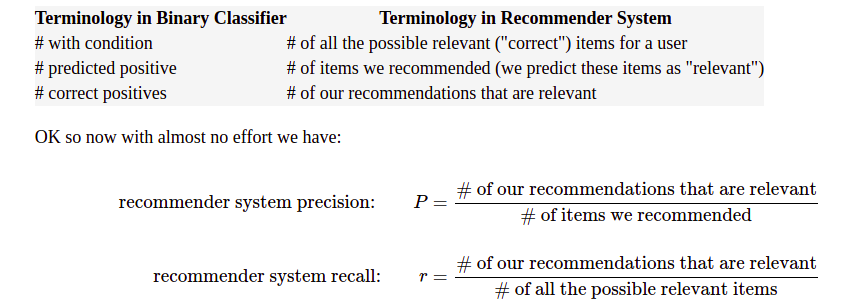

Let’s understand the definitions of recall@k and precision@k, assume we are providing 5 recommendations in this order — 1 0 1 0 1, where 1 represents relevant and 0 irrelevant. So the precision@k at different values of k will be precision@3 is 2/3, precision@4 is 2/4, and precision@5 is 3/5. The recall@k would be, recall@3 is 2/3, recall@4 is 2/3, and recall@5 is 3/3.


In [16]:
def get_favorite_movies(user_id, ratings_df):
    favorites = ratings_df[(ratings_df['userId'] == user_id) & (ratings_df['rating'] >= 3.5)].sort_values(by='rating', ascending=False)['movieId']
    return set(favorites if type(favorites) == pd.Series else [favorites])

In [17]:
class ModelEvaluator:
    def __init__(self, training_data, testing_data, threshold=3.5):
        self.training_data = training_data
        self.testing_data = testing_data
        self.threshold = threshold

    def evaluate_model_for_user(self, model, user_id):
        #Getting the items in test set
        favorites_in_test = get_favorite_movies(user_id, self.testing_data)
#         print("favorites_in_test : ",favorites_in_test)
        #Getting a ranked recommendation list from a model for a given user (movieId, predicted_rating)
        person_recs_df = model.recommend_items(user_id, 
                                               items_to_ignore=get_favorite_movies(user_id, self.training_data))
        #print("person_recs_df : ",person_recs_df)
        
        # get only movies with predicated rating >= 3.5
        person_recs_df = person_recs_df[person_recs_df['predicted_rating'] >= self.threshold].sort_values(by='predicted_rating', ascending=False)
        #print("person_recs_df : ",person_recs_df)
        true_relevent = person_recs_df[person_recs_df['movieId'].isin(favorites_in_test)].shape[0]
        
        top_5_recommended = person_recs_df.head(5)
        #print("top_5_recommended : ",top_5_recommended)
        top_10_recommended = person_recs_df.head(10)
        #print("top_10_recommended : ",top_10_recommended)
        
        # Number of relevant and recommended items in top k
        hits_at_5_count = top_5_recommended[top_5_recommended['movieId'].isin(favorites_in_test)].shape[0]
        hits_at_10_count = top_10_recommended[top_10_recommended['movieId'].isin(favorites_in_test)].shape[0]
        
        precision_at_5 = hits_at_5_count / top_5_recommended.shape[0] if top_5_recommended.shape[0] != 0 else 1
        recall_at_5 = hits_at_5_count / true_relevent if true_relevent != 0 else 1

        precision_at_10 = hits_at_10_count / top_10_recommended.shape[0] if top_10_recommended.shape[0] != 0 else 1
        recall_at_10 = hits_at_10_count / true_relevent if true_relevent != 0 else 1

        person_metrics = {'hits@5_count':hits_at_5_count, 
                        'hits@10_count':hits_at_10_count,
                        'recommended@5_count':top_5_recommended.shape[0], 
                        'recommended@10_count':top_10_recommended.shape[0],  
                        'relevents': true_relevent,
                        'recall@5': recall_at_5,
                        'recall@10': recall_at_10,
                        'precision@5': precision_at_5,
                        'precision@10': precision_at_10}
        return person_metrics


    def evaluate_model(self, model):
        #print('Running evaluation for users')
        users_metrics = []
        users_ids = list(set(self.testing_data['userId'].values))
        for idx, user_id in enumerate(users_ids):
            metrics = self.evaluate_model_for_user(model, user_id)  
            metrics['user_id'] = user_id
            users_metrics.append(metrics)
            #print('%d users processed' % idx)

        detailed_results_df = pd.DataFrame(users_metrics).sort_values('hits@5_count', ascending=False)

        global_recall_at_5 = detailed_results_df['hits@5_count'].sum() / float(detailed_results_df['relevents'].sum())
        global_recall_at_10 = detailed_results_df['hits@10_count'].sum() / float(detailed_results_df['relevents'].sum())

        global_precision_at_5 = detailed_results_df['hits@5_count'].sum() / float(detailed_results_df['recommended@5_count'].sum())
        global_precision_at_10 = detailed_results_df['hits@10_count'].sum() / float(detailed_results_df['recommended@10_count'].sum())

        global_metrics = {'modelName': model.get_model_name(),
                        'recall@5': global_recall_at_5,
                        'recall@10': global_recall_at_10,
                        'precision@5': global_precision_at_5,
                        'precision@10': global_precision_at_10}    
        return global_metrics, detailed_results_df
    
model_evaluator = ModelEvaluator(training_data, testing_data)              

# Popularity Recommender
A common (and usually hard-to-beat) baseline approach is the Popularity model. This model is not actually personalized - it simply recommends to a user the most popular items that the user has not previously consumed. As the popularity accounts for the "wisdom of the crowds", it usually provides good recommendations, generally interesting for most people.

However, using a rating as a metric has a few caveats:

For one, it does not take into consideration the popularity of a movie. Therefore, a movie with a rating of 9 from 10 voters will be considered 'better' than a movie with a rating of 8.9 from 10,000 voters.

For example, imagine you want to order Chinese food, you have a couple of options, one restaurant has a 5-star rating by only 5 people while the other restaurant has 4.5 ratings by 1000 people. Which restaurant would you prefer? The second one, right?

aking these shortcomings into consideration, you must come up with a weighted rating that takes into account the average rating and the number of votes it has accumulated.

*(v/(v+m) * R) + (m/(m+v) * C)*

In the above equation,

- v is the number of ratings for the movie;

- m is the minimum rating required to be listed in the chart;

- R is the average rating of the movie;

- C is the mean ratings across the whole movies.

In [18]:
ratings.head()

,userId,movieId,rating,timestamp
0,1,1,4.0,964982703
1,1,3,4.0,964981247
2,1,6,4.0,964982224
3,1,47,5.0,964983815
4,1,50,5.0,964982931


In [19]:
ratings.shape

(100836, 4)

In [20]:
populartiy = ratings.groupby('movieId').agg({'rating': ['mean', 'count']}).reset_index()
populartiy.columns = ['movieId', 'ratings_mean', 'ratings_count']
print(populartiy.shape)
populartiy.sort_values(by='ratings_mean', ascending=False).head(10)

(9724, 3)


,movieId,ratings_mean,ratings_count
7638,88448,5.0,1
8089,100556,5.0,1
9065,143031,5.0,1
9076,143511,5.0,1
9078,143559,5.0,1
4245,6201,5.0,1
8136,102217,5.0,1
8130,102084,5.0,1
4240,6192,5.0,1
9104,145994,5.0,1


In [21]:
populartiy.tail(20)

,movieId,ratings_mean,ratings_count
9704,189547,1.0,1
9705,189713,2.5,1
9706,190183,3.5,1
9707,190207,1.5,1
9708,190209,4.0,1
9709,190213,1.0,1
9710,190215,1.5,1
9711,190219,1.0,1
9712,190221,1.0,1
9713,191005,4.5,1


In [22]:
class PopularityRecommender:
    MODEL_NAME = 'Popularity'
    def __init__(self, popularities_df):
        self.popularities_df = popularities_df
      
    def get_model_name(self):
        return self.MODEL_NAME

    def weighted_rating(self, x, m, C):
        v = x['ratings_count']
        R = x['ratings_mean']
        # Calculation based on the IMDB formula
        return (v/(v+m) * R) + (m/(m+v) * C)

    def recommend_items(self, user_id, items_to_ignore=[], topn=10, verbose=False):
        C = self.popularities_df['ratings_mean'].mean()

        self.popularities_df['predicted_rating'] = self.popularities_df.apply(lambda x: self.weighted_rating(x, 3.5, C), axis=1)

        recommendations_df = self.popularities_df[~self.popularities_df['movieId'].isin(items_to_ignore)].sort_values('predicted_rating', ascending = False).head(topn)

        return recommendations_df
    
popularity_model = PopularityRecommender(populartiy)

In [ ]:
print('Evaluating Popularity recommendation model...')
pop_global_metrics, pop_detailed_results_df = model_evaluator.evaluate_model(popularity_model)
print('\nGlobal metrics:\n%s' % pop_global_metrics)
pop_detailed_results_df.head(10)

Notice that all recommendations are the same for all users:

In [ ]:
popularity_model.recommend_items(5)

In [ ]:
popularity_model.recommend_items(10)

Let's see these popular movies titles:

In [ ]:
ids = popularity_model.recommend_items(10)['movieId'].values
movies[movies['movieId'].isin(ids)]['title'].values

Now it's your turn, try to sort popular items by novelty (newest) with score in the class:

In [ ]:
####################################
#############YOUR CODE##############
####################################

# Content-Based Filtering model

Content-based filtering approaches leverage description or attributes from items the user has interacted to recommend similar items. It depends only on the user previous choices, making this method robust to avoid the cold-start problem. For textual items, like articles, news and books, it is simple to use the raw text to build item profiles and user profiles using TD-IDF.

## Use Genres as content


In [23]:
# get all unique genres
genres = list(set([x for genres in movies['genres'].values for x in genres.split('|')]))
genres

['Children',
 'Mystery',
 'Film-Noir',
 'Fantasy',
 'Western',
 'Drama',
 'Crime',
 'Sci-Fi',
 'Comedy',
 'Musical',
 'Documentary',
 'Horror',
 'Action',
 'IMAX',
 'Thriller',
 'Animation',
 'Romance',
 '(no genres listed)',
 'War',
 'Adventure']

In [24]:
expanded_movies_df = movies.copy()
for g in genres:
    expanded_movies_df[g] = [0 if not g in genres.split('|') else 1 for genres in movies['genres'].values]

# print(expanded_movies_df.shape[0])
# # drop all movies without genres
# expanded_movies_df = expanded_movies_df[expanded_movies_df['(no genres listed)'] == 0]
# print('After dropping all movies with no genre ', expanded_movies_df.shape[0])
expanded_movies_df.head()

,movieId,title,genres,year,Children,Mystery,Film-Noir,Fantasy,Western,Drama,...,Documentary,Horror,Action,IMAX,Thriller,Animation,Romance,(no genres listed),War,Adventure
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1995,1,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,1
1,2,Jumanji (1995),Adventure|Children|Fantasy,1995,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
2,3,Grumpier Old Men (1995),Comedy|Romance,1995,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1995,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
4,5,Father of the Bride Part II (1995),Comedy,1995,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


To model the user profile, we take all the item profiles the user has interacted and average them. The average is weighted by user ratings.

In [25]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

def normalize(value, old_max, old_min, new_max=5.0, new_min=0.0):
    old_range = (old_max - old_min)  
    new_range = (new_max - new_min)  
    return (((value - old_min) * new_range) / old_range) + new_min

In [26]:
class ContentBasedRecommender:
    
    MODEL_NAME = 'Content-Based'
    
    def __init__(self, items_df, training_data, testing_data):
        self.items_df = items_df
        self.features_names = items_df.columns[4:]
        self.training_data = training_data
        self.testing_data = testing_data
        
    def get_model_name(self):
        return self.MODEL_NAME

    def get_item_profile(self, item_id):
        item_profile = self.items_df[self.items_df['movieId'] == item_id][self.features_names]
        return item_profile

    def get_items_profiles(self, ids):
        item_profiles = self.items_df[self.items_df['movieId'].isin(ids)][self.features_names].values
        return item_profiles

    def build_users_profile(self, user_id):
        user_df = self.training_data[self.training_data['userId'] == user_id]
        user_items_profiles = self.get_items_profiles(user_df['movieId'].values)
        
        user_items_ratings = np.array(user_df['rating'].values).reshape(-1,1)
        user_profile = np.sum(np.multiply(user_items_profiles, user_items_ratings), axis=0) / np.sum(user_items_ratings)
        return user_profile

    def get_similar_items_to_user_profile(self, user_id, topn=1000):
        user_profile = self.build_users_profile(user_id).reshape(1, -1)
        #Computes the cosine similarity between the user profile and all item profiles
        cosine_similarities = cosine_similarity(user_profile, self.items_df[self.features_names].values)
        #Gets the top similar items
        similar_indices = cosine_similarities.argsort().flatten()[-topn:]
        #Sort the similar items by similarity
        similar_items = sorted([(self.items_df.loc[i, 'movieId'], cosine_similarities[0,i]) for i in similar_indices], key=lambda x: -x[1])
        return similar_items
        
    def recommend_items(self, user_id, items_to_ignore=[], topn=10):
        similar_items = self.get_similar_items_to_user_profile(user_id)
        similar_items_filtered = list(filter(lambda x: x[0] not in items_to_ignore, similar_items))
        
        recommendations_df = pd.DataFrame(similar_items_filtered, columns=['movieId', 'predicted_rating']) \
                                    .head(topn)

        recommendations_df['predicted_rating'] = recommendations_df['predicted_rating'].apply(lambda x: normalize(x, 1.0, 0.0))
        return recommendations_df
    
content_based_recommender_model = ContentBasedRecommender(expanded_movies_df, training_data, testing_data)

In [28]:
print('Evaluating Content-Based Filtering model...')
cb_global_metrics, cb_detailed_results_df = model_evaluator.evaluate_model(content_based_recommender_model)
print('\nGlobal metrics:\n%s' % cb_global_metrics)
cb_detailed_results_df.head(10)

Evaluating Content-Based Filtering model...

Global metrics:
{'modelName': 'Content-Based', 'recall@5': 0.4, 'recall@10': 1.0, 'precision@5': 0.004195804195804196, 'precision@10': 0.005244755244755245}


,hits@5_count,hits@10_count,recommended@5_count,recommended@10_count,relevents,recall@5,recall@10,precision@5,precision@10,user_id
571,1,1,5,10,1,1.000000,1.0,0.2,0.1,610
15,1,1,5,10,1,1.000000,1.0,0.2,0.1,17
100,1,1,5,10,1,1.000000,1.0,0.2,0.1,103
259,1,1,5,10,1,1.000000,1.0,0.2,0.1,274
119,1,1,5,10,1,1.000000,1.0,0.2,0.1,123
237,1,1,5,10,1,1.000000,1.0,0.2,0.1,252
406,1,1,5,10,1,1.000000,1.0,0.2,0.1,432
127,1,1,5,10,1,1.000000,1.0,0.2,0.1,131
233,1,3,5,10,3,0.333333,1.0,0.2,0.3,248
232,1,1,5,10,1,1.000000,1.0,0.2,0.1,247


## Use tags as content

The quality of your recommender would be increased with the usage of better metadata and by capturing more of the finer details. That is precisely what you are going to do in this section by using movies tags (keywords, cast, genres) as content.

We will simply join all the required tags for a movie by a space. This is the final preprocessing step, and the output of this function will be fed into the word vector model.

but note that:
- Removing the spaces between words is an important preprocessing step. It is done so that your vectorizer doesn't count the Johnny of "Johnny Depp" and "Johnny Galecki" as the same. After this processing step, the aforementioned actors will be represented as "johnnydepp" and "johnnygalecki" and will be distinct to your vectorizer.
- Need to convert all letters to small.

In [27]:
tags = pd.read_csv('ml-latest-small/tags.csv', header=0)
tags.head(10)

,userId,movieId,tag,timestamp
0,2,60756,funny,1445714994
1,2,60756,Highly quotable,1445714996
2,2,60756,will ferrell,1445714992
3,2,89774,Boxing story,1445715207
4,2,89774,MMA,1445715200
5,2,89774,Tom Hardy,1445715205
6,2,106782,drugs,1445715054
7,2,106782,Leonardo DiCaprio,1445715051
8,2,106782,Martin Scorsese,1445715056
9,7,48516,way too long,1169687325


In [28]:
def check_name(x):
    words = x.split()
    return all(x[0].isupper() and x[1].islower() for x in words if len(x) > 1)

def clean(x):
    if x.istitle() or check_name(x):
        return x.replace(" ", "").lower()
    else:
        return x.lower().strip()

In [29]:
tags['tag'] = tags['tag'].apply(lambda x: clean(x))
tags.head(10)

,userId,movieId,tag,timestamp
0,2,60756,funny,1445714994
1,2,60756,highly quotable,1445714996
2,2,60756,will ferrell,1445714992
3,2,89774,boxing story,1445715207
4,2,89774,mma,1445715200
5,2,89774,tomhardy,1445715205
6,2,106782,drugs,1445715054
7,2,106782,leonardodicaprio,1445715051
8,2,106782,martinscorsese,1445715056
9,7,48516,way too long,1169687325


In [30]:
expended_movies_df = movies.copy()

movies_ids = expended_movies_df['movieId'].values.tolist()
expended_movies_df['soup'] = [" ".join(tags[tags['movieId'] == id]['tag'].values.tolist()) for id in movies_ids]

In [31]:
expended_movies_df.head(10)

,movieId,title,genres,year,soup
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1995,pixar pixar fun
1,2,Jumanji (1995),Adventure|Children|Fantasy,1995,fantasy magic board game robinwilliams game
2,3,Grumpier Old Men (1995),Comedy|Romance,1995,moldy old
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1995,
4,5,Father of the Bride Part II (1995),Comedy,1995,pregnancy remake
5,6,Heat (1995),Action|Crime|Thriller,1995,
6,7,Sabrina (1995),Comedy|Romance,1995,remake
7,8,Tom and Huck (1995),Adventure|Children,1995,
8,9,Sudden Death (1995),Action,1995,
9,10,GoldenEye (1995),Action|Adventure|Thriller,1995,


In [32]:
expended_movies_df.loc[8, 'soup']

''

In [33]:
expended_movies_df[expended_movies_df['soup'] != ''].shape

(1572, 5)

In [34]:
def fill_empty_tag(x):
    if x['soup'] == '':
        return " ".join(x['genres'].lower().split('|'))
    return x['soup']

expended_movies_df['soup'] = expended_movies_df.apply(lambda x: fill_empty_tag(x), axis=1)
expended_movies_df.head(10)

,movieId,title,genres,year,soup
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1995,pixar pixar fun
1,2,Jumanji (1995),Adventure|Children|Fantasy,1995,fantasy magic board game robinwilliams game
2,3,Grumpier Old Men (1995),Comedy|Romance,1995,moldy old
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1995,comedy drama romance
4,5,Father of the Bride Part II (1995),Comedy,1995,pregnancy remake
5,6,Heat (1995),Action|Crime|Thriller,1995,action crime thriller
6,7,Sabrina (1995),Comedy|Romance,1995,remake
7,8,Tom and Huck (1995),Adventure|Children,1995,adventure children
8,9,Sudden Death (1995),Action,1995,action
9,10,GoldenEye (1995),Action|Adventure|Thriller,1995,action adventure thriller


We will use the CountVectorizer() instead of TF-IDF. This is because you do not want to down-weight the actor/director's presence if he or she has acted or directed in relatively more movies. It doesn't make much intuitive sense to down-weight them in this context.

The major difference between CountVectorizer() and TF-IDF is the inverse document frequency (IDF) component which is present in later and not in the former.

In [35]:
from sklearn.feature_extraction.text import CountVectorizer

count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(expended_movies_df['soup'])
count_matrix.shape

(9742, 1582)

In [41]:
count_matrix[5].toarray()

array([[0, 0, 0, ..., 0, 0, 0]], dtype=int64)

Now we will edit the previous class to get profiles from count matrix.

In [44]:
class ContentBasedRecommender:
    
    MODEL_NAME = 'Content-Based'
    
    def __init__(self, items_ids, items_matrix, training_data, testing_data):
        self.items_ids = items_ids
        self.items_matrix = items_matrix
        self.training_data = training_data
        self.testing_data = testing_data
        
    def get_model_name(self):
        return self.MODEL_NAME

    def get_item_profile(self, item_id):
        idx = self.items_ids.index(item_id)
        print("idx : ",idx)
        print("xxx : ",sum(self.items_matrix[idx].toarray().reshape(-1)))
        return self.items_matrix[idx].toarray().reshape(-1)

    def get_items_profiles(self, ids):
        items_profiles = np.array([self.get_item_profile(x) for x in ids])
        return items_profiles

    def build_users_profile(self, user_id):
        user_df = self.training_data[self.training_data['userId'] == user_id]
        user_items_profiles = self.get_items_profiles(user_df['movieId'].values)
        
        user_items_ratings = np.array(user_df['rating'].values).reshape(-1,1)
        user_profile = np.sum(np.multiply(user_items_profiles, user_items_ratings), axis=0) / np.sum(user_items_ratings)
        return user_profile

    def get_similar_items_to_user_profile(self, user_id, topn=1000):
        user_profile = self.build_users_profile(user_id).reshape(1, -1)
        #Computes the cosine similarity between the user profile and all item profiles
        cosine_similarities = cosine_similarity(user_profile, self.items_matrix.toarray())
        #Gets the top similar items
        similar_indices = cosine_similarities.argsort().flatten()[-topn:]
        print(similar_indices)
#         print(len(similar_indices))
#         print(len(self.items_ids))
        #Sort the similar items by similarity
        print([(self.items_ids[i], cosine_similarities[0,i]) for i in similar_indices])
        similar_items = sorted([(self.items_ids[i], cosine_similarities[0,i]) for i in similar_indices], key=lambda x: -x[1])
#         print(similar_items)
        return similar_items
        
    def recommend_items(self, user_id, items_to_ignore=[], topn=10):
        similar_items = self.get_similar_items_to_user_profile(user_id)
        similar_items_filtered = list(filter(lambda x: x[0] not in items_to_ignore, similar_items))
        
        recommendations_df = pd.DataFrame(similar_items_filtered, columns=['movieId', 'predicted_rating']) \
                                    .head(topn)

        recommendations_df['predicted_rating'] = recommendations_df['predicted_rating'].apply(lambda x: normalize(x, 1.0, 0.0))
        return recommendations_df
    
content_based_recommender_model = ContentBasedRecommender(expended_movies_df['movieId'].values.tolist(), count_matrix, training_data, testing_data)

In [45]:
print('Evaluating Content-Based Filtering model number 2...')
cb_global_metrics, cb_detailed_results_df = model_evaluator.evaluate_model(content_based_recommender_model)
print('\nGlobal metrics:\n%s' % cb_global_metrics)
cb_detailed_results_df.head(10)

Evaluating Content-Based Filtering model number 2...
idx :  0
xxx :  3
idx :  2
xxx :  2
idx :  5
xxx :  3
idx :  46
xxx :  7
idx :  62
xxx :  4
idx :  89
xxx :  4
idx :  97
xxx :  14
idx :  124
xxx :  4
idx :  130
xxx :  2
idx :  136
xxx :  3
idx :  184
xxx :  5
idx :  190
xxx :  7
idx :  201
xxx :  2
idx :  224
xxx :  46
idx :  257
xxx :  267
idx :  275
xxx :  2
idx :  291
xxx :  1
idx :  307
xxx :  1
idx :  314
xxx :  14
idx :  320
xxx :  3
idx :  325
xxx :  4
idx :  367
xxx :  2
idx :  384
xxx :  1
idx :  398
xxx :  2
idx :  418
xxx :  1
idx :  436
xxx :  5
idx :  461
xxx :  10
idx :  476
xxx :  2
idx :  484
xxx :  1
idx :  485
xxx :  3
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  513
xxx :  1
idx :  520
xxx :  8
idx :  546
xxx :  2
idx :  551
xxx :  5
idx :  559
xxx :  1
idx :  592
xxx :  3
idx :  594
xxx :  1
idx :  632
xxx :  2
idx :  701
xxx :  2
idx :  705
xxx :  1
idx :  720
xxx :  1
idx :  723
xxx :  1
idx :  734
xxx :  1
idx :  767
xxx :  3
idx :  781


[2703 3467 3394 9637 9048 9635 3710 9716 9632 9109 9631 9627 3735 3550
 3469 4830 3753 4828 9619 2699 9101 3463 9099 3577 3456   58 3685 9704
 4868 3688 2696 3459 4823   61 9646 2698 2625 3696 3397 3395 4982 9097
  373 4858 3468  219 9158 4372 9458 9315  265 3232 9455 9319 4055 4057
 9449 4357 9459  171 3021 3214 9441 4091 4325 4094 4098 4322 3185 9333
 4320 3014 3040  269 4034 9283 2950 9482 2960 4421  158 9289 4419 9477
 3256 9475 9311 2968 2988 2989 4003 4382 2995 9304 3246 3241  271 3237
 4376 4404 4307 3046 9431 9408 4254  237 4253  236 4239 3159 3146 4234
 3096 4222 9365 4181 4219 9397 4185 9383 3140 4216 3136 3135 3111 9386
 3120  230 4256 9409 9412 3047 4113 4301 3053 4287 3179 9349 4280 3060
 3175 4130 3066 9353 3067 9356 3070 9419 3171  194 3170 3074 3163 9362
  240  200 9275 4692 9490 4455 2855 4593 4592 3846 4588 4585  116 9196
 2863 9199 3327 2854 9201 9555  117 9552 3858 3324 9202 3862 3863 2877
 2880 2881 3132 4555  113 2852 3341 9576 9161 9575 9163 9165 3825 3337
 2813 

[7365 7211 3585 2126 2823 9693 8685 3661 6221 6360 8440   40 3631 8333
 7679 1266 6663 7570  142 4527  403 4103 6013 6907 5021 6518 5057  801
 1367 7230 8336 1208 8551 5845 2529 1611 9154  574 9331  636 6374 4502
 8827 8478 8477 6647 8781 7765 2986 7718 3759  606 3231 5716 3361 1804
 5103 2636 8434 9035 8565 2451 4927 4843 6570  960 4985 6061 8597 3085
 1900 3172 7676 1747  626 5953 1100 1803 5721 2130 3901 6034 1828 6475
 7683 6429 6113 4548 7074 2354 8576 7014 4298 2661 6858 4613 4083 6735
 9638 9435 2713 2252  431 1053 1292 4968 6199 2990 9246 6886 2220 2700
 7063 2710 2218    9 9720 8439 4096 2219 7394 2254 2253  378   84 4966
 1171 1802 2972  754  479 1145 1778 2327 2256 3741 6346 6811 1174 6849
 3799 6668   62 7221 6251 4908 5339 6324 7051 6793  916 7336 1237 4781
 7990 6508 7244 5392 5797 6956 6478 7913 4945 4918 1768 5643 6494 6290
 7398 7407 6901 4477 5922 6636 8474 8115 7229 6378 6387 9105 9093 7832
 5276 6996 5819 5187 5763 4105 5556 7175 1972  563 5655 5629  622 7099
 7384 

idx :  886
xxx :  1
idx :  891
xxx :  2
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  901
xxx :  3
idx :  905
xxx :  12
idx :  914
xxx :  1
idx :  920
xxx :  11
idx :  926
xxx :  2
idx :  949
xxx :  1
idx :  958
xxx :  1
idx :  964
xxx :  3
idx :  965
xxx :  1
idx :  978
xxx :  2
idx :  981
xxx :  1
idx :  982
xxx :  1
idx :  987
xxx :  5
idx :  990
xxx :  2
idx :  1002
xxx :  1
idx :  1071
xxx :  4
idx :  1113
xxx :  1
idx :  1124
xxx :  1
idx :  1146
xxx :  3
idx :  1154
xxx :  3
idx :  1199
xxx :  4
idx :  1218
xxx :  1
idx :  1232
xxx :  2
idx :  1284
xxx :  3
idx :  1290
xxx :  2
idx :  1298
xxx :  43
idx :  1299
xxx :  2
idx :  1348
xxx :  2
idx :  1374
xxx :  3
idx :  1376
xxx :  3
idx :  1381
xxx :  1
idx :  1384
xxx :  3
idx :  1390
xxx :  7
idx :  1396
xxx :  2
idx :  1404
xxx :  5
idx :  1424
xxx :  1
idx :  1443
xxx :  1
idx :  1444
xxx :  3
idx :  1445
xxx :  2
idx :  1541
xxx :  2
idx :  1543
xxx :  1
idx :  1571
xxx :  1
idx :  1603
xxx :  3
idx :  1608
xxx :  2
idx : 

[6730 2813 6719 6712 5638 2824 2829 2830 6692 6688 2847 2850 2852 6701
 2699 6763 3685 5599 6853 6840 6837 2717 6831 6830 3669 6828 2732 2750
 2751 2752 2753 6788 6776 3688 2854 2490 7113 2271 7347 7345 3825 2284
 7326 3811 7356 2294 7314 2296 5435 3802 2300 7299 2307 2295 7294 7373
 7385 2155 3906 3903 2175 7453 2189 5344 5929 5362 7431 3863 3862 3858
 5403 3846 5409 3871 5547 3795 7284 2431 2435 3753 2440 7152 2441 5526
 2430 5529 7130 2463 2469 2479 5544 7115 2485 3735 7291 2429 2395 3794
 2322 7270 7267 2338 5467 3784 2427 2358 7241 3765 7231 2371 3763 7217
 7201 3779 2855 5649 6673 6245 6241 3214 6223 6222 6217 3232 6249 3237
 3241 6202 3463 3246 6183 6181 5859 5851 5860 3467 3185 3140 6317 3146
 6310 6298 3159 3163 3468 6283 3171 6278 3175 5841 6273 3179 3469 3170
 3136 3459 3456 3373 3377 5897 5900 3426 3425 3422 3432 3394 3395 5967
 3397 5961 5915 5942 5933 5971 3256 3359 6042 5866 3450 6111 6108 3292
 6093 3439 3341 3313 3435 3324 3327 3331 3332 3333 3337 3318 3135 3132
 6343 

xxx :  3
idx :  113
xxx :  1
idx :  115
xxx :  1
idx :  116
xxx :  1
idx :  118
xxx :  5
idx :  119
xxx :  2
idx :  123
xxx :  3
idx :  124
xxx :  4
idx :  126
xxx :  2
idx :  131
xxx :  2
idx :  132
xxx :  3
idx :  133
xxx :  1
idx :  134
xxx :  1
idx :  136
xxx :  3
idx :  138
xxx :  3
idx :  140
xxx :  3
idx :  142
xxx :  4
idx :  143
xxx :  2
idx :  146
xxx :  1
idx :  149
xxx :  1
idx :  151
xxx :  2
idx :  152
xxx :  2
idx :  153
xxx :  2
idx :  156
xxx :  1
idx :  157
xxx :  2
idx :  160
xxx :  2
idx :  162
xxx :  2
idx :  165
xxx :  3
idx :  166
xxx :  3
idx :  169
xxx :  2
idx :  172
xxx :  1
idx :  173
xxx :  2
idx :  175
xxx :  2
idx :  176
xxx :  4
idx :  177
xxx :  1
idx :  178
xxx :  1
idx :  180
xxx :  4
idx :  184
xxx :  5
idx :  185
xxx :  2
idx :  186
xxx :  2
idx :  187
xxx :  1
idx :  189
xxx :  1
idx :  191
xxx :  3
idx :  192
xxx :  2
idx :  196
xxx :  1
idx :  200
xxx :  1
idx :  202
xxx :  3
idx :  203
xxx :  3
idx :  205
xxx :  4
idx :  206
xxx :  1
idx :  209


idx :  3002
xxx :  2
idx :  3138
xxx :  7
idx :  3157
xxx :  1
idx :  3194
xxx :  2
idx :  3197
xxx :  4
idx :  3234
xxx :  7
idx :  3414
xxx :  5
idx :  3446
xxx :  3
idx :  3540
xxx :  3
idx :  3559
xxx :  2
idx :  3568
xxx :  5
idx :  3614
xxx :  1
idx :  3638
xxx :  8
idx :  3640
xxx :  1
idx :  3745
xxx :  4
idx :  3819
xxx :  1
idx :  3832
xxx :  5
idx :  3873
xxx :  1
idx :  3890
xxx :  2
idx :  3915
xxx :  1
idx :  4076
xxx :  2
idx :  4137
xxx :  2
idx :  4159
xxx :  9
idx :  4161
xxx :  3
idx :  4334
xxx :  5
idx :  4351
xxx :  6
idx :  4422
xxx :  5
idx :  4427
xxx :  1
idx :  4608
xxx :  1
idx :  4639
xxx :  6
idx :  4795
xxx :  4
idx :  4800
xxx :  14
idx :  4802
xxx :  1
idx :  4940
xxx :  5
idx :  5132
xxx :  1
idx :  5160
xxx :  1
idx :  5166
xxx :  2
idx :  5171
xxx :  3
idx :  5222
xxx :  1
idx :  5260
xxx :  1
idx :  5269
xxx :  3
idx :  5270
xxx :  3
idx :  5301
xxx :  4
idx :  5305
xxx :  4
idx :  5310
xxx :  2
idx :  5330
xxx :  4
idx :  5333
xxx :  5
idx :  5342


[8181  526 9086 1280 1281 3887 6642 2148 3516 8441 5965 4978 4950 7170
 1368 9064 8407 8152 7151 7898 2442 7146 5002 7702 7900  462 4044 1159
 3882 4032 1613 6635 4043 5988 9718 3485 9425 6471 8007  967 2410 4882
 9104 4881 1725 4869 4930 1664 4933 9095 3162 3108 4378 8157 7145 8113
 5939 8468 4838 5085 4359 3545 2387 7419 8173 5095 6591 9152 4087 1388
 7330 2173 5925  887 9155 5920 1944 6038  502 8852 9014 7721 9045 7141
 6403 3417  492 9039 5959 1746  493  494 8452 7623 9030 7134 2167 9027
   74  496 3530 9446  978 9650 1754 9451 2515 9607 7860 1072 4682 6196
 6733  374 9249 5752 3974 8054 7949 7401 2059 3325 4671 2298 7239 8708
 8309 5584 1627 6977 6993 8074 6197 1075 5486 3310 7008 7377 5764 4515
 6214 4703 1262 5760 6976  164 7002 6206 5520 8744 3712 7235  129 2714
 1817 8293 4133 7009 2063 1840 6935 4167 8624 2643 9277 2081 6153 3690
 2615  750 6943 3436 2621  753 8059 1857 9734 4599 7843 2314 7846 2646
  143 3365 2601  150 7393  310 2681 2680 7830 6123 3684 2082 8317 5594
 2668 

[2969 2433 8401 2085 8064 7611 3428 3001 6866 7253 2602 2268 3006 6869
 3005 2367 3356 8158 2804 3551 2366 2805 8073 8391 7412 2458 2370 7165
 3739 7739 2065 2838 6835 2946 8420 2834 2064 8139 3748 2380 7634 2439
 2060 7222 7735 2258 3203 2832 3722 2373 2961 2241 7624 8409 3370 2833
 2796 3191 2952 6842 2075 3199 3737 6844 8900 5317 7026 9341 4263 8851
 9342 4257 1347 8111 6543  621  274 6889 9188 6861 1152 6004 1137 8582
 2058 6820 2942 9133 1897 1911 6684 1066 5343 7799 4058 6320 7542 3616
 8679 6446 4787 5679 7070 1225 7458  800 8008 3512  870 5842 6257 7176
 7044 6234 7191 6263 9278  919 2443 7236 5895 5968 4713 4720 5818 1192
  758 4752 4296 2462 6396 5468 8793 8759 9594 5703 7783 3578 5242 1915
 4249 4242 5491 2814 6997 7895 2943 2165 6864 7006 2788   70 6746 2744
 5776 5088 5305 6951 9696 8797 6914 6359 9503 7271 4370 6546 9550 4493
 9522 3414 7182 6458 3592 5914 3484 6482 4344 6192 5506 3306 3182 3921
 7711 1415 2385 3413 6668 7662 4286  253 7185 3664 6656 6695 4132 2285
 5799 

idx :  5310
xxx :  2
idx :  5332
xxx :  2
idx :  5374
xxx :  5
idx :  5380
xxx :  3
idx :  5381
xxx :  1
idx :  5734
xxx :  1
idx :  5781
xxx :  2
idx :  5794
xxx :  2
idx :  5879
xxx :  3
idx :  5911
xxx :  4
idx :  5917
xxx :  3
idx :  6058
xxx :  2
idx :  6063
xxx :  1
idx :  6073
xxx :  3
idx :  6258
xxx :  1
idx :  6346
xxx :  3
idx :  6352
xxx :  2
idx :  6433
xxx :  4
idx :  6439
xxx :  2
idx :  6534
xxx :  6
idx :  6638
xxx :  7
idx :  6658
xxx :  2
idx :  6682
xxx :  2
idx :  6710
xxx :  4
idx :  6744
xxx :  2
idx :  6748
xxx :  2
idx :  6787
xxx :  3
idx :  6814
xxx :  1
idx :  6830
xxx :  1
idx :  6886
xxx :  3
idx :  6905
xxx :  9
idx :  6929
xxx :  1
idx :  6968
xxx :  3
idx :  7039
xxx :  15
idx :  7056
xxx :  2
idx :  7078
xxx :  5
idx :  7087
xxx :  3
idx :  7091
xxx :  3
idx :  7156
xxx :  2
idx :  7171
xxx :  2
idx :  7183
xxx :  1
idx :  7188
xxx :  5
idx :  7204
xxx :  1
idx :  7207
xxx :  5
idx :  7212
xxx :  28
idx :  7214
xxx :  4
idx :  7256
xxx :  2
idx :  7331

idx :  1217
xxx :  3
idx :  1272
xxx :  2
idx :  1276
xxx :  2
idx :  1284
xxx :  3
idx :  1291
xxx :  2
idx :  1322
xxx :  3
idx :  1353
xxx :  1
idx :  1373
xxx :  4
idx :  1398
xxx :  1
idx :  1399
xxx :  4
idx :  1404
xxx :  5
idx :  1477
xxx :  4
idx :  1502
xxx :  2
idx :  1503
xxx :  3
[8164 5617 1132 1819 7771 7835 8410 7357 2627 6327  185 6808 7776 9345
 5602 7796 1726 3062 3948 6056 8609  543 2010 6798 7696 3826 5011 9215
 5383 4545 4313 7348 9090  380 7715 9694 3659  532 5131 8125 2848  761
 6967 6461 2948 8387 9355 6124 6621 6082 9113 7751 3852 4247 8284  278
 9501 1620 8929 8027 3927 3069 6754 2861 7052 8691 5259 9731 1158 1367
 5716 2529 6647 1208  606 3361 7230 9331 8477 9154 3231 1611 4502 7718
 2986 8478 6374 3759  574  801 5057  636 7765 8827 8781 5845 8336 8551
 4066 2164 5852 8490 2163 9602 7310 9313 8871 5463 5958 4689 4036 2014
 3909 4929 4552 1154 2069 9106 6458 2903 5167 9069 8977 6305 6884 3604
 8138 2055 7040 3155 7293 7129 4523  791 5673 5613 7503 5808   99 6

[6155 6165 7848 7931 2475 8612 6193 1324 4668 3248 4637 7285 4621 1295
 2444 4680 6305 8559 6045 5788 3028 7092 6490 8505 4914 4910 8509 5825
 4895 8018 3495 3445 6450 6428 8532 8545 6424 4336 7986 3423 6338 5995
 5370 6839 6918 3933 7205 7188 9152 9045  502 6372 3108 9277  526  528
 6403 2548 7151  810  538 7146 7145  542  547 9064  496  494 6318 2515
 7283 6214 6220 9027 9030 2476 2483 6271 2491 3181 7239 6291 7235 9039
 9305  492 2511  493 3162 6471 7141 7134 9249  750 7009 7008 7002 2680
 6661 2681 6993 6977  609 6976 2714 6943 6733 2837 6935 6206 6868 9159
 2910 2911 6642  753 2577 2601 6510 2615 2621 9086 6533 6544 2632 9155
 9095 2646 6576 6591 2663 9104 2667 2926 6635 2668 2643 1280 3417 6197
 4978 4167 5002  129 4133 4110  143 5085  150 5095 9614 4087 9607 5135
 5139  164 5150 4044 4043  173 4032 5181  186 3977 3974 3965 5231 5233
 5245 4950 5275 9650 9653 4599 9734 4565 4671 4682 9718 4515 4703 4718
 4452 4444 4440 4763 9698   64   67 4378   74 4359 4838 9680 4328 4324
 4319 

[2530 7617 8525 8312 8774 5878 5908 6586 1375 6089 8735 7029 6242 8651
 9411 7645 8849 5327 4834 2787 5244 7599 9193 4940 7260 2498 7736 1828
 5808  972 1620 6624 2262 6296 3769  970 8172  416 1702 4148 5844 7425
 8844 9723 4771 4266 6595  139 2238 1392 9510 4911 6154 5351 8616 7890
 8389 3263 8279 2362 8277 1952 5002  542 9104  526 5245 4882 5584 5233
 3530 3712 9451  547  998 5231 9014 5275  528 3545 3621  978 4881 3716
 4933 9086 8907  414  810 4032 9095 3715  410 4930 5426  538 4978  967
 3887 3818 9027 5095  492  879 3485 8954 3974 9155 4950 5150 9305 9039
 3977 9277 8970 9425 9152 5139  873 5135 4869 9045 5630 3813  374  462
  609 9159 3851  493 9249 3882  502 9064  750 5594 5181 5356 9030 3516
  496 8979 3556  753 3965 5329  494 4838 5520  887 9446 3684 4044 5085
 4043 5486 3690  310  391 1008 1445 7141  173 6471 2483 4167 7134 8372
 2491 2926 6510 2917 2911 8352 9680 2910  164 8309 4328 6591 8317 2515
 7959 4682 2511 6544 1885 7949 4671   74 6533 6576 1435 8407 2476 7880
 4703 

idx :  2696
xxx :  1
idx :  2808
xxx :  3
idx :  2945
xxx :  4
idx :  2982
xxx :  10
idx :  3002
xxx :  2
idx :  3006
xxx :  1
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3234
xxx :  7
idx :  3461
xxx :  4
idx :  3568
xxx :  5
idx :  3638
xxx :  8
idx :  3640
xxx :  1
idx :  3873
xxx :  1
idx :  4137
xxx :  2
idx :  4159
xxx :  9
idx :  4360
xxx :  3
idx :  4408
xxx :  2
idx :  4615
xxx :  3
idx :  4851
xxx :  8
idx :  4935
xxx :  1
idx :  5160
xxx :  1
idx :  5265
xxx :  5
idx :  5374
xxx :  5
idx :  5896
xxx :  3
idx :  6305
xxx :  3
idx :  6330
xxx :  6
idx :  6331
xxx :  3
idx :  6405
xxx :  6
idx :  6630
xxx :  14
idx :  6710
xxx :  4
idx :  6743
xxx :  4
idx :  6772
xxx :  8
idx :  6903
xxx :  5
idx :  6922
xxx :  2
idx :  7014
xxx :  5
idx :  7039
xxx :  15
idx :  7090
xxx :  3
idx :  7119
xxx :  4
idx :  7133
xxx :  4
idx :  7212
xxx :  28
idx :  7372
xxx :  36
idx :  7515
xxx :  3
idx :  7541
xxx :  4
idx :  7562
xxx :  6
idx :  7693
xxx :  10
idx :  7767
xxx :  1
idx : 

xxx :  2
idx :  1284
xxx :  3
idx :  1571
xxx :  1
idx :  1734
xxx :  7
idx :  1826
xxx :  3
idx :  1872
xxx :  2
idx :  1939
xxx :  9
idx :  1987
xxx :  1
idx :  2032
xxx :  1
idx :  2044
xxx :  1
idx :  2078
xxx :  12
idx :  2145
xxx :  2
idx :  2226
xxx :  75
idx :  2279
xxx :  2
idx :  2350
xxx :  1
idx :  2392
xxx :  1
idx :  2562
xxx :  1
idx :  2745
xxx :  1
idx :  2799
xxx :  3
idx :  2945
xxx :  4
idx :  2988
xxx :  1
idx :  2996
xxx :  3
idx :  3141
xxx :  17
idx :  3562
xxx :  38
idx :  3638
xxx :  8
idx :  4137
xxx :  2
idx :  4800
xxx :  14
idx :  4909
xxx :  42
idx :  5664
xxx :  4
idx :  5695
xxx :  8
idx :  6710
xxx :  4
idx :  6772
xxx :  8
idx :  7039
xxx :  15
idx :  7355
xxx :  6
idx :  7372
xxx :  36
idx :  7768
xxx :  11
[3014 6469 4280 6554 6559 4239 6578 4216 6692 6688 4219 6673 6672 3047
 4222 6452 6653 3046 3040 4234 6614 6608 1646 6594 6581 1624 5915 2884
 2881 5278 4750 2686 2358 2685 5258 5251 2371 4767 4772 5222 5218 5217
 2395 2676 4798 4802 2696 5186 528

idx :  3638
xxx :  8
idx :  4137
xxx :  2
idx :  4612
xxx :  3
idx :  4800
xxx :  14
idx :  4954
xxx :  2
idx :  5695
xxx :  8
idx :  5917
xxx :  3
idx :  6315
xxx :  13
idx :  6710
xxx :  4
idx :  6772
xxx :  8
idx :  6927
xxx :  1
idx :  7010
xxx :  6
idx :  7018
xxx :  15
idx :  7323
xxx :  2
idx :  7355
xxx :  6
idx :  7372
xxx :  36
idx :  7413
xxx :  4
idx :  7469
xxx :  1
idx :  7483
xxx :  5
[3552  662 3493 1946 3183 1780 1781 1782 1783 4203 3607 1784 1785 5880
 1849 7472 5762 8006 4913 1683 4899 4115 7304 3252 4711 4551 3810 4120
 4223 7228 9563 3541 3708 4721 4580 2777  607 8327 3695 6314 2707 1502
 2489 3995 4656 7638 3955 4855   56 5243 1440 8496 4669 7649 4051 3781
 7641 2697 7575 4476 3424 3971 4451 9268 4321 8320 5180 6669 2453 4060
 7442  180 1856 1318 3462 8434 1061 9035 2451 8565 1523 5317 9668 6429
 3376 3576 5636 3582 7496 5627 6723 9717 7865 3302 8361 3286 6059 4844
 9351 5190 1719 1902 3600 3522 6796 5614 6430 9117 4122 6877 6876 2026
 4314 8680 2003 2000 4630 459

xxx :  13
idx :  834
xxx :  1
idx :  863
xxx :  5
idx :  868
xxx :  1
idx :  896
xxx :  5
idx :  898
xxx :  13
idx :  905
xxx :  12
idx :  907
xxx :  1
idx :  908
xxx :  2
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  913
xxx :  4
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  920
xxx :  11
idx :  922
xxx :  3
idx :  923
xxx :  3
idx :  924
xxx :  1
idx :  928
xxx :  2
idx :  934
xxx :  1
idx :  939
xxx :  12
idx :  944
xxx :  1
idx :  945
xxx :  2
idx :  946
xxx :  2
idx :  951
xxx :  1
idx :  959
xxx :  9
idx :  969
xxx :  2
idx :  974
xxx :  3
idx :  975
xxx :  1
idx :  990
xxx :  2
idx :  1044
xxx :  1
idx :  1053
xxx :  3
idx :  1054
xxx :  3
idx :  1057
xxx :  1
idx :  1058
xxx :  4
idx :  1071
xxx :  4
idx :  1124
xxx :  1
idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx :  1164
xxx :  1
idx :  1209
xxx :  1
idx :  1218
xxx :  1
idx :  1224
xxx :  11
idx :  1243
xxx :  4
idx :  1261
xxx :  3
idx :  1267
xxx :  1
idx :  1284
xxx :  3
idx :  1291
xxx :  2
idx :  1295
xxx :  3
idx : 

idx :  328
xxx :  2
idx :  330
xxx :  3
idx :  332
xxx :  2
idx :  334
xxx :  1
idx :  335
xxx :  2
idx :  336
xxx :  4
idx :  337
xxx :  1
idx :  352
xxx :  2
idx :  355
xxx :  8
idx :  358
xxx :  1
idx :  364
xxx :  4
idx :  366
xxx :  1
idx :  367
xxx :  2
idx :  371
xxx :  4
idx :  376
xxx :  3
idx :  378
xxx :  3
idx :  379
xxx :  3
idx :  383
xxx :  1
idx :  385
xxx :  4
idx :  387
xxx :  1
idx :  391
xxx :  2
idx :  396
xxx :  3
idx :  398
xxx :  2
idx :  404
xxx :  3
idx :  406
xxx :  2
idx :  410
xxx :  2
idx :  412
xxx :  1
idx :  418
xxx :  1
idx :  422
xxx :  4
idx :  423
xxx :  1
idx :  427
xxx :  1
idx :  431
xxx :  3
idx :  434
xxx :  1
idx :  436
xxx :  5
idx :  447
xxx :  3
idx :  448
xxx :  2
idx :  455
xxx :  1
idx :  470
xxx :  1
idx :  472
xxx :  1
idx :  473
xxx :  1
idx :  474
xxx :  16
idx :  475
xxx :  3
idx :  476
xxx :  2
idx :  478
xxx :  7
idx :  483
xxx :  2
idx :  488
xxx :  5
idx :  497
xxx :  2
idx :  504
xxx :  1
idx :  505
xxx :  1
idx :  506
xxx :  1

idx :  2147
xxx :  1
idx :  2153
xxx :  3
idx :  2155
xxx :  1
idx :  2167
xxx :  2
idx :  2172
xxx :  2
idx :  2181
xxx :  2
idx :  2183
xxx :  3
idx :  2184
xxx :  3
idx :  2192
xxx :  1
idx :  2193
xxx :  5
idx :  2195
xxx :  1
idx :  2209
xxx :  3
idx :  2224
xxx :  4
idx :  2226
xxx :  75
idx :  2233
xxx :  2
idx :  2248
xxx :  6
idx :  2250
xxx :  3
idx :  2257
xxx :  2
idx :  2259
xxx :  3
idx :  2264
xxx :  1
idx :  2273
xxx :  1
idx :  2274
xxx :  1
idx :  2284
xxx :  1
idx :  2285
xxx :  5
idx :  2286
xxx :  3
idx :  2287
xxx :  5
idx :  2288
xxx :  3
idx :  2292
xxx :  2
idx :  2293
xxx :  1
idx :  2297
xxx :  2
idx :  2300
xxx :  1
idx :  2302
xxx :  7
idx :  2306
xxx :  3
idx :  2311
xxx :  2
idx :  2312
xxx :  2
idx :  2316
xxx :  4
idx :  2318
xxx :  1
idx :  2326
xxx :  1
idx :  2327
xxx :  3
idx :  2330
xxx :  3
idx :  2343
xxx :  1
idx :  2346
xxx :  4
idx :  2350
xxx :  1
idx :  2354
xxx :  5
idx :  2355
xxx :  8
idx :  2371
xxx :  1
idx :  2378
xxx :  4
idx :  2393


xxx :  7
idx :  1400
xxx :  2
idx :  1424
xxx :  1
idx :  1480
xxx :  5
idx :  1481
xxx :  2
idx :  1493
xxx :  3
idx :  1505
xxx :  4
idx :  1517
xxx :  4
idx :  1522
xxx :  1
idx :  1527
xxx :  1
idx :  1543
xxx :  1
idx :  1544
xxx :  1
idx :  1545
xxx :  5
idx :  1547
xxx :  3
idx :  1550
xxx :  4
idx :  1552
xxx :  3
idx :  1553
xxx :  5
idx :  1555
xxx :  6
idx :  1559
xxx :  3
idx :  1563
xxx :  1
idx :  1577
xxx :  2
idx :  1593
xxx :  3
idx :  1595
xxx :  2
idx :  1598
xxx :  2
idx :  1599
xxx :  4
idx :  1617
xxx :  3
idx :  1623
xxx :  1
idx :  1706
xxx :  5
idx :  1711
xxx :  1
idx :  1757
xxx :  1
idx :  1795
xxx :  2
idx :  1829
xxx :  3
idx :  1934
xxx :  1
idx :  1972
xxx :  6
idx :  1997
xxx :  5
idx :  2016
xxx :  4
idx :  2028
xxx :  12
idx :  2029
xxx :  5
idx :  2034
xxx :  2
idx :  2067
xxx :  3
idx :  2077
xxx :  2
idx :  2084
xxx :  1
idx :  2110
xxx :  1
idx :  2144
xxx :  5
idx :  2213
xxx :  1
idx :  2250
xxx :  3
idx :  2287
xxx :  5
idx :  2355
xxx :  8
idx

idx :  1701
xxx :  5
idx :  1757
xxx :  1
idx :  1778
xxx :  3
idx :  1780
xxx :  2
idx :  1802
xxx :  3
idx :  1824
xxx :  2
idx :  1905
xxx :  2
idx :  1916
xxx :  1
idx :  1939
xxx :  9
idx :  1972
xxx :  6
idx :  1979
xxx :  2
idx :  2007
xxx :  2
idx :  2014
xxx :  3
idx :  2028
xxx :  12
idx :  2031
xxx :  10
idx :  2039
xxx :  1
idx :  2045
xxx :  2
idx :  2078
xxx :  12
idx :  2079
xxx :  2
idx :  2145
xxx :  2
idx :  2193
xxx :  5
idx :  2218
xxx :  3
idx :  2219
xxx :  3
idx :  2220
xxx :  3
idx :  2224
xxx :  4
idx :  2226
xxx :  75
idx :  2248
xxx :  6
idx :  2252
xxx :  3
idx :  2253
xxx :  3
idx :  2254
xxx :  3
idx :  2256
xxx :  3
idx :  2279
xxx :  2
idx :  2327
xxx :  3
idx :  2355
xxx :  8
idx :  2440
xxx :  1
idx :  2590
xxx :  1
idx :  2608
xxx :  1
idx :  2674
xxx :  10
idx :  2696
xxx :  1
idx :  2700
xxx :  3
idx :  2708
xxx :  4
idx :  2710
xxx :  3
idx :  2712
xxx :  5
idx :  2713
xxx :  3
idx :  2759
xxx :  4
idx :  2836
xxx :  8
idx :  2891
xxx :  4
idx :  2

xxx :  2
idx :  3983
xxx :  3
idx :  4012
xxx :  2
idx :  4015
xxx :  13
idx :  4076
xxx :  2
idx :  4117
xxx :  3
idx :  4360
xxx :  3
idx :  4408
xxx :  2
idx :  4427
xxx :  1
idx :  4529
xxx :  2
idx :  4612
xxx :  3
idx :  4615
xxx :  3
idx :  4796
xxx :  4
idx :  4800
xxx :  14
idx :  4909
xxx :  42
idx :  4935
xxx :  1
idx :  5200
xxx :  2
idx :  5255
xxx :  2
idx :  5302
xxx :  1
idx :  5305
xxx :  4
idx :  5372
xxx :  1
idx :  5374
xxx :  5
idx :  5381
xxx :  1
idx :  5732
xxx :  1
idx :  5734
xxx :  1
idx :  5872
xxx :  4
idx :  5917
xxx :  3
idx :  5955
xxx :  2
idx :  5985
xxx :  1
idx :  6007
xxx :  2
idx :  6010
xxx :  1
idx :  6015
xxx :  3
idx :  6028
xxx :  2
idx :  6087
xxx :  2
idx :  6151
xxx :  5
idx :  6256
xxx :  8
idx :  6315
xxx :  13
idx :  6331
xxx :  3
idx :  6346
xxx :  3
idx :  6405
xxx :  6
idx :  6428
xxx :  3
idx :  6453
xxx :  6
idx :  6508
xxx :  5
idx :  6534
xxx :  6
idx :  6537
xxx :  9
idx :  6593
xxx :  4
idx :  6609
xxx :  5
idx :  6613
xxx :  2


xxx :  1
idx :  3141
xxx :  17
idx :  3649
xxx :  3
idx :  3809
xxx :  2
idx :  4270
xxx :  2
idx :  4389
xxx :  2
idx :  4571
xxx :  4
idx :  4581
xxx :  2
idx :  4615
xxx :  3
idx :  4680
xxx :  3
idx :  4784
xxx :  5
idx :  4935
xxx :  1
idx :  5060
xxx :  8
idx :  5260
xxx :  1
idx :  5374
xxx :  5
[6132 5668 5090 3639 9083 8221 1384 6781 1322    3 5223 9126 8209 6210
 8037 5642 5411 8213 1175 5162 1374 7852 1376 1378 6968 6600 6657 3007
 4969 1681 9308 7048 8960  631 6569 8292 5460 1736 5598 4912 4906 4905
 6329 1231 7087 6654 1771 1669 4994 6130 3668 7818 1586 6979  165 6766
 8127 9310 3089 6999 1614 8265 6184 8266 6309 6585 6584 7778 1117 8607
 4433 7911 8398 7346 4082 7243 4407 2325 2639 2341 5879 4093 6040 4343
 8764 4342 6441 7994 5906 6393 6395 7916 4354 7337 7621 7251 7604 3983
 4516  475 6481 4553 7277 6029 6035   83 6466 7321 2747 4468 5492 4026
 3472 6012 4597 3415 7996 3177 2665 8471 9299 4544 7532 7485 8504 8483
 4275 5979 7220 2025 7477 4117  330 2448 8567 5535 7459 2

idx :  5302
xxx :  1
idx :  5695
xxx :  8
idx :  5794
xxx :  2
idx :  5797
xxx :  4
idx :  5911
xxx :  4
idx :  5955
xxx :  2
idx :  5972
xxx :  6
idx :  6016
xxx :  12
idx :  6151
xxx :  5
idx :  6219
xxx :  5
idx :  6256
xxx :  8
idx :  6276
xxx :  5
idx :  6346
xxx :  3
idx :  6433
xxx :  4
idx :  6481
xxx :  3
idx :  6534
xxx :  6
idx :  6664
xxx :  5
idx :  6710
xxx :  4
idx :  6725
xxx :  2
idx :  6754
xxx :  5
idx :  6817
xxx :  4
idx :  6822
xxx :  4
idx :  6886
xxx :  3
idx :  6928
xxx :  4
idx :  6929
xxx :  1
idx :  7010
xxx :  6
idx :  7018
xxx :  15
idx :  7056
xxx :  2
idx :  7090
xxx :  3
idx :  7171
xxx :  2
idx :  7372
xxx :  36
idx :  7609
xxx :  3
idx :  7768
xxx :  11
idx :  7770
xxx :  6
idx :  7955
xxx :  5
idx :  7979
xxx :  4
idx :  8158
xxx :  1
idx :  8438
xxx :  4
[7169 8136 1383 2054 2100 5921 7701  838 8668 2609 2209  140 9358 6529
 5328 2043 7777 5778 3746  794 7606 5312 1701 6577 6024 9485 1766 7943
 1009 5382 7319 5539 9169 2316 3910  560 1842 9529 5508 

[9602 3909 1154 4447 9127 8829 9313 4036 7310 5463 4552 9058 4066 8972
 2163 8451 8490 5852 2069 7942 6925 7951 5958 7924 7925 7922 7952 2164
 2014 8191 7953 8195 4929 7923 7941 6912 9271 9218 6957 6955 7261 2845
  350 4152 1598 9245  939 8988 2056 3680 8014 6492  916 6620 2226 6448
 5490 5845 3759 9331 5716 9154 1611  574 8551 7230 5057  801 3231 8336
 6374 8827  636 6647 1367 2529 8477  606 7765 8478 4502 8781 7718 1208
 2986 3361 6849 6811 7465  466 4918 7608 9260 3799 3939 7305 7399 7853
 8704 6021 8122 1174 8289 1768 4945 6583 7018  488 1480 7374 2572 2636
 5750  563 4851 7633 4604 2984 7928 4483 2798 4809 8355 6950 6065 6488
 5912 6540 8973 7108  422 5556 5669 7172 5729 5657 6438  706 3661 2823
 8913 1644 6491 8297 1266 8770 8440 9693 1190 2126 3889 6360  974  549
 7365 2902 3662 1775 3631   40 6221  349 7127 3585 4872 7211 8685 6663
 5010 9087 2376 7679 7077 8699 9464 8333 1956 7014 6802 6918 2763 1846
 4298 5333 5699 4281 3624 9689 1662 4050 8502 4690 7712 1484 8549 9396
 7625 

[ 249 1171 4966 6199 6346  378 2713 9246 2700  431 1292 4968  479 1145
 2327 2710 2254 3741   84 8439 4096 6886 2972 7063  754 7394 1802 2218
 9720 2219 1778    9 2220 2990 1053 2256 2252 2253 7175 1972 5928 7209
 2206 5839 6762 8785 4448 4180 5682 7275 5811 7492 6094 2174 5167 3052
 2785 7189 4144 3405 2487 2116 4701 1755 7965 5213 1105 3099 8647 8884
 1228  762 7864 6773 4198 5702 8340 7193 9121 3280 7096 3139 3693 4410
 5146 6493 8926 6261 1155 3979  367 3976 7794 9325 4467 8126 3169 7700
 1872 7381 2898 8604 3366 1098 8808 1272   80 8096  333  193  651 9364
 2453 4202 2957 6506 6945 5137 3273 6676 9355 6124 8387 4176 5516  602
 1154 7310 2164 2014 4066 4689 5463 4929 5852 4552 2163 9602 9313 2069
 8490 4036 8871 3909 5958 7489 6497 4073 8135 2194 9263 1932 3609 1962
 4326 6237 9041 3801 1260 7958  486 7940 9025  499 2638 9613 3798 8997
 6048  456 7792 6670 6146 1271 8968 7303 1323 4636 5318 2906 1040 2905
 5600 8155 3224  591 2912 3275 9023 5832 8400 6133 3852  278 7751 9113
 6082 

xxx :  1
idx :  1177
xxx :  5
idx :  1187
xxx :  3
idx :  1191
xxx :  2
idx :  1195
xxx :  2
idx :  1291
xxx :  2
idx :  1371
xxx :  4
idx :  1390
xxx :  7
idx :  1401
xxx :  4
idx :  1424
xxx :  1
idx :  1437
xxx :  1
idx :  1487
xxx :  5
idx :  1504
xxx :  2
idx :  1511
xxx :  2
idx :  1516
xxx :  4
idx :  1522
xxx :  1
idx :  1527
xxx :  1
idx :  1544
xxx :  1
idx :  1557
xxx :  4
idx :  1563
xxx :  1
idx :  1576
xxx :  1
idx :  1600
xxx :  5
idx :  1608
xxx :  2
idx :  1609
xxx :  1
idx :  1617
xxx :  3
idx :  1628
xxx :  2
idx :  1706
xxx :  5
idx :  1719
xxx :  2
idx :  1757
xxx :  1
idx :  1806
xxx :  4
idx :  1807
xxx :  3
idx :  1866
xxx :  2
idx :  1905
xxx :  2
idx :  1906
xxx :  3
idx :  1908
xxx :  3
idx :  1934
xxx :  1
idx :  1979
xxx :  2
idx :  1986
xxx :  1
idx :  2016
xxx :  4
idx :  2034
xxx :  2
idx :  2160
xxx :  3
idx :  2170
xxx :  2
idx :  2216
xxx :  3
idx :  2248
xxx :  6
idx :  2286
xxx :  3
idx :  2290
xxx :  1
idx :  2310
xxx :  3
idx :  2346
xxx :  4
idx 

xxx :  12
idx :  907
xxx :  1
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  916
xxx :  5
idx :  922
xxx :  3
idx :  923
xxx :  3
idx :  930
xxx :  1
idx :  934
xxx :  1
idx :  939
xxx :  12
idx :  944
xxx :  1
idx :  952
xxx :  1
idx :  955
xxx :  3
idx :  965
xxx :  1
idx :  970
xxx :  3
idx :  974
xxx :  3
idx :  975
xxx :  1
idx :  1001
xxx :  1
idx :  1044
xxx :  1
idx :  1046
xxx :  1
idx :  1054
xxx :  3
idx :  1057
xxx :  1
idx :  1119
xxx :  2
idx :  1124
xxx :  1
idx :  1132
xxx :  2
idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx :  1187
xxx :  3
idx :  1190
xxx :  3
idx :  1193
xxx :  4
idx :  1209
xxx :  1
idx :  1211
xxx :  1
idx :  1218
xxx :  1
idx :  1224
xxx :  11
idx :  1232
xxx :  2
idx :  1236
xxx :  1
idx :  1243
xxx :  4
idx :  1263
xxx :  2
idx :  1267
xxx :  1
idx :  1284
xxx :  3
idx :  1295
xxx :  3
idx :  1298
xxx :  43
idx :  1305
xxx :  1
idx :  1308
xxx :  4
idx :  1323
xxx :  2
idx :  1375
xxx :  3
idx :  1402
xxx : 

idx :  6772
xxx :  8
idx :  6786
xxx :  1
idx :  6795
xxx :  3
idx :  6796
xxx :  2
idx :  6797
xxx :  7
idx :  6798
xxx :  2
idx :  6800
xxx :  2
idx :  6812
xxx :  3
idx :  6813
xxx :  1
idx :  6816
xxx :  2
idx :  6817
xxx :  4
idx :  6822
xxx :  4
idx :  6824
xxx :  2
idx :  6825
xxx :  4
idx :  6829
xxx :  5
idx :  6836
xxx :  14
idx :  6838
xxx :  5
idx :  6839
xxx :  3
idx :  6850
xxx :  1
idx :  6861
xxx :  3
idx :  6862
xxx :  4
idx :  6864
xxx :  4
idx :  6874
xxx :  2
idx :  6875
xxx :  1
idx :  6878
xxx :  2
idx :  6882
xxx :  4
idx :  6883
xxx :  1
idx :  6885
xxx :  3
idx :  6886
xxx :  3
idx :  6894
xxx :  4
idx :  6907
xxx :  4
idx :  6918
xxx :  5
idx :  6921
xxx :  2
idx :  6922
xxx :  2
idx :  6926
xxx :  1
idx :  6927
xxx :  1
idx :  6928
xxx :  4
idx :  6930
xxx :  3
idx :  6932
xxx :  3
idx :  6941
xxx :  3
idx :  6956
xxx :  4
idx :  6963
xxx :  4
idx :  6998
xxx :  1
idx :  7013
xxx :  3
idx :  7014
xxx :  5
idx :  7016
xxx :  10
idx :  7018
xxx :  15
idx :  703

idx :  4803
xxx :  1
idx :  4922
xxx :  3
idx :  5525
xxx :  4
idx :  5562
xxx :  1
idx :  5664
xxx :  4
idx :  6315
xxx :  13
idx :  6330
xxx :  6
idx :  6428
xxx :  3
idx :  6613
xxx :  2
idx :  6630
xxx :  14
idx :  6923
xxx :  1
idx :  7014
xxx :  5
idx :  7090
xxx :  3
idx :  7415
xxx :  4
idx :  7466
xxx :  1
idx :  7483
xxx :  5
idx :  7620
xxx :  6
idx :  7625
xxx :  5
idx :  8056
xxx :  6
idx :  8063
xxx :  15
idx :  8252
xxx :  10
idx :  8425
xxx :  4
idx :  8438
xxx :  4
[7623 4703 8372 4378 3417 2148 8634 1262 3556 3684 5275 4319 3818 7626
 1232 2059 5426 8468 7867 3516 7880 1957 8452 1388 3530 4682 7860 8441
 7900 8407 1396 1944 3716 3715 3712 1435 3545 7898  282 1368 7843 1327
 7772 5784 7775  186 1339 8521 1342 4328 7846 9492 5760 1445 3485 8507
 5752 7830 5356 8494 8485 5764 5905 2314 7573 5245 3851 5920  150 5233
 7539 2201 9607  310 5925 1857 5231 5939 7571 7839 2657 7717 1217 5839
 3940 3514 5203 9485 6577 7606 6143 7777 5778 5328  794 2043 6024 1766
 7943 3746 5312 

idx :  8022
xxx :  2
idx :  8357
xxx :  8
idx :  8376
xxx :  19
idx :  8438
xxx :  4
idx :  8475
xxx :  5
idx :  8546
xxx :  9
idx :  8572
xxx :  4
[2252 2713 2254 2700 2220 8439 2219 1145 2218  754 2253  378 1171  431
 1053 2327 9246 2710 6540 9313 5463 3909 9602 4036 4066 4552 7310 5852
 2164 2163 8490 4929 4689 2014 1154 5958 2069 8871 4809 9260 5912 6021
 7305 6583 3939 7108 6065 4483 8704 8988  488 3680 7342 7589 1174 6849
 6811 3799 6488 7633  422 2984 6950 2798 9184 8191 8195 8027 8829 7953
 6925 9058 8929 8451 8972 7922 7923 9127 7924 7941 7942 7951 7952 7925
 7928 4604 8355 8973 6620 8122 7608 7465 8289 7853 9693 3889 3661 8440
 4872 6360 8770  549 3662 9464 1266 6221 3585 1644 2902 7679 9087 3631
 1190 7077 2823  974 8297 6663 7211 8699 8333 1775 7127  349 5010 2126
 8685 8913 7365   40 6491 2376 3231 9331 3759 9154 3361 4502  801 6374
  636  606 8781 2529 1367 5845  574 5057 8827 2986 8336 7765 7718 1611
 8478 8477 1208 7230 6647 8551 5716 5896 1398 5669 2636  706 5750 1939


[1184 2830 4098 4222 7299 2854 7294 2852 7291 7284 3951 2850 4239 4234
 7270 7267 4091 4094 2847 2925 4185 2930 2968 7494 2750 2732 7495 3835
 4280 2988 7130 2989 1096 2995 1089 3811 4287 2717 3802 7525 3795 7527
 7529 3794 3784 7543 1213 3014 3779 3021 1215 1106 1107 3825 2751 2960
 2753 3846 3906 3913 7453 3871 4256 7431 2950 1139 2752 2940 1116 1121
 3863 3922 3903 3862 3858 8962 5655 7547 8109 5276  167 4523 7293  791
 7129 3155 9189 1620 2099 4985  960 3852 9113 8284 7751 6082  278 4247
 8606 8434 2451 5171 9035 5926 1274 1917 4854 1572 8565 2996 8130 1951
 9080 4370 6546 5490 6453 6448  812 7271 2869 5931 3768 4965 2712 7095
 2193 8654 8750 6829 1194 5265  856 5949  858 2765 9001  656 6838 7202
 5041 1968 5040 4498 3346 5541 2275 9110 4863 3264 6180 6178 8147  954
 4489 9102 8756  238 8343 6949 2616 5178 5179 5182 6259 6959 3561 3105
 2132 4497 3758 2111 3510 3143 6867 2556 7851 6352 3429  248 6873 4514
 3180 5155 1309 2136 2585 3533 4435 7003  529 5256 1227 8060 5264 8544
 6152 

idx :  549
xxx :  3
idx :  551
xxx :  5
idx :  568
xxx :  3
idx :  577
xxx :  1
idx :  584
xxx :  1
idx :  592
xxx :  3
idx :  594
xxx :  1
idx :  606
xxx :  2
idx :  619
xxx :  2
idx :  621
xxx :  3
idx :  622
xxx :  5
idx :  627
xxx :  3
idx :  630
xxx :  2
idx :  656
xxx :  5
idx :  658
xxx :  1
idx :  668
xxx :  3
idx :  694
xxx :  3
idx :  758
xxx :  4
idx :  793
xxx :  3
idx :  811
xxx :  1
idx :  815
xxx :  4
idx :  819
xxx :  1
idx :  820
xxx :  3
idx :  824
xxx :  2
idx :  826
xxx :  3
idx :  840
xxx :  2
idx :  841
xxx :  1
idx :  886
xxx :  1
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  925
xxx :  1
idx :  1044
xxx :  1
idx :  1052
xxx :  2
idx :  1071
xxx :  4
idx :  1073
xxx :  1
idx :  1083
xxx :  2
idx :  1085
xxx :  4
idx :  1096
xxx :  1
idx :  1105
xxx :  2
idx :  1118
xxx :  3
idx :  1119
xxx :  2
[4607 7017 7054 2191 3290 6338  442 9374 2653 6839 6155 2069 7310 8490
 5463 2164 4066 4552 4689 5958 9313 9602 2163 4036 3909 1154 5852 2014
 4929 8871 2206 8911 6595 4

xxx :  1
idx :  882
xxx :  1
idx :  886
xxx :  1
idx :  891
xxx :  2
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  944
xxx :  1
idx :  970
xxx :  3
idx :  1045
xxx :  1
idx :  1046
xxx :  1
idx :  1050
xxx :  1
idx :  1073
xxx :  1
idx :  1079
xxx :  1
idx :  1129
xxx :  2
idx :  1136
xxx :  2
idx :  1146
xxx :  3
idx :  1163
xxx :  2
idx :  1165
xxx :  1
idx :  1211
xxx :  1
idx :  1215
xxx :  1
idx :  1218
xxx :  1
idx :  1221
xxx :  1
idx :  1229
xxx :  1
idx :  1231
xxx :  3
idx :  1232
xxx :  2
idx :  1243
xxx :  4
idx :  1247
xxx :  2
idx :  1257
xxx :  2
idx :  1258
xxx :  1
idx :  1263
xxx :  2
idx :  1267
xxx :  1
idx :  1284
xxx :  3
idx :  1290
xxx :  2
idx :  1291
xxx :  2
idx :  1319
xxx :  1
idx :  1322
xxx :  3
idx :  1330
xxx :  5
idx :  1331
xxx :  1
idx :  1333
xxx :  4
idx :  1354
xxx :  2
idx :  1376
xxx :  3
idx :  1378
xxx :  3
idx :  1399
xxx :  4
idx :  1404
xxx :  5
idx :  1503
xxx :  3
idx :  1526
xxx :  1
idx :  1544
xxx :  1
idx :  1550
xxx :  4
idx :  1570

xxx :  1
idx :  3832
xxx :  5
idx :  3877
xxx :  2
idx :  4137
xxx :  2
idx :  4334
xxx :  5
idx :  4361
xxx :  1
idx :  4427
xxx :  1
idx :  4448
xxx :  4
idx :  4529
xxx :  2
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4935
xxx :  1
idx :  4944
xxx :  5
idx :  5255
xxx :  2
idx :  5260
xxx :  1
idx :  5371
xxx :  9
idx :  5625
xxx :  2
idx :  5794
xxx :  2
idx :  6191
xxx :  2
idx :  6209
xxx :  2
[9153 7388  215 9339 2230 3726 9328 4209  555 1910 6891 4123 4991 9290
 3281 7208 1201 9232 3725 4536 8558 2120 3122 3408 4824 1647 3404 3848
 1143 9034  876 4379 5052 3391 7168 3555 3603 9615   63    8 3867  172
 5483 8702 2466 4469 2683 5604  595 9403 6932 1767 5582 5273 4459 7985
 3694 5997 1056 5080 9687 2843 1261 3598 9150 6770 7268 3369 4685 1921
 9722 2114 8424 1909 1908 2113 1907 1906 8456 2760 8422 9223 5470 6903
 8894 8845 7884 7224 7849 8156 6580 9471 1772   77 5319 1488  986 6102
 2177 8286 8588 4391 8574 6312 4534 4985  960 1174 6849 6811 3799 7842
 8178 7927 8395 8159 829

[7904 5901 7570 8217 7774 8355 7918 1768 9120 8433 7184 6915 7399 4460
 3635 9629 6907 6956 8122 9560 7902 9708 9535 7906 8924 9536 8826 8599
 7244 5978 8411 6478 9255 6149 6207 2329 7564 7465 6134 9334 4724 7928
  403 5021 7608 7587 5384 7551 8397 4103  311 3876 8726 6043 5666  815
 8289 9605 7901 8707 4945 4647 1599  142 8273 8344 4604 7853 7580 6696
 4918 8633 7913 4527 3745  466 7759 8674 2536 8973 3271 2891 2262 3197
 2705  124 8596 6296 4748 6624 6484 5406 9015 5279 3637 2132 9137 3041
 4188 4715    7 3180 5306 5415 7390 3805 3776 4187 2168 5416 2534 7556
 5428 1744 5474 5109 5444 3787 7520 4227 4210 1413  775 1677 3687 8133
   57 4016 1652 4814 3561 3343 2797 1668 6053 6912 3723 4199 4235 3384
 5950 2949 2556 7106 1389 7522 9102  580 4723  238 9715 2503 3780 2616
 5179 5178 5349 7873 1705 1542  131 7003 5591 7159 3195 2018 8055 7447
 5757 1525 4699 3790  204 1524 7416 4688 2136 4852 9466 7870 2965 7879
  152 4831 2087 3789  157 7066 5654 4084  632 7056 5656 5623 9399 7434
 2425 

[5723 8356 5964 7315 7652 5209 2573 7097 4243 8263 2808 3646 8541 3724
 3856 2310 1407 2216 7021 2716 6718 3610 5549 2631 6363 5097 4121 6947
 9497 5009 1826 4859 5733 5103 1804 7644 1863 2413 8278  480 6995 3656
 8379 3854 3414 4493 9550 9522 7182 4370 7271 6546 2583 7040 6819 2408
 2553 7745 8891 6086 8153 5167  140  838 7701 2708 5613 1978  139 1392
 1702 8172 8844 8616 6154 5351 6595 4771 4911 7890 2238 8279 4266 8277
  416 5844 9723  970 3769 7425 1952 4148 3263 9510 2362 8389 2134  617
 3788 2810 7891 4616 4790  532 9090 5641 2790 7878 2627 2624 9108 4289
 7164 3659 5602  543 3785 8067 5710 1354 4667  185  192  561 8125 5617
 7971 1928 6628  195 6808 6798 8141 4081 2655 5709 6589 8164   54 7835
 4313 7479 1899 3838 6327   88 6335 9654 9272 7435 9280 6367 6524 9291
 7405 2374 6515 2311 7379 6414 2312  380 7357 1819 7348 3845   71 3975
 6461 9643 7844 3826  419 2586 7796 9694 7776 7771 2547 6056 4545 2542
 7716 7715 7696 7690 9179 6096 2519 3948 7675 1658 7615 6563 9215 6191
 2461 

[ 102 3235 6587 7187 6560 9618 6161 5408 3239  928 1828 7180 3980 4655
 8570 3052 5733 5167 4896 3269 3142 4876 1773 3383 7383 5609  465 8594
 4462 3705 3540 8727 7382 3262 7174  433 8856 5676 4009 1620 8575 3480
 7265 1318 8130 8216 3479 1302 5171 5583 6453 2453 1622 1094 1082 6536
  661 6003 6336 9674 6289 4178 8387 3919 8206 3032 2449 7301 6074 6124
 3860 8613 6300 7461 5773 3242 5442 6992 7025 7046 1220 4610 1333 4875
 2017 8099 3588 6175 2687 6714 9028 6683 6753 2080 6621 7205  254 7175
 1972 9673 5618 5270 3321 7371 8549 6508 2763 8982 6676 5612 5516 3526
 6133 5832 8400 6889 6446 6684 9133 9188 7026 6004 9342  274 6820 9341
 2942 1897 2058 5679 1911 7070 5343 6320 6543 6861 8582 8008 1225  621
 4058 7542 1066 1347 4787 8851 8679 3616  800 7458 7799 1152 8111 4257
 4263 1137 4176 5141 9216 1978 5631 9394 5499 5625 2171 7935 8658 3458
 4684 3747 9287 3431 2199 1848 5505  344 3760 4774 3762 9200 3761 9198
 3447 3665 5247  619 5756 8150 4480 4478  359 1102 9595 1101 2112 3542
 1176 

idx :  378
xxx :  3
idx :  379
xxx :  3
idx :  383
xxx :  1
idx :  395
xxx :  1
idx :  398
xxx :  2
idx :  404
xxx :  3
idx :  406
xxx :  2
idx :  418
xxx :  1
idx :  422
xxx :  4
idx :  434
xxx :  1
idx :  436
xxx :  5
idx :  443
xxx :  1
idx :  444
xxx :  2
idx :  461
xxx :  10
idx :  472
xxx :  1
idx :  483
xxx :  2
idx :  484
xxx :  1
idx :  486
xxx :  2
idx :  503
xxx :  1
idx :  504
xxx :  1
idx :  506
xxx :  1
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  512
xxx :  1
idx :  514
xxx :  1
idx :  546
xxx :  2
idx :  594
xxx :  1
[2462 6257 5242 4296 6914 6234 2943 2788 5681 5839 6951  919 4520 4713
 6746 7191 5305 6821 7895 5776 2744 6251 5287 9503 3578 6140 7236 5818
 9594 6864 4720 5028  838 7701 8842  140 9394 5808 7503  422 2798 6488
 6950 2984 7633 8570 4655 8735 5878 5908 8525 8774 6242 6586 8216 1375
 6089 8312 7617 7029 7069 5612  565 2701 6982 6822 1061 2868 1523 3462
  404 3945 4859 7194  972 4513  325 1298 9723 6154 9510 8616 8844 8279
  970 6595 17

xxx :  1
idx :  1595
xxx :  2
idx :  1628
xxx :  2
idx :  1746
xxx :  2
idx :  1768
xxx :  4
idx :  1792
xxx :  1
idx :  1850
xxx :  1
idx :  1905
xxx :  2
idx :  1939
xxx :  9
idx :  1946
xxx :  2
idx :  1960
xxx :  1
idx :  2028
xxx :  12
idx :  2078
xxx :  12
idx :  2145
xxx :  2
idx :  2191
xxx :  3
idx :  2218
xxx :  3
idx :  2250
xxx :  3
idx :  2259
xxx :  3
idx :  2276
xxx :  2
idx :  2287
xxx :  5
idx :  2396
xxx :  1
idx :  2418
xxx :  2
idx :  2494
xxx :  2
idx :  2514
xxx :  2
idx :  2553
xxx :  3
idx :  2605
xxx :  2
idx :  2803
xxx :  6
idx :  2836
xxx :  8
idx :  2916
xxx :  2
[1480 7374 2572 9106 2903  622 3512 1728 7546 4900 5948 1512 5577 2042
 8799 8659 9428 9697 5523 5517 4045 8865 3437 3686 2736 3078 5664 8082
 2138 2012 4439 8422 9223 5470 6903 5004 7633 5396 6436 2984  422 4274
 6862 6950 6488 1516 2798 9016 4781 5701 6448 5490 6518 4103 6013 4527
  403 7570 5021  142 6907 6118 6266 2991 3872 7566 8900 5288 7607 7174
 6880 2304 7866 6521 7545 8151 6151 1903 8238 

idx :  322
xxx :  9
idx :  325
xxx :  4
idx :  329
xxx :  1
idx :  333
xxx :  2
idx :  337
xxx :  1
idx :  340
xxx :  1
idx :  355
xxx :  8
idx :  365
xxx :  1
idx :  375
xxx :  3
idx :  376
xxx :  3
idx :  378
xxx :  3
idx :  379
xxx :  3
idx :  383
xxx :  1
idx :  395
xxx :  1
idx :  398
xxx :  2
idx :  428
xxx :  1
idx :  444
xxx :  2
idx :  449
xxx :  1
idx :  450
xxx :  2
idx :  483
xxx :  2
idx :  485
xxx :  3
idx :  503
xxx :  1
idx :  506
xxx :  1
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  512
xxx :  1
idx :  521
xxx :  2
idx :  522
xxx :  6
idx :  527
xxx :  1
idx :  564
xxx :  1
[6118 8805 3271  454 2248 4915 6879 5839 8216 5764 3974 9653 4110 9734
 8954 3965 5760 4044 9680 9614  609 8970 4328 2917 4133 4378 4032 4043
 2910   67 8979 4324 2926   94 9698 4359 5830 4319 5784 2911 9718 4087
   74 9650 4167 5752   64 3977 5150 5630 3556 4978 5329 4950 4933 4930
 9159 3621 9155 4882 4881 3545 9152 4869 5356  462 4838  282 3255  281
 3684  264 3690 9425  310 3712 5002 3325 3402

xxx :  10
idx :  2920
xxx :  1
idx :  2944
xxx :  2
idx :  2945
xxx :  4
idx :  2960
xxx :  1
idx :  2996
xxx :  3
idx :  2998
xxx :  2
idx :  3006
xxx :  1
idx :  3010
xxx :  1
idx :  3016
xxx :  3
idx :  3141
xxx :  17
idx :  3157
xxx :  1
idx :  3167
xxx :  1
idx :  3194
xxx :  2
idx :  3461
xxx :  4
idx :  3525
xxx :  8
idx :  3544
xxx :  6
idx :  3562
xxx :  38
idx :  3572
xxx :  3
idx :  3614
xxx :  1
idx :  3628
xxx :  2
idx :  3650
xxx :  1
idx :  3831
xxx :  1
idx :  3854
xxx :  3
idx :  3877
xxx :  2
idx :  4076
xxx :  2
idx :  4137
xxx :  2
idx :  4159
xxx :  9
idx :  4165
xxx :  4
idx :  4301
xxx :  1
idx :  4356
xxx :  2
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4526
xxx :  2
idx :  4529
xxx :  2
idx :  4551
xxx :  2
idx :  4612
xxx :  3
idx :  4615
xxx :  3
idx :  4654
xxx :  1
idx :  4797
xxx :  3
idx :  4814
xxx :  2
idx :  4867
xxx :  2
idx :  4909
xxx :  42
idx :  4935
xxx :  1
idx :  4939
xxx :  1
idx :  4940
xxx :  5
idx :  5263
xxx :  7
idx :  5335
xxx :  1


xxx :  4
idx :  423
xxx :  1
idx :  427
xxx :  1
idx :  442
xxx :  3
idx :  444
xxx :  2
idx :  455
xxx :  1
idx :  459
xxx :  1
idx :  461
xxx :  10
idx :  473
xxx :  1
idx :  480
xxx :  3
idx :  482
xxx :  2
idx :  484
xxx :  1
idx :  485
xxx :  3
idx :  486
xxx :  2
idx :  504
xxx :  1
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  514
xxx :  1
idx :  524
xxx :  1
idx :  533
xxx :  9
idx :  542
xxx :  2
idx :  545
xxx :  1
idx :  546
xxx :  2
idx :  577
xxx :  1
idx :  592
xxx :  3
idx :  617
xxx :  2
idx :  619
xxx :  2
idx :  620
xxx :  1
idx :  622
xxx :  5
idx :  633
xxx :  1
idx :  659
xxx :  1
idx :  668
xxx :  3
idx :  694
xxx :  3
idx :  706
xxx :  56
idx :  758
xxx :  4
idx :  778
xxx :  1
idx :  779
xxx :  2
idx :  784
xxx :  2
idx :  793
xxx :  3
idx :  797
xxx :  1
idx :  810
xxx :  2
idx :  811
xxx :  1
idx :  819
xxx :  1
idx :  827
xxx :  2
idx :  828
xxx :  13
idx :  829
xxx :  1
idx :  832
xxx :  3
idx :  833
xxx :  3
idx :  836
xxx :  1
idx :  8

xxx :  2
idx :  436
xxx :  5
idx :  438
xxx :  3
idx :  454
xxx :  6
idx :  455
xxx :  1
idx :  465
xxx :  3
idx :  472
xxx :  1
idx :  475
xxx :  3
idx :  484
xxx :  1
idx :  485
xxx :  3
idx :  497
xxx :  2
idx :  505
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  514
xxx :  1
idx :  521
xxx :  2
idx :  522
xxx :  6
idx :  527
xxx :  1
idx :  534
xxx :  6
idx :  546
xxx :  2
idx :  551
xxx :  5
idx :  580
xxx :  2
idx :  618
xxx :  5
idx :  622
xxx :  5
idx :  637
xxx :  3
idx :  642
xxx :  2
idx :  812
xxx :  6
idx :  815
xxx :  4
idx :  824
xxx :  2
idx :  842
xxx :  1
idx :  1044
xxx :  1
[3458 1848 2171 7391 5505 4175 3542 1361 8044 2873 8563 4684 7618 8050
 1625  344 8016 5247 2199 8150 1948 2966 3029 9075 3254 6552 7177 3665
 7553 4174 7445 3431 5346 5246 9422 3447 2206 5481 2016 6251   62 6324
 5636 9717 6723 3376 5627 3302 7496 8361 7865 3576 3582 8562 8204 5225
 3730

[4924 8225 7020 8449 3870 4533 8889 8049 7013 6000 7666 5225 7734 5828
 8838 8366 7803 4628 6960 3850 4008 7845 8237 8259 9368 6126  672 2730
 7262 8204 1366 7233 8562 8530  516 6558 5498 3730 3390 6819 5141 7541
 1828 6731 8351 5586 5556 8493 5023 2762 1187 8807 7588 9284 2267 5116
 4665 7437 6562 3849 9067 1485 6623 4241 3455 6618 8721 4510 5511   23
 5024 8473 1578 5716 1367 3231 8551 5845 7765 8336 1611 7718  574 9154
 8827  801 7230 8477 3361 4502 5057 6374  606 1208 6647 9331 2986 8781
 2529  636 8478 3759 6140 3483 5434 5681 5701 2763 5122 8549 4045 7888
 4915 2056 8014 7982 7093 5396 9016 1620 6862 5004 5288 7607 6880 1516
 6436 4274 6160 1997 7029 8774 6586 5908 5878 6242 8312 8525 7617 8735
 6089 1375 5802 6182 6841 2708 2931 5360 5496 3942 8476 8639 9724 6954
 6966 3617 9630 3670 9566 8728 8531 9468 2598 2934  668 7872 7515 7475
 9391 4769 8358 1480 2572 7374 6251 6324   62  400 1772 6312  986 8156
 7849 6102 4391 7224 3643 1869   77 9471 6580 2177 1488 7884 7725 4534
 8286 

xxx :  2
idx :  546
xxx :  2
idx :  558
xxx :  1
idx :  592
xxx :  3
idx :  609
xxx :  2
idx :  613
xxx :  7
idx :  618
xxx :  5
idx :  619
xxx :  2
idx :  620
xxx :  1
idx :  622
xxx :  5
idx :  645
xxx :  6
idx :  656
xxx :  5
idx :  658
xxx :  1
idx :  659
xxx :  1
idx :  685
xxx :  6
idx :  701
xxx :  2
idx :  706
xxx :  56
idx :  715
xxx :  1
idx :  763
xxx :  2
idx :  778
xxx :  1
idx :  779
xxx :  2
idx :  785
xxx :  2
idx :  786
xxx :  1
idx :  790
xxx :  1
idx :  792
xxx :  2
idx :  793
xxx :  3
idx :  794
xxx :  5
idx :  797
xxx :  1
idx :  809
xxx :  6
idx :  810
xxx :  2
idx :  815
xxx :  4
idx :  820
xxx :  3
idx :  836
xxx :  1
idx :  839
xxx :  2
idx :  856
xxx :  5
idx :  863
xxx :  5
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  922
xxx :  3
idx :  926
xxx :  2
idx :  939
xxx :  12
idx :  941
xxx :  1
idx :  945
xxx :  2
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  981
xxx :  1
idx :  

[7717 2657 8050  318 7445 7391 2455 5804 2966 5102 4255  344 4175 4174
 1848 5505 7339 9198 3665 2963 7306 8957 8405 4587 8016 3029 1102 1625
 6253 2415 7553 5805 2908 2199 5246 5247 7618 9323 7177 2873 9200 8868
 3038 6117 8045 7325 2171 5039 8150 8044 9287 9075 3542 5834  328 4684
 4478 5346 3747 6552 9703 3761 3760 5815 3371 4480 8345 1948 1206 3101
 8658 3908 8563 3254 3431 9499 1361 4825 9500 3987 3762 3868 4442 3447
 5840 9422 5625 3458 9595 7333 5790 6970 7883 6509 6818 4849 5262 7162
 5303 6666 5385 3531 3059 2545 6306 4877 3213 2722 4795 4948 8722 7800
 6457 5707 6778 8144 3850 4533 5852 4312 8889 8204 6960 7233 8225 3870
 4924 7310 9602 4929 4689  485 5225 7262 7803 8490 7845 4008 8049 3909
 2069 8237 7013 4552 2014 4628 6558 3730 5958 8530 7734 7666 1366 2164
 5463 8259 8449 8562  516 6000 4036 2163 8366  672 3390 6126 9313 8838
 4066 5498 1154 7020 5828 8871 2730 9368  478 6879 7004 1846 4050 9396
 4281 4540 3867 5483  311 6849 6811 3799 7683 6475 1174 8962  838  140
 7701 

idx :  3785
xxx :  2
idx :  4012
xxx :  2
idx :  4018
xxx :  3
idx :  4131
xxx :  2
idx :  4159
xxx :  9
idx :  4161
xxx :  3
idx :  4227
xxx :  2
idx :  4356
xxx :  2
idx :  4553
xxx :  3
idx :  4612
xxx :  3
idx :  4805
xxx :  2
idx :  5200
xxx :  2
idx :  5227
xxx :  4
idx :  5372
xxx :  1
idx :  5377
xxx :  1
idx :  5732
xxx :  1
idx :  5734
xxx :  1
idx :  5735
xxx :  2
idx :  5738
xxx :  4
idx :  5794
xxx :  2
idx :  5885
xxx :  1
idx :  6063
xxx :  1
idx :  6228
xxx :  1
idx :  6258
xxx :  1
idx :  6268
xxx :  1
idx :  6310
xxx :  1
idx :  6358
xxx :  5
idx :  6368
xxx :  2
idx :  6444
xxx :  1
idx :  6514
xxx :  2
idx :  6580
xxx :  3
idx :  6642
xxx :  2
idx :  6756
xxx :  2
idx :  6885
xxx :  3
idx :  6904
xxx :  1
idx :  7036
xxx :  2
idx :  7043
xxx :  5
idx :  7072
xxx :  1
idx :  7186
xxx :  1
idx :  7198
xxx :  1
idx :  7212
xxx :  28
idx :  7377
xxx :  2
idx :  7413
xxx :  4
idx :  7456
xxx :  7
idx :  7469
xxx :  1
idx :  7493
xxx :  1
idx :  7515
xxx :  3
idx :  7655


[1775 9693 3889 4872 5010 6663 9464   40 2823 8770 2126  349 7211 1266
  974 3661 2376 8297 6360 3662 8440 8685 3585 1644 7127 3631 8333 7077
 6491  549 7679 7365 6221 1190 8699 4784 7625 6429 4104 7821 2378 6713
 7438 3401 7103 2456 7672 8313 8095 4510 7588 5116 8807 4665 1578 6562
 2762 9067 6623 4241 5511 8721 8493 5023 5024 3473 6618 5307 3455 8473
   23 2267 7437 3056 3849 1187 1485 9284 6760 7074 5613 7769 1997 3361
 3231 2986 8478 8477 6647  801 8551 5845  636 1611 3759 9331 5057 4502
 8781 2529  606 5716 9154 1208 6374 1367  574 7718 7230 8827 7765 8336
 7051 6793 3460 8447 5037 7886 7111 8364 4571 6765 1856 7687 7770 5036
 5644 3479 3480 9306 5583 8261  901 4434 9292 1302 5140 7265 7354 4586
 5379 5629 4859 7099 4409 5471 7384 7409 6918 4647 3496 3374 3264 6180
 6841 8147 1968 4650 9110 5041 2275 4498 5541 5040  954 4863 6178 3346
 2056  916 7040 4630 9351 8211 3893 8611 9117 7328 3121 5077 4122 9481
 2026 8680 1902 4596 5614 6796 6877 6876 1719 2507 9151 4844 9288 6059
 9147 

[1564 9560 7308 7184 7258 1398 8674 5977 1553 4859 8344 9542 5948 9708
 3437 5577 2042 4900 7906 7904 7902 7901 5350 2138 2016 1517 3686 8234
 4439 1512 2736 1390 1734 8535 6851 9423 5829 4573 1793 8128 9285 1338
 9401 3699 5583 8447  772 7636 1493 6272 3479 9116 7265 3480 5799 1302
 9454 7817 9258 8697 2226  533 6347 7180 7639 6313 7899 5666 7587 5384
 9535 7887 5901 3876 6205 7918 8726 8707 8599 9605 7759 9334 3745 6696
 8924 9255 8826 6134 9120 9629 8411 6149 1599 3635 8397 7761 7371 8200
 7069 6448 8900 7538 8349 5490 1584 8418 8983 7583 9666 8933 8934 8231
 9664 5342 6235 5170 6790 9470 1756 8936 8717 8899 7650 8943 7654 8777
 5357 8935 9498 5458 2806 6212 9590 6504 7576 9393 9657 6112 8818 9131
 7946 9442 2978 8002 6881 7619 5470 8422 9223 6760 6903 9089 4909 9392
 7762 6994 3886 9507  939 7212  898 1769 4298 3624 7014  706 1243 5669
 3562 5802 5593  563 7990 9668 7625  507 9581 5826 1662 4559 9689 4690
 5536 7712 5514  461 3674 7541 9085   91 1748 7170 5980 6145 4663 7508
 5570 

idx :  1298
xxx :  43
idx :  1402
xxx :  19
idx :  1445
xxx :  2
idx :  1481
xxx :  2
idx :  1493
xxx :  3
idx :  1616
xxx :  6
idx :  1620
xxx :  4
idx :  1820
xxx :  2
idx :  1925
xxx :  2
idx :  1939
xxx :  9
idx :  1997
xxx :  5
idx :  2036
xxx :  1
idx :  2218
xxx :  3
idx :  2226
xxx :  75
idx :  2279
xxx :  2
idx :  2287
xxx :  5
idx :  2355
xxx :  8
idx :  2388
xxx :  2
idx :  2422
xxx :  1
idx :  2590
xxx :  1
idx :  2789
xxx :  1
idx :  2891
xxx :  4
idx :  2945
xxx :  4
idx :  3141
xxx :  17
idx :  3178
xxx :  2
idx :  3194
xxx :  2
idx :  3421
xxx :  4
idx :  3568
xxx :  5
idx :  3642
xxx :  1
idx :  3653
xxx :  4
idx :  3745
xxx :  4
idx :  4012
xxx :  2
idx :  4074
xxx :  1
idx :  4076
xxx :  2
idx :  4127
xxx :  1
idx :  4274
xxx :  4
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4500
xxx :  1
idx :  4501
xxx :  2
idx :  4529
xxx :  2
idx :  4581
xxx :  2
idx :  4615
xxx :  3
idx :  4670
xxx :  3
idx :  4848
xxx :  5
idx :  4893
xxx :  1
idx :  4935
xxx :  1
idx :  50

idx :  902
xxx :  12
idx :  915
xxx :  1
idx :  916
xxx :  5
idx :  925
xxx :  1
idx :  935
xxx :  2
idx :  942
xxx :  2
idx :  943
xxx :  2
idx :  956
xxx :  1
idx :  966
xxx :  2
idx :  971
xxx :  3
idx :  975
xxx :  1
idx :  986
xxx :  3
idx :  996
xxx :  2
idx :  999
xxx :  3
idx :  1000
xxx :  1
idx :  1002
xxx :  1
idx :  1038
xxx :  1
idx :  1054
xxx :  3
idx :  1056
xxx :  3
idx :  1071
xxx :  4
idx :  1083
xxx :  2
idx :  1117
xxx :  3
idx :  1131
xxx :  5
idx :  1145
xxx :  3
idx :  1146
xxx :  3
idx :  1194
xxx :  5
idx :  1209
xxx :  1
idx :  1231
xxx :  3
idx :  1232
xxx :  2
idx :  1236
xxx :  1
idx :  1252
xxx :  1
idx :  1253
xxx :  1
idx :  1259
xxx :  1
idx :  1273
xxx :  5
idx :  1275
xxx :  4
idx :  1305
xxx :  1
idx :  1307
xxx :  1
idx :  1319
xxx :  1
idx :  1322
xxx :  3
idx :  1325
xxx :  3
idx :  1333
xxx :  4
idx :  1348
xxx :  2
idx :  1356
xxx :  3
idx :  1369
xxx :  4
idx :  1399
xxx :  4
idx :  1430
xxx :  2
idx :  1444
xxx :  3
idx :  1466
xxx :  2
idx :

xxx :  9
idx :  6256
xxx :  8
idx :  6258
xxx :  1
idx :  6261
xxx :  2
idx :  6276
xxx :  5
idx :  6293
xxx :  5
idx :  6305
xxx :  3
idx :  6315
xxx :  13
idx :  6327
xxx :  2
idx :  6330
xxx :  6
idx :  6346
xxx :  3
idx :  6358
xxx :  5
idx :  6361
xxx :  2
idx :  6396
xxx :  4
idx :  6405
xxx :  6
idx :  6413
xxx :  3
idx :  6422
xxx :  2
idx :  6433
xxx :  4
idx :  6451
xxx :  2
idx :  6453
xxx :  6
idx :  6458
xxx :  5
idx :  6481
xxx :  3
idx :  6534
xxx :  6
idx :  6537
xxx :  9
idx :  6543
xxx :  3
idx :  6556
xxx :  4
idx :  6557
xxx :  1
idx :  6558
xxx :  3
idx :  6571
xxx :  3
idx :  6589
xxx :  2
idx :  6596
xxx :  3
idx :  6609
xxx :  5
idx :  6650
xxx :  4
idx :  6664
xxx :  5
idx :  6676
xxx :  10
idx :  6710
xxx :  4
idx :  6725
xxx :  2
idx :  6746
xxx :  4
idx :  6760
xxx :  5
idx :  6763
xxx :  1
idx :  6772
xxx :  8
idx :  6797
xxx :  7
idx :  6822
xxx :  4
idx :  6861
xxx :  3
idx :  6885
xxx :  3
idx :  6886
xxx :  3
idx :  6923
xxx :  1
idx :  6947
xxx :  3
id

[5017 9280 4790 3738 7335 7891 4454 7479   54 2648 8393 8858 8921 9694
 5110 4545 3520 2436  996 7379 6808 2627 3706 2586 6847 8444 1658 2374
 7835   88 7878 4616 2624 3788 3785 7844 5068 5131 7312 8455 2951 1714
 7405  481 1411 6414  419 3838 4667 7435 7357 8067 5617 7819  185 6798
 5602 3826 2386 7603 2349 2948 3515  446 4738 5158 8258 6052 5383 9090
 7971 8141 7081 7715 2176 9350 7716  208 6549 1254 2010 9345 2810  670
 2559 7036 6617 5575 3597 3110 9654 6240 8125 6628 2547 6327  380 4987
 3147 2519 6335 2790 2542 2134 4089 4928 3420 7164 6056 9108 8168  192
 4081 7690 8164 7170 8318 7708  617 5295 3062 7675 9643 8609 6589 5321
 4145 2544 2543 4061  195 6563 7192 7696 3148 6233 2565 1941 6368 7771
 6515 1123 6080 6967 5528  561 2566 9298 3671 6961 6375 7776 6379  252
 6953 8410 5011 2277 2282 9179 1819  543 9291 2567 1809 1354 1132 6367
 6463 2564 3975 5358 3160 2684 1928 5838 4313 5709 4347 5710 8747 3948
 1136  761 8734 1899 5229 3659 2848 1210 7763 6361 3936 1133 4289 6524
 4345 

[2703 2699 2698 2696 7980 2686 2685 2676 2647 2732 2644 2625 2612 8034
 2597 8040 2581 8061 8070 8075 8087 2535 2634 8090 7950 2751 2886 2884
 2881 2880 2877 7857 7861 2863 2855 2854 2852 2750 7874 2847 7881 2830
 2829 7893 2824 2813 7912 7939 2753 2752 2850 2532 2531 8104 2338 8248
 2322 8262 2307 2300 2296 2295 2294 2284 8288 8244 2271 8330 8331 8332
 2189 2175 2155 8363 2151 8369 8370 8374 8298 2358 8232 8229 8118 2490
 2485 8124 2479 2469 2463 8154 2441 8160 2440 8162 8165 2435 8170 2431
 2430 2429 2427 8184 8190 2395 8214 8223 2371 2887 7838 8092 2995 3021
 3014 2892 7815 2960 7781 2988 7743 7831 2940 7756 7795 2950 2900 2968
 2989 2930 7836 2925 7809 2899 8570 4655 7645 4834 2498 5244 2787 2453
 7048 1117 6654 8127 6649 6652 3834 1834 7994 4150 2288  631 6584 4354
 5979 6000 6657 7020 3850 4343 4342 1572 6012 3668 1953 3227 5380 6600
 4912 9308 9310 4924 1951 1175 8300 4407 5926 3730 6615 9628 4433 2730
 5364 4429 6585 5919 8237 7178 2747 7818 9083  672 9080 7087 7091  726
 8606 

[1238 4095 6338 4112 8384 2909 6450 4206 9247 8368 9285 6566 7848  397
 8041 8961 6571 8612 7285 5050 5583 7523 3462 7092 7841 7386 7307 8505
 1061 7068 8018 2475 3495 5788 8532 1039 5793 1523 5571 3703 8509 8545
 2653  202 7509 8559 5825 4143 3480 3479 6531 3891 6839 7986 5744 6424
 6659 5475 6611 1324 7442 7727 8299 8085 1318 2389 7031 3423 4172 4680
 8711 8078 5482 4060 4336 3190 5531 7265 8271 7375 5557 6428 1630 6193
 6597 1200 8282 5538 3028  420 2623 3791 7319 7769 5382 5539 3512 6145
 1751 4934 7935 2112 5756 1101 7531 1631  619 1176 8925 7780 6319 4774
  359 1341 5499 6293 7051 8387 7764 9355 2206 6797 6182 5141 4631 6852
 2583 8012 7981 4448 5100 2677 2108 8103 6810 2743 5976 8643 1587 2408
 8856 3151 5606 3278 8515 7726 7214 8201 9195 2454 7353 8486 8346 9592
 7813 8166 7703 1828 7182 2787 4834 5244 2498 7645 9550 3414 9522 4493
 8216 9350 5149 4578 6375 8994 7555 7708 4061 2176 4454 8318 2543 3420
 2386 6745 4089 7488 2544 5503 7858 9298  246 6953 9279 1065 7791 8444
 2951 

idx :  461
xxx :  10
idx :  470
xxx :  1
idx :  472
xxx :  1
idx :  474
xxx :  16
idx :  483
xxx :  2
idx :  484
xxx :  1
idx :  485
xxx :  3
idx :  505
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  514
xxx :  1
idx :  520
xxx :  8
idx :  522
xxx :  6
idx :  546
xxx :  2
idx :  549
xxx :  3
idx :  558
xxx :  1
idx :  559
xxx :  1
idx :  560
xxx :  4
idx :  576
xxx :  1
idx :  585
xxx :  1
idx :  590
xxx :  2
idx :  592
xxx :  3
idx :  594
xxx :  1
idx :  599
xxx :  1
idx :  601
xxx :  1
idx :  602
xxx :  17
idx :  606
xxx :  2
idx :  607
xxx :  2
idx :  613
xxx :  7
idx :  616
xxx :  1
idx :  618
xxx :  5
idx :  621
xxx :  3
idx :  637
xxx :  3
idx :  650
xxx :  1
idx :  656
xxx :  5
idx :  657
xxx :  1
idx :  659
xxx :  1
idx :  661
xxx :  4
idx :  668
xxx :  3
idx :  676
xxx :  1
idx :  679
xxx :  4
idx :  681
xxx :  2
idx :  685
xxx :  6
idx :  686
xxx :

xxx :  1
idx :  337
xxx :  1
idx :  363
xxx :  1
idx :  379
xxx :  3
idx :  383
xxx :  1
idx :  395
xxx :  1
idx :  396
xxx :  3
idx :  398
xxx :  2
idx :  412
xxx :  1
idx :  413
xxx :  1
idx :  415
xxx :  1
idx :  418
xxx :  1
idx :  434
xxx :  1
idx :  436
xxx :  5
idx :  443
xxx :  1
idx :  444
xxx :  2
idx :  455
xxx :  1
idx :  461
xxx :  10
idx :  463
xxx :  1
idx :  472
xxx :  1
idx :  473
xxx :  1
idx :  476
xxx :  2
idx :  483
xxx :  2
idx :  484
xxx :  1
idx :  486
xxx :  2
idx :  505
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  514
xxx :  1
idx :  527
xxx :  1
idx :  546
xxx :  2
idx :  577
xxx :  1
idx :  594
xxx :  1
idx :  815
xxx :  4
[2788 6914 4242 6997 9503  919 7006 7176  758 4296 3578 7236 7191   70
 6746 7044 2943 5088 4720 1302 7265 8594 4462 3142 3479 5583 3480 8727
 3383 7383 3540 9169 3933 5556 7170 5673 4460  972 4448 6819 5839 4631
 4540 4655 6492 

idx :  925
xxx :  1
idx :  943
xxx :  2
idx :  946
xxx :  2
idx :  949
xxx :  1
idx :  951
xxx :  1
idx :  962
xxx :  1
idx :  968
xxx :  1
idx :  997
xxx :  2
idx :  1048
xxx :  2
idx :  1099
xxx :  1
idx :  1132
xxx :  2
idx :  1171
xxx :  3
idx :  1181
xxx :  1
idx :  1211
xxx :  1
idx :  1218
xxx :  1
idx :  1224
xxx :  11
idx :  1228
xxx :  2
idx :  1259
xxx :  1
idx :  1279
xxx :  2
idx :  1292
xxx :  3
idx :  1328
xxx :  2
idx :  1399
xxx :  4
idx :  1407
xxx :  3
idx :  1421
xxx :  3
idx :  1430
xxx :  2
idx :  1495
xxx :  1
idx :  1503
xxx :  3
idx :  1532
xxx :  3
idx :  1540
xxx :  2
idx :  1541
xxx :  2
idx :  1616
xxx :  6
idx :  1628
xxx :  2
idx :  1706
xxx :  5
idx :  1754
xxx :  2
idx :  1826
xxx :  3
idx :  1922
xxx :  1
idx :  1939
xxx :  9
idx :  1971
xxx :  2
idx :  2007
xxx :  2
idx :  2047
xxx :  1
idx :  2079
xxx :  2
idx :  2216
xxx :  3
idx :  2233
xxx :  2
idx :  2250
xxx :  3
idx :  2321
xxx :  2
idx :  2413
xxx :  3
idx :  2426
xxx :  1
idx :  2443
xxx :  4

[8894 8588 2357  346 4534 3829 6561 6580 8845  298 4153 6809  986 2177
 2051 7272 7190 5438 5319 7376  128  140 6347 7180 6313 7639 7899 1600
 4809 3085 4483 2708 6065 5576 5721 1747 2108 6583 6582  626 5912 1900
 3901 7305 9260 8704 3278 2677 6021 7676 3939 5953 5100 1803 7108 3460
 1828 9708 7902 1512 5948 6296 2262 3508 8344 6624 7901 7906 5577 4900
 7904 2042 4999 7174 6680 5911 3526 1806 1805 7040 7355 6260 7360 1480
 7374  488 2572 3680 6492 8988 6570 6903 5470 8422 9223 9437 9149 9148
 2761 8597 7467 6218 6305 2444  109 3360 6747 8245 8230   53 6297 3445
 8977 2055 1244 4714  671 6165 8971 6362 1349 5322 7426  228 1800 1799
 6629 7476 7478 7506 6645  441 3772 1618 1617 8138 9293 1605 6655 1601
 9565 1556 6693 1514 4668 9069 6411 6389 8102 9336 9270 9294 1118 8800
 6946 6884  837 4637  833  767  912 3604 2603 8641  881 8719 6448 5490
 5977 7170 9047 6266 5975 6282 1357 5142  433 5087 4009 9544 5798 3336
 6529 6527 8716 8715 7237 6944 5352 6359 8638 9194 6299 3097 4744  769
 2539 

[1588 8975   73 1978 8436 4292 9395  169 6892  950 8315 5208 8969 1844
 7944 3178 8267 4742 7045 7050 2009 7082 4010 3853 1977 7450 3505 5842
 6359 2454 2530  870 5201 7599 8823 3859 4365 7657 3548 8306 3036  793
 6843 5564 6805 8450 3323 8083 6142 7730 8062 3411 2225 3920 7876 1693
 2802 3602 7610 2815 2816 5982 7635  138 2062 6716 8404 8276 8855 3403
 5882 6627 1325 1315 5675 8499 5611 8203 9721 1306 5269 9222   22  417
 3233 8329 8809 9521    5 3222 5650 3980 6122 6013 7570 6001 4527  142
 7558 7397 4103  403 6518 5021 2508 6907 9140 9141 9142 3972 9124 3130
 5298  828 2056 9169 9368 7734 6723 8366 4008 8361 7803 7845 7666 5498
 2730 6558 4924 4312 7865 8889 6000 3376 6126 5225  516 6960 8237 8449
 3850 8562 3582 8049 8225 7496 7233  672 3576 7262 1366 3302 9717 8204
 4533 5636 5627 8530 8259 3730 5828 3390 8144 8838 7013 3870 7020 4628
 4071   99 7719 3511 3262 6274 4726 5655 5167 3052 2260 5366 8856 7518
 7088 2344 6990 1790 5093 3946 3416 9059 6806 8185 8470 6500 1533 1316
 6060 

idx :  2961
xxx :  1
idx :  2966
xxx :  2
idx :  2982
xxx :  10
idx :  2996
xxx :  3
idx :  3090
xxx :  2
idx :  3138
xxx :  7
idx :  3167
xxx :  1
idx :  3172
xxx :  4
idx :  3194
xxx :  2
idx :  3231
xxx :  2
idx :  3562
xxx :  38
idx :  3614
xxx :  1
idx :  3638
xxx :  8
idx :  3640
xxx :  1
idx :  3764
xxx :  3
idx :  3819
xxx :  1
idx :  3832
xxx :  5
idx :  3839
xxx :  8
idx :  3873
xxx :  1
idx :  3915
xxx :  1
idx :  3991
xxx :  1
idx :  4076
xxx :  2
idx :  4118
xxx :  4
idx :  4137
xxx :  2
idx :  4159
xxx :  9
idx :  4165
xxx :  4
idx :  4197
xxx :  2
idx :  4334
xxx :  5
idx :  4351
xxx :  6
idx :  4356
xxx :  2
idx :  4422
xxx :  5
idx :  4427
xxx :  1
idx :  4445
xxx :  5
idx :  4608
xxx :  1
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4795
xxx :  4
idx :  4800
xxx :  14
idx :  4851
xxx :  8
idx :  4867
xxx :  2
idx :  4909
xxx :  42
idx :  4918
xxx :  4
idx :  4935
xxx :  1
idx :  4948
xxx :  4
idx :  5160
xxx :  1
idx :  5166
xxx :  2
idx :  5169
xxx :  4
idx :  52

xxx :  1
idx :  981
xxx :  1
idx :  987
xxx :  5
idx :  990
xxx :  2
idx :  1067
xxx :  1
idx :  1073
xxx :  1
idx :  1158
xxx :  5
idx :  1218
xxx :  1
idx :  1267
xxx :  1
idx :  1284
xxx :  3
idx :  1298
xxx :  43
idx :  1404
xxx :  5
idx :  1422
xxx :  3
idx :  1442
xxx :  3
idx :  1445
xxx :  2
idx :  1475
xxx :  4
idx :  1503
xxx :  3
idx :  1543
xxx :  1
idx :  1576
xxx :  1
idx :  1734
xxx :  7
idx :  1917
xxx :  3
idx :  1939
xxx :  9
idx :  2014
xxx :  3
idx :  2094
xxx :  1
idx :  2097
xxx :  2
idx :  2145
xxx :  2
idx :  2195
xxx :  1
idx :  2226
xxx :  75
idx :  2259
xxx :  3
idx :  2331
xxx :  2
idx :  2468
xxx :  2
idx :  2547
xxx :  2
idx :  2555
xxx :  2
idx :  2568
xxx :  1
idx :  2605
xxx :  2
idx :  2641
xxx :  4
idx :  2654
xxx :  1
idx :  2657
xxx :  3
idx :  2674
xxx :  10
idx :  2696
xxx :  1
idx :  2700
xxx :  3
idx :  2779
xxx :  2
idx :  2806
xxx :  3
idx :  2807
xxx :  2
idx :  2810
xxx :  2
idx :  2828
xxx :  2
idx :  2836
xxx :  8
idx :  2891
xxx :  4
idx 

xxx :  2
idx :  613
xxx :  7
idx :  618
xxx :  5
idx :  619
xxx :  2
idx :  620
xxx :  1
idx :  621
xxx :  3
idx :  622
xxx :  5
idx :  659
xxx :  1
idx :  690
xxx :  4
idx :  701
xxx :  2
idx :  706
xxx :  56
idx :  741
xxx :  1
idx :  785
xxx :  2
idx :  786
xxx :  1
idx :  793
xxx :  3
idx :  797
xxx :  1
idx :  809
xxx :  6
idx :  810
xxx :  2
idx :  811
xxx :  1
idx :  815
xxx :  4
idx :  819
xxx :  1
idx :  827
xxx :  2
idx :  828
xxx :  13
idx :  829
xxx :  1
idx :  831
xxx :  3
idx :  833
xxx :  3
idx :  835
xxx :  1
idx :  836
xxx :  1
idx :  839
xxx :  2
idx :  850
xxx :  2
idx :  863
xxx :  5
idx :  868
xxx :  1
idx :  886
xxx :  1
idx :  896
xxx :  5
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  905
xxx :  12
idx :  906
xxx :  1
idx :  908
xxx :  2
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  916
xxx :  5
idx :  918
xxx :  1
idx :  922
xxx :  3
idx :  923
xxx :  3
idx :  926
xxx :  2
idx :  929
xxx :  1
idx :  939
xxx :  12
idx : 

idx :  8569
xxx :  2
[3225 2564 1123 8994 8258 6052 1254 2386 5358 8444 2543 2544 8318 7603
 3757 2349 7335 5589 8168 6080 8393 5838 4700 6233 1065 2567 4061 7763
 5503 6953 2951  446 5110 9298 2176 6745 5017 4089 2566 3671 2565 7791
  963 7625 8103 7214 7813 6207 1587 7774 5664 8166 9592 6852 3151 8515
 8012 7580 7384 7099 5629 3222 5982 2700    5 3036 3920 9521   84 2802
 2815 7394 6142 6716  431 6843 5882 2062    9 4096 2816 3602 1693 6199
 7063  138 6886 5650 2218 2219 2220 2225 5675 2252 2253 2254 2972 2256
  378 2713 6627 1802 6346 4966  479 2990 2327 9721 9720 2710 9222 1778
 9246 5269   22 5611 3741 4968 3859  417 5564 4365 1171 7876 8809 8499
 3323 3233 1315 7635 1325 8329 8203 1145 1053 3548 3403 8083 7657 8404
 1306 7610 3411 8306 1292 7730 8439 8855 8062 8276  754 8823 8450  793
 2803  522 7607 6880 5288 4281 4050 1846 9396 9292 4434 5644 7354 5140
 8261 4586 9306 5701 2761 9437 5613 6818 7162 2545 4948 5303 5707 3213
 6666 4849 8722 3531 6306 5262 4795 2722 5385 3059 4877 

xxx :  2
idx :  793
xxx :  3
idx :  800
xxx :  3
idx :  801
xxx :  2
idx :  815
xxx :  4
idx :  819
xxx :  1
idx :  820
xxx :  3
idx :  828
xxx :  13
idx :  829
xxx :  1
idx :  832
xxx :  3
idx :  833
xxx :  3
idx :  838
xxx :  3
idx :  856
xxx :  5
idx :  863
xxx :  5
idx :  889
xxx :  1
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  902
xxx :  12
idx :  905
xxx :  12
idx :  907
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  916
xxx :  5
idx :  918
xxx :  1
idx :  923
xxx :  3
idx :  925
xxx :  1
idx :  939
xxx :  12
idx :  941
xxx :  1
idx :  942
xxx :  2
idx :  945
xxx :  2
idx :  946
xxx :  2
idx :  951
xxx :  1
idx :  956
xxx :  1
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  964
xxx :  3
idx :  965
xxx :  1
idx :  969
xxx :  2
idx :  974
xxx :  3
idx :  983
xxx :  1
idx :  984
xxx :  2
idx :  987
xxx :  5
idx :  1000
xxx :  1
idx :  1015
xxx :  1
idx :  1034
xxx :  3
idx :  1044
xxx :  1
idx :  1046
xxx :  1
idx :  1053
xxx :  3
idx :  1061
xxx :  

[2854 3655 3642 3634 3630 3623 3595 3591 3577 2813 3550 3341 2824 2830
 3492 2847 2850 3469 3468 3467 2852 3463 3459 2829 3337 3333 3332 2989
 3163 3159 2995 3146 3140 3136 3135 3132 3014 2988 3120 3111 3096 3040
 3046 3074 3047 3070 3067 3066 3060 3021 3669 3170 3175 3331 3327 3324
 2899 3318 2900 3313 3292 2925 2930 3171 2940 3246 3241 3237 3232 2950
 3214 2960 2968 3185 3179 3256 3685 3688 3696 4287 4280 2479 2485 2490
 4256 4254 4253 4239 4234 2469 4222 4216 2531 2532 2535 4185 4181 4130
 4113 4098 4094 4219 4091 4301 4307 2358 4461 4455 2371 4421 4419 4404
 2395 4382 4376 2463 4372 4357 2429 2430 2431 2435 2440 2441 4325 4322
 4320 2427 6559 2581 4055 3846 2699 2703 3835 3825 3811 2717 3802 3795
 3794 2698 3784 2732 3765 3763 3753 3735 2750 2751 2752 2753 3710 3779
 4057 3858 3863 2597 4034 2612 2625 4003 2634 2644 2647 3963 3962 3862
 3960 3951 3922 3913 3906 2676 3903 2685 2686 3871 2696 3954 1297 5547
 9741 7284 7270 7267  579 8184 7912 7291 7241  572 7231 7217 7201 1070
 8223 

idx :  383
xxx :  1
idx :  384
xxx :  1
idx :  385
xxx :  4
idx :  395
xxx :  1
idx :  396
xxx :  3
idx :  398
xxx :  2
idx :  404
xxx :  3
idx :  418
xxx :  1
idx :  422
xxx :  4
idx :  436
xxx :  5
idx :  443
xxx :  1
idx :  449
xxx :  1
idx :  455
xxx :  1
idx :  461
xxx :  10
idx :  464
xxx :  2
idx :  472
xxx :  1
idx :  474
xxx :  16
idx :  478
xxx :  7
idx :  483
xxx :  2
idx :  484
xxx :  1
idx :  485
xxx :  3
idx :  486
xxx :  2
idx :  489
xxx :  1
idx :  503
xxx :  1
idx :  504
xxx :  1
idx :  505
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  514
xxx :  1
idx :  520
xxx :  8
idx :  527
xxx :  1
idx :  533
xxx :  9
idx :  540
xxx :  1
idx :  545
xxx :  1
idx :  546
xxx :  2
idx :  549
xxx :  3
idx :  577
xxx :  1
idx :  578
xxx :  5
idx :  587
xxx :  4
idx :  594
xxx :  1
idx :  595
xxx :  3
idx :  607
xxx :  2
idx :  618
xxx :  5
idx :  620
xxx : 

xxx :  4
idx :  2807
xxx :  2
idx :  2808
xxx :  3
idx :  2810
xxx :  2
idx :  2826
xxx :  2
idx :  2828
xxx :  2
idx :  2829
xxx :  1
idx :  2834
xxx :  1
idx :  2836
xxx :  8
idx :  2840
xxx :  3
idx :  2847
xxx :  1
idx :  2858
xxx :  2
idx :  2859
xxx :  3
idx :  2860
xxx :  4
idx :  2875
xxx :  1
idx :  2886
xxx :  1
idx :  2888
xxx :  3
idx :  2891
xxx :  4
idx :  2899
xxx :  1
idx :  2907
xxx :  4
idx :  2916
xxx :  2
idx :  2920
xxx :  1
idx :  2944
xxx :  2
idx :  2945
xxx :  4
idx :  2960
xxx :  1
idx :  2961
xxx :  1
idx :  2966
xxx :  2
idx :  2967
xxx :  2
idx :  2970
xxx :  4
idx :  2972
xxx :  3
idx :  2982
xxx :  10
idx :  2996
xxx :  3
idx :  2998
xxx :  2
idx :  2999
xxx :  1
idx :  3000
xxx :  5
idx :  3002
xxx :  2
idx :  3003
xxx :  1
idx :  3006
xxx :  1
idx :  3009
xxx :  1
idx :  3010
xxx :  1
idx :  3016
xxx :  3
idx :  3022
xxx :  2
idx :  3026
xxx :  2
idx :  3030
xxx :  2
idx :  3040
xxx :  1
idx :  3041
xxx :  2
idx :  3050
xxx :  4
idx :  3051
xxx :  4
idx

xxx :  3
idx :  6505
xxx :  12
idx :  6514
xxx :  2
idx :  6516
xxx :  3
idx :  6518
xxx :  4
idx :  6520
xxx :  2
idx :  6521
xxx :  5
idx :  6522
xxx :  4
idx :  6523
xxx :  2
idx :  6524
xxx :  2
idx :  6525
xxx :  3
idx :  6529
xxx :  4
idx :  6530
xxx :  2
idx :  6533
xxx :  2
idx :  6534
xxx :  6
idx :  6537
xxx :  9
idx :  6542
xxx :  1
idx :  6551
xxx :  1
idx :  6556
xxx :  4
idx :  6557
xxx :  1
idx :  6558
xxx :  3
idx :  6561
xxx :  3
idx :  6569
xxx :  3
idx :  6571
xxx :  3
idx :  6574
xxx :  2
idx :  6577
xxx :  5
idx :  6580
xxx :  3
idx :  6585
xxx :  3
idx :  6592
xxx :  2
idx :  6605
xxx :  1
idx :  6609
xxx :  5
idx :  6613
xxx :  2
idx :  6614
xxx :  1
idx :  6626
xxx :  7
idx :  6630
xxx :  14
idx :  6632
xxx :  4
idx :  6636
xxx :  3
idx :  6638
xxx :  7
idx :  6639
xxx :  1
idx :  6642
xxx :  2
idx :  6646
xxx :  4
idx :  6647
xxx :  2
idx :  6657
xxx :  3
idx :  6658
xxx :  2
idx :  6664
xxx :  5
idx :  6675
xxx :  5
idx :  6676
xxx :  10
idx :  6680
xxx :  4
i

[2498 4409 7409 2787 7645 5471 5379 7247 3721 4298 1747 5721  626 1900
 1803 5953 3901 7676 3085 8849 9193 5327 7736 8651 7260 9411 4940  400
 3608 8576 4406 6353 5963 5909 5877  665 4194 9330  382  568 9103 4196
  430 3925 8653 8640 6017 5466 7404 5465  341 7126 8057 8077 3282 6678
 7554 5510 9491 3301 9486 3316   38 7242 8495 5759 3364 4775 8377 4725
 8419 3407 7234 2574 5677 4734 7526 1696 5488 7491 3037 3124 7451 3217
 2563 5991 7560  347  845 6429 5767 7764 3526 6996 9309 9581 8806 6864
 9278 6951 9696 6396 1915 1192 7236 4752 5968 5242 3578 4296 7006 7895
 5895   70 4242 2165 5305 2943 6234 2814 2462 5703 5088 9503 7783 9594
 2443 6914 2788 6746 6997  758 7176  919 2744 5818 5776 8797 4249 6257
 8793 5468 8759 4713 6263 7044 5491 4720 7191 7111 6765 5523 9697 5517
 2749 8799 2991 9428 7566 8659 3872 6267 6570 1476 3051 1126 5585 3563
 5168 2778 1477 5956 3667 1475 5843 5847  507 4843 4681 4005 5122 7093
  939 8143 3989  118 1103   19 4693 3657 7018 7202  622 1237 1769 7336
 2226 

idx :  6010
xxx :  1
idx :  6613
xxx :  2
idx :  6885
xxx :  3
idx :  7171
xxx :  2
idx :  7688
xxx :  1
idx :  7746
xxx :  2
[3267 7854 3250 3268 7787 6248 3247 2969 5745 2675 2961 3270 6268 2857
 4429 7178 2288 1834 5453 5464 9553 8323 6649 4783 7254 2579 7344  554
  726 3673 6089 5633 8886 1727 8798 9207 8837 6586 4119 7782 8774 8525
 8524 7029 6242 7617 7073 8312 5908 7053 4504 9175 8735 9239 5193 5878
 1375 3340 7966 2259 7259 6752 1345 1294 4801 2673 4799 5916 1355 4109
 2678 6940   66 4794 2856 6936 6750 1246 1003 5736 2858 1310 4512 4412
 4821 1688 8272 4411 4078  162 1270 1269 4492 2882 1314 2656 9230 7015
 1263 9725 5891 5864   45 4819 4766 7215 1423 5755 4675 6860 6857 2769
 2584 4719 1500 4694 4716 7156 1147 1144 2560 6018 7163 6019 4156 2569
 7167 7171 4162 6028 9135 2746 7104 4776 4696 1629   75 6924   76 7061
 9660  151 1385 6910 1212 4600 1202 4620 2604 1409 4643 2731 1172   93
 9008 1612 1168 7138 3895 2901 7572 6435 5271 3647 6426 3215 7892 7596
 8703 5501 5487 3236 5

[6413 9396 1484 1846 6802 5333 5699 4281 8502 6918 4050 7069  939 8856
 8865 3078 2012 8082 3939  565 6822 4915 8422  622 5470 9223 6903 5476
 6861  621 4257 8111 1152  274 1506 6004 7070 5343 1225 1347 8679 6684
 8851 6320 8582 9133 7799 1554 2942 6543 1911 6820 3616 1897 8008 1137
 5679 7458 1066 2058 4787 6889  800 7026 4058 4263 7542 9188 6446 9342
 9341 5681 5767 6140 3483 5434 2174 5613 6494 7492 5643 6448 5490 5077
 8611 8211 3121 6430 4314 3522 4122 5190 1902 8680 9481 6059 3893 9147
 8469 5614 6876 4630 6877 3286 9117 2003 9151 1719 9351 2026 2000 7328
 3600 9288 6796 4844 2507 4596 5456 8929   14 8027 5438 8132 2749 6508
 5634 1592  364 1691 4432 1399 6198 5391 4458 4691 7119 2931 8250 2346
 6069 4368 9418 2772  583 4017 5990 1856 5524 8222  666 4891 9712 3430
 6539  660 3050 1237   19 4693 1103 3989 3933 3657  118 5976 6810 6583
 7981 7703 8704 7305 9195 6021 9260 5586 4769 5203 9410 9501 2758 7128
 7859 3585 3581 1807 6340 8333 6360 3631 5588 1808 5079 8778 7300 1644
 8297 

[5510 7451 8640 8077 6353 8653 3925 3124 6017 6678  568 8495  347  430
 3172 1100 2130 5676 5634 7093 7764 3526 7625 5847 4769 4071 4726   99
 6274 3511 4784  400  507 7119 4274 5004 6436 9016 6880 6862 5396 7607
 1516 8250 5288 6429 6267 5644 4586 5140 9306 8261 9292 4434 7354 5586
 8811 5593 9689 5514 4559 1662 7712 4690 5826 5536 5909 7126  382 7560
 7526 5677 7234 3282 9491  845 3407 7202 3608 7734 3730 7803 7262 8259
 4924 4008 7845 9368 5225 4533 1366 3870 6000 8144 7666 6126 6558 8838
 4628 5498 8562 3850 8889 8449 6960 8366 7013 2730 8237  672 3390 7020
 8049  516 8530 8204 8225 4312 5828 7233 5774 2636 5122 7336 5655 2931
 3460 1769  901 9667 9546 9548 4315 5036  596 1877 2682 1506 1554 3682
 7148 9262 7191 9278 6951 6914 7783 5491 2814 5305 5776 7044 6396 9696
 8759 5703 1915 7895 4720 5968 5242 4713 4242 6997 1192 2165 8793 4296
  758 5088 5818 2744 6864 7006  919 9503   70 3578 4249 6234 2443 9594
 2788 2462 7176 6746 8797 4752 6257 7236 5895 2943 6263 5468 3624 6570
 2226 

xxx :  6
idx :  5173
xxx :  2
idx :  5227
xxx :  4
idx :  5260
xxx :  1
idx :  5263
xxx :  7
idx :  5309
xxx :  2
idx :  5374
xxx :  5
idx :  5381
xxx :  1
idx :  5382
xxx :  5
idx :  5735
xxx :  2
idx :  5897
xxx :  1
idx :  5923
xxx :  3
idx :  5938
xxx :  1
idx :  5972
xxx :  6
idx :  6075
xxx :  1
idx :  6152
xxx :  2
idx :  6202
xxx :  1
idx :  6209
xxx :  2
idx :  6220
xxx :  2
idx :  6221
xxx :  3
idx :  6242
xxx :  3
idx :  6258
xxx :  1
idx :  6259
xxx :  2
idx :  6273
xxx :  1
idx :  6310
xxx :  1
idx :  6313
xxx :  5
idx :  6346
xxx :  3
idx :  6389
xxx :  3
idx :  6393
xxx :  3
idx :  6422
xxx :  2
idx :  6428
xxx :  3
idx :  6451
xxx :  2
idx :  6470
xxx :  6
idx :  6481
xxx :  3
idx :  6482
xxx :  3
idx :  6488
xxx :  4
idx :  6504
xxx :  3
idx :  6521
xxx :  5
idx :  6537
xxx :  9
idx :  6610
xxx :  2
idx :  6638
xxx :  7
idx :  6647
xxx :  2
idx :  6682
xxx :  2
idx :  6710
xxx :  4
idx :  6725
xxx :  2
idx :  6740
xxx :  1
idx :  6743
xxx :  4
idx :  6760
xxx :  5
idx 

idx :  2458
xxx :  1
idx :  2460
xxx :  2
idx :  2482
xxx :  1
idx :  2558
xxx :  3
idx :  2605
xxx :  2
idx :  2789
xxx :  1
idx :  2793
xxx :  1
idx :  2888
xxx :  3
idx :  2945
xxx :  4
idx :  3016
xxx :  3
idx :  3059
xxx :  4
idx :  3129
xxx :  2
idx :  3141
xxx :  17
idx :  3270
xxx :  1
idx :  3562
xxx :  38
idx :  3628
xxx :  2
idx :  3649
xxx :  3
idx :  3791
xxx :  5
idx :  3814
xxx :  1
idx :  3865
xxx :  4
idx :  3992
xxx :  1
idx :  4064
xxx :  1
idx :  4075
xxx :  3
idx :  4095
xxx :  3
idx :  4110
xxx :  2
idx :  4112
xxx :  3
idx :  4165
xxx :  4
idx :  4167
xxx :  2
idx :  4277
xxx :  2
idx :  4313
xxx :  2
idx :  4316
xxx :  1
idx :  4389
xxx :  2
idx :  4436
xxx :  1
idx :  4464
xxx :  1
idx :  4529
xxx :  2
idx :  4568
xxx :  3
idx :  4601
xxx :  7
idx :  4612
xxx :  3
idx :  4683
xxx :  1
idx :  4761
xxx :  1
idx :  4804
xxx :  2
idx :  4842
xxx :  1
idx :  4889
xxx :  1
idx :  4927
xxx :  3
idx :  4934
xxx :  2
idx :  5047
xxx :  1
idx :  5118
xxx :  1
idx :  5123

idx :  3873
xxx :  1
idx :  4137
xxx :  2
idx :  4315
xxx :  3
idx :  4612
xxx :  3
idx :  4690
xxx :  5
idx :  4784
xxx :  5
idx :  4800
xxx :  14
idx :  5160
xxx :  1
idx :  5330
xxx :  4
idx :  5374
xxx :  5
idx :  5896
xxx :  3
idx :  5954
xxx :  2
idx :  5982
xxx :  3
idx :  6151
xxx :  5
idx :  6155
xxx :  3
[8012 6540 8515 7813 1768 4945 4918 3512 6508 9673 5270 5618 7913 6478
 6956 5797 7244 5392 8849 8651 7736 7260 4940 9411 5327 9193 9026 8973
 8355 7928 4604 3939 2056  350 9271 5516 5634 3680 8988 5613 7770 7644
  400 7175 1972 2354 1747 3901 5721 5953  626 3085 1803 1900 7676  479
 2256 3741 9720 4968 1053   84  754 6886 2972  431 4096 1802 2327 2254
 2252 2700 1145 2253 2713 9246    9 2710 8439 2219 1171 2990 2218 1778
 7394 4966 6199  378 6346 1292 2220 7063 4527 5021 6013  142 7570 4103
 6518  403 6907 7580 7305 6583 9260 8704 6021 7319 5382 5539 2902 8699
 6360 2823   40 6663 5010  974 4872 9087 3631 3661 3662 9693 7127 3889
 2126 8913 1266 6491 1644 9464  349 1775 8440

idx :  4141
xxx :  2
idx :  4356
xxx :  2
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4795
xxx :  4
idx :  4800
xxx :  14
idx :  4851
xxx :  8
idx :  4986
xxx :  2
idx :  5263
xxx :  7
idx :  5371
xxx :  9
idx :  5374
xxx :  5
idx :  5664
xxx :  4
idx :  5732
xxx :  1
idx :  5872
xxx :  4
idx :  5896
xxx :  3
idx :  5931
xxx :  5
idx :  5954
xxx :  2
idx :  6039
xxx :  2
idx :  6062
xxx :  2
idx :  6075
xxx :  1
idx :  6107
xxx :  1
idx :  6153
xxx :  2
idx :  6334
xxx :  3
idx :  6433
xxx :  4
idx :  6453
xxx :  6
idx :  6537
xxx :  9
idx :  6604
xxx :  3
idx :  6613
xxx :  2
idx :  6630
xxx :  14
idx :  6648
xxx :  11
idx :  6676
xxx :  10
idx :  6710
xxx :  4
idx :  6714
xxx :  4
idx :  6836
xxx :  14
idx :  6895
xxx :  3
idx :  6905
xxx :  9
idx :  7010
xxx :  6
idx :  7043
xxx :  5
idx :  7173
xxx :  4
idx :  7214
xxx :  4
idx :  7258
xxx :  9
idx :  7323
xxx :  2
idx :  7372
xxx :  36
idx :  7413
xxx :  4
idx :  7452
xxx :  3
idx :  

[7922 7923 7924 7925 7953 4689 7941 7952 6925 7942 3909 1154 2163 9058
 4929 2164 2014 5958 9184 9127 5463 7871 3521  931 4983 1577 2226 9501
 1828 8339 5490 6448 1814 5270 5618 8929 8027 9673 9026  488 2572 8988
 3680  916 7374 1480 6492 8014 7305 4945 9260 4918 6583 6540 1768 7108
 4809 3939 6065 6021 4483 5912 8704 8827 8336  606 2986  350  574 5057
 1208 1611 9331 7765 8477 6647 8478 4502  636 1367 9154 6374 7718 8551
 9271 5845  801 3361 2529 5716 8781 7230 3231 3759  474 7644 7342 7589
 1174 6811 3799 6849 4800 2056 7928 4604 2984 2798 6950 8355 7633 6488
  422 8973 6620 7399  466  507 7853 7608 8289 8122 7465   40 1190 2376
 9087 9693 9464 2126 6663 6491 6221 3889 3585 1266 6360 1644 8913 7679
 3662 7365 4872  974 7077 2902 8685 7211 7127  349 1775 8440 2823 8297
 8699 3661 8770 5010 3631 8333  549  911 1398  939 2636 5669 5896 6438
 8576  563 5750 6668 4298 7014 7018 1846 1956 4050 9396 4281 5657 4851
 7172 5729 5643 6494 1997 7336 4781 5276 1237 5556 1939 7128 7859 6621
 2758 

idx :  3051
xxx :  4
idx :  3363
xxx :  2
idx :  3845
xxx :  2
idx :  3940
xxx :  4
idx :  4425
xxx :  4
idx :  5222
xxx :  1
idx :  5729
xxx :  6
idx :  6191
xxx :  2
idx :  6518
xxx :  4
idx :  6743
xxx :  4
idx :  7018
xxx :  15
idx :  7030
xxx :  19
[9103 8077 5759 9330 3364 5991   38 8057 7242 3217 8377 8640  665 8351
 3400 9088 2812 9209 8550 6769 2008 1371 5765 7683 6475  668 2934 9468
 3462 9630 1061 9391 4060 8531 7475 5360 7872 7031 7442 7515 8639 1523
 6966 5496 3670 6954 3942 8728 9566 8476 9724 3617 2598 2408 2583 9285
 8128 8216 1318 6731 7129 4523 3155  791 7293 6148 5767 9169 1274 2996
 8606 9080 1572 1917 5926 4854 1951 6793 8572 9157 2141 2404 6982 2701
 8929 8027 9542 2798 7633 6950  422 5350 2984 6488 3480 3479 1302 7265
 5583 5476 7888 6458 7982  246 8171 5149 8538 1717 1937 5856 7858 2779
 7555 9192 4815  759 7281 4962 3284  477 8251 8249 5114 6878 7598 9279
 3956 4954 4578 4045 6508 8683 6677  902 9712 7568 7752 9017 6632 4460
 5874 7978 8779 9020 1592 4650 9418 

[6914 5776 7176 5088 7769 2623 7194 3791    5 5982 7657 4365 8306 2802
 8855 6142 3411 1306 8499 3403 5611 3602 8062 8450 1217 7730 3920 7717
 8329 8404 8809 1693  793 2815 8823 9721   22 2816 9222 6716 1315 9521
 3036 7839 2225 8203 7635 3859 3233 5564 3548 7876  138 3323 5675 3222
  417 5650 5269 5882 2657 6627 2062 6843 8276 8083 7610 1325 5586  118
 3989 3657 4693   19 1103 3848 9339 7168 9354 9016 9232 7703 3345 2466
 3362 3959 9034 7208 3404 9328 8920 9153 9290 7579 1748 7981  555 5502
 3799 2575 3408 7119 1647 9085 5052 9195 5396 4536 4379 1516 2120 3391
 6436 4991   91 3245 3726 2821 5554 6711 1174 6849 4123 8250 8558 6862
 8720 3742 1143  876 4920 9615 2230 8789 3674 4274 3555 6891  215 4209
  172 3725    8 5004 3603 3281 8702 6810 6811 1201 7388 4879 3122 1910
   63 4824 5976 7004 8856 7580 3526 9523 5664 8502 5333 8109 1487 9149
 7547 9148 8908 1484 5699 6802 1828 6623 6618  220  379 3843 3973 1594
 3455 7300 5079 7120 3969 5588 3072   23 3605 8473 8493 2267 9284 6340
 5188 

idx :  3839
xxx :  8
idx :  3854
xxx :  3
idx :  3873
xxx :  1
idx :  3915
xxx :  1
idx :  3991
xxx :  1
idx :  4018
xxx :  3
idx :  4118
xxx :  4
idx :  4159
xxx :  9
idx :  4198
xxx :  2
idx :  4297
xxx :  1
idx :  4327
xxx :  1
idx :  4351
xxx :  6
idx :  4408
xxx :  2
idx :  4427
xxx :  1
idx :  4548
xxx :  3
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4653
xxx :  2
idx :  4801
xxx :  2
idx :  4935
xxx :  1
idx :  4940
xxx :  5
idx :  5161
xxx :  6
idx :  5265
xxx :  5
idx :  5269
xxx :  3
idx :  5305
xxx :  4
idx :  5312
xxx :  5
idx :  5328
xxx :  5
idx :  5347
xxx :  2
idx :  5366
xxx :  9
idx :  5371
xxx :  9
idx :  5917
xxx :  3
idx :  5931
xxx :  5
idx :  5943
xxx :  4
idx :  6054
xxx :  2
idx :  6113
xxx :  3
idx :  6151
xxx :  5
idx :  6155
xxx :  3
idx :  6170
xxx :  2
idx :  6191
xxx :  2
idx :  6199
xxx :  3
idx :  6276
xxx :  5
idx :  6315
xxx :  13
idx :  6330
xxx :  6
idx :  6331
xxx :  3
idx :  6346
xxx :  3
idx :  6358
xxx :  5
idx :  6414
xxx :  2
idx :  6433


[3891 8532 2191  379 7442 4895 4621 5370 6571 3703 6340 6338 6566 5588
 7238 7841 1880 5583 4910 5571 7265 8923 4206 7386 8368 8128 1318 6045
  817 6424 1594 2306 4112 1660 2389 3351 6795 8711 8612 5050 5995 2475
 1256 5188 1630 6839 7658 6659  442 6428 4680 6155  122 1302 8085 6450
 3028 3319 6135 8299 1295 6727 8078 7727 4060 4095 2451 3290 5079 3045
 5194 7017  202 2492 8041  420 1238 9374 9375 3423 4143 3973 3969 6193
 5570 5516 9282 6047 7662 4132 2285 6656 7185 6695 3664 4286  253 6793
 5276  355 6879  478 7948  144  567 6349 7296 7661 4808 7132 6425 3569
 7153 2970 3283 4205   59 8696 8108 5943 7807 3355 4118 1373 2759 9031
 9190 2974   68 7369 5169 8803 3734 7847  336 4453 9355 8387 6074 3526
 6124 3514 3940 3321 9523 7620 3608 7646 6778 3273 5137 4202 2957 8216
 7194 5167 3052 6293  706 8597 2570 7387 4297 1695 9702 1081 3966  180
  743 3601 9144 3770 9143 1251 1002 9636 1825 8359 9082  884 1112 7492
 2174 6429 6621 6677  288 6815 5917 6166 5587 7731 8930 8004 7225 4689
 5958 

xxx :  2
idx :  990
xxx :  2
idx :  1052
xxx :  2
idx :  1053
xxx :  3
idx :  1055
xxx :  1
idx :  1060
xxx :  1
idx :  1067
xxx :  1
idx :  1135
xxx :  1
idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx :  1164
xxx :  1
idx :  1171
xxx :  3
idx :  1173
xxx :  3
idx :  1174
xxx :  4
idx :  1181
xxx :  1
idx :  1209
xxx :  1
idx :  1236
xxx :  1
idx :  1275
xxx :  4
idx :  1291
xxx :  2
idx :  1305
xxx :  1
idx :  1331
xxx :  1
idx :  1371
xxx :  4
idx :  1404
xxx :  5
idx :  1475
xxx :  4
idx :  1476
xxx :  4
idx :  1479
xxx :  2
idx :  1481
xxx :  2
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1503
xxx :  3
idx :  1576
xxx :  1
idx :  1691
xxx :  4
idx :  1757
xxx :  1
idx :  1780
xxx :  2
idx :  1782
xxx :  2
idx :  1783
xxx :  2
idx :  1785
xxx :  2
idx :  1786
xxx :  3
idx :  1810
xxx :  1
idx :  1872
xxx :  2
idx :  1939
xxx :  9
idx :  1963
xxx :  2
idx :  1972
xxx :  6
idx :  1979
xxx :  2
idx :  2014
xxx :  3
idx :  2028
xxx :  12
idx :  2029
xxx :  5
idx :  2084
xxx :  1
idx 

idx :  3197
xxx :  4
idx :  3234
xxx :  7
idx :  3461
xxx :  4
idx :  3614
xxx :  1
idx :  3624
xxx :  5
idx :  3638
xxx :  8
idx :  3640
xxx :  1
idx :  3646
xxx :  3
idx :  3819
xxx :  1
idx :  3854
xxx :  3
idx :  4118
xxx :  4
idx :  4137
xxx :  2
idx :  4408
xxx :  2
idx :  4427
xxx :  1
idx :  4615
xxx :  3
idx :  4795
xxx :  4
idx :  4800
xxx :  14
idx :  4851
xxx :  8
idx :  4889
xxx :  1
idx :  4927
xxx :  3
idx :  4935
xxx :  1
idx :  4948
xxx :  4
idx :  4986
xxx :  2
idx :  5255
xxx :  2
idx :  5335
xxx :  1
idx :  5385
xxx :  4
idx :  5734
xxx :  1
idx :  6046
xxx :  3
idx :  6058
xxx :  2
idx :  6151
xxx :  5
idx :  6330
xxx :  6
idx :  6338
xxx :  3
idx :  6433
xxx :  4
idx :  6496
xxx :  3
idx :  6598
xxx :  2
idx :  6638
xxx :  7
idx :  6710
xxx :  4
idx :  6754
xxx :  5
idx :  6930
xxx :  3
idx :  6941
xxx :  3
idx :  7039
xxx :  15
idx :  7078
xxx :  5
idx :  7090
xxx :  3
idx :  7154
xxx :  7
idx :  7212
xxx :  28
idx :  7302
xxx :  5
idx :  7306
xxx :  2
idx :  737

idx :  307
xxx :  1
idx :  308
xxx :  1
idx :  312
xxx :  1
idx :  314
xxx :  14
idx :  315
xxx :  1
idx :  319
xxx :  1
idx :  326
xxx :  3
idx :  327
xxx :  1
idx :  329
xxx :  1
idx :  334
xxx :  1
idx :  335
xxx :  2
idx :  337
xxx :  1
idx :  338
xxx :  1
idx :  351
xxx :  1
idx :  356
xxx :  1
idx :  359
xxx :  2
idx :  364
xxx :  4
idx :  379
xxx :  3
idx :  383
xxx :  1
idx :  387
xxx :  1
idx :  393
xxx :  1
idx :  395
xxx :  1
idx :  398
xxx :  2
idx :  406
xxx :  2
idx :  412
xxx :  1
idx :  413
xxx :  1
idx :  415
xxx :  1
idx :  418
xxx :  1
idx :  428
xxx :  1
idx :  436
xxx :  5
idx :  442
xxx :  3
idx :  443
xxx :  1
idx :  444
xxx :  2
idx :  450
xxx :  2
idx :  459
xxx :  1
idx :  461
xxx :  10
idx :  465
xxx :  3
idx :  467
xxx :  1
idx :  470
xxx :  1
idx :  471
xxx :  1
idx :  472
xxx :  1
idx :  483
xxx :  2
idx :  500
xxx :  1
idx :  503
xxx :  1
idx :  504
xxx :  1
idx :  505
xxx :  1
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  514
xxx :  

[6977  879 6976 1944 2301 2298 6220 6123 4043  873 7514 6214 1957  750
 3882 7512 9680 5594 3887   94 4044 8309 5520 2314 4933 7008 7539 1857
 4930 2363 2361 2360 7002  164 6105 4032 1885 6993 5830  887  150 9653
 8579 3365 5275  143 8293 8571 3851 7009 3310 6591 2063 6868 2072 2173
 8407 2167 8468 2081 2082 9718 6576 2148  810 9249 8452 3965 4869 3325
 6171 9734 3974 8441 3977 2059 7502   64 3344 6206 2242 8521  753 2240
 6943 6935 9698 8507 7464   74 8352 8372 4838 5584 6197 8494 6196 4882
   67 2201 4881 6153 8485 2227  173 9650  538  998 5245 7571 8708 5329
 4110 6055 5630 5486 1776 8157 2410 8210 9305 6081 8152 3255 1796 7424
  264 7419 9159 5784 4978 1703 9152 6544 1725 4763 2442 1008 8173 8181
 1697 9155 1746 4087 1840 6271 1754 7573 9607 2476 6533 3818 1817 2387
  967 1075 2384  186 8634 8227 1673  281 9614 6095 1664 8224 3715 3716
 6291 4950 4359 3813 1798 2491 5002 1072 8624 2483  978  795 3490 9314
 3330  647 7486 6612 9326 7412  623 6588 4337 5782 5308 9257  640  548
 7473 

xxx :  4
idx :  5917
xxx :  3
idx :  6433
xxx :  4
idx :  6693
xxx :  3
idx :  6710
xxx :  4
idx :  6743
xxx :  4
idx :  6772
xxx :  8
idx :  6965
xxx :  8
idx :  7082
xxx :  2
idx :  7133
xxx :  4
idx :  7184
xxx :  4
idx :  7264
xxx :  2
idx :  7372
xxx :  36
idx :  7927
xxx :  5
[9198 6253 9422 7325 9200 4255 5805 8658 3254 3665 8563 9075 5804 2415
 7339 3447 3029 8150 5625 8016 8868 1361  328 1625 7306 4825 3868 2966
 3987 9287 5246 3431 9323 5815 5247 3038 9595 2963  344 2199 4480 2455
 7538   77 8286 3576 7496 5319 8845 8588 7884 3302 8361 8894 4534 3582
 3376 1488 8574 4391 6312 2177 1772 6723  986 9471 6580 9717 7865 6102
 5636 7224 8156 5627 7849 7040 7051 6915 8576 3455 6623 4241 8721 1485
 8807 9067   23 5023 4665 8473 6562 4510 2762 7437 8493 1187 5511 1578
 6618 9284 7588 5116 2267 5024 3849  660 9377 4863 2346  666 4017 4458
 3050 5040 5041 2275 4691 6198 4368 4498 6539 1691 8147 6180 5541 6178
 3264 5990 2772 8222  954 5524 4891 4432 3346  364 1399 3430 1968 9110
 6069 5

[6372 3162 2643 4599 8157 2646 2663 9159 3181  879 8173 9155  282 9152
 5356 7900  873 7464  967 2242 4565  978 8181 2240 2227 6403 8152 6318
 8227 7514 9027 5905 1159 3344 6291 4378 2632 7949 6533 9014 7721 7330
 7343 7867 7539 4359 2360 3365 8833 2361 8293 9607 5486 4328 6271 2082
 6544 9030 8113 4763 2301 4718 7746 7880 6471 5830 9064 7393 1115 2167
 2314 4452 4444 4440 7377 1129 3310 2680 5329 9045  810 3108 2148 9039
 2681 6510 3325 4324 3545  887 9492 6095 2483  542 2491  374 2548 5988
  538 5245   94 6943 6081  528 1817 8521 9698  526 8708 8624  547 8468
 8007 5965 2926 5594 5181 1725 5275 9734 5959 7626 8017 3977 8744 9451
 1673 3974 2476 9446 6105 8452 3965 1703 1613 7702 1697   67   64 6055
 9425 8485 3887 3621 3882 2577 7656  462 9718 7830 1664 1857 5135 8494
 3851 5139 8507 3818 8634 6868 2511 1840 1885 5085 1621 2515 5150 1388
  502 8021 5095 6935  494 1627  493 5630  492 6038   74 3813  496 6123
 7959  391 7009 7151 7141  129 4978 4087 6733 1776 8787  414 6153 6993
 5233 

idx :  6242
xxx :  3
idx :  6315
xxx :  13
idx :  6330
xxx :  6
idx :  6534
xxx :  6
idx :  6613
xxx :  2
idx :  6648
xxx :  11
idx :  6710
xxx :  4
idx :  7010
xxx :  6
idx :  7280
xxx :  4
idx :  7372
xxx :  36
idx :  7501
xxx :  2
[6907 5021 4103 1637 4527  403 7586 5660 8672 4915  963 8646 7616  285
 8314 8202 5534 6726 1071 7855 8905 6986 4876 7382 3705 1773 4859 6810
 7703 9195 7981 5976 5476 6879 4174 7391 9200 4175 2199 1206 6552 2171
 8563 7325 7306 8050 5625 9422 8150 7339 8044 3254 3762 8016 3761 8868
 3760 3747 4480 5039 4478 7177 5505 9287 4255 8045 9198 8957 2455 9075
 3987 6117 7618 1102 2415 4684 9500 9499 3458 7553 3447 6253 3542 9703
 1625 5840 5834 3908 5815 5805 5804 8658 4587 7445 8405 3371 4825 3868
 3431 2873 8345  328 3029 5247 5246  344 1948 2963 4442 9595 2966 1361
 9323 5102 5346 3038  318 3665 1848 3101 2908 8216 7599  478 5193 1347
 1225 5343 6889 8798 7782 7542 1066 1727 9239 5679 9133  800 1911 2259
 4787 9341 6446 9188 6320 3340 9342 8582 1152 1137 1897 

idx :  2651
xxx :  1
idx :  2688
xxx :  2
idx :  2689
xxx :  1
idx :  2690
xxx :  3
idx :  2701
xxx :  4
idx :  2806
xxx :  3
idx :  2807
xxx :  2
idx :  2828
xxx :  2
idx :  2891
xxx :  4
idx :  2899
xxx :  1
idx :  2944
xxx :  2
idx :  2966
xxx :  2
idx :  2979
xxx :  2
idx :  2998
xxx :  2
idx :  2999
xxx :  1
idx :  3007
xxx :  3
idx :  3157
xxx :  1
idx :  3191
xxx :  1
idx :  3194
xxx :  2
idx :  3246
xxx :  1
idx :  3287
xxx :  1
idx :  3412
xxx :  1
idx :  3446
xxx :  3
idx :  3447
xxx :  2
idx :  3467
xxx :  1
idx :  3568
xxx :  5
idx :  3572
xxx :  3
idx :  3576
xxx :  3
idx :  3628
xxx :  2
idx :  3666
xxx :  3
idx :  3692
xxx :  2
idx :  3705
xxx :  3
idx :  3745
xxx :  4
idx :  3747
xxx :  2
idx :  3779
xxx :  1
idx :  3790
xxx :  2
idx :  3855
xxx :  5
idx :  3877
xxx :  2
idx :  3902
xxx :  2
idx :  3903
xxx :  1
idx :  3932
xxx :  2
idx :  3987
xxx :  2
idx :  4228
xxx :  1
idx :  4245
xxx :  2
idx :  4262
xxx :  1
idx :  4301
xxx :  1
idx :  4372
xxx :  1
idx :  4434
x

[6180 6632 6178 9110 9017 5874  954 1338 9116 9454 7782 8798 3340  772
 7053 3699 6272 5829 9207 4504 2259 1727 5193 4573 5799 8886 9239 5633
 7817 7966 9401 1793 1390 8349 2570  167  478 8983 8646 8962 6570 3473
 5307 3056 3852 9113  278 7751 8284 6082 4247 9394 9358 7004 8908 5685
 6546 7562 7271 6991 4370 8805 7820 7111 6765 3322 6970 9322 6293 3900
 2029 5235 7883 4005 4681 9418 1510 9712 1592  583 9670 1521 3460 3263
 8844 4771  970 7425 6595  139 7890 3769 8172 2238 5844 6154 8389 8616
 4911 1392 8279 9510 2362 1702 8277 1952  416 4266 5351 4148 9723 8570
 4655 7592 8491  932 1028 9377 3867 7885 5664 1765 5099 8414 5053 5483
 7282 5048 5525 9032 5397 2618 8013 8776 9713 8549 2763 1415 3413 2385
 3182 3592 4344 3484 5506 6192 3306 6482 5914 7711 3921 3667 3051 5843
 1475 5956 3563 5585 1126 5168 2778 1476 1477 6267 5612 9145 9149 9148
 8312 8525 8735 6242 8774 1375 6089 7029 6586 5908 7617 5878 5792 8199
 9023 7710 3275 7517 6458 3526 8856 2248  454 3271 6296 1134 8373 6624
 2262 

xxx :  2
idx :  332
xxx :  2
idx :  333
xxx :  2
idx :  334
xxx :  1
idx :  337
xxx :  1
idx :  341
xxx :  3
idx :  355
xxx :  8
idx :  364
xxx :  4
idx :  372
xxx :  1
idx :  376
xxx :  3
idx :  377
xxx :  1
idx :  378
xxx :  3
idx :  379
xxx :  3
idx :  385
xxx :  4
idx :  395
xxx :  1
idx :  398
xxx :  2
idx :  403
xxx :  4
idx :  404
xxx :  3
idx :  409
xxx :  2
idx :  412
xxx :  1
idx :  418
xxx :  1
idx :  420
xxx :  3
idx :  422
xxx :  4
idx :  431
xxx :  3
idx :  436
xxx :  5
idx :  438
xxx :  3
idx :  450
xxx :  2
idx :  455
xxx :  1
idx :  466
xxx :  4
idx :  472
xxx :  1
idx :  474
xxx :  16
idx :  476
xxx :  2
idx :  483
xxx :  2
idx :  484
xxx :  1
idx :  485
xxx :  3
idx :  486
xxx :  2
idx :  504
xxx :  1
idx :  505
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  514
xxx :  1
idx :  519
xxx :  2
idx :  520
xxx :  8
idx :  522
xxx :  6
idx :  533
xxx :  9
idx :  54

xxx :  4
idx :  5116
xxx :  3
idx :  5145
xxx :  1
idx :  5158
xxx :  2
idx :  5166
xxx :  2
idx :  5213
xxx :  2
idx :  5216
xxx :  1
idx :  5237
xxx :  2
idx :  5260
xxx :  1
idx :  5305
xxx :  4
idx :  5335
xxx :  1
idx :  5344
xxx :  1
idx :  5374
xxx :  5
idx :  5724
xxx :  1
idx :  5797
xxx :  4
[3968  560 7533 3910 2316 5508 5872 1842 7580 2708 8962 5826 7712 4690
 1662 9689 5792 7517 7599 2903 1330 9106 5672  311 3933 3908 4480 5247
 8868 3101 7306 1948 9075 1206 5102 5246 1625 9703 2873 4825 4174 8345
 8405 4175 4478 8957 7177 6552 2908 3868 5625 3371 3542 4255 3447 8150
 9287 5834 5840 3458 9323 1102 7553 6117 9500 8016 1848 7618 8050 9422
 8045 5505 8044 4587 9499 7325 3665 7445 7339 2199 3762 3761 3760 9595
  344 3254 4442 4684 7391 6253 5804 5805 2171 3431 9198 9200  318 5815
  328 3747 5346 3987 5039 2415 2455 3029 2963 8563 3038 8658 1361 2966
 4312 3390 3850 5498 4008 8449 8889 7262 7803 7013 5828 8144 7734 3870
 7233 8237 8366 8225 3730  516 4924 8259 7666 1366 8562 45

[8504 6547 2513 6550  243 6968 8284 7477 4906 4905 8292 3916 6979 8265
 1231 6999 3929 6569 8567 7400 6854 8221 8266 4150 4969 8209 4149 2541
 6903 9223 5470 8422 9381 8464 1519 7636 5221 6200 3666 9423 1334 8661
 1509 6898 9258 1518 6934 4484  578 1177 5790 7333 2287 8303 1814 5624
 5087 3336 6944 2539 1505 9544 9369 3230 4014 6668 1553 6492 2056  618
   44 2177 7224  986 1488 6580 6102 9471 7884 1772 8894 6312 8286 5319
 7741 8588 7849 8845 8156 7252   77 8574 4534 4391 4953 2596 8301 5241
 8324  777 7174 6765 7111 1004  534 1555 6681 5665 8590 5161 5317 9707
 7202 6330 7188 3677 5551 8794 7429 5513 2595 5418 2235 2468 2388 5274
 9146 4926  825 2289 4741 5340 4086 5334 1216 4232  784 4550 8584 1093
   48 8264 7544 4890 9219 2504 2987 4589 5899 8768 5948 1512 6296 7094
 6821 4125 5287 2262 2042 5577 4520 4900 6624 4129 6267 1493 4648  298
 6116 1219  128 5643 2144 6494 6621 2536 7915 3576 3302 8361 7496 9717
 3582 3376 5627 7865 5636 6723  488 8908 5303 6306 2545 4795 8722 6509
 5707 

xxx :  2
[4232 5899 5418  784 2388   48 4589 5274  825 4926 4890 2289 5340 1093
 4086 2595 2504 2468 1216 4741 2235 5513 7866 6521 6664 8533 6151 9682
 7545 8238 8151 5977 9700 4418 3527 4214 2124 1207 5191 4088 3933 2106
 5228 2549 1170  773 1786  396  141  498 1829  145 6106 7979 1565  622
 5792 7517  320 1009 7606 1766 3746 9001 9485 7943  794 5312 6024 1701
 5778 6577 2043 7777 5328 6731 6626 5122 8982 6991 8349 7562 4105  421
  642 2735 3917 2965  580 1343 2734  131  119 1542  204 1525    7 1524
 4373 4235 2503  521  635  775 1185 6148 2249 5802 1903 6915 6043 5685
 7271 6546 4370 7455 8114 7074 2248 5141  454 8216 8205 5673 6841 4323
 4848 3855 6145 7883 8735 5908 8312 6242 7617 8525 7029 6089 1375 5878
 8774 6586 6486 6948 8927 9430 3568 2809 1706 8219 8351 7760 3000 6194
 6819 3643 7643 5921 1383 5810 2054 2100 7725 1869 2609 8136 2209 7169
 8668 3322 9322 3900 5235 6508 6970 6946 8971 6747 7506 1605 6411 7749
 1709 9639 2603 1601 6805 5765 2931 8250 7119 9668 9309 4439 3686 34

[2909 1295 5744 2475 5825 2451 6531 7285 2191 6155 4206 1660 9374 8434
 9096 5370 5788  420 7926 1039 3891 8384 8282 5171 8130 6438 1804 8785
 5483 5103 5682 4009 4180  433 3867 7209 5928 8856 7319 5539 5382 2056
 2572 1480 7769 8014 7374 5203 5516 2767 8299 5571 7292 7307 3190  202
 7841 5793 7375 9247 6849 2743 6811 1174 3799 8643 7353  916 7646 7620
 3544 8802 6671 8316 6247 8600 7280 5678 2042 9542 5948 1512 5577 4900
 5350 9364 1098 1105 2779 5213 7381 3405  477 3139 8808   80 7096 8647
 7700 8340 7794 8126 7555 6878 1755 4578 4954 3976 4962 3979 2487 7598
 8538 6493 1937 1717 9279 4467 3366  762 8884 4701 3693 5702 7858  651
 5146 5856 3280 1228 3169 4410 2898 1155  759 7281 2785 3956 5114 6773
 6261 9121 1872 3099 8926 5149 3284 4198 7193 8096  246 8249 7864 2116
  193  367 9192 8604 9325 8171 4815 4144 7189  333 7965 1272 8251 6879
 6182  478  972 3189 7051  947 5839 3512 3768 6492 2765 8654 6829  856
 1194 5265 8750 6838  858 4965 5931  656 2193 5949 2029 7095 2712 8805
 7820 

idx :  1496
xxx :  3
idx :  1498
xxx :  5
idx :  1503
xxx :  3
idx :  1537
xxx :  1
idx :  1567
xxx :  4
idx :  1576
xxx :  1
idx :  1623
xxx :  1
idx :  1687
xxx :  2
idx :  1695
xxx :  1
idx :  1797
xxx :  1
idx :  1904
xxx :  4
idx :  1939
xxx :  9
idx :  1961
xxx :  2
idx :  1986
xxx :  1
idx :  2031
xxx :  10
idx :  2056
xxx :  5
idx :  2110
xxx :  1
idx :  2233
xxx :  2
idx :  2248
xxx :  6
idx :  2253
xxx :  3
idx :  2276
xxx :  2
idx :  2286
xxx :  3
idx :  2303
xxx :  2
idx :  2316
xxx :  4
idx :  2317
xxx :  2
idx :  2475
xxx :  3
idx :  2513
xxx :  3
idx :  2553
xxx :  3
idx :  2558
xxx :  3
idx :  2636
xxx :  15
idx :  2752
xxx :  1
idx :  2764
xxx :  4
idx :  2836
xxx :  8
idx :  2872
xxx :  1
idx :  2960
xxx :  1
idx :  2982
xxx :  10
idx :  2999
xxx :  1
idx :  3040
xxx :  1
idx :  3073
xxx :  1
idx :  3167
xxx :  1
idx :  3172
xxx :  4
idx :  3234
xxx :  7
idx :  3239
xxx :  2
idx :  3253
xxx :  1
idx :  3468
xxx :  1
idx :  3562
xxx :  38
idx :  3578
xxx :  4
idx :  36

xxx :  4
idx :  2553
xxx :  3
idx :  2614
xxx :  8
idx :  2657
xxx :  3
idx :  2674
xxx :  10
idx :  2708
xxx :  4
idx :  2710
xxx :  3
idx :  2854
xxx :  1
[3942 3670 9391 5360 5496  668 7475 7515 8639 9630 8531 2598 7872 9566
 8476 9468 6954 9724 2934 8728 3617 6966 6492 6822 7174  565 7093 8351
 7455  563 4281 9396 4050 1846 8600 6671 8316 7280 5678 6247 2903 9106
 8502 6802 5699 3052 5333 1484 8486  422 5911 6488 2798 4999 2984 6950
 1805 1806 6680 7633  759 3956 8538 5149 8249 7555 6878 3284 2779 7281
 7858  477 9192 4954 5856 7598 8171 4578 8251 9279 1937 4815 4962 5114
 1717  246 8438 2677 8406 5100 5103 3278 1804 2108 6677 9668 6475 7683
 5203 8574 9471 6580 8894  986 1772 7884 2177   77 4534 8156 6102 4391
 7849 8588 7224 5319 6312 8845 8286 1488 9410 7859 7128 2758 5765 5701
 3151 7813 7129 7293 4523 7214 1587 3155 9592 8515  791 8012 2708 3799
 1174 6849 6811 5276 7769 9437 9145 2623 2761 3791  382 7126 7560 3282
 7234 7526 5909  845 5677 3407 9491 1856 6841 4460 6494 5643 3

[3390 5828 8049 3870 4924 6126 7666 7013 8562 7734 6037 1620 6793 9501
 4915 7069 6797 8356 8913 2823 3646 7652 2376 3585 5072 5010 2310 3631
 8333 7679 6221 5009 9087 1407 8297 2808 6363 6360  349 3610 8263 5097
 2313 1266 5723 1775 5549 3724 4872 3889  549 7211 8541 7365 9464 2716
 5286 8685 7315 9497 2126 3856 6663 2573 2631 2902 8699 4243 5964 2216
 9693 8216 3661   40 3662 7021 6947 8770  974 7077 1190 8440 6718 7097
 1644 5209 7127 1826 4121 6491 7909 8287 7842 8295 7927 8178 8137 6823
 6238 6970 8982 8988 8159 7524 8395 3832 8194 3680 7589 7883 6540 7503
 5673 5980 8014  916 5730 2056 5490 4663 6448 8201 8346 2570 1131   62
 7580 6251 6324 7631 9223 6903 5470 8422 2249 7040 4879 3408 3404 2575
 3391 4991 1201  555 1143 3345 8920 4824 9034 4920 3362 2230 4209 4536
 9328 8789 2821 9339 9354 3848  172 6711 3281 1647 3122 5554 7388 3725
  876 3726 3742 8702 4379  215 2120 8720 7579 7208 5502 6891 8558   63
 3959 9153 5052 3245 9232 2466 4123    8 3603 9615 7168 9290 1910 3555
  167 

idx :  6646
xxx :  4
idx :  6647
xxx :  2
idx :  6650
xxx :  4
idx :  6682
xxx :  2
idx :  6754
xxx :  5
idx :  6770
xxx :  3
idx :  6775
xxx :  2
idx :  6903
xxx :  5
idx :  6905
xxx :  9
idx :  6985
xxx :  5
idx :  6996
xxx :  4
idx :  7069
xxx :  6
idx :  7133
xxx :  4
idx :  7161
xxx :  5
idx :  7185
xxx :  5
idx :  7198
xxx :  1
idx :  7258
xxx :  9
idx :  7278
xxx :  3
idx :  7372
xxx :  36
idx :  7374
xxx :  5
idx :  7455
xxx :  7
idx :  7466
xxx :  1
idx :  7467
xxx :  7
idx :  7484
xxx :  9
idx :  7500
xxx :  2
idx :  7647
xxx :  3
idx :  7665
xxx :  1
idx :  8023
xxx :  2
idx :  8026
xxx :  3
idx :  8252
xxx :  10
idx :  8376
xxx :  19
idx :  8475
xxx :  5
idx :  8569
xxx :  2
idx :  8583
xxx :  2
[8082 2984 6950  916 6082 8284 4247 7751  278 3852 9113 5141 5317 8273
 7917 7184 9536 5676 8674 9560 1177 2287  578 7175 1972 4915 4119 8524
 9175 7073 8837 4999 2016 1806 5911 6915 6680 1805 8308 4125 6821 4129
 7094 4520 8768 5287 7099 5629 7384 7308  205 9612 1510 5254 9670 1521

[3139 8647 4410 9121 7965 9364 8926 2487 8126 6261 1872 1105  193 8604
  333 1755 3169 2785 1098 3976 8096 3693 7864 3979 7794 1155 4701  651
 2116 8884 3099 6773 8340 4198 5702 4859 6438 8041 3891 3423 6571 9375
 7054 5788 3540 7658 2909 9374 3808 2653 8085 8961 3028 4972 6566 7523
 4914 7068 5050 5825 6727 6450 1295 5744 4895 4112 7383 4910 2475 4244
 3495 6193  122 7509 1324 8078 6428 7848 8384 1200 6531 6611 2191 2389
 8727 6839 5995 6135 5194 4336 8612 5475 7238 5482  223  420 8711 5538
 7285 4680 4095 4143 5531 1660 7931 6490 8368  397 7926 3290 5557 3142
 3703 7017 7986 3248 8282 7011 4172 8271 6338 8559 6155 1256 2799 2306
 8545 4607 8018 6424 8532 8509 4462 8505 4621 3383 7727 8594 5370 6045
 7092 6597 6795 1630  442 1238 4206 1039 6659 7386 7280 3514 3940 8600
 6671 6762 6247 5678 8316 1298 9394 7645 4834 5244 2787 2498 1813 4128
 3653 6475 7683 3575 3387 4293  330 3892 2325 6968  475 3834 4597 4343
 4149 4150 4468 4857 9628 9299 4252 9310 3983 4354 3905    3 9308 4288
 6766 

idx :  997
xxx :  2
idx :  1005
xxx :  1
idx :  1063
xxx :  2
idx :  1073
xxx :  1
idx :  1083
xxx :  2
idx :  1108
xxx :  3
idx :  1146
xxx :  3
idx :  1154
xxx :  3
idx :  1231
xxx :  3
idx :  1259
xxx :  1
idx :  1263
xxx :  2
idx :  1265
xxx :  2
idx :  1319
xxx :  1
idx :  1322
xxx :  3
idx :  1394
xxx :  1
idx :  1404
xxx :  5
idx :  1435
xxx :  2
idx :  1438
xxx :  1
idx :  1445
xxx :  2
idx :  1480
xxx :  5
idx :  1503
xxx :  3
idx :  1563
xxx :  1
idx :  1570
xxx :  2
idx :  1586
xxx :  3
idx :  1669
xxx :  3
idx :  1671
xxx :  2
idx :  1681
xxx :  3
idx :  1704
xxx :  1
idx :  1734
xxx :  7
idx :  1797
xxx :  1
idx :  1806
xxx :  4
idx :  1856
xxx :  4
idx :  1878
xxx :  2
idx :  1883
xxx :  2
idx :  1890
xxx :  1
idx :  1914
xxx :  1
idx :  2007
xxx :  2
idx :  2014
xxx :  3
idx :  2031
xxx :  10
idx :  2035
xxx :  3
idx :  2110
xxx :  1
idx :  2340
xxx :  2
idx :  2432
xxx :  2
idx :  2446
xxx :  1
idx :  2448
xxx :  3
idx :  2461
xxx :  2
idx :  2614
xxx :  8
idx :  2626
x

[2374 6563  380 7348  670 3515   88 7835 2547 8067 7696 4081  761 6056
 7357 7971 6589 3948 9090 4790 3062 2436 5641 5617 9108 4313 8609 2461
 7715 7844  419 5602  617 1354   54 4289 3788 3785 3147 2312 2542 2311
 3826 5710 2586 6549 9694 3838 6847 2948 7716 6967 3148 7878 4987 7675
 2624 5709 6367 9179 2790 6414 7690 7771 1658 6819 5634 5774 1900 3085
 5953 1803 5839 7676  626 5721 1747 3901 4448   62 6251 6324 5733 7770
 4439 2736 2138 3686 3437 4631 5926 1917 8606 1572 2996 1951 4854 9080
 1274 3592 3921 3413 4344 6192 3182 3306 7711 5914 1415 2385 5506 3484
 6482 5633 8886 5193 9207 9239 1727 4504 8798 2259 7053 7966 3340 7782
 1631 5756 1341 7780 7531 5499 1176 8925 1751 7935  359 1101 2112  619
 4774 6319 4934 1100 2130 3172 2174 7492 4082 2341 4354 6657 2325 6854
 5492 4906 6441 7243 4905 3415 4026 7532 7251 2541 1614   83 8300 4343
 5979 6654 6132 4093 6615 5460 6351 8221 4994 8504 6968 6078 3916 9691
 6600 4912 4969 5711 7818 6652 1669 6547 6717 3834 6550 6715 3372 7220
 1681 

[4551 4051 8006 3995  662 7828 2707 4203 4580 4855 2489 9596 3252 3183
 2478 5555 4656 4223 1849 5138 3810 7170 9563 6314 1780 3541 1781 1782
 1783 7228 1784  607 1785 8864 1502 8235 4669 3955 7649 7641 7638 1946
 7575 5180 3493 8098 4321 4115 8595 4310 4711 3781 4899 6092 7472 4120
 3552 5055 1683 8100 7304 4748  285 8905 6726 5534 1071 7855 8202 7616
 8314 6986 7701  838  140 4680 8545 6566 3808 6727 5194 1295 6193 3495
 8532 8271 4206 1324 8559 7285 6338 6045 8078 7523 5995 7848 6597 3891
 4607  223 8612 5788 7986 6571 6531 8509 9375 7926  122 7054 5370 8368
 6450 8384 3028 5744 2306 5825 1630 6428 7092 7068 4143 8041 7931 3423
 8505 8018  420 8282 8961 4095 1256 1039 5557 6490 7011 7017 4336 4112
 6135 9374 6424 7727 4244 8085 3248 2909 2389 2799 1238 7386 4895 5531
 4910 6795 5050 2653 8711 3290 7658 7238 6659 5538  397 4914 4621 6611
 5475 5482 3703 1660  442 4972 2475 1200 4172 2191 6155 7509 6839 8393
 9350 5838 4700 2277 4089 5017 2349 1254 8318 5358 6375 2282 2564 2567
 2565 

xxx :  1
idx :  981
xxx :  1
idx :  987
xxx :  5
idx :  990
xxx :  2
idx :  992
xxx :  1
idx :  994
xxx :  1
idx :  1046
xxx :  1
idx :  1052
xxx :  2
idx :  1067
xxx :  1
idx :  1074
xxx :  1
idx :  1124
xxx :  1
idx :  1177
xxx :  5
idx :  1191
xxx :  2
idx :  1211
xxx :  1
idx :  1267
xxx :  1
idx :  1273
xxx :  5
idx :  1276
xxx :  2
idx :  1282
xxx :  3
idx :  1284
xxx :  3
idx :  1295
xxx :  3
idx :  1298
xxx :  43
idx :  1375
xxx :  3
idx :  1402
xxx :  19
idx :  1422
xxx :  3
idx :  1431
xxx :  2
idx :  1438
xxx :  1
idx :  1445
xxx :  2
idx :  1469
xxx :  1
idx :  1481
xxx :  2
idx :  1493
xxx :  3
idx :  1503
xxx :  3
idx :  1522
xxx :  1
idx :  1527
xxx :  1
idx :  1543
xxx :  1
idx :  1544
xxx :  1
idx :  1550
xxx :  4
idx :  1551
xxx :  3
idx :  1559
xxx :  3
idx :  1585
xxx :  7
idx :  1602
xxx :  2
idx :  1617
xxx :  3
idx :  1628
xxx :  2
idx :  1645
xxx :  2
idx :  1661
xxx :  1
idx :  1704
xxx :  1
idx :  1706
xxx :  5
idx :  1734
xxx :  7
idx :  1740
xxx :  1
idx :  

xxx :  1
idx :  717
xxx :  2
idx :  719
xxx :  1
idx :  780
xxx :  1
idx :  827
xxx :  2
idx :  863
xxx :  5
idx :  868
xxx :  1
idx :  907
xxx :  1
idx :  921
xxx :  1
idx :  924
xxx :  1
idx :  945
xxx :  2
idx :  946
xxx :  2
idx :  952
xxx :  1
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  974
xxx :  3
idx :  987
xxx :  5
idx :  1047
xxx :  2
idx :  1063
xxx :  2
idx :  1071
xxx :  4
idx :  1084
xxx :  2
idx :  1150
xxx :  1
idx :  1154
xxx :  3
idx :  1177
xxx :  5
idx :  1178
xxx :  4
idx :  1232
xxx :  2
idx :  1243
xxx :  4
idx :  1265
xxx :  2
idx :  1273
xxx :  5
idx :  1318
xxx :  3
idx :  1319
xxx :  1
idx :  1347
xxx :  3
idx :  1373
xxx :  4
idx :  1424
xxx :  1
idx :  1474
xxx :  1
idx :  1511
xxx :  2
idx :  1543
xxx :  1
idx :  1544
xxx :  1
idx :  1545
xxx :  5
idx :  1568
xxx :  2
idx :  1602
xxx :  2
idx :  1611
xxx :  2
idx :  1706
xxx :  5
idx :  1711
xxx :  1
idx :  1731
xxx :  1
idx :  1757
xxx :  1
idx :  1797
xxx :  1
idx :  1824
xxx :  2
idx :  1858
xxx :  1

idx :  1541
xxx :  2
idx :  1734
xxx :  7
idx :  1883
xxx :  2
idx :  1917
xxx :  3
idx :  1939
xxx :  9
idx :  2028
xxx :  12
idx :  2036
xxx :  1
idx :  2078
xxx :  12
idx :  2145
xxx :  2
idx :  2226
xxx :  75
idx :  2231
xxx :  3
idx :  2302
xxx :  7
idx :  2326
xxx :  1
idx :  2372
xxx :  1
idx :  2409
xxx :  2
idx :  2462
xxx :  4
idx :  2468
xxx :  2
idx :  2478
xxx :  2
idx :  2481
xxx :  2
idx :  2482
xxx :  1
idx :  2484
xxx :  1
idx :  2547
xxx :  2
idx :  2590
xxx :  1
idx :  2641
xxx :  4
idx :  2674
xxx :  10
idx :  2683
xxx :  3
idx :  2696
xxx :  1
idx :  2700
xxx :  3
idx :  2706
xxx :  1
idx :  2707
xxx :  2
idx :  2739
xxx :  1
idx :  2779
xxx :  2
idx :  2793
xxx :  1
idx :  2800
xxx :  2
idx :  2806
xxx :  3
idx :  2807
xxx :  2
idx :  2808
xxx :  3
idx :  2828
xxx :  2
idx :  2836
xxx :  8
idx :  2855
xxx :  1
idx :  2915
xxx :  2
idx :  2920
xxx :  1
idx :  2944
xxx :  2
idx :  2945
xxx :  4
idx :  2959
xxx :  1
idx :  2960
xxx :  1
idx :  2961
xxx :  1
idx :  29

idx :  8721
xxx :  3
idx :  8722
xxx :  4
idx :  8727
xxx :  3
idx :  8788
xxx :  1
idx :  8813
xxx :  1
idx :  8814
xxx :  1
idx :  8815
xxx :  2
idx :  8821
xxx :  1
idx :  8863
xxx :  2
idx :  8864
xxx :  2
idx :  8876
xxx :  3
idx :  8877
xxx :  2
idx :  8878
xxx :  1
idx :  8882
xxx :  1
idx :  8886
xxx :  3
idx :  8887
xxx :  1
idx :  8899
xxx :  3
idx :  8938
xxx :  1
idx :  8939
xxx :  1
idx :  8985
xxx :  3
idx :  9005
xxx :  1
idx :  9012
xxx :  1
idx :  9045
xxx :  2
idx :  9046
xxx :  2
idx :  9047
xxx :  4
idx :  9048
xxx :  1
idx :  9049
xxx :  2
idx :  9050
xxx :  1
idx :  9051
xxx :  2
idx :  9057
xxx :  1
idx :  9122
xxx :  1
idx :  9124
xxx :  2
idx :  9137
xxx :  2
idx :  9138
xxx :  2
idx :  9139
xxx :  1
idx :  9140
xxx :  2
idx :  9141
xxx :  2
idx :  9142
xxx :  2
idx :  9143
xxx :  1
idx :  9144
xxx :  1
idx :  9214
xxx :  1
idx :  9317
xxx :  3
idx :  9318
xxx :  1
idx :  9379
xxx :  2
idx :  9380
xxx :  1
idx :  9382
xxx :  1
idx :  9388
xxx :  2
idx :  9423
x

idx :  7644
xxx :  6
idx :  8026
xxx :  3
idx :  8074
xxx :  2
idx :  8296
xxx :  4
idx :  8475
xxx :  5
[ 825 8264 4926 4550 1093 4232 7544 1216   48 2987 8584  784 4741 8233
 6151 6521 8238 8151 7545 7866 6458 5808 8071  940 8914 6158 7816 1607
 1606 6159 6502 6765 7111 7455 5909 7560 3407 9491 3282 7234  845 7126
 5677  382 7526 8996  587 7562 6991  209 5615 9665 7368 6127 4160  313
 8725  649 2379 9238 7199 9738 1282 3884 3098 4466 6157 9502  637 1489
 4841 1490 8999 8283 5204 1034 1994 6160 7990 5036  901 7945 5424 7993
 5983 5565 6703 7947 2533 6225 5923 3093 4923 4735 3572 5402 7067 5871
  964 6848 2630 7609 3593 9132 6264 8520 1800 9317 1244  837 8645 3558
 9572  671 7601 5122 5908 7029 5878 8312 1375 6089 7617 8735 6586 6242
 8525 8774 7031 1584 5551 3677 8794 8346 8201 8245  881 3360  912 3772
  441 7476 1118 6362 6218 8102 6645 1349  228 6297  622  273 8464 7441
 7883 7538 8149 6508 7363 1724 2924 2206 6928 5629 3713 7384 7099 7710
 8199 8130 5171 7181 5103 1804 1555  534 15

[6329 5535 2639 1953 1175 7346 5567 5571 6309 2665 5598 7337 3126 5492
 9083 5460 8398 2541 1669 7911 6466 6441 7375 3299 5364 3291 6400 5380
 6395 6393 8388 5147 5411 5413 5420 1586 3227 8300 8221  475 1384 4468
 1378 7647 1376 1374  165 3929 6854 4516 3916 4433 7048 3905 4544 3892
 4553 2325 2341 7536 4597 8127  243 6781  202 7532 3983 4026    3 7994
 7996 1771 4150 4149 4252 6999 9691 4275 4117 4407 4288 4293 7621 4093
 8037 4082   83 4342 4343 4354 9628 7632 6979 8299 3834 4644 9299 3636
 7704 2448 4969 7477 6615 6600 4994 7470 9247 4912 6585 7459 8265 8266
 6569 5090 3475 3472 8292 3462 6550 6547 6584 6766 9308 4906 1736 7513
 6717 6715  317 7087  330 4791 4797 7091 8182 9310 3668 8197 1523 4857
 6657 7485 6654 8209 6652 8213 3639 4905 1322 8893 6968  936 6130 5879
 2859 3089 1117 6078 8471 6132 7321 7818 3035 8875 3048 7220 6090 8876
 7243 2025 7604 6035 1614 7852 7277 6012 6040 6210 6029 2767 5793 5979
 5668 5751 2825 5906 5711 6184 3007 7841 7307 5813 8483 3034 8567 5919
 2747 

idx :  3792
xxx :  2
idx :  3796
xxx :  2
idx :  3800
xxx :  3
idx :  3819
xxx :  1
idx :  3832
xxx :  5
idx :  3834
xxx :  3
idx :  3873
xxx :  1
idx :  3878
xxx :  2
idx :  3915
xxx :  1
idx :  4015
xxx :  13
idx :  4075
xxx :  3
idx :  4104
xxx :  4
idx :  4133
xxx :  2
idx :  4137
xxx :  2
idx :  4159
xxx :  9
idx :  4179
xxx :  1
idx :  4193
xxx :  1
[4755 5889 7498 5500 7753 5214 5405 5739 3196 1956 3772 3360  228 7272
 6218 3211 6297 1421 1118 4068 7476  881  441 2051 6362 8102 8245 2357
  912 2550 3466 6809 4153 1349 3829 7190 4623 1532  346 6561 2980 9022
 6645 5476 2761 9437 6931 5596 9429 8047 8241 7252 3487  804 1539   73
 6073 1588 3584 8765  893 2817 1090 6885 4186 5532 6079 3608 9293 9270
 4668 4637 5322 2444 6165 3445 4714  833 8646 6423 3615 4678 8553 2139
 6099  917 7266 2221 7701  838  140 5027 3912 3928 2866 8570 6230 4655
 2082 6081 2081 7949 3977 9095 3974 2511 6544 3965 9086 2515 4378 9680
 4359 6095 5139 6510 6533 6055 2548 7860 6038 7846 2632 7843 6635 9030
  5

idx :  383
xxx :  1
idx :  385
xxx :  4
idx :  395
xxx :  1
idx :  398
xxx :  2
idx :  412
xxx :  1
idx :  415
xxx :  1
idx :  418
xxx :  1
idx :  419
xxx :  2
idx :  422
xxx :  4
idx :  427
xxx :  1
idx :  436
xxx :  5
idx :  442
xxx :  3
idx :  449
xxx :  1
idx :  451
xxx :  1
idx :  459
xxx :  1
idx :  461
xxx :  10
idx :  462
xxx :  2
idx :  468
xxx :  2
idx :  470
xxx :  1
idx :  473
xxx :  1
idx :  476
xxx :  2
idx :  483
xxx :  2
idx :  485
xxx :  3
idx :  486
xxx :  2
idx :  504
xxx :  1
idx :  505
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  514
xxx :  1
idx :  522
xxx :  6
idx :  592
xxx :  3
idx :  598
xxx :  1
idx :  613
xxx :  7
idx :  622
xxx :  5
idx :  630
xxx :  2
idx :  633
xxx :  1
idx :  658
xxx :  1
idx :  773
xxx :  3
idx :  778
xxx :  1
idx :  779
xxx :  2
idx :  784
xxx :  2
idx :  789
xxx :  1
idx :  790
xxx :  1
[7391 3908 2908 7445 7325 3868 3542 8016 8150 1206 5834 7306 5804 1848
 9287 4

[9397 4216  373 5217 5218 5222  377 9386  381 9349 8754 9741 2854 6511
 8090 6719 2968 8442 2612 8598 3146 7115 6730 1253 1646 2597 2960 7130
 6740 3159 8070 2717 6512 2358 8589 1370 8577 7102 7105 6998 8578 8298
 6712 2625 8581 3132 1752 3135 3136 1264 3140 8214 7113 6517 2732 8431
 7345 2581 7347 3171 8626 2338 2940 3175 6763 2750 8630 7027 3179 8184
 2930 6452 2751 7385 8413 1666 8637 7152 7326 6755 7431 3163 2440 8092
 8429 1393 6469 1538 8614 8427 8615 8753 1537 2950 3170 6467 8423 6749
 8421 8190 8623 2988 6528 8087 7019 1777 3074 1307 2676 2703 8034 2371
 6594 6653 1573 2431 1774 7076 1304 1303 1571 2647 8040 8497 2644 6608
 6614 2698 2427 1326 2696 2686 7041 3047 2699 3053 2429 2430 2685 3060
 3066 3046 3067 3040 1312 8262 3070 3185 8248 6581 8232 8075 6542 6541
 2435 2855 3120 1360 6688 8463 8229 6692 6538 6701 2995 7101 1365 2989
 8223 1358 8288 1624 3014 1297 1609 7084 8543 6672 6578 8244 1351 1352
 3096 6559 6673 6554 3021 8472 1283 7007 3111 2634 7005 2322 8631 2752
 1148 

xxx :  1
idx :  1827
xxx :  3
idx :  1840
xxx :  2
idx :  1870
xxx :  2
idx :  1914
xxx :  1
idx :  1916
xxx :  1
idx :  1939
xxx :  9
idx :  1940
xxx :  2
idx :  1947
xxx :  2
idx :  1972
xxx :  6
idx :  2014
xxx :  3
idx :  2022
xxx :  1
idx :  2028
xxx :  12
idx :  2029
xxx :  5
idx :  2039
xxx :  1
idx :  2040
xxx :  1
idx :  2145
xxx :  2
idx :  2193
xxx :  5
idx :  2195
xxx :  1
idx :  2226
xxx :  75
idx :  2250
xxx :  3
idx :  2302
xxx :  7
idx :  2392
xxx :  1
idx :  2393
xxx :  1
idx :  2395
xxx :  1
idx :  2402
xxx :  9
idx :  2416
xxx :  2
idx :  2434
xxx :  1
idx :  2440
xxx :  1
idx :  2441
xxx :  1
idx :  2442
xxx :  2
idx :  2460
xxx :  2
idx :  2462
xxx :  4
idx :  2478
xxx :  2
idx :  2546
xxx :  3
idx :  2608
xxx :  1
idx :  2641
xxx :  4
idx :  2696
xxx :  1
idx :  2717
xxx :  1
idx :  2807
xxx :  2
idx :  2828
xxx :  2
idx :  2855
xxx :  1
idx :  2859
xxx :  3
idx :  2886
xxx :  1
idx :  2899
xxx :  1
idx :  2907
xxx :  4
idx :  2944
xxx :  2
idx :  2945
xxx :  4
id

idx :  8222
xxx :  4
idx :  8235
xxx :  2
idx :  8236
xxx :  1
idx :  8237
xxx :  3
idx :  8248
xxx :  1
idx :  8259
xxx :  3
idx :  8298
xxx :  1
idx :  8305
xxx :  5
idx :  8311
xxx :  2
idx :  8312
xxx :  3
idx :  8321
xxx :  5
idx :  8345
xxx :  2
idx :  8367
xxx :  1
idx :  8375
xxx :  2
idx :  8412
xxx :  2
idx :  8416
xxx :  2
idx :  8417
xxx :  2
idx :  8421
xxx :  1
idx :  8427
xxx :  1
idx :  8431
xxx :  1
idx :  8433
xxx :  4
idx :  8437
xxx :  4
idx :  8449
xxx :  3
idx :  8463
xxx :  1
idx :  8467
xxx :  3
idx :  8472
xxx :  1
idx :  8475
xxx :  5
idx :  8496
xxx :  2
idx :  8537
xxx :  13
idx :  8546
xxx :  9
idx :  8578
xxx :  1
idx :  8595
xxx :  2
idx :  8599
xxx :  4
idx :  8626
xxx :  1
idx :  8631
xxx :  1
idx :  8635
xxx :  6
idx :  8637
xxx :  1
idx :  8638
xxx :  4
idx :  8670
xxx :  1
idx :  8671
xxx :  1
idx :  8673
xxx :  1
idx :  8701
xxx :  1
idx :  8751
xxx :  2
idx :  8754
xxx :  1
idx :  8755
xxx :  1
idx :  8775
xxx :  1
idx :  8902
xxx :  2
idx :  8937


idx :  7768
xxx :  11
idx :  8063
xxx :  15
idx :  8376
xxx :  19
idx :  8546
xxx :  9
[ 479    9 2256 1778  378 2327  431   84 2710 2700 6199 2218 2990 2219
 2220 2252 7394  754 9246 2972 4968 7063 4966 9720  626 6540 3901 5953
 1747 1900 3085 1803 5721 7676 7492 2174 3939 9737 6094 5350 9542 4513
  325 5774 6793 5613   99 3511 6274 4726 4071 4800 8973 7928 4604 8355
 4005 4681 3680 8988 9501 8014 2056 7194 3608 5634 4409 7409 5379 5471
 6448 5490 3526 8216 2069 8490 2163 5463 1154 4036 3909 4066 2014 2164
 4929 9313 9602 4552 5852 4689 5958 8871 7310 6021 9260 8704 6583 7305
 9087   40 7077 7365 3889 8913 2902 7127 3662 6491 5010 1266 9693 3661
 8297  349  549 4872 3585 6663 8699 3631 9464 1775 8685 8333 2126 2823
 8440 8770 6360 1644 2376 6221 1190 7211  974 7679 6841 1480 7374 2572
 2130 3172 1100  916 6570 6492 6849 6811 1174 3799 1828 1972 7175 1398
 7633  422 2984 6488 2798 6950 5896 8597  507 2636  939 5669 7212 7014
 4298 1939 7018 4851  706 7625 5750 8576  563 4105 5556 1662 

xxx :  1
idx :  985
xxx :  2
idx :  1045
xxx :  1
idx :  1063
xxx :  2
idx :  1073
xxx :  1
idx :  1119
xxx :  2
idx :  1124
xxx :  1
idx :  1178
xxx :  4
idx :  1192
xxx :  4
idx :  1202
xxx :  2
idx :  1218
xxx :  1
idx :  1231
xxx :  3
idx :  1236
xxx :  1
idx :  1265
xxx :  2
idx :  1268
xxx :  1
idx :  1291
xxx :  2
idx :  1299
xxx :  2
idx :  1301
xxx :  1
idx :  1319
xxx :  1
idx :  1345
xxx :  2
idx :  1385
xxx :  2
idx :  1394
xxx :  1
idx :  1421
xxx :  3
idx :  1432
xxx :  1
idx :  1472
xxx :  1
idx :  1532
xxx :  3
idx :  1541
xxx :  2
idx :  1544
xxx :  1
idx :  1570
xxx :  2
idx :  1590
xxx :  1
idx :  1593
xxx :  3
idx :  1622
xxx :  4
idx :  1638
xxx :  2
idx :  1736
xxx :  3
idx :  1745
xxx :  1
idx :  1824
xxx :  2
idx :  1863
xxx :  3
idx :  1949
xxx :  1
idx :  2007
xxx :  2
idx :  2027
xxx :  1
idx :  2045
xxx :  2
idx :  2070
xxx :  2
idx :  2073
xxx :  2
idx :  2080
xxx :  4
idx :  2097
xxx :  2
idx :  2137
xxx :  2
idx :  2145
xxx :  2
idx :  2243
xxx :  2
idx :

[5040 2275 5041 3346 8856 8147 9670 3374 6180 1510  954 1968 9523 7619
 6881 7108 4483 6540 6065 1768 5912 4918 4809 4945 3483 5434 5681 6140
 5539 8036 5382 3624 7319 2860 3471 4092 3804 8859 2822  370 8028 2728
 6050 2727 7798 1193 2748 8386 5651 4538 6674 1845 7124 7719 2729 8430
 6845 7350 4487 2726 1205 1700 2477 6483 2725 6174 8112 2972 2713 2252
 9720    9  754 7063 6346 1171 6886 8439 1292 2220 2219 2218 9246 2253
 2254 6199  378 1053 2990 1778 2327 2710 4966 1802 4968 2256  479  431
 1145   84 7394 4096 2700 3741 5657 6438 9581 8396 2056 8865 3078 2012
 7040 3526 8082 5750 6668 3939 4781 5276 3901 3085 1747 1803 7541 5953
 1900 7676 5721  626 7978 9020 7568 7752 8779 9017 6632 5874 2763 4050
 4281 8549 9396 1846  563 8116 7278 6950 8973 2798 7928 7633 2984 8355
 6488  422 4604 3721 5643 7247 6160 5763 5122 6494 3867 4650 5483 8597
 2718 1847 9176 1554 6702 1841 5113 5112 1779 7706 3311 9211 5076 1827
 3027 9177 7823 1506 3736  447 6625 6677 2184  290 4031 2724 2004 7090
 1364 

xxx :  2
idx :  1174
xxx :  4
idx :  1177
xxx :  5
idx :  1211
xxx :  1
idx :  1215
xxx :  1
idx :  1218
xxx :  1
idx :  1236
xxx :  1
idx :  1267
xxx :  1
idx :  1288
xxx :  3
idx :  1291
xxx :  2
idx :  1319
xxx :  1
idx :  1390
xxx :  7
idx :  1404
xxx :  5
idx :  1477
xxx :  4
idx :  1502
xxx :  2
idx :  1503
xxx :  3
idx :  1606
xxx :  3
idx :  1691
xxx :  4
idx :  1727
xxx :  3
idx :  1731
xxx :  1
idx :  1757
xxx :  1
idx :  1795
xxx :  2
idx :  1826
xxx :  3
idx :  1939
xxx :  9
idx :  1972
xxx :  6
idx :  2016
xxx :  4
idx :  2017
xxx :  4
idx :  2022
xxx :  1
idx :  2028
xxx :  12
idx :  2029
xxx :  5
idx :  2041
xxx :  1
idx :  2044
xxx :  1
idx :  2078
xxx :  12
idx :  2084
xxx :  1
idx :  2086
xxx :  1
idx :  2098
xxx :  1
idx :  2110
xxx :  1
idx :  2135
xxx :  3
idx :  2145
xxx :  2
idx :  2153
xxx :  3
idx :  2193
xxx :  5
idx :  2197
xxx :  1
idx :  2218
xxx :  3
idx :  2250
xxx :  3
idx :  2257
xxx :  2
idx :  2290
xxx :  1
idx :  2302
xxx :  7
idx :  2326
xxx :  1
id

idx :  1576
xxx :  1
idx :  1628
xxx :  2
idx :  1806
xxx :  4
idx :  1962
xxx :  2
idx :  1972
xxx :  6
idx :  1997
xxx :  5
idx :  2014
xxx :  3
idx :  2045
xxx :  2
idx :  2103
xxx :  1
idx :  2192
xxx :  1
idx :  2248
xxx :  6
idx :  2318
xxx :  1
idx :  2674
xxx :  10
idx :  3506
xxx :  1
idx :  3614
xxx :  1
idx :  3819
xxx :  1
idx :  4165
xxx :  4
idx :  4427
xxx :  1
idx :  5160
xxx :  1
idx :  5734
xxx :  1
idx :  5972
xxx :  6
idx :  6863
xxx :  4
[ 378  479 8439 7394 4966 6346 9246 1778 2700 4096 2990 1053  754    9
  431 6199 6886 2713 2253   84 2252 2868 2254 9720 2256 1802 2710  404
 1145 1171 2972 2316 2454 8166 5508 3968 8103 7533  560 8486 6852 3910
 1842 5872 6668 7411 1769 8786 9203 7147 9705 6849 3799 6124 6811 1174
 5618 9673 5270 5028 8842 9361 8014 7069 6810 7981 9195 5976 7703 7719
 4128 3575 3653 1813 3387 8582 6446 3616  621 7542  970 8844 4058 6154
 2362 3263 8172 8389 6820 1225 8851 7458 4911 9723 8008 8111 4266 4263
 2058 7425 4257 6684 9188 6004 8277 8279

xxx :  4
idx :  326
xxx :  3
idx :  334
xxx :  1
idx :  337
xxx :  1
idx :  355
xxx :  8
idx :  364
xxx :  4
idx :  376
xxx :  3
idx :  378
xxx :  3
idx :  383
xxx :  1
idx :  385
xxx :  4
idx :  395
xxx :  1
idx :  398
xxx :  2
idx :  412
xxx :  1
idx :  413
xxx :  1
idx :  418
xxx :  1
idx :  422
xxx :  4
idx :  428
xxx :  1
idx :  434
xxx :  1
idx :  436
xxx :  5
idx :  443
xxx :  1
idx :  450
xxx :  2
idx :  455
xxx :  1
idx :  459
xxx :  1
idx :  461
xxx :  10
idx :  463
xxx :  1
idx :  464
xxx :  2
idx :  467
xxx :  1
idx :  472
xxx :  1
idx :  483
xxx :  2
idx :  484
xxx :  1
idx :  485
xxx :  3
idx :  486
xxx :  2
idx :  503
xxx :  1
idx :  504
xxx :  1
idx :  505
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  514
xxx :  1
idx :  520
xxx :  8
idx :  522
xxx :  6
idx :  527
xxx :  1
idx :  545
xxx :  1
idx :  546
xxx :  2
idx :  549
xxx :  3
idx :  55

xxx :  2
idx :  4159
xxx :  9
idx :  4165
xxx :  4
idx :  4351
xxx :  6
idx :  4360
xxx :  3
idx :  4361
xxx :  1
idx :  4427
xxx :  1
idx :  4639
xxx :  6
idx :  4800
xxx :  14
idx :  4945
xxx :  4
idx :  4948
xxx :  4
idx :  5200
xxx :  2
idx :  5255
xxx :  2
idx :  5265
xxx :  5
idx :  5374
xxx :  5
idx :  5732
xxx :  1
idx :  5794
xxx :  2
idx :  5850
xxx :  1
idx :  5901
xxx :  4
idx :  5907
xxx :  2
idx :  5917
xxx :  3
idx :  5972
xxx :  6
idx :  6046
xxx :  3
idx :  6149
xxx :  4
idx :  6151
xxx :  5
idx :  6212
xxx :  3
idx :  6235
xxx :  3
idx :  6244
xxx :  7
idx :  6258
xxx :  1
idx :  6315
xxx :  13
idx :  6330
xxx :  6
idx :  6346
xxx :  3
idx :  6405
xxx :  6
idx :  6413
xxx :  3
idx :  6433
xxx :  4
idx :  6470
xxx :  6
idx :  6530
xxx :  2
idx :  6534
xxx :  6
idx :  6580
xxx :  3
idx :  6630
xxx :  14
idx :  6710
xxx :  4
idx :  6746
xxx :  4
idx :  6760
xxx :  5
idx :  6772
xxx :  8
idx :  6773
xxx :  2
idx :  6774
xxx :  4
idx :  6836
xxx :  14
idx :  6885
xxx :  3


[3747 8150 2873 3254 9499 5039 5505 7306 5102 9703 7618 1625 9422 3987
 3761 4480 3371 9200 9198 5805 7445 3458 1361 1848 2908 5804 3447 6117
 7553 2415 3038 8868 3101 4478 1102 5625 1948 5840 4848 7194 4323 8418
 6266 4726 4071 3172 2138 6822 3437 2130 3686 6982 4439 6118 2701 1100
 6274 2736 3511   99  565 6529 7625 4298 7014 5669 5681 6140 5434 3483
 7126  202 3282 7841 5677 7526 7560 3190 2767 8299 9247 7234 5571  845
 9491 7307 5909  382 7292 5793 3407 7375 4915 2056  222 4859 8014 8303
 8900 7619 6881 7805 7530 7538 6819 5613 7051 8349 5826 2174 6219 4690
 7492 1662 4681 4005 7712 9689 6570 6626 7174  916 8597 1390 7018 5350
 9542 5556 5476 3608 5750 6903 5470 9223 8422   91 1748 9085 7687 3674
 7719 2984 6950 6488  422 7633 2798 5577 2042 5948 1512 4900 5463 7310
 9602 3909 2014 2163 9313 5958 4689 5852 2164 4036 4066 4929 8490 4552
 8871 1154 2069 5593 5490 6448  706 7374 2572 1480 5729 7172 6918 8549
 5699 3624 2763 1484 5333 6802 8502 7069 6680 1806 5911 4999 1805 3526
 2748 

[9216 1173 3019 5592  137 4448 6762 1260 3224  456 7940 1932 1271 7792
  591 6670  486 7303 9263 8135 6048 2638 7958 4636 4073 7489 5600 9613
 6237 3609 9041 9025 3798 4326 8997 3801 6146 2194  499 1040 1323 8155
 6497 2912 2906 8968 5318 1962 2905 5167 6133 8400 3643 5832 1869 7725
 2701 6982  972 2206 2174 7492 8842 8727 3540 8594 5028 3142 3383 4462
 7383 6453 5141 4999 1806 1805 5911 6680 5676 1620 5648 5476 4663 1523
 5852 4689 5958 4552 2164 4066 2163 8871 7310 1154 4036 2014 4929 9602
 8490 2069 1061 3909 3462 9313 5463  661 6683 6714 2687 3588 2080 3860
 7461 1622 5146 7864 9279 5213 1872 4701 9325 7555  477 8538 5114 8926
 1755 7965 3976 7281 9364 7858 3979 4578 8604 3956 1272  651 3693 5149
  246 5702 7381 7096 1937 6773 9192 7700 1105 6878 7193 3169 8171 2898
   80 3284 4815 6493  759  367 3280 7189 8808  762 8251 8249 9121 4954
 8884 3366 1098 8647 4144 1228 6261 2779 7598 3099 2785 4467 1717 7794
 8096 2116 3405 4198 3139  333  193 8340 4410 5856 2487 8126 4962 1155
 3791 

idx :  1071
xxx :  4
idx :  1074
xxx :  1
idx :  1174
xxx :  4
idx :  1258
xxx :  1
idx :  1261
xxx :  3
idx :  1267
xxx :  1
idx :  1295
xxx :  3
idx :  1298
xxx :  43
idx :  1305
xxx :  1
idx :  1402
xxx :  19
idx :  1404
xxx :  5
idx :  1438
xxx :  1
idx :  1445
xxx :  2
idx :  1478
xxx :  2
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1541
xxx :  2
idx :  1616
xxx :  6
idx :  1662
xxx :  5
idx :  1704
xxx :  1
idx :  1757
xxx :  1
idx :  1846
xxx :  5
idx :  1883
xxx :  2
idx :  1917
xxx :  3
idx :  1939
xxx :  9
idx :  2035
xxx :  3
idx :  2077
xxx :  2
idx :  2078
xxx :  12
idx :  2110
xxx :  1
idx :  2193
xxx :  5
idx :  2195
xxx :  1
idx :  2226
xxx :  75
idx :  2250
xxx :  3
idx :  2259
xxx :  3
idx :  2277
xxx :  2
idx :  2355
xxx :  8
idx :  2382
xxx :  0
idx :  2393
xxx :  1
idx :  2440
xxx :  1
idx :  2462
xxx :  4
idx :  2547
xxx :  2
idx :  2590
xxx :  1
idx :  2605
xxx :  2
idx :  2614
xxx :  8
idx :  2641
xxx :  4
idx :  2733
xxx :  4
idx :  2764
xxx :  4
idx :  28

idx :  7413
xxx :  4
idx :  7458
xxx :  3
idx :  7515
xxx :  3
idx :  7562
xxx :  6
idx :  7620
xxx :  6
idx :  7693
xxx :  10
idx :  7767
xxx :  1
idx :  7770
xxx :  6
idx :  8024
xxx :  1
idx :  8063
xxx :  15
idx :  8255
xxx :  8
idx :  8258
xxx :  2
idx :  8313
xxx :  4
idx :  8376
xxx :  19
idx :  8438
xxx :  4
idx :  8450
xxx :  3
idx :  8466
xxx :  9
idx :  8467
xxx :  3
idx :  8475
xxx :  5
idx :  8545
xxx :  3
idx :  8546
xxx :  9
idx :  8569
xxx :  2
idx :  9092
xxx :  3
[5664 7455 8346 8201 2803 5586 5620 5533 1308 7990  370 2477 2822 2860
 8112 8386 4538 1205 8028 1193 4092 7798 7350 4487 6845 1700 6674 3471
 8430 6174 7124 3804 6483 2726 2748 6050 2725 2729 8859 2727 2728  560
 3968 1842 7533 5872 2316 3910 1728 7546 5508 6429 4650  311 5629 7384
 7099 9361 5516 2903 9106 4045 3512 5765 7503  963 8653 5510 2574 6353
 3037 9330 9486 8495   38 8057  568 5488 7451 4725 2563 3316 7491 5991
 3301 4775  347 1696 9103 6017  430 8077  341 8419 5466 5877 3217 7554
 5963 4406 4196 4

idx :  7391
xxx :  2
[8162 7590 8160 7585 4382 8147 8154 8184 8190 8104 4404 8244 3492 8070
 1139 8075 3359 7613 1070 8232 4357 8087 8090 3450 7612 7605 1116 8223
 8229 8214 8092 1370 1121  602 5655 7682 9049 1684 5309 6729 9046 3406
 8269 3888 8949 2807 8163 7057 9051 6091 2552 8051 3961 3449 3438 8010
 7331 9235 5902 6398  197 6432 1608 1591 4878 3470 3419 4884 9418 1592
 9712 1521 1510 9670  583  278 4247 6082 3852 7751 9113 8284  325 6819
 4513 1620 9017 7568 5874 9020 7752 6632 8779 7978 7194 7202 7859 2758
 7128 9410 4655 8570 5634 6429 7209 5682 8785 5928 4180 4476 3810 9268
 8816 8006 8320 3607 8338 3708 9563 7638 4310 1946 6314 8819 8100 8496
 8327 5243 1502 4899 3971 1440 1785 1784 5880 9596 1783 1782 1781 4120
 1780 4115 6092 3695 3541 7472 4203 7575 3252 5555 3552  607 4051 4711
 7304 8864 1849 3424  662 7828 4656 4721 7649 8595 8235 3493 4223 2489
 3955 5180 2777 5055 2707 3183 6669 2697 4913 4501 3781 7228 8098 4855
 1683 7840 4580 4669 5762 7641 4321 2478 3995 5138 4451 

xxx :  1
idx :  3414
xxx :  5
idx :  3473
xxx :  3
idx :  3544
xxx :  6
idx :  3553
xxx :  2
idx :  3562
xxx :  38
idx :  3628
xxx :  2
idx :  3640
xxx :  1
idx :  3745
xxx :  4
idx :  3746
xxx :  5
idx :  3983
xxx :  3
idx :  4076
xxx :  2
idx :  4118
xxx :  4
idx :  4141
xxx :  2
idx :  4408
xxx :  2
idx :  4427
xxx :  1
idx :  4529
xxx :  2
idx :  4615
xxx :  3
idx :  4631
xxx :  8
idx :  4653
xxx :  2
idx :  4851
xxx :  8
idx :  4862
xxx :  1
idx :  4909
xxx :  42
idx :  4916
xxx :  1
idx :  4935
xxx :  1
idx :  5142
xxx :  4
idx :  5160
xxx :  1
idx :  5166
xxx :  2
idx :  5173
xxx :  2
idx :  5269
xxx :  3
idx :  5309
xxx :  2
idx :  5371
xxx :  9
idx :  5548
xxx :  3
idx :  5549
xxx :  3
idx :  5611
xxx :  3
idx :  5651
xxx :  4
idx :  5695
xxx :  8
idx :  5699
xxx :  5
idx :  5843
xxx :  4
idx :  5879
xxx :  3
idx :  5901
xxx :  4
idx :  5917
xxx :  3
idx :  5972
xxx :  6
idx :  5978
xxx :  4
idx :  6045
xxx :  3
idx :  6133
xxx :  3
idx :  6151
xxx :  5
idx :  6153
xxx :  2
id

[8228 2764 1692 4658 9706 6791 6863 1557 8489 8692 8689 8688 4425 1346
  176 6743 8686 8458 6894 1567 8916 4306 8917 4619 1989 8956 8425 9445
 7289 9557 8387 7764 9203 8786 7719 9705 9355 7147 2206 1174 6849 6811
 3799 5476 6778 9358 9456 9378 9645 6503 5868 8690 9433 8220 6675 4030
 3997 5918 3174 5300 8698 3080 4685 4459 2114 4469 7268 7985 5997 5273
 9403 9722 5080 3694 2113 1921 1056 9150 3369 5582 6932 2843 2760 6770
 1907 1906 1909 2683  595 1261 5604 8424 8456 9687 3598 1908 1767  139
 1392 4266 5844 4911 3769 6154 2238 1702 8616 8389 9723 4771 9510 3263
 6595  416 5351 1952 8844 2362 7890 4148  970 8279 8277 7425 8172 6413
 1171   84  431 7063 2700 2990 6199 2710 2972 2218 2220 2713 9246 7537
 2219 7394  754 6346 7824 2327 1802 3741 1778 9720 4968 4966  378 6886
 1292 2256  479 1053 1145 2254 8439 4096    9 2253 2252 6797 6182 6047
 9282 6438 5678 7174 8316 6671 8600 3867 7280 6247 5483 6124 6822  565
 7866 9001 6293 1330 6521 9106 1131 5672 6664 7545 8533 8238 6094 9682
 6151 

[3834 8567 6717 3705 7337 8504 5906 7911 2639 4857 2665 6715 2513 7321
 2825 7421 9308 6029 7277 9310 6035 6400 8388 8398 4905 3905 2859 4906
 4637    3 7414 4668 4597 6393 6652 4644 6395 7420 6657 3892 3639 6654
 5980 8802 5657 3544 1803 2130 1747 1900 3085 3526 7676 5721 1100 3172
  626 3901 5953 3158 8713 2056 3512 6094 6983 8620 1120  776 1982 7741
 5556 9095 9614   67   71 6515 9718 9090 9734  310   64 6372  282 6240
 6510 6414 1673 9086 9607   54   74 1613 6271 5617  192 6335 5584  186
 1658 6461 6318 5602 6319 9680  143  173 9045 5594  164 6327  150 9039
 9654 9653  129 9650   88   94 6367 9698 5641  264 9027  252 1664  281
 6291 6471 9064 1621 9694 9030 1627 5630 1631  195 9643  185 6589 6220
  753  750 1176 6661  670 9425 1197 6798 5784 1210 6038 6055  619 9215
 9446  617 1232 1233 6642 6056 9451  609 6808 1239 6635 5764 6081 5760
 6628  761 5988  810 1159 9305 9291 1101 1075 1072 5830 1008 9280 6733
  998  978 5905 9277  967 5756 1115 9272  887 5920  879  873 1129 1132
 1133 

[8530  672 8144 4924 7666 3730 4533 7233 4628 3390 8204 5498 9368 8049
 6000 3870 5225 6558 8366 7803 8225 7734 1366 2730 7262  507 9323 3761
 6253 3760 8150 7618 5505 8868 9287 3747 4442 7553 4480 2455 4478 1848
 3665 5346 2873 5039 3038 4174 4175 8405 3254 1206 3029 8016 1102 3908
 5625 9595 8957 5102 7306  318 4825 5804 2171 3101 5805  344 5815 3987
 9075 9703 5840 2199  328 8563 7177 5834 3762 8658 8044 9422 2415 1948
 3542 6117 2908 1361 6552 5247 3458 5246 7445 4587 4684 9500 9499 3431
 8045 3868 8345 7325 1625 2966 3447 4255 3371 9198 8050 2963 7391 7339
 9200 1939 6094 4915 2056 5774 1806 4999 1805 6680 5911 1298 5471 4409
 5379 7409 4356 3526 5141 4851   97 4681 4005 2069 5852 3909 4552 4689
 5958 9602 2014 8490 1154 8871 9313 4066 2163 5463 4036 2164 4929 7310
   99 3511 4726 6274 4071 7770  939 8376 3521 4983  931 2636  911 5669
 2001 9581 5763 7014 7247 3721 4298 4559 5847 5536 5514 4105 2304 9309
 5593 7018 5819 4781 7093 4769 5586 4281 1846 7004 6918 9396 4050 8143
 8712 

xxx :  2
idx :  2145
xxx :  2
idx :  2174
xxx :  5
idx :  2193
xxx :  5
idx :  2226
xxx :  75
idx :  2250
xxx :  3
idx :  2287
xxx :  5
idx :  2555
xxx :  2
idx :  2658
xxx :  4
idx :  2674
xxx :  10
idx :  2700
xxx :  3
idx :  2760
xxx :  3
idx :  2803
xxx :  6
idx :  2836
xxx :  8
idx :  2944
xxx :  2
idx :  2966
xxx :  2
idx :  3009
xxx :  1
idx :  3054
xxx :  2
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3196
xxx :  3
idx :  3197
xxx :  4
idx :  3234
xxx :  7
idx :  3286
xxx :  2
idx :  3287
xxx :  1
idx :  3562
xxx :  38
idx :  3568
xxx :  5
idx :  3614
xxx :  1
idx :  3638
xxx :  8
idx :  3646
xxx :  3
idx :  3727
xxx :  4
idx :  3832
xxx :  5
idx :  3854
xxx :  3
idx :  3873
xxx :  1
idx :  3903
xxx :  1
idx :  3915
xxx :  1
idx :  4018
xxx :  3
idx :  4076
xxx :  2
idx :  4137
xxx :  2
idx :  4208
xxx :  3
idx :  4262
xxx :  1
idx :  4334
xxx :  5
idx :  4351
xxx :  6
idx :  4361
xxx :  1
idx :  4408
xxx :  2
idx :  4425
xxx :  4
idx :  4427
xxx :  1
idx :  4529
xxx :  2


[5114 6878  477 8251 8538 5149 8249 3956 2779  246 7555 9192 4578 7281
 7598 7858 4815 1937 5856 1717 4962 8171 3284 9279 4954  759 7319 5167
 2623 5382 7769 1828 3791 5539 3512 9355 5483 3867 8387 8490 2163 5014
 5852 2069 5958 4929 2164 4066 5463 1154  279 6333 3909 7310 8871 2014
 4689 9602 9313 4552 4036 3927 8691 1158 7052 5648 3069 9731 5259 2861
 6754 2206 7209 8785 6247 8201 3278 2677 4448 8316 5839 5678 7275 8600
 8643 4180 2743 7726 2108 5606 8346 5682 6671 7280 7353 5100 5928 5811
  602 4203 3781 3810 1781 7472 3541 7228 1780  662 8100 2489 5243 3695
 8098 3971 3995 3708 2697  607 4451 5762 1783 1784 2707 1782 8235 1785
 4476 3607 1683 4310 1946 4501 4223 3552 5180 6092 4321 3955 5880 8864
 7304 4899 8320 7649 3424 4120 8595 7828 8819   56 8816 4669 1440 8338
 6314 6669 5055 4656 4051 7641 4855 7638 8496 5555 4913 1849 9596 1502
 4580 4711 8327 8006 3493 7575 3252 4115 2478 4721 2777 5138 9563 9268
 7840 4551 3183  333  193 3169 7193 3405 8096 6493 7965 7381 6261 8647
 9121 

idx :  4800
xxx :  14
idx :  4853
xxx :  2
idx :  4909
xxx :  42
idx :  5664
xxx :  4
idx :  6315
xxx :  13
idx :  6331
xxx :  3
idx :  6710
xxx :  4
idx :  6859
xxx :  6
idx :  6922
xxx :  2
idx :  7014
xxx :  5
idx :  7372
xxx :  36
idx :  7693
xxx :  10
idx :  7768
xxx :  11
[7982 9080 4854 2996 1274 8606 1572 1951 5926 1917  474 6762 6841 3172
 1100 2130 5207 7062 1483 5184 6275 5096 1203 5140 9306 8261 5644 4434
 9292 4586 7354 1620 3624 7275 5811 5819 5620 5533  325 4726 3511   99
 4513 6274 4071 7687  400 4448  533 8835 8889 8449 4924 8259 8838 3390
 6126 5498 5225 8144 8225 8237 8562 7666  672 7020 7233 4008 9368 2730
 3850 7803 4533 1366 6960 3730 4312 3870 8366 7262 8204 7013 4628 8049
  516 5828 8530 7845 6558 7734 6000 7503 5676 7336 1662 9689 4690 5826
 7712 7631 7492 2174 7260 5327 8849 9193 8651 7736 4940 9411  522 7607
 6880 5288 1237 7093 8438 8406 7541 7058 3606 1970 1054  901 5022 1496
 2927 4495 2540 5036 1770 2928 9432 6082 7751  278 4247 8284 3852 9113
 8178 3832 

xxx :  1
idx :  697
xxx :  4
idx :  698
xxx :  2
idx :  701
xxx :  2
idx :  702
xxx :  1
idx :  785
xxx :  2
idx :  792
xxx :  2
idx :  797
xxx :  1
idx :  809
xxx :  6
idx :  815
xxx :  4
idx :  819
xxx :  1
idx :  827
xxx :  2
idx :  828
xxx :  13
idx :  836
xxx :  1
idx :  854
xxx :  1
idx :  898
xxx :  13
idx :  907
xxx :  1
idx :  911
xxx :  6
idx :  920
xxx :  11
idx :  922
xxx :  3
idx :  943
xxx :  2
idx :  945
xxx :  2
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  969
xxx :  2
idx :  970
xxx :  3
idx :  994
xxx :  1
idx :  996
xxx :  2
idx :  1005
xxx :  1
idx :  1008
xxx :  2
idx :  1022
xxx :  1
idx :  1033
xxx :  4
idx :  1063
xxx :  2
idx :  1071
xxx :  4
idx :  1079
xxx :  1
idx :  1083
xxx :  2
idx :  1108
xxx :  3
idx :  1122
xxx :  7
idx :  1135
xxx :  1
idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx :  1172
xxx :  2
idx :  1174
xxx :  4
idx :  1230
xxx :  1
idx :  1235
xxx :  3
idx :  1267
xxx :  1
idx :  1284
xxx :  3
idx :  1291
xxx :  2
idx :  1295
xxx :  3
idx : 

[6698 1897 7070 8582 6684 1225 1911 4787  800 6861  621 9133 8679  274
 7816 5676 2453 6676 3608 3172 1100 1856 2130 1316 2344 7833 9286  826
 5917  831 6846 8027 5296 6945 7225 5294 3329 8929 6815 1250 6506 8930
 8004 6990 7731 6166 4258 4896 3269 5141 6793 4655 8570 3321 6106 7719
  145 7979 7126 5909  382 9113 7751 3407  278 6082 7560 5677 8284  845
 3282 7526 3852 9491 4247 7234 3275 5640  602 9023 6324   62 6251 8597
 5733 3052  461 5832 9059 6500 6806 4876 3952 3142 3946 6334 3705 6060
 6133 6895 7088 3273 1790 7382 5587 5093 4462 5816 4202 3383 5137 1773
 3540 6604 7518 1615 8470 3416  288 8400 2957 8727 7383 8185 8594 8063
 1082 6289 4875 2687 6992 9028 2080 5442 4610 6683   89 3860 3588 1333
 1622 4178 9674 3919 6175 8387 1220 7025 6714 7301 3032 9355 8856 6300
 8206 8613 5767 3242 5773 6336 6536  663 2449 7461 8099 2017  661 1094
 6841 6201 3534 9118 6856 8991 7332  245 3386 3239 3443  846 6161 6156
 3152 1574 7187 6587 6188 4024 3235 5410 7227 9714 9352 4686 9357 2083
 7226 

[8209 8960 7421 7536 1681 8213 7315 6210 5097 2341 5979 8221  936 2665
 6130 4117 1669 5072 7420 7532  880 6781 1826 9691 7321 3834 8182  475
 6184 4544 7513 3929 4906 6766 4905 3177 2808 2747 6132 5286 8197 5364
 5090 3034 3126 1322 4275 3610 5813 6466 1953 8356 6363 8567 6947 5549
 4288 2025  330 8388 7818 4354 7751 3089 3636 1175 6309 1586 6547 6550
 4644 3639 8541 5535  165 3048  278  317 4243 4247 5598 1231 7243 6968
 4597 7704 3415 4252 8398 7852 6496 7277 6532 4407 5642 9497 6351 7021
 6481 8607 7091 9628 5567 7251 6329 5668 4293 5711 5879  243 6999 7778
 6979 2573 8504 2631 5751 8764 7647 3646 2541 6569 3380 8319 3035 4433
 6400 1384 8471 3472 8483 6395 6393 1374 1378 4797 4342 3475 6441 7652
 4343 1407 5723 5906 5492 7220 4791 3007 6508 6970 8722 6666 2722 5262
 4948 6457 2545 6509 5707 3059 6306 7800 6819 4795 6818 3213 3531 4877
 6841 7162 4849 5385 5303 3544 8802 3322 3900 9322 5235 6251   62 6324
 2206 2454 9216 5631 4663 8199 7710 6621 7194 1330 4655 8570 5643 6494
 6492 

idx :  1113
xxx :  1
idx :  1119
xxx :  2
idx :  1125
xxx :  2
idx :  1132
xxx :  2
idx :  1133
xxx :  2
idx :  1152
xxx :  3
idx :  1154
xxx :  3
idx :  1164
xxx :  1
idx :  1171
xxx :  3
idx :  1174
xxx :  4
idx :  1181
xxx :  1
idx :  1187
xxx :  3
idx :  1199
xxx :  4
idx :  1211
xxx :  1
idx :  1215
xxx :  1
idx :  1224
xxx :  11
idx :  1231
xxx :  3
idx :  1243
xxx :  4
idx :  1259
xxx :  1
idx :  1261
xxx :  3
idx :  1267
xxx :  1
idx :  1275
xxx :  4
idx :  1277
xxx :  1
idx :  1288
xxx :  3
idx :  1291
xxx :  2
idx :  1292
xxx :  3
idx :  1298
xxx :  43
idx :  1308
xxx :  4
idx :  1315
xxx :  3
idx :  1325
xxx :  3
idx :  1356
xxx :  3
idx :  1371
xxx :  4
idx :  1374
xxx :  3
idx :  1381
xxx :  1
idx :  1398
xxx :  1
idx :  1399
xxx :  4
idx :  1402
xxx :  19
idx :  1404
xxx :  5
idx :  1431
xxx :  2
idx :  1444
xxx :  3
idx :  1445
xxx :  2
idx :  1475
xxx :  4
idx :  1476
xxx :  4
idx :  1477
xxx :  4
idx :  1479
xxx :  2
idx :  1484
xxx :  5
idx :  1495
xxx :  1
idx :  150

xxx :  2
idx :  287
xxx :  1
idx :  291
xxx :  1
idx :  295
xxx :  2
idx :  296
xxx :  2
idx :  297
xxx :  1
idx :  298
xxx :  3
idx :  302
xxx :  1
idx :  306
xxx :  1
idx :  307
xxx :  1
idx :  308
xxx :  1
idx :  311
xxx :  4
idx :  313
xxx :  3
idx :  322
xxx :  9
idx :  325
xxx :  4
idx :  337
xxx :  1
idx :  355
xxx :  8
idx :  357
xxx :  1
idx :  360
xxx :  1
idx :  364
xxx :  4
idx :  375
xxx :  3
idx :  376
xxx :  3
idx :  378
xxx :  3
idx :  379
xxx :  3
idx :  381
xxx :  1
idx :  383
xxx :  1
idx :  385
xxx :  4
idx :  395
xxx :  1
idx :  398
xxx :  2
idx :  406
xxx :  2
idx :  409
xxx :  2
idx :  428
xxx :  1
idx :  483
xxx :  2
idx :  484
xxx :  1
idx :  485
xxx :  3
idx :  503
xxx :  1
idx :  506
xxx :  1
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  512
xxx :  1
idx :  523
xxx :  4
idx :  540
xxx :  1
idx :  565
xxx :  4
[5151 7337 7818 4969 6395 4912 6393 7404 1378 6496 9486 1384  165 7346
 5465 6766 5162 4196 1953 4194 3364 5466 1771 4597 6132 7251

xxx :  1
idx :  997
xxx :  2
idx :  999
xxx :  3
idx :  1002
xxx :  1
idx :  1056
xxx :  3
idx :  1291
xxx :  2
idx :  1407
xxx :  3
idx :  1426
xxx :  1
idx :  1430
xxx :  2
idx :  1469
xxx :  1
idx :  1495
xxx :  1
idx :  1503
xxx :  3
idx :  1529
xxx :  2
idx :  1701
xxx :  5
idx :  1735
xxx :  2
idx :  1794
xxx :  6
idx :  1939
xxx :  9
idx :  1979
xxx :  2
idx :  1991
xxx :  2
idx :  2078
xxx :  12
idx :  2212
xxx :  1
idx :  2226
xxx :  75
idx :  2233
xxx :  2
idx :  2259
xxx :  3
idx :  2318
xxx :  1
idx :  2409
xxx :  2
idx :  2555
xxx :  2
idx :  2590
xxx :  1
idx :  2596
xxx :  4
idx :  2619
xxx :  1
idx :  2622
xxx :  2
idx :  2674
xxx :  10
idx :  2733
xxx :  4
idx :  2741
xxx :  2
idx :  2799
xxx :  3
idx :  2800
xxx :  2
idx :  3167
xxx :  1
idx :  3194
xxx :  2
idx :  3270
xxx :  1
idx :  3614
xxx :  1
idx :  3638
xxx :  8
idx :  3640
xxx :  1
idx :  3732
xxx :  2
idx :  3837
xxx :  1
idx :  4137
xxx :  2
idx :  4351
xxx :  6
idx :  4360
xxx :  3
idx :  4494
xxx :  4
idx

[4368 4017 8400 5832 8132 5438 7832 6133   14 6438 6260 7360 7355 5523
 5517 7180 2749 8799 5276 6143 8659 9697 9428 4460 2708  145 6106 7979
 5516 8358 8911 7174 1620 7580 6994 3886 9507 4843 5586 2304 7441 3933
 2249 6760 3479 8128 5583 7031 9285 3480 7265 1302 1599 9255 3635 9120
 6149 8826 9605 5384 8599 9629 7587 8411 3745 5666 5901 9535 8726 7887
 7918 6134 6205 9334 8397 6696 6819 3876 8707 8924 7759 7093 5203 6313
 6347 7899 6429 7639 5790 7333 8239 3127 7929 8985 7354 9509 5989 8189
 4434 1334 1519 8261 4582 5140 8462 5221 8385 4484 6200 9129 1509 6898
 9306 3666 7961 9292 6934 9274 4586 1518 5644 8661 5808 5187 9216 5631
 3460 8841 3546 9547 8032 8246 8940 8792 9488 7100 8048 5103 8438 1804
 8406 6148 6731 5673 8349 9403 1908 1921 1909 8424 5080 1907 2843 3643
 2760 2683 9722 4685 3694 7725 1869 9150 5604 3598 8456 5997 3369 1767
 1906  595 2113 6932 5582 6770 7268 4469 4459 9687 1261 2114 7985 1056
 5273 8973 5004 6862 7465 9016 4809 6436 8250 8122 6065 7119 1516 7928
 4274 

idx :  3915
xxx :  1
idx :  4018
xxx :  3
idx :  4074
xxx :  1
idx :  4076
xxx :  2
idx :  4104
xxx :  4
idx :  4118
xxx :  4
idx :  4137
xxx :  2
idx :  4141
xxx :  2
idx :  4142
xxx :  2
idx :  4198
xxx :  2
idx :  4229
xxx :  2
idx :  4334
xxx :  5
idx :  4361
xxx :  1
idx :  4422
xxx :  5
idx :  4425
xxx :  4
idx :  4427
xxx :  1
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4656
xxx :  2
idx :  4796
xxx :  4
idx :  4800
xxx :  14
idx :  4807
xxx :  1
idx :  4808
xxx :  4
idx :  4851
xxx :  8
idx :  4884
xxx :  2
idx :  4901
xxx :  2
idx :  4913
xxx :  2
idx :  4935
xxx :  1
idx :  4940
xxx :  5
idx :  4945
xxx :  4
idx :  5160
xxx :  1
idx :  5166
xxx :  2
idx :  5169
xxx :  4
idx :  5222
xxx :  1
idx :  5262
xxx :  4
idx :  5269
xxx :  3
idx :  5328
xxx :  5
idx :  5330
xxx :  4
idx :  5335
xxx :  1
idx :  5374
xxx :  5
idx :  5382
xxx :  5
idx :  5392
xxx :  4
idx :  5680
xxx :  7
idx :  5872
xxx :  4
idx :  5883
xxx :  4
idx :  5896
xxx :  3
idx :  5901
xxx :  4
idx :  5917


xxx :  1
idx :  701
xxx :  2
idx :  702
xxx :  1
idx :  706
xxx :  56
idx :  733
xxx :  1
idx :  742
xxx :  1
idx :  751
xxx :  2
idx :  763
xxx :  2
idx :  768
xxx :  2
idx :  771
xxx :  1
idx :  773
xxx :  3
idx :  775
xxx :  2
idx :  777
xxx :  4
idx :  779
xxx :  2
idx :  785
xxx :  2
idx :  792
xxx :  2
idx :  793
xxx :  3
idx :  800
xxx :  3
idx :  815
xxx :  4
idx :  823
xxx :  2
idx :  824
xxx :  2
idx :  828
xxx :  13
idx :  829
xxx :  1
idx :  831
xxx :  3
idx :  833
xxx :  3
idx :  834
xxx :  1
idx :  836
xxx :  1
idx :  839
xxx :  2
idx :  856
xxx :  5
idx :  884
xxx :  1
idx :  886
xxx :  1
idx :  896
xxx :  5
idx :  898
xxx :  13
idx :  902
xxx :  12
idx :  906
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  922
xxx :  3
idx :  930
xxx :  1
idx :  931
xxx :  2
idx :  934
xxx :  1
idx :  939
xxx :  12
idx :  941
xxx :  1
idx :  945
xxx :  2
idx :  949
xxx :  1
idx :  951
xxx :  1
idx :  961
xxx :  1
idx :  964
xxx :  3
idx :  965
xxx :  1
idx : 

xxx :  1
idx :  6004
xxx :  3
idx :  6007
xxx :  2
idx :  6009
xxx :  1
idx :  6031
xxx :  6
idx :  6032
xxx :  2
idx :  6054
xxx :  2
idx :  6075
xxx :  1
idx :  6077
xxx :  2
idx :  6086
xxx :  3
idx :  6087
xxx :  2
idx :  6091
xxx :  2
idx :  6110
xxx :  1
idx :  6121
xxx :  1
idx :  6140
xxx :  4
idx :  6155
xxx :  3
idx :  6163
xxx :  4
idx :  6172
xxx :  1
idx :  6218
xxx :  3
idx :  6257
xxx :  4
idx :  6258
xxx :  1
idx :  6279
xxx :  1
idx :  6315
xxx :  13
idx :  6346
xxx :  3
idx :  6357
xxx :  1
idx :  6358
xxx :  5
idx :  6369
xxx :  1
idx :  6377
xxx :  2
idx :  6518
xxx :  4
[2917 5486 9064 2926  609 9027 9030 5426 9039 9045 9014 3402  502 5150
 9277 4933 4930  391 9305 3310 5939 4882 4869 3325  374 4838 3344 3365
 4881 9159  410 4978  496  494  493  492 5139 5135  414 3162 3181 5085
  462 5002 3255 9249 5095 2681 5988 6403 2410 8494 8007 1840 7393 8507
 7377 7401 7419 7424 6372 2442 1817 1435 8521 1857 8485 8017 2360 6533
 2361 7343 2363 8452 6510 2384 8023 1396 8021 8

xxx :  2
idx :  2808
xxx :  3
idx :  2828
xxx :  2
idx :  2944
xxx :  2
idx :  2988
xxx :  1
idx :  2996
xxx :  3
idx :  3002
xxx :  2
idx :  3006
xxx :  1
idx :  3009
xxx :  1
idx :  3010
xxx :  1
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3287
xxx :  1
idx :  3459
xxx :  1
idx :  3525
xxx :  8
idx :  3568
xxx :  5
idx :  3614
xxx :  1
idx :  3628
xxx :  2
idx :  3638
xxx :  8
idx :  3745
xxx :  4
idx :  3854
xxx :  3
idx :  3873
xxx :  1
idx :  3903
xxx :  1
idx :  3915
xxx :  1
idx :  4137
xxx :  2
idx :  4159
xxx :  9
idx :  4161
xxx :  3
idx :  4351
xxx :  6
idx :  4356
xxx :  2
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4608
xxx :  1
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4795
xxx :  4
idx :  4796
xxx :  4
idx :  4800
xxx :  14
idx :  4935
xxx :  1
idx :  5160
xxx :  1
idx :  5166
xxx :  2
idx :  5222
xxx :  1
idx :  5223
xxx :  3
idx :  5263
xxx :  7
idx :  5302
xxx :  1
idx :  5335
xxx :  1
idx :  5374
xxx :  5
idx :  5850
xxx :  1
idx :  5896
xxx :  3
id

[8171 4892 4962 4815 4921 5856 6922 8249 1717 2276 1679 8188 6006 6856
 6459 1737 2083 6501 6874 6878 8251 4949 1937 4954 8311 8538 3733 7780
 6319 1751 8925 1176 5499 5756 4934 4774  359 1101  619 7935 1341 1631
 2112 7531  963 2174 7194 5640 7492 6453 9216 5631 7118 4722 6094 7205
 5569 3052 4622 1321 1620 6182 2623 3791 7319 5539 7769 5382 6122 6762
 5811 7275 5839 3099 4987 7405 7096 4467 1133 4289 7864 5131 5321 1132
 1272 4145 6261 2627  367 6096 1228 7435 3706  380 3169 1872 2655 3160
 4667 2586 1155 1210 6524 7965  419 6461 5295 3148 7891 2624 3147 1726
 7479 7878 3139 6773 7844 2790 1105 9280 7715 7716 9179 9291 6414 8604
 5213  617 7615 8340 5158 3975 2848 6691 5641  651 9272 7675 3788  761
  762 4545 6191 9215  670 2898 7690 3948 7696 8609 7700 2948 3976 7835
 9325 3979  543 2810 9090  532 4616 3062 7796 2116 5709 1098 5710 2785
 6240 6493 3515 7794 9364 5602 5617 1819 3693 7771 8647 7776 9345 6549
 9121  561 5146 2134 7081 9108 5702 1755 6628 4144 2461 6335 7971 1899
 9643 

xxx :  2
idx :  5829
xxx :  3
idx :  5983
xxx :  3
idx :  6053
xxx :  2
idx :  6070
xxx :  2
idx :  6259
xxx :  2
idx :  6537
xxx :  9
idx :  6658
xxx :  2
idx :  6748
xxx :  2
idx :  6760
xxx :  5
idx :  6772
xxx :  8
idx :  6830
xxx :  1
idx :  7039
xxx :  15
idx :  7041
xxx :  1
idx :  7043
xxx :  5
idx :  7087
xxx :  3
idx :  7154
xxx :  7
idx :  7223
xxx :  2
idx :  7351
xxx :  2
idx :  7355
xxx :  6
idx :  7372
xxx :  36
idx :  7395
xxx :  5
idx :  7467
xxx :  7
idx :  7522
xxx :  2
idx :  7620
xxx :  6
idx :  7988
xxx :  2
idx :  8023
xxx :  2
idx :  8123
xxx :  4
idx :  8189
xxx :  3
idx :  8200
xxx :  4
idx :  8213
xxx :  3
idx :  8303
xxx :  6
[6278 6273 6181 3256 6042 3359 3341 3292 3337 3246 3333 6108 3313 3318
 3324 6093 3332 3331 6111 6183 3241 3373 3175 3179 3397 6249 3185 6245
 6241 3395 3394 6223 6222 6217 3214 3377 6202 3232 3237 3171 3655 5942
 3467 2886 2887 5753 3595 3591 6581 3577 2884 6578 2899 2900 6559 5795
 6554 5803 6542 2892 2881 2880 6594 6653 2813 2824 282

idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx :  1181
xxx :  1
idx :  1267
xxx :  1
idx :  1398
xxx :  1
idx :  1404
xxx :  5
idx :  1438
xxx :  1
idx :  1475
xxx :  4
idx :  1503
xxx :  3
idx :  1522
xxx :  1
idx :  1545
xxx :  5
idx :  1576
xxx :  1
idx :  1734
xxx :  7
idx :  1757
xxx :  1
idx :  1797
xxx :  1
idx :  1939
xxx :  9
idx :  2014
xxx :  3
idx :  2028
xxx :  12
idx :  2031
xxx :  10
idx :  2035
xxx :  3
idx :  2049
xxx :  3
idx :  2078
xxx :  12
idx :  2145
xxx :  2
idx :  2226
xxx :  75
idx :  2250
xxx :  3
idx :  2290
xxx :  1
idx :  2355
xxx :  8
idx :  2372
xxx :  1
idx :  2546
xxx :  3
idx :  2674
xxx :  10
idx :  2998
xxx :  2
idx :  3010
xxx :  1
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3206
xxx :  2
idx :  3628
xxx :  2
idx :  3638
xxx :  8
idx :  3831
xxx :  1
idx :  4012
xxx :  2
idx :  4137
xxx :  2
idx :  4262
xxx :  1
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4464
xxx :  1
idx :  4654
xxx :  1
idx :  4800
xxx :  14
idx :  5160
xxx :  1
idx : 

[6546 6991 5880 5180 5243 4669   56 9268 4656 8864 4711 4721 8819 4855
 8816 5138 5555 4899 4913 9596 5055 9563 5762  662 6092  607 1784 4115
 3183 1780 3955 3493 1781 8100 8098 1782 4501 1783 3695 1785 4203 2489
 7828 3708 7840 8496 4580 4451 4223 7472 3781 8006 7638 2478 1849 3424
 4476 7228 1946 2697 4120 7641 4051 8320 8235 6314 8327 6669 8338 7649
 4551 7304 1440 3607 3971 3810 4310 8595 3552 3995 2707 2777 1502 3541
 4321 3252 1683 7575 3526 7526  382 7560 7126 9491 7234 5677 3407 3282
 5909  845 7175 1972 4176 1948 8150 3665 5840 5039 4175 5834 9287 3987
 5815 8563 2199 5805 5804 8345  344 2171 9075 9422 4174 6552 9198 1848
 4255 9323 8016 4825 3762 3761 3760 3747 8957 1102 3868 6117 8044 8045
 5246 5247 8050 1206 8405 3908 9200 5102 2455 2415 7445 2908 2966 4684
 3458 3101 1361 8868 5625 7177 3542 5505 4442 1625 9595 3431 7325 7553
 7306 2873 2963 4587 4478 8658  318 3371  328 9500 3029 3038 3447 5346
 9499 7339 7391 6253 7618 9703 4480 3254 5141 5673 7719 6506 6945 3321
 5169 

[3147 3845 7771 4545 9291 3838  380 5131 3826 7379 3148 7405 6967 4081
 3975 6589 2312 2311 5321 8858 3948  252 7479  185 5641 4987 7081  192
 6056 4616 1928 7696 6563 4790 7690 7675 8609 9280 3515 1899  761 5617
 6461 9654 5602 7615 5295 9643 9272 6191 7435 3062 7357 6327 9090 6808
 2624 1726 9179 6367 1132 2627 3706 6096 6515 8734 1354 8125 2586 8141
 2848 1133 4289 5068 3738 9108  532 2010  543 4313 8067 2655 2790 7971
 5710  561 1819   54 5709 6798 2810 2547  670 2542 3785   88 2461 9215
 7348 5011 5383 4145 7164 6335 2436 4667 9694 6628 1210 8410 1658 7796
   71 3659 7835 8164 6691 8747 7891 6524 6414 2519 6847  419 7878 3788
 2134 5158 9345 2948  617 7844 6240  195 5476 8349 6003 6753 7046 6324
 6779   62 6251  154 2862 6553 8610 8484 1723 7150 1010 3075 7481 4864
  627 2153 6288 1468 8989 4891 5524 5990 1691 3050  660 6539 8222  666
 5391 4458 4432 6198 6582 3430 4368 2772 1399 4017 2346 6069 5576 4691
  364 4631  563 3649 7155 4457 7400 5926 4854 9080 2996 1917 1274 1572
 8606 

xxx :  5
idx :  8043
xxx :  3
idx :  8068
xxx :  4
idx :  8357
xxx :  8
idx :  8395
xxx :  5
idx :  8451
xxx :  3
idx :  8475
xxx :  5
idx :  8546
xxx :  9
idx :  8569
xxx :  2
[8013 8438 6145 7188 6970 7551 7031 3638 8689 9038 8489 6825 1989 2764
 8956 2889 3731 3599 6743 3632 8425 1004 6963 7289 1904 2596 8692 1557
 1692 9706 6863 6894 8812 5787 2766  176 4658 9073 8688 4306 8917 8916
  385 1346 9445 8324 4953 1058 2953 6791 1567 8458 9557  777 8686 8228
 8301 4425 5241 5330 9484 4619 5254  643 5612 4784 5463 7617 8447 9602
 8490 7310 2069 2163 5958 5878 2164 8871 1154 5908 4929 6242 7029 4036
 4066 4552 5852 8735 3909 6089 8525 9313 2014 8312 4689 1375 6586 8774
 1493 5890 3917 1542  580 2735 1524 1185 2503  775 1525 1343  521    7
  119  204 2734  635  131 4373  642  421 4235 2965 1564 8275 3727 5232
 7999 7216 4681 4005 2009 8381 6892 3178 4292 8436  169 4742  950 7082
 8315 9271 7944 1844 7450 1977 9395 3853 4010 7050  350 8969 8267 9622
 5208 7045 6797 6570  679 5396 4800 4274 6

[6647 6374 9331 1611 7230 2986 1208 4502 3231  636 8336 5057 9154  606
  801 1367 5716 5845 1512  565 5948 6822 4900 2042 5577 4409 5471 7409
 5379 6570 3511 6680 4999 1806 4726 1805 5911 6274   99 4071 1939  916
 7194 7633  422 6950 2984 3526 2798 6488 7175 1972 9542 5350 4442 6253
 2171 5346 9422 1625 3254 1361 9198 9075 8016 7339 3665  328  344 9200
 7618 6117 1848 8345 8563 1206 8044 9499 9500 8045 7391 4255 3542 3431
 8868 8150 5247 3371 5246 3447 3458 7177 8050 2199 4478 4825 3101 1102
 2455 8405 3868 4174 1948 4684 3908 5804  318 7553 5840 5805 5815 7445
 8957 5039 9703 4587 5834 3987 9287 9323 4175 7306 2873 7325 3747 3760
 9595 3038 3029 5102 5505 4480 3762 3761 5625 2966 2963 6552 2908 2415
 8658  474  706 3172 1100 2130 7051 2069 2014 4066 9313 3909 4929 1154
 2164 2163 5958 4036 5463 7310 5852 8871 4689 4552 8490 9602 7018  507
 4851 5669 7990  898 2636 7014 4298 5593  563 5556 8376 5729 7172 4784
  939 4781 5629 5763 7384 7099 5750 7625 6918 4105 3624 5333 5699 1484
 8502 

[1133  185  543 5709 2461 9179 8164 6335 7690 4081 1132 2627 3515 4289
 7081 8141 5011 2436 6367 2519 6461 2547  561 9090 7615 7716 7696 7715
 4313   88 6327 6967 1726 8125 8336 1208 8827 3361 9154 5716  636 2529
  801  574 9331 4502 7718 1367 6647 1611 3231 5845 7230 3759  606 6374
 7765 8478 8477 5057 2986 8781 8551 6583 8704 9260 7305 6021 5676  960
 7174 4985 9737 1620 9713 5476 5167 2249 3052 6506 6945 7620 4351 7646
 8120 7905 6470 7324 4639 6789 6349 1373 7369  336 2759   59 7661 7847
  567 7296 3355   68 3734 5943 9190 3387 5169 3575 7153 9031 3569 4128
 4453 3945 2974 2970 4205 8696 6986 7132 7807 8803 3653 4808 3283 1813
 6425  144 7948 4118 6034 8108 4631 3505 6293 5470 4915 6903 9223 8422
  454 2248 4663 9106  963 2354 3664  253 6656 7662 7185 5672 2285 6695
 4286 4132 2903 6143 1330 5673 5490 6448 1318 1468 9069 3604 3480 5583
 1356 6305 8484 2055 3075 8989 2862 7265 7481 6553  627 6805 8977 6288
 8842 7150 6884 5028 2153 1723  154 1010 4864 8138 8610 1302 3479 5350
 9542 

[ 774 1511 1513 7049 4806 2537 3608 4657  433 4009 1520 5499 4934 7780
 2112 4774 5756 7531 6319  359 1176 1751 8925 7935 1631  619 1101 1341
 7374 1480 2572 1972 7175 4724 5978 6219 4744 6299 3097 1085 3249 9047
 5352 7361 2510 5142 6282 6118 6266 6841  222 1584 5829 1793 9401 3699
 9454 9116  772 1338 4573 7817 5799 6272 4072  769 5798 8716 7237 8638
 6163 1357 6115 8715 5975 9194 6870 6969 1674 5747 2827 3297 1628 6520
 5550 4697  160 6339 2331 3153 1975 6284  855 1515 4717 2591 7274 3744
 3077 4995 4052 3698 3385 8825 8186 5250 3852 8284 6082 7751 4247  278
 9113 8900 2259 3340 8886 7966 7053 9239 8798 5193 5633 1727 7782 4504
 9207 5615  209  313 1282  637 6157 1489  649 2379 4160 9502 4466 6127
 9238 1490 3884 5171 8130 9265 9266 1818 4301  381 9273 3802 9494 9556
 4307 2076 6390 4055 4057 9275 7007 9493 3753 1927 4372 9289 4287 3696
 7041 6467 9695 9528 6452 9283 3795 6383 9196 9490 6887 6692 6384 2098
 9199 6688 9201 6828 6830 6853 9704 9202 7201 6831 3871 6418 4003 7231
 1942 

idx :  7224
xxx :  3
idx :  7323
xxx :  2
idx :  7372
xxx :  36
idx :  7395
xxx :  5
idx :  7415
xxx :  4
idx :  7562
xxx :  6
idx :  7567
xxx :  1
idx :  7595
xxx :  1
idx :  7602
xxx :  3
idx :  7645
xxx :  5
idx :  7688
xxx :  1
idx :  7702
xxx :  2
idx :  7774
xxx :  4
idx :  7802
xxx :  2
idx :  8575
xxx :  12
[9196 9675 4094 9199 9201 9202  572 5403 4098 7705 4113 9210 4692 2101
  531 2102  550 2441 4130 9226 9227 5362  540 2440  537  536 2105 9240
 5344 9244  553 9397  491 7356 4280 9349 4287 7659 9353 4301 9356 4307
  408 9362  405 9365 2147  401 9658 4320 7495 5186 4322  390 5176  387
 9383 4325 9386  384  381 5163  104  377 2395 2431 5217 5222 9662 5860
 2430 2429 4234 4239 9304 2427 5258 7373 9311  455 9315 7669 5218  453
 9319  449 7667 4253  440 4254 7664 9333 4256 9659 7663  426  423 7385
 5251 9250 8922 5866 8427 6348 8429 8431 6343 3324 3327 1393 8442 3331
 6958 3332 3333 3337 1860 6317 3341 7950 6283 2753 1358 3696 3359 3318
 6298 8472 7957 1370 6310 8463 1861 1365 337

xxx :  2
idx :  2035
xxx :  3
idx :  2145
xxx :  2
idx :  2190
xxx :  1
idx :  2226
xxx :  75
idx :  2402
xxx :  9
idx :  2546
xxx :  3
idx :  2700
xxx :  3
idx :  2944
xxx :  2
idx :  2945
xxx :  4
idx :  2998
xxx :  2
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3196
xxx :  3
idx :  3544
xxx :  6
idx :  3562
xxx :  38
idx :  3628
xxx :  2
idx :  3640
xxx :  1
idx :  3819
xxx :  1
idx :  4162
xxx :  2
idx :  4356
xxx :  2
idx :  4360
xxx :  3
idx :  4529
xxx :  2
idx :  4573
xxx :  3
idx :  4608
xxx :  1
idx :  4796
xxx :  4
idx :  4862
xxx :  1
idx :  4867
xxx :  2
idx :  4884
xxx :  2
idx :  4909
xxx :  42
idx :  4948
xxx :  4
idx :  5200
xxx :  2
idx :  5222
xxx :  1
idx :  5227
xxx :  4
idx :  5302
xxx :  1
idx :  5732
xxx :  1
idx :  5737
xxx :  8
idx :  5911
xxx :  4
idx :  5987
xxx :  2
idx :  6063
xxx :  1
idx :  6073
xxx :  3
idx :  6151
xxx :  5
idx :  6220
xxx :  2
idx :  6242
xxx :  3
idx :  6258
xxx :  1
idx :  6433
xxx :  4
idx :  6580
xxx :  3
idx :  6586
xxx :  3


[4527 6907 4103  142 8547 7990 2016 9737  222 7031 5729 7172 5911 4999
 1806 1805 6680 8531 9630 8639 3942 7872 6954 2598 7475 7515 8476  668
 5496 9391 3670 9724 8728 3617 2934 5360 9566 6966 9468 8638 1565 8715
 5975 6115 8716 7237 9194 1357 5798 5280 6163 6668 9581 6160 1972 7175
 6677 4315 9262 9271  350 7467 3483 5434 5681 6140 4689 4929 5463 7832
 8490 2069 9602 5852 2164 2014 4036 1154 9313 3909 4552 4066 5958 8871
 2163 7310 8149 5516 1237 6014 7837 1601 2603 5141 8597 7503 3933 4859
 4915 8447 1521 8143 2708 1510 9670 4781 6626 4559 5514 5536 6915 9471
 6312 7849 7224 7884 4534 8156 6102 5319  986 8286 8894 8574 1488   77
 8588 6580 8845 1772 4391 2177 5917 8534 5655 8900 5556 6546 4370 7271
  167 3285 8576 8014  916 5977 7004 7194 6199    9 4096 7063 9246 2700
 4966 2990 7394 2713 9720 2972 4968 2327 6886 3741 6346 2710   84 3127
  431 1053 1171 2218 3056 2220 2219 8439  378 2256 1292 3473  754 1802
 2254 2253 1145 2252 1778 4582 5307  479 2571 4784 6453 8929 8027 7978
 8779 

[3394 1352 4709 3395 1351 7659 3397 3903 4692 3418 7663 4055 4057 7664
 7705 3450 1326 7685 3439 3435 7637 4091 3432 8190 7667 3426 3425 3422
 7669 4736 3377 7613 7605 3913 7612 3333 1365 3341 8214 4772 3332 4767
 3359 3337 7593 4750 3331 7591 1358 7628 7629 7590 7630 3327 3373 7585
 1360 6793 3686 3437 2138 4439 1620 2736 6182 7508 7411 2304 1081 8400
 6133 5832 8358 5730  325 4513 5701 9149 9148 4843 2869 7093 6122 6458
  167 7442 1318 7031 4060 7562 6991 8438 3940 3514 4460 8406 5676 7174
 5655 7180 6429 1997 7336 9129 9509 9274 5989 8985 8385 7929 8239 7961
 8462 8189 6760 8418 5634 9737 8250 7119 5570 6731 6484 2891 8596 7147
 1475 8786 6851 5843 3051 5168 1126 9203 9705 1476 8535 1477 3563 3667
 2778 5956 5585 5384 6134 7918 6149 9535 8707 7887 7759 7587 8924 9255
 6205 1599 5666 5901 3745 3876 9605 9120 8397 9629 8599 8826 8726 3635
 6696 8411 9334 4370 7271 6546 7058 1970 2928 1770 9432 2540 1054 4495
 1496 2927 3606 5022 8216 6160 5765 6664 7866 6151 7545 9682 8533 8151
 8238 

idx :  705
xxx :  1
idx :  706
xxx :  56
idx :  711
xxx :  1
idx :  714
xxx :  4
idx :  717
xxx :  2
idx :  725
xxx :  2
idx :  726
xxx :  3
idx :  727
xxx :  3
idx :  733
xxx :  1
idx :  735
xxx :  2
idx :  742
xxx :  1
idx :  760
xxx :  3
idx :  785
xxx :  2
idx :  792
xxx :  2
idx :  797
xxx :  1
idx :  808
xxx :  3
idx :  810
xxx :  2
idx :  817
xxx :  3
idx :  818
xxx :  2
idx :  819
xxx :  1
idx :  820
xxx :  3
idx :  824
xxx :  2
idx :  828
xxx :  13
idx :  833
xxx :  3
idx :  836
xxx :  1
idx :  860
xxx :  2
idx :  863
xxx :  5
idx :  873
xxx :  2
idx :  877
xxx :  1
idx :  884
xxx :  1
idx :  896
xxx :  5
idx :  901
xxx :  3
idx :  906
xxx :  1
idx :  907
xxx :  1
idx :  908
xxx :  2
idx :  909
xxx :  1
idx :  913
xxx :  4
idx :  914
xxx :  1
idx :  918
xxx :  1
idx :  920
xxx :  11
idx :  921
xxx :  1
idx :  922
xxx :  3
idx :  923
xxx :  3
idx :  925
xxx :  1
idx :  926
xxx :  2
idx :  929
xxx :  1
idx :  930
xxx :  1
idx :  934
xxx :  1
idx :  938
xxx :  1
idx :  943
xxx : 

[1366 7666 6570  660 1691 4017  666 6069 4432 2346  364 6539 5391 1399
 4691 5990 3430 4458 3050 8222 5524 4368 6198 4891 2772 4409 7409 5379
 5471 3909 4689 8490 5463 1154 8871 2069 4552 2014 5852 2164 2163 7310
 4036 9313 4066 5958 4929 9602 9627 9134 9569 9568 5971 1936 3710 1942
 2490 4692 4767 3418 5289 9716 9631 9227 5435 3492 9122 9635 9244 1955
 9240 2371 9637   18 5278 9250 5942 9252 6202 2625 5961 4772 5409  291
 5000 2271 6181 6183 3591 5105 9632 2535 4941 5967 5283 9125  283 9226
   61 9603   90 2307 5258 2300 2479 5125 4709 1861 4982 2296 2612 3577
 1860 9181 1881 2295 9593 5362   79 6093 9163 9161 9646 5344 2322 5251
 9165 2294 2597   58 9599 6108 9726 9158 6111 9171 9600 2338 2531 3735
 2753 2752 1924 1927 9210 9619 2485 1914 2750 2358  302   17 9575 2284
 4998 9139  306 5403 9202 2463 4729 5314 9580 1895 9579 2469 2581 9201
 4736 9578 6042 9616 9576 9196 4750 9199 2532 2751 4883 3550 5186 5563
 9386 2685 2098 2644 5034 9482 2429 2430 2101 2102 3623 2105  200  146
 9397 

[7379 6335 2547 7776 6549 3738 6798 3788 1658 5011  195 1354 5321  185
 3062 6563 7796 2374 2627 7716 7771 4289 9108 4313 7357 3845  192 5383
 9090  252 3147 6327 3838 4145  419 6589 1726 8125 5295 6191  532 1899
 3826 6847 9280 5602 7405  670 2624 5641 2848 3515  561 7891 6056 2436
 7435 8141 6414 4616 9643 4987 4545 5617 9654 3659 8734 7971 6515   54
 9694 2010 6967  543 8410 4790 8067 2948   88 6524 8609 5131 8747 6096
  617 8164 2790   71 7479 2810 2586 4667 7878 6461  761 2461 5158 2519
 6879 6346 2254  378 6387 7229 1145 4096 6886 3741  479 2218 2256 2700
 9105 2219 9093 7407 1053 7394 1802 6901 1171 4477 9720 8439 6636 2972
 4966  754 2710 6378 7398 7063   84 9246 4968 2713 8115 2327 2253 8474
 2252 5922 1778 6199    9 6290 1292 2990  431 2220 6484 2891  339 8596
 7411 7905 4351 7646 7324 6470 8120 7620 4639 2623 7769 3791  916 4559
 7118 9682 5536 8533 6664 5514 4622 5569 4722 1321 8977 3700 4225 8838
 6884 6162 6662 4008 8259 9699 7233 7845 5225 4533 6000 1245 9610 3390
 5870 

idx :  5160
xxx :  1
idx :  5227
xxx :  4
idx :  5380
xxx :  3
idx :  5732
xxx :  1
idx :  5738
xxx :  4
idx :  5794
xxx :  2
idx :  6063
xxx :  1
idx :  6220
xxx :  2
idx :  6256
xxx :  8
idx :  6258
xxx :  1
idx :  6352
xxx :  2
idx :  6638
xxx :  7
idx :  6772
xxx :  8
idx :  6885
xxx :  3
idx :  6928
xxx :  4
idx :  6929
xxx :  1
idx :  6943
xxx :  2
idx :  6987
xxx :  8
idx :  7039
xxx :  15
idx :  7198
xxx :  1
idx :  7212
xxx :  28
idx :  7284
xxx :  1
idx :  7355
xxx :  6
idx :  7466
xxx :  1
idx :  7469
xxx :  1
idx :  7522
xxx :  2
idx :  7541
xxx :  4
idx :  7655
xxx :  11
idx :  7665
xxx :  1
idx :  7697
xxx :  4
idx :  7702
xxx :  2
idx :  7906
xxx :  4
idx :  7988
xxx :  2
idx :  8005
xxx :  3
idx :  8189
xxx :  3
idx :  8245
xxx :  3
idx :  8303
xxx :  6
idx :  8305
xxx :  5
idx :  8313
xxx :  4
idx :  8467
xxx :  3
[8774 6089 1375 8312 8525 5908 7029 6586 5878 8735 6242 7617 7636 9423
 9258 1727 7053 9207 7782 3340 5193 8886 9239 2259 7966 8798 5633 4504
 3460 6529 8570

idx :  510
xxx :  6
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  520
xxx :  8
idx :  527
xxx :  1
idx :  533
xxx :  9
idx :  546
xxx :  2
idx :  549
xxx :  3
idx :  551
xxx :  5
idx :  558
xxx :  1
idx :  559
xxx :  1
idx :  592
xxx :  3
idx :  594
xxx :  1
idx :  601
xxx :  1
idx :  613
xxx :  7
idx :  621
xxx :  3
idx :  622
xxx :  5
idx :  626
xxx :  4
idx :  649
xxx :  3
idx :  651
xxx :  2
idx :  656
xxx :  5
idx :  659
xxx :  1
idx :  668
xxx :  3
idx :  685
xxx :  6
idx :  686
xxx :  7
idx :  690
xxx :  4
idx :  706
xxx :  56
idx :  754
xxx :  3
idx :  755
xxx :  1
idx :  769
xxx :  4
idx :  777
xxx :  4
idx :  780
xxx :  1
idx :  785
xxx :  2
idx :  786
xxx :  1
idx :  789
xxx :  1
idx :  791
xxx :  4
idx :  792
xxx :  2
idx :  793
xxx :  3
idx :  794
xxx :  5
idx :  807
xxx :  1
idx :  809
xxx :  6
idx :  829
xxx :  1
idx :  831
xxx :  3
idx :  836
xxx :  1
idx :  838
xxx :  3
idx :  843
xxx :  1
idx :  850
xxx :  2
idx :  856
xxx :  5
idx :  874
xxx :  1

idx :  6455
xxx :  4
[6214 1262 2615 2577 3485 7424 2063 2643 1008 1300 2059 5095 7846 2632
 3516 6171 6993 2227  281 4565 8452 8407 3530  391 2621 6220 7905 8043
 5548 6787 6893 2158 3701 4349 5796 2690  808 4350 5855 3729 7915 8835
 9309 5340 7544 5418 7429 5334 4232 5513   48 2289 4890 4086 8584 1216
 2987 4550 2235  784 2595 5899 9219 1093  825 4589 2504 9146 8264 4926
 5274 4741 2388 2468 8547 8447 8796 7820 3249 5142 9047 7361 4744 1085
 3097 6282 5352 6299 2510 8128 9285 1318 2381 1709 3158 3508 7749 9639
 8713 8972 8195 7922 7923 8829 6925 7924 7925 9058 8451 7941 7942 8191
 7951 7952 7953 9184 9127 1800  671  776 1491  765 1120 1244  837 2749
 8433 3154 9379 8342 7510 3020 4355 8662 7934 2470 3094 2418 1595 1930
 7552 8946 6097 7549 3054  272 2956 3938 1548 7834 2841 4282 9583 1935
 2606 4230 3460 3505 5613 7170 5193 3340 5633 4504 7782 1727 7053 9239
 2259 8886 9207 8798 7966 6706 7402 4166 6011 9617 7122 6668 7305 6890
 9260 6021 8704 6583 4460 6274 6822 3511 4071 4726  565 

[7965 2565 8604 7864 8444 2564 1105 1254 1155 8096 6773 2567 1228 5593
 7172 5729 8600 2275 7280 8316 6180 6247 4863 8856 3346 1968 6178 8147
 5678  954 5040 6671 3264 4498 9110 5541 5041 5514 9428 8799 4559 8659
 9697 5523 2174 7492 5536 5517 3608 8597 3172 2130 3526 1100 5307 1506
 3473 1554  901 5036 3056 3512 1828 1208 5057 8477  801 8336  574 9154
 9331 8827 5845 2986 8551 6647 2529 3361 8478 5716 4502  636 1611 6374
 3231 1367 7230 7765 3759 7718  606 8781 4948 4849 3345 7579 9153 8920
  172 2575 2545 6666  555 3742 1910 4991 7800   63 4209 3959 3213 4123
 2821  876 7208 9339 3122 3408 3531 3725    8 8722 4824 6818 8720 9328
 3281 9615 3726 2722  215 3603 3059 6891 5707 4795 1804 3404 6306 1201
 5385 4536 5103 6509 9232 8558 2120 7168 9354 6457 5502 9290 5303 3848
 4879 3555 8702 1647 2466 3362 2230 4877 9034 7162 8789 5554 4379 7388
 4920 3391 1143 3245 6711 5262 5052 4781  563 8582 6446 6320 4263 7458
 4257 9188  800 6820 4787 2058 8111 8008 1152 8679 1066 6889 6684 7070
 6543 

idx :  4137
xxx :  2
idx :  4139
xxx :  2
idx :  4141
xxx :  2
idx :  4143
xxx :  3
idx :  4159
xxx :  9
idx :  4161
xxx :  3
idx :  4163
xxx :  1
idx :  4245
xxx :  2
[9188 9133 6861 8679 7542 7070 1911 7562 6991 5141 7616 1071  285 7855
 8202 8905 6726 8314 5534 6778 4439 3437 2736 3686 2138 6219 6458 9193
 7260 8651 7736 5327 8849 4940 9411 9713 8349 3643 1869 7725 3414 7182
 4493 9550 9522 3791 2623 5839 9282 6047 5673 2763 8549 2108 2677 3278
 5100 5676 3262 1620 5685 7647 7604 4912 6309 3892 6400 2747 6585 3048
 2014  475 6615 4036 7704 7621 4906 6029 3007 4994 4969  317 6329 4905
 3636 6393 7632 1771 5223 6395 6040 6012 8037 3834 3034 3639 8960 3035
 2025 6600 6035 3929 6584 4797 6481 1953 6130 7470 6132 3916 7536 2859
 7477 7532 9299 7852 7818 9083 7485 7911 6496 6532 1669 2665 6184 6210
 9308 4689 7513 9310 9313 7916 7459 4791 4857 6441 7778 6078 9126 7420
 7421  330 7996 2825 4026 7994 6084 1681 1736 1586 6569 6090 2639 5162
  631 3668 6550 3909 3983 5151 5147 6547 1614 6466 

idx :  1291
xxx :  2
idx :  1322
xxx :  3
idx :  1438
xxx :  1
idx :  1445
xxx :  2
idx :  1503
xxx :  3
idx :  1576
xxx :  1
idx :  1623
xxx :  1
idx :  1734
xxx :  7
idx :  1755
xxx :  2
idx :  1797
xxx :  1
idx :  1917
xxx :  3
idx :  1939
xxx :  9
idx :  1979
xxx :  2
idx :  2035
xxx :  3
idx :  2078
xxx :  12
idx :  2145
xxx :  2
idx :  2195
xxx :  1
idx :  2218
xxx :  3
idx :  2226
xxx :  75
idx :  2250
xxx :  3
idx :  2259
xxx :  3
idx :  2302
xxx :  7
idx :  2355
xxx :  8
idx :  2372
xxx :  1
idx :  2382
xxx :  0
idx :  2418
xxx :  2
idx :  2570
xxx :  6
idx :  2571
xxx :  3
idx :  2572
xxx :  5
idx :  2593
xxx :  1
idx :  2605
xxx :  2
idx :  2661
xxx :  2
idx :  2674
xxx :  10
idx :  2700
xxx :  3
idx :  2836
xxx :  8
idx :  2907
xxx :  4
idx :  2945
xxx :  4
idx :  2996
xxx :  3
idx :  3006
xxx :  1
idx :  3010
xxx :  1
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3554
xxx :  4
idx :  3562
xxx :  38
idx :  3568
xxx :  5
idx :  3614
xxx :  1
idx :  3638
xxx :  8
idx :  3

idx :  1298
xxx :  43
idx :  1305
xxx :  1
idx :  1398
xxx :  1
idx :  1444
xxx :  3
idx :  1503
xxx :  3
idx :  1522
xxx :  1
idx :  1547
xxx :  3
idx :  1567
xxx :  4
idx :  1597
xxx :  1
idx :  1598
xxx :  2
idx :  1628
xxx :  2
idx :  1661
xxx :  1
idx :  1773
xxx :  3
idx :  1813
xxx :  4
idx :  1820
xxx :  2
idx :  1840
xxx :  2
idx :  1859
xxx :  1
idx :  1883
xxx :  2
idx :  1997
xxx :  5
idx :  2035
xxx :  3
idx :  2078
xxx :  12
idx :  2097
xxx :  2
idx :  2103
xxx :  1
idx :  2145
xxx :  2
idx :  2302
xxx :  7
idx :  2330
xxx :  3
idx :  2355
xxx :  8
idx :  2393
xxx :  1
idx :  2416
xxx :  2
idx :  2462
xxx :  4
idx :  2536
xxx :  4
idx :  2537
xxx :  2
idx :  2546
xxx :  3
idx :  2555
xxx :  2
idx :  2654
xxx :  1
idx :  2733
xxx :  4
idx :  2806
xxx :  3
idx :  2836
xxx :  8
idx :  2991
xxx :  5
idx :  2996
xxx :  3
idx :  3000
xxx :  5
idx :  3006
xxx :  1
idx :  3194
xxx :  2
idx :  3209
xxx :  2
idx :  3222
xxx :  3
idx :  3233
xxx :  3
idx :  3287
xxx :  1
idx :  3317

idx :  2789
xxx :  1
idx :  3259
xxx :  3
idx :  4500
xxx :  1
idx :  4803
xxx :  1
idx :  4853
xxx :  2
idx :  5061
xxx :  1
idx :  5108
xxx :  1
idx :  5365
xxx :  1
idx :  5449
xxx :  1
idx :  5734
xxx :  1
idx :  6327
xxx :  2
idx :  6613
xxx :  2
idx :  6676
xxx :  10
idx :  7010
xxx :  6
idx :  7413
xxx :  4
idx :  7571
xxx :  2
[7227 7226 5120 9465 7332 3534 7535 6767 8129 5094 8928 2409 3949 8188
  846 3957 5026 6156 9357 3152 7967 4575 3239  102 3235 6613 4686 8991
 1574 6386 4141 6587 4295 1679 6922  245 6459 9118 3083 6899 3024 4606
 6856 6501 4576 6874 7085 4116 9618 6800 2514 9577 2826 6161 5439 6138
 1737 1336 4892 4331 1332 3386 3388   29 2459 7055 6560   86 9714 6188
 2494  354  348 6201 4108 7500 3526 8889 4533 5498 3730 8204 9368 8144
 8530 7845 2730 5225 7803 8562 4312 3390 6558 6126 4008 8366 4924 6000
 1366 7666  516 7020 7013 8049 5828 8259 8838 6960 7734  672 8449 8237
 3850 7233 4628 3870 7262 8225 3921 4344 9239 9207 1727 7966 4504 7711
 5193 7782 8886 1415 334

xxx :  2
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  981
xxx :  1
idx :  987
xxx :  5
idx :  1000
xxx :  1
idx :  1005
xxx :  1
idx :  1033
xxx :  4
idx :  1052
xxx :  2
idx :  1063
xxx :  2
idx :  1064
xxx :  2
idx :  1073
xxx :  1
idx :  1083
xxx :  2
idx :  1091
xxx :  1
idx :  1136
xxx :  2
idx :  1154
xxx :  3
idx :  1178
xxx :  4
idx :  1252
xxx :  1
idx :  1267
xxx :  1
idx :  1291
xxx :  2
idx :  1319
xxx :  1
idx :  1393
xxx :  1
idx :  1404
xxx :  5
idx :  1424
xxx :  1
idx :  1438
xxx :  1
idx :  1439
xxx :  1
idx :  1444
xxx :  3
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1492
xxx :  3
idx :  1503
xxx :  3
idx :  1522
xxx :  1
idx :  1526
xxx :  1
idx :  1545
xxx :  5
idx :  1548
xxx :  2
idx :  1550
xxx :  4
idx :  1727
xxx :  3
idx :  1795
xxx :  2
idx :  1882
xxx :  1
idx :  1883
xxx :  2
idx :  1934
xxx :  1
idx :  1939
xxx :  9
idx :  1947
xxx :  2
idx :  1972
xxx :  6
idx :  1979
xxx :  2
idx :  2014
xxx :  3
idx :  2031
xxx :  10
idx :  2035
xxx :  3
idx :  

xxx :  3
idx :  969
xxx :  2
idx :  975
xxx :  1
idx :  990
xxx :  2
idx :  1002
xxx :  1
idx :  1052
xxx :  2
idx :  1071
xxx :  4
idx :  1115
xxx :  2
[4150 4149 7604 2341 1231 3372 5413 5411 7632 6600 5380 4433 8292 8388
 4288 8209 5492 8213 7852 8221 5919 1736  165 4407 5460 8265 8266 6615
 4516 1175 8400 5979 8398 7647 3177 6652 2513 6040 5151 7778 6078 4117
 5813 5162 8607 3048 7459 1586 2859 2541 5598 5668 1669 3227 5832 5147
 6084 4275    3 7996 5642 9691 4342 7420 6547 7421 2448 4343 6090 7994
 5751  936 8037 6532 7470  243 4354 4293 6657 2639 7477 8567 6654 7485
 4252 6550 1378 1374 1384 1376 5141  400 2042 5948 5577 4900 1512 5685
 4448 1237 5799 6272 1793 1338 9116 9454 4573 9401  772 7817 5829 3699
 6841 3078 8865 8082 2012 7547 8109 1487 8216 1085 5352 2510 1100 3249
 5142 3172 6299 3097 6282 7361 2130 4744 9047 7202 8570 4655 3029 5625
 9287 5805 2171 3371 1361 2415 9198 3908 3038 5804 8016 8044 4175 9703
 7177 3987 5840 1625 5505 9323 4255 2455 4825 3254 4174 3868 8050 

[4107 6975 7968 4932 5081 1372 7240  551 2354 6413 6805 7537 7824 7769
 5539 3322 7319 3512 3791 3900 5235 9322 6685 2623 5382 7161 8837 8524
 4119 9175 7073 2730  672 5225 5828 5810 9247 8049 9665 2054 6000  326
 1366 8299 1061 5832 5793 2609 1377 9738 2767 2100 3190 8225 5836 7199
 7169 5921 3850 1383 6558 8889 8259 4841 7643 4628 7233 5498 8400  202
 2209 8136 3730 7307 4060 7375 8366 3462 7368 5571 7734 8144 4924  376
 7666 8449 9368 4008 3098 6126 6133 7803 7442 8999 4312 7845 7841 8204
 7292 7262 8237 7013 3390 8668 8530  516 3870 8562 4533 8838 7020  643
 1523 6983 6960 7031 8725 6785 6760 7180 6313 6347 7639 7899 7790 5537
 8091 5171 8130 4693  118 1103   19 3989 3657 3508 3940 3514 3336 8433
 5280 9544 5624 3230 6944 4647 5434 2539 5767 6140 5087 9369 3483 5681
 1505 6037 4014 7170 6011 7402 7122 4166 9617 6706 5819  870 5168 8633
 9560 1477 2329 6819 9536 2778 3563  815 3051 3667 5585 5956 1126 7551
 7184 7174 1475 8674 5842 5843 1476 7917 8273 4631 1390 7333 5790 7820
 9378 

[9097 9386 8941 9552 9099 8939 8938 9101 9555 8937 9383 9695 9556 8804
  390 9631 9741 8754 5599 5590 2479 5577 5574 2485 5563 2490 5561 2469
 5547 5529 5526 2531 2532 2535 5467 5435 5409 2581 5544 5403 2463 5649
 5841 2322 5822 5803 2338 5795 2358 5753 2371 5638 2395 2429 5691 2430
 2431 2435 5674 2440 2441 5658 2427 2597 2612 2625 2750 2751 2752 2753
 5163 5153 5125 5105 2798 5176 2813 5045 5042 5038 2824 5034 2829 2830
 5016 2847 5054 5186 2732 2717 5362 2634 5344 2644 2647 5314 2676 5289
 5283 2685 5278 2686 5258 2696 5251 2698 2699 2703 5222 5218 5217 5851
 2307 5859 5860 1955 1960 6418 6408 1973 1976 6390 6384 6383 6452 6364
 6343 2024 6317 2040 2042 6310 6298 2057 6283 6348 1942 1936 6467 6614
 6608 6594 1881 6581 6578 1895 6559 6554 6542 6541 6538 6528 6517 6512
 6511 1914 6488 1924 1927 6469 6278 2850 6273 6249 2175 6042 2189 5971
 5967 5961 5948 5942 5933 2155 5929 5915 5900 5897 2284 2294 2295 2296
 2300 5866 2271 8755 2151 2147 6245 6241 2084 2086 2089 2092 6223 6222
 2094 

[7165 2961  544  573 1198 3042 2952 3044 4521 8131 9444  575 8117  564
 2969 4491 3001 4474 2994 4509 3005 7116 7142 9438 8139 3006 9439 9440
 2985  562 9160 4450 4416 8158 4524 7183 7198 9416 9415 7204 2918 3073
 7206 4364 7072 9414  589  603 7222 8175 4605 2919 2920 7200 7197 4402
 4546 2946 4399 4562  539 7125 7186 4388 4396 4392 4668 6165 9270 9293
 4714 3445 4637 2444  833 5322 1390 8646 6094 6219 8570 4655 9106 2903
 7252 6494 5643 6482 5914 3413 5506 1415 2385 3182 3921 4344 6192 3484
 3592 3306 7711 8983 9155 1388 1281  879 9653 1232 1280  750  391 1435
 9718  164  887 1327  967  978  538 1129  414 9524 9095 1159 1115 1664
  310 9734 9451 9650 1300  753  609  528  526  173 1368 9045 9277  410
 1233 9614 9104 9086  502  150 1339 9425  493 9249 8979  547 1197 8970
  492 9039 1075  282 1613 9152 1262 1072  281 1008 9492 9305 1342 9680
 1396 1445 9446  374 9064   64  873  462 9014   67  542 1239  496 8954
 9027  143  186  810  264 9159   74 9698  494 1627   94  129  998 1621
 9030 

[7021 5964 5839  963 5613 7538 9355 9474 7040 3926 6124 4460 9065 8387
  439 8216 4663 6793 9153 3245  172 9290 9354 1143 2466 5554 3725 3408
 4920 3726 3281 3603 3404 3345 6891 7579 4824 2230 7388 4123 8558 4536
 3555 5052 9615 7168 3742 2120 7208 3959 8702 4379 2821 4991 3122 2575
 9339  876 9034 1647 1201 3848  215 8720    8 1910   63 9328 8920 4879
  555 5502 6711 3391 3362 8789 4209 9232 1174 3799 6849 6811  311 7333
 5790 9106 2903 5845 5057 4578 8251 8249 7765 1611 5114 7555 1208  606
 3361 8336 9279 3231 9192 6647 5856  636 2986 2779 5149 3956 3284 8781
 5716 1937 1367 7598 8538  759 2529 4502 7858 9154 8551 7281 1717 9331
  574 4954 7718 3759 7230 6878 6374 8827  801 8477 4962  477  246 4815
 8171 8478 7620 7646 8776 6546 5685 8805 5141 7271 4370 7562 7820 6991
 6492 1903 4748 3023 1298 7307 7841  202 7292 3190 2868 8299 2767  404
 9247 5793 7375 5571 9542 7051 5339 8201 5948 7221 5350 2708  285 7855
 7305 6021 1804 8202 8314 6726 8346 1512 7726 5534 9260 6583 2583 5577
 7764 

idx :  546
xxx :  2
idx :  549
xxx :  3
idx :  551
xxx :  5
idx :  559
xxx :  1
idx :  578
xxx :  5
idx :  587
xxx :  4
idx :  594
xxx :  1
idx :  602
xxx :  17
idx :  609
xxx :  2
idx :  618
xxx :  5
idx :  622
xxx :  5
idx :  644
xxx :  1
idx :  649
xxx :  3
idx :  659
xxx :  1
idx :  680
xxx :  1
idx :  681
xxx :  2
idx :  682
xxx :  1
idx :  684
xxx :  1
idx :  685
xxx :  6
idx :  686
xxx :  7
idx :  687
xxx :  1
idx :  688
xxx :  1
idx :  691
xxx :  1
idx :  692
xxx :  2
idx :  693
xxx :  1
idx :  694
xxx :  3
idx :  696
xxx :  1
idx :  697
xxx :  4
idx :  698
xxx :  2
idx :  700
xxx :  1
idx :  701
xxx :  2
idx :  702
xxx :  1
idx :  705
xxx :  1
idx :  706
xxx :  56
idx :  707
xxx :  1
idx :  709
xxx :  2
idx :  713
xxx :  2
idx :  720
xxx :  1
idx :  726
xxx :  3
idx :  728
xxx :  1
idx :  733
xxx :  1
idx :  734
xxx :  1
idx :  735
xxx :  2
idx :  744
xxx :  1
idx :  780
xxx :  1
idx :  783
xxx :  2
idx :  784
xxx :  2
idx :  785
xxx :  2
idx :  786
xxx :  1
idx :  787
xxx :  

xxx :  1
idx :  4608
xxx :  1
idx :  4612
xxx :  3
idx :  4614
xxx :  2
idx :  4615
xxx :  3
idx :  4624
xxx :  1
idx :  4625
xxx :  2
idx :  4639
xxx :  6
idx :  4641
xxx :  1
idx :  4644
xxx :  3
idx :  4648
xxx :  3
idx :  4653
xxx :  2
idx :  4656
xxx :  2
idx :  4657
xxx :  4
idx :  4691
xxx :  4
idx :  4732
xxx :  1
idx :  4743
xxx :  2
idx :  4753
xxx :  3
idx :  4755
xxx :  3
idx :  4782
xxx :  2
idx :  4797
xxx :  3
idx :  4800
xxx :  14
idx :  4801
xxx :  2
idx :  4808
xxx :  4
idx :  4809
xxx :  4
idx :  4814
xxx :  2
idx :  4833
xxx :  5
idx :  4842
xxx :  1
idx :  4846
xxx :  1
idx :  4860
xxx :  1
idx :  4867
xxx :  2
idx :  4872
xxx :  3
idx :  4909
xxx :  42
idx :  4912
xxx :  3
idx :  4915
xxx :  5
idx :  4923
xxx :  3
idx :  4924
xxx :  3
idx :  4935
xxx :  1
idx :  4939
xxx :  1
idx :  4940
xxx :  5
idx :  4944
xxx :  5
idx :  4945
xxx :  4
idx :  5001
xxx :  1
idx :  5160
xxx :  1
idx :  5166
xxx :  2
idx :  5171
xxx :  3
idx :  5173
xxx :  2
idx :  5200
xxx :  2
id

[6799 3091 7447 3084 6415 7434 7432 1309 3476 2432 6352 3498 6739 7556
 6725 1705 1685 6744 2506 6748 7522 3143 6756 1678 1677 7520 2425 3144
 3079 3195 2693 8133 6402 8573 3041 6867 2263 6689 6658 7390 2556 2243
 2534 3238 8561 1340 7416 7408 1652 3429 3055 8325 1787 7410 6409 2299
 6381 6873 3201   99 4726 6274 3511 4071 1828 9713 6762 4072  769 7550
 3945 9542 5350 7155 7400 4457 3649 7770 5976 6810 7981 9195 7703 5203
 8871 2069 3909 5852 9313 9602 4066 5958 4036 4929 7310 8490 2164 4689
 1154 2014 5463 2163 4552 9175 7073 8524 4119 8837 5100 2108 3278 2677
 8114 6779 9282 6047 6778 5028 8842 6879 5254 5612 6438 7711 3413 6192
 3306 5506 5914 3592 3182 4344 1415 3921 2385 6482 3484 1512 5577 2042
 4900 5948 4859  422 2984 2798 6950 7633 6488 5470 6903 8422 9223 8303
 7441  478 7175 1972 3933 1330 5672 8596 6484 2891 6140 5681 5434 3483
 3262 6267 2572 7374 1480 5187 5471 5379 4409 7409 1100 2130 3172 7194
 5921 2209 7169 8136 1383 8668 5810 7643 2100 2609 2054 9394 5490 6448
 6621 

xxx :  1
idx :  4608
xxx :  1
idx :  4800
xxx :  14
idx :  4909
xxx :  42
idx :  5200
xxx :  2
idx :  5335
xxx :  1
idx :  5374
xxx :  5
idx :  5734
xxx :  1
idx :  6016
xxx :  12
idx :  6028
xxx :  2
idx :  6151
xxx :  5
idx :  6153
xxx :  2
[1895 7241 7267 7130 7217 7152 1816 7270 7201 7231 7115 1818 1860 6462
 1620 2570 6668 2453 5811 7275 4726 6274 4071   99 3511 4655 8570 4429
 1834 8323 9553 3673 5464 7344 7178 2579 7254  726  554 2288 6649 4783
 5453 6819 2891 6484 8596 5254 6950 2984 7633 2798 6488  422 6492 8646
  478 6879 3262 3172 1100 2130 1158 3069 2861 7052 6754 5259 8691 9731
 3927 7770 4442 8044 2455 1102 8050 4478 4480 8045 8016 5246 3747 5815
 6253 5804 4587 1625 5346 7445 7391 9595 3761 1948 3762 8868 5805 3665
 3101 2415 3760 5505 9499 2908 3254 8563 5102 4175 7325 4174 3431 2171
 9422 7306 9703 9500  328 2966 2963 8345 9200  318 8405 7177 2199 5039
 1206 3371 9198 3987 8658 5247 3447 4684 3542 2873 9323 5834 8957 9075
 7618 5840 5625 9287 6117 3868 1361 1848 3038  

[1072 7746 1239 7721 4682 5830 1233 2314  967  281 2410  282 1232 2387
  496 3887 7702 8173 7772 8007 9152 5181 1115  391 9249 4933 5231 5233
 4930 5245 1129 9155 7959 5275 7949  410 9104 4882  414 2681 4881 2680
 9095 4869 2668 2714 2667 4950 3712 1075 8074 8093 9734 5002 8059 8054
 3716 2837 5085 3715 5095 9159 2910  374 8023 2911 8113 8021 2917 5135
 5139 2926 9718 5150 8017 4978 5329 2663 3813 7846 2515 7843 2511 8181
 9030 9027 2491 7830  978 2483 9014 3690 2476 9305 5594 9698 1197 4763
 5630  462 3684 2442  310 3851 7775 5584 9039 5520  998 9086 8152 2646
 7900 5356 7898 2643 8157 2632 1159 2621 9277 2615 2601 1008 9064 2577
 5426 7880 2548 4838 7867 5486 7860 3818 9045 7656 8979 5939 1613 4378
 9607 3365 4359 6576 7401 8372 7393 6591 1885   94 7377  186 1396 1435
 8634 1445 1857 4328 6642 1840 6661 8624 4324 7343 3545 7330 6635 7419
 6544 1280 7514 7512 6372 7502 1339 6403 1342 9451 8708 1957 3325 1944
  609 6471 4032 7464 6510 8352 9614 1368 4043 4044 3344 3556 6533 1388
 7424 

[2772 8222 4017 1691 4691 6198 1399 3050  660 4458  364 5524 2636 2455
 4255 2966 4478 3029  344 4587 9422 3038 6253 6552 5505 2908 3371  328
 7553  318 2873 5625 9200 9198 3458 1848 5805 2963 9287 3447 8868 4480
 9499 5815 5804 8957 3431 7445 3665 9323 3542 2415 4442 9075 9500 1361
 3747 2171 3760 3761 3762 5346 5840 4684 1206 4825 7306 5039 7391 3908
 7339 8563 4175 4174 3101 9595 8050 1948 8345 7618 5246 6117 5247 3868
 8045 8044 3254 8405 1102 8016 2199 7325 5834 9703 8150 5102 7177 3987
 1625 8658 5774 7770  939 5350 9542 6274 3511   99 4726 4071 6793 8216
 2001 6765 7111 3608  916 3526 5634 7018 8261 7354 4586 9292 5140 5644
 9306 4434 5463 4066 2069 2014 1154 7310 4552 5852 5958 9313 3909 8871
 2164 8490 4036 4689 2163 4929 9602 7194 6841 4409 5471 5379 7409 8376
  422 6488 6950 7633 2798 2984 1972 7175 7014 6570 4298 1398 1939 1100
 3172 2130 5896 8597 5669 7990  706 4105 4781  563 8712 8811 8143 5651
 1845 5556 9581 7625 3624 5750 6996 7172 5729 5763 5593 4690 7712 9689
 5826 

xxx :  6
idx :  455
xxx :  1
idx :  466
xxx :  4
idx :  472
xxx :  1
idx :  473
xxx :  1
idx :  475
xxx :  3
idx :  485
xxx :  3
idx :  505
xxx :  1
idx :  506
xxx :  1
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  514
xxx :  1
idx :  534
xxx :  6
idx :  543
xxx :  2
idx :  576
xxx :  1
idx :  748
xxx :  1
idx :  815
xxx :  4
idx :  822
xxx :  1
idx :  824
xxx :  2
[9249 8173 8210  462 2167 7424 3851 9027 9030 8224 1445 5085 5095 6977
 6171 6471 6943 4978 8113 3977 6153 2491 3974 7239 5002 3965  410 7656
 7235  414 5426 8152 9014 6403 8157 3621 9305 2910 2911 2483 2917 6976
  492 7401 8372 8227 6206 9155 1339 9064 5356 9152 2314 1342 5231 5233
 5245 8293 1368 7008  547 5275 3715 9104 3712 8309 9095 8317 7009 6220
 3690 9086 5329 6214 3684 3716 9159  542 6271  496 5135 5139 9039 6318
  502 1435 3818 9045 7464 5150 1327 2298 3813 2301 6196 6291 7002  526
  528 1396 6197 5181 7626 2148  538 8352 7623 1388  493  391 4043 4950
   

xxx :  3
idx :  434
xxx :  1
idx :  444
xxx :  2
idx :  457
xxx :  3
idx :  461
xxx :  10
idx :  463
xxx :  1
idx :  474
xxx :  16
idx :  476
xxx :  2
idx :  486
xxx :  2
idx :  504
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  514
xxx :  1
idx :  516
xxx :  3
idx :  520
xxx :  8
idx :  522
xxx :  6
idx :  546
xxx :  2
idx :  549
xxx :  3
idx :  581
xxx :  3
idx :  585
xxx :  1
idx :  592
xxx :  3
idx :  599
xxx :  1
idx :  602
xxx :  17
idx :  605
xxx :  2
idx :  613
xxx :  7
idx :  619
xxx :  2
idx :  620
xxx :  1
idx :  622
xxx :  5
idx :  626
xxx :  4
idx :  627
xxx :  3
idx :  656
xxx :  5
idx :  659
xxx :  1
idx :  661
xxx :  4
idx :  668
xxx :  3
idx :  676
xxx :  1
idx :  681
xxx :  2
idx :  683
xxx :  2
idx :  684
xxx :  1
idx :  685
xxx :  6
idx :  686
xxx :  7
idx :  690
xxx :  4
idx :  694
xxx :  3
idx :  701
xxx :  2
idx :  705
xxx :  1
idx :  706
xxx :  56
idx :  715
xxx :  1
idx :  744
xxx :  1
idx :  760
xxx :  3
idx : 

xxx :  15
idx :  2641
xxx :  4
idx :  2642
xxx :  2
idx :  2657
xxx :  3
idx :  2658
xxx :  4
idx :  2659
xxx :  2
idx :  2672
xxx :  4
idx :  2674
xxx :  10
idx :  2687
xxx :  4
idx :  2696
xxx :  1
idx :  2697
xxx :  2
idx :  2700
xxx :  3
idx :  2701
xxx :  4
idx :  2706
xxx :  1
idx :  2708
xxx :  4
idx :  2710
xxx :  3
idx :  2713
xxx :  3
idx :  2717
xxx :  1
idx :  2722
xxx :  4
idx :  2733
xxx :  4
idx :  2745
xxx :  1
idx :  2760
xxx :  3
idx :  2764
xxx :  4
idx :  2779
xxx :  2
idx :  2788
xxx :  4
idx :  2789
xxx :  1
idx :  2793
xxx :  1
idx :  2798
xxx :  4
idx :  2800
xxx :  2
idx :  2802
xxx :  3
idx :  2803
xxx :  6
idx :  2805
xxx :  1
idx :  2806
xxx :  3
idx :  2807
xxx :  2
idx :  2808
xxx :  3
idx :  2814
xxx :  4
idx :  2826
xxx :  2
idx :  2827
xxx :  2
idx :  2828
xxx :  2
idx :  2836
xxx :  8
idx :  2841
xxx :  2
idx :  2847
xxx :  1
idx :  2850
xxx :  1
idx :  2859
xxx :  3
idx :  2860
xxx :  4
idx :  2861
xxx :  5
idx :  2868
xxx :  3
idx :  2884
xxx :  1
id

[2080  963 3933 7770 1256 3290 6597 4143 5531 3495 8612 9374 7092 6611
 8085 3703 7068 5475 4607 8368 5744 2191 7386 7285 6490 1238 9375 3808
 6531  122 7017 4680 5557 6566 4244 8559 6839 5825 7011 7986 6193 8282
 1324 4621 1295 2389 4972 8078 4336 4095 8545 1630 7848 7238 2306 8384
 8018 2909 6045 7509 5370 6338 7931 7054 5995 6428 6424 7523 3423 3891
 1660 7926 6155 4895 8041 6727 8505 2475 4914 5538 4206 4910 8509 1039
 8961 2799 3248 5788 6135 5194 6450 1200 3028 4112 4172  397 7658 6659
 2653 6795 5050 5482  223  442 8271 8711 7727 6571 8532  420 7319 5382
 5539 1828 8982 5612 6762 4368 5391  660 8222 4458 4891 1691 4017  666
 2772 3050 5990 3430  364 5524 6539 2346 6198 4432 4691 1399 6069 6546
 7271 4370 4448 6819 2763 8549 6466 5919  880 2665 8197 5380 5151 3089
 6012 2747 8265 2513 5147 2025 8300 9126 8266 2859 7632 7513 5879 9691
 6441 3668 3929  936 6035 8483 7604 3905 3177 4544 6400 1117 8504 6395
 6393  317 3916 8213 5090    3 4912 4433  330 6715 4117 7704 3636  243
 7536 

xxx :  4
idx :  2785
xxx :  2
idx :  2810
xxx :  2
idx :  2836
xxx :  8
idx :  3051
xxx :  4
[9306 4434 5140 8261 4586 7354 5802 5235 3900 9322 7194 3322 2346  364
 3430 4432 4017 4458 6198 6124 1399 4891 4368 5990 5391 2772  660  666
 5524 3050 1691 6539 4691 8222 6069 7832 7508 5676 8835 2803 6822  565
 8115 8474 6290 9093 7398 6636 7229 5922 6387 9105 4477 6378 7407 6901
 9501 5556 6021 6583 6726 3483 5681 8905  285 6475 6037 6140 9260 7683
 7616 1071 5434 8704 8314 7305 8202 5534 7040 7855 7770 5774 9232 4879
 7208   63 9290 5052 8702 5554 9034 3408 1910 7579 3404 2575 3848 3345
 9615 4123 3959 1201 4824 3362 8558 4536  876 3725 9328  555 6891 3555
 2120 2230    8 7168 7388 9354  215 4920 1647 2821 5502 9339 8789 3122
 1143 3281  172 3245 4379 4991 8720 6711 2466 9153 8920 3742 3603 4209
 3726 3391 5476  224 8643 5606 5100 3278 7726 8201 2677 7353 8346 2108
 2743 7820 8805 9713 7404 8495 3925 6678 5963 4194  665 2563 8077 5759
 9103 8653 8419 7451 1696 8057 5465 5466 5488 8640 5877

idx :  8005
xxx :  3
idx :  8150
xxx :  2
idx :  8151
xxx :  5
idx :  8183
xxx :  2
idx :  8191
xxx :  3
idx :  8242
xxx :  1
idx :  8278
xxx :  3
idx :  8289
xxx :  4
idx :  8305
xxx :  5
idx :  8313
xxx :  4
idx :  8357
xxx :  8
idx :  8372
xxx :  2
idx :  8376
xxx :  19
idx :  8379
xxx :  3
idx :  8386
xxx :  4
idx :  8395
xxx :  5
idx :  8453
xxx :  1
idx :  8466
xxx :  9
idx :  8475
xxx :  5
idx :  8513
xxx :  11
idx :  8523
xxx :  2
idx :  8533
xxx :  5
idx :  8569
xxx :  2
idx :  8603
xxx :  1
idx :  9173
xxx :  4
idx :  9285
xxx :  3
idx :  9318
xxx :  1
idx :  9377
xxx :  4
idx :  9574
xxx :  2
idx :  9732
xxx :  4
idx :  9733
xxx :  2
idx :  9734
xxx :  2
[6841 8149 5606 5203 3854 3656 2413  480 6995 8278 1863 8379 7719 8856
 7589 2056 7093 7441 8806 5678 8600 6247 6671 8316 5676 7280 7599 5629
 7099 7384 2252 2253 2254 6886  754 7063 3741  378 2218 2220 2219   84
 4096 2990  431 9720 1778 1292 2256  479 1802 2327 2710 2713 1171 2700
 9246 4966 4968    9 1053 1145 6199 7394 8

[5434 4833 3772 3584 6218 2817 6079 6645 8102 6073 8765 6885 4186  228
 1349  441 1588 1539   73 6362 3360 7476  804 3487 5532 1090 6297  893
  912 8245  881 1118 7701  140  838 6668  400  222 7207  769 3158 8713
 4072 1555  534 5632 3776 2633 6409 3789 6229 6402 3180 7248 5794 3780
 8208 1868 3777 3986 5331 5332 1878 8193 4390 1874 1870 3787 9715 4756
 5349 8325 6799 3055 4048 1705 2534 3474 8343 3758 7066 7758 2914 1685
 4861 7520 3343   57 7522  394 3637 4038 5109 5781 7256 2299 7106  157
 6415 8256 1787 6416 9015 5757  386 4758 4016 4759 3476 9002 1744 7773
 4688 2263 6748 6756 7410  566 3877 2585 4989 5264 2087 7879 3881 9186
 9185 2616 7416 5898 3805 7873 9172 5887 7870 5279 7232 5256 5252  632
 7390 6352 6689 2168 5950 2797 4514 4901 2136 3510 2172 8055 2132 2801
 7223 4497 7973 2111 7983 4489 2780  335 7408 3509 6259 3238 8060 4852
 4417 3304 6739 5853  361 5306 3932 6744 1958  152 3935 2243 5310 3201
 8133 3792 4959 3790 5833 1929 2556 9102 3195 1980 7447 4715  718 9466
 2045 

idx :  1164
xxx :  1
idx :  1181
xxx :  1
idx :  1187
xxx :  3
idx :  1243
xxx :  4
idx :  1261
xxx :  3
idx :  1282
xxx :  3
idx :  1305
xxx :  1
idx :  1371
xxx :  4
idx :  1391
xxx :  1
idx :  1402
xxx :  19
idx :  1410
xxx :  1
idx :  1424
xxx :  1
idx :  1475
xxx :  4
idx :  1478
xxx :  2
idx :  1484
xxx :  5
idx :  1488
xxx :  3
idx :  1496
xxx :  3
idx :  1506
xxx :  3
idx :  1507
xxx :  2
idx :  1517
xxx :  4
idx :  1520
xxx :  4
idx :  1522
xxx :  1
idx :  1529
xxx :  2
idx :  1542
xxx :  2
idx :  1543
xxx :  1
idx :  1546
xxx :  2
idx :  1557
xxx :  4
idx :  1563
xxx :  1
idx :  1567
xxx :  4
idx :  1576
xxx :  1
idx :  1577
xxx :  2
idx :  1593
xxx :  3
idx :  1596
xxx :  2
idx :  1598
xxx :  2
idx :  1617
xxx :  3
idx :  1628
xxx :  2
idx :  1640
xxx :  1
idx :  1644
xxx :  3
idx :  1655
xxx :  1
idx :  1685
xxx :  2
idx :  1701
xxx :  5
idx :  1719
xxx :  2
idx :  1748
xxx :  4
idx :  1768
xxx :  4
idx :  1771
xxx :  3
idx :  1806
xxx :  4
idx :  1845
xxx :  4
idx :  1874


xxx :  1
idx :  1258
xxx :  1
idx :  1275
xxx :  4
idx :  1295
xxx :  3
idx :  1298
xxx :  43
idx :  1305
xxx :  1
idx :  1322
xxx :  3
idx :  1344
xxx :  2
idx :  1371
xxx :  4
idx :  1375
xxx :  3
idx :  1398
xxx :  1
idx :  1402
xxx :  19
idx :  1529
xxx :  2
idx :  1541
xxx :  2
idx :  1701
xxx :  5
idx :  1704
xxx :  1
idx :  1725
xxx :  2
idx :  1734
xxx :  7
idx :  1883
xxx :  2
idx :  1917
xxx :  3
idx :  1939
xxx :  9
idx :  1979
xxx :  2
idx :  1997
xxx :  5
idx :  2028
xxx :  12
idx :  2029
xxx :  5
idx :  2115
xxx :  4
idx :  2145
xxx :  2
idx :  2174
xxx :  5
idx :  2226
xxx :  75
idx :  2259
xxx :  3
idx :  2334
xxx :  2
idx :  2382
xxx :  0
idx :  2494
xxx :  2
idx :  2605
xxx :  2
idx :  2619
xxx :  1
idx :  2674
xxx :  10
idx :  2704
xxx :  2
idx :  2915
xxx :  2
idx :  2945
xxx :  4
idx :  2996
xxx :  3
idx :  3010
xxx :  1
idx :  3016
xxx :  3
idx :  3061
xxx :  1
idx :  3141
xxx :  17
idx :  3167
xxx :  1
idx :  3221
xxx :  2
idx :  3290
xxx :  3
idx :  3411
xxx :  

xxx :  3
[ 302 3146 3066 6467 6528 9431 3132 4858  283 6364 4307 6538 7950  373
 7836 3060  291 3021 7939 4325 3136 1976 7857 9441 9459 7831 1936 6452
 1942 4322 9397 6511 3140 3159 6512 6517 3067 4883 3070 7881 7562 6991
 6438 5699 8502 1484 6494 5643 6802 5333 7354 8105 4434  107 3540 5140
 8727 4586  831 5644 3329 8261 3142 5294 9489  826  392 8594 4462 9292
 9286 9306 3088 6846 8760 3383 5296 1250 5128 4570 7383 2159 5774 5676
 3052 5632 3713 3306 1415 7560 3592 7526 1338  382 6272 3413 3407 7817
  845 5799 9454 5914 7711 3699 9491 7234 5909 3182 1793 9401 6482 3484
 2385 3921 5829 4344 9116 5506 3282 5677 7126 6192  772 4573 3156 9620
  132 7995 1226 9068 6252 7969 6983 9019  714 4650 1856 6230 6429 6570
  314  563  554 4783 8323 3673  726 5464 4429 7344 2579 1834 2288 9553
 7178 5453 7254 6649 7441 1691 5391 6069 3158 6539 8713 8222 2772 7726
 6198 3430 4891 2346  660 4691 4017 4458 4432 3050  666 1399 4368  364
 5990 5524 4520 5287 4125 4129 7174 8768 7094 6821  167 6621 7780 21

idx :  4227
xxx :  2
idx :  4334
xxx :  5
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4526
xxx :  2
idx :  4529
xxx :  2
idx :  4612
xxx :  3
idx :  4615
xxx :  3
idx :  4641
xxx :  1
idx :  4889
xxx :  1
idx :  4909
xxx :  42
idx :  4935
xxx :  1
idx :  4944
xxx :  5
idx :  5166
xxx :  2
idx :  5200
xxx :  2
idx :  5227
xxx :  4
idx :  5255
xxx :  2
idx :  5302
xxx :  1
idx :  5366
xxx :  9
idx :  5374
xxx :  5
idx :  5381
xxx :  1
idx :  5734
xxx :  1
idx :  5737
xxx :  8
idx :  7078
xxx :  5
idx :  7372
xxx :  36
idx :  7465
xxx :  4
idx :  7644
xxx :  6
idx :  8572
xxx :  4
[6729 3961 9235 4878 5309 1684 3419 1390 2570 3945 6145 8806  374 4515
 6318 7900 8113 4763 6471 9277 4378 3255 1944 7830 9249 6403 1197 7898
 7843 5988 7846 4444 4452 1957 7860 7867 6372 7880 4440 2201 2072  462
  414 9104 9095 1075 9014 9086 6123 8054 8059 6105 6095 2173 8074 1115
 4671 4682 6081 9045 8093 6055 2148 9039 4703 6038 2167 9030 4718 9027
 9064 6291 6153 3108 3181 6271 7949 1159 7959 2059 3162

xxx :  2
idx :  277
xxx :  5
idx :  278
xxx :  3
idx :  295
xxx :  2
idx :  297
xxx :  1
idx :  305
xxx :  4
idx :  306
xxx :  1
idx :  337
xxx :  1
idx :  361
xxx :  2
idx :  371
xxx :  4
idx :  406
xxx :  2
idx :  431
xxx :  3
idx :  433
xxx :  4
idx :  501
xxx :  1
idx :  520
xxx :  8
idx :  559
xxx :  1
idx :  585
xxx :  1
[2306 2389 3028 8545 2653 8368 8711 8532 8384 8509 8041 2475 8018 8078
 8505 8612 8271 6155 8282 2191 2799 2909 2891 4439 3686 6484 2736 8596
 3437 2138 8349 3544 8802 2817 5028 8842  804 1588 5532  893 6885 6073
 1539 3584 4186 3487 1090 6079   73 8765 1911 4787 9341 8679 9342 8111
 3616 6004 6684 7026 6543 8582  621 6320 6446 2058 6889 6861 6820 7799
  800 7070 5679 1347 9133 1225 5343 1897 4058 9188 2942 1152 7458 1137
 8851 4263 1066 8008  274 7542 4257 4722 1321 4622 5569 7118 7701  140
  838  963 6621 6494 5643 1636 7694 5431 3865 1298 7636 3182 9423 9258
 7711 3413 7073 8837 2385 8524 5506 6192 3592 3921 3306 1415 3484 4344
 6482 5914 4119 9175  305 8983 6

[2449 4948 6666 8613 5681 1308 3032 3059 6509 5928 3531 4180 1220 4610
 4448 7162 4795 6457 5773 7209 4849 3483 6992 6818 8722 4875 4877 2545
 6536 6242 7029 5878 6089 8525 5908 8869 6586 8312  263 1375 8735 8774
 7617 8225 6126 7262 4628 5225 4924  672 8838 7013 4008 5498 8144  516
 3870 8204 8562 8889 7233 3390 5828 6960 8237 8449 8259 8530 1366 4533
 7020 7734 6000 7666 8366 8049 4312 6558 7845 3730 3850 2730 9368 7803
 9394 8982 7503 2583 6324 6251 6122 6841 2408   62 7764 3139 3169 5213
   80 5146 8096 2898 6773 2487 8340 3099 2116 3693 1872 7700 4701 1155
 7794 3366 8884 8926 7193  193 7096 9325 1272 4467 7189 7965 1228 4198
 9121 6493 4144 9364 7864  367 1105 8647 8808 3280 3405 5702 2785 6261
 8604 1755  762 3976  333 3979 4410 8126  651 1098 7381   84  378 2254
 2972  479  431 7063 2218 2252 2253 2327 2710 9246 6199 2256 7394 4966
 4096 2220 2990 2700 2219  754 6346 4968 6886 2713 1171 1778 1292 1802
 8439 9720    9 1145 1053 3741 8606 2996 5926 4854 1917 9080 1572 1274
 1951 

[5834 3101 3762  318 4442 7194 5669 4909 6429 2984 6488 6950 7633 2798
  422 7625 7764 4859 2174 7492 8811 4513  325  474  939  602 7247 3721
 5141 5808 3624 5634 3460 6094 8063 5651 1845 4036 2014 4929 4066 8871
 5852 2163 1154 5463 9313 5958 4552 2069 7310 4689 3909 8490 2164 9602
 3172 2130 1100 2304 1662 4690 9689 7712 5826 3430 5524 4458 7111 3050
 6765 4691 4432 1399  660 2346 6198 6539 4017 5391  364 1691 5990  666
 8222 4891 2772 4368 6069  931 3521 4983 5774 7990 3608 1366 7233 7803
 8204 4533 9368 7013 7734 3390 4312 8144 4628 8366 7845 6960 8889 6558
 7666 4924 8049 7262 8449 6000 8838 5498 4008 6126 5225 3870 8530 2730
 5828 8237 7020 3730 8225 8562 3850  516  672 8259 3282 9491 7234 5677
 3407 5909 7560 7126  382  845 7526 7687 1554 1506 7566 3872 2991 4781
 7770 5847 5514 5536 4559 4843  972 7541 9309 9428 8659 8799 6731 5523
 9697 5517 3473 5307 3056 8597 7093 7508 7090 8576  563 9085 7798 6483
 2728 6050 7124 8859 2748 2729 2727 2822 2726 3804 1193 8028 3471 2860
 4092 

[ 262 7921 5271 1409 6077 4986 2584 9135  582 5485 7975 9472 5196 4766
 6439 4776 6109 8583 3827 2560 3816 1212 6728 7997 7061 9008  752 4794
 5559 1246 4799 9476 5578 2053 2348 4109 5106  151 5667 1172 5891 7104
 2336 6382 7449 2858  799 2509 6440  798 1688 5626 2345 1202 3265 5916
  261 2678 3807  713 7563 1294 2569 3504 1974 1299 5501 1964 6325 3328
 7648 2604 3033 1310   66 6365 5487 1950 2901 1314 2377 9725 3539 7596
   93 4819 1263 6322 2673 4821 1269 7572 7988 2856 3039  444 2050 3315
 1270 9103   38  341  568 3037 3124  665 4196 5991 5963 4406 4194 5877
 6017 8653 3364 7742 8377 2574 8419 5759 5465 5466 5488 5510 8495 3316
 2563 8529 3301 9486 7554  452 4775 7491 3925 4734 7451 8640 4725 7404
 3380 4927 3217 7755 8077 9330 7242  430 6678 6353  347 8149 1696 8319
 8057 5576 2583 6582 2408 3361 3231 7230 1367 1611 5057 9154  801 7765
 2529 5716 5845 9331 1208  574 6374  636 8551 7718 4502 2986 8827  606
 3759 8477 6647 8781 8336 8478 2868  438  404 4637 5322 9270 3445 4714
  833 

idx :  1243
xxx :  4
idx :  1255
xxx :  2
idx :  1258
xxx :  1
idx :  1267
xxx :  1
idx :  1284
xxx :  3
idx :  1292
xxx :  3
idx :  1298
xxx :  43
idx :  1322
xxx :  3
idx :  1333
xxx :  4
idx :  1365
xxx :  1
idx :  1391
xxx :  1
idx :  1394
xxx :  1
idx :  1402
xxx :  19
idx :  1404
xxx :  5
idx :  1435
xxx :  2
idx :  1438
xxx :  1
idx :  1445
xxx :  2
idx :  1469
xxx :  1
idx :  1480
xxx :  5
idx :  1481
xxx :  2
idx :  1487
xxx :  5
idx :  1503
xxx :  3
idx :  1541
xxx :  2
idx :  1613
xxx :  2
idx :  1622
xxx :  4
idx :  1640
xxx :  1
idx :  1687
xxx :  2
idx :  1693
xxx :  3
idx :  1727
xxx :  3
idx :  1731
xxx :  1
idx :  1734
xxx :  7
idx :  1741
xxx :  1
idx :  1788
xxx :  4
idx :  1792
xxx :  1
idx :  1816
xxx :  1
idx :  1882
xxx :  1
idx :  1939
xxx :  9
idx :  1946
xxx :  2
idx :  1959
xxx :  1
idx :  1960
xxx :  1
idx :  2028
xxx :  12
idx :  2035
xxx :  3
idx :  2078
xxx :  12
idx :  2079
xxx :  2
idx :  2084
xxx :  1
idx :  2085
xxx :  1
idx :  2103
xxx :  1
idx :  21

[1315 2815 5882 8855 8823 6843 3602 2225 2062 8499  417 3920 3036 7610
 3859 9222 5650 4365 1693 2802 5611 8404 8062 3233 7657    5 9521 6627
 7730 1306 6716 8329 8306  138 5675 7876 8083 1325 6142 3411 3045 7136
 3319 3072 1808  817 3581 4226 7937 3843 2286 3973 1442 3351 5588 1594
 1807  379 7300 3969 2492 8778 7120 1880 3605 8923 5188  220 5079 6340
 5203 4559 5514 5536 7726 2682  596 9667 7148 1877 9546 4315 9262 9548
 1554 1506 3682 2304 4105 2814 5088 4242 6997 7176 6810 4720 9594 2943
 4296 5968 6396 5976 4713 5305 2744 8793 2788 6864 7703 1915 9503 4752
 7044 5818   70 5776 7981 8759 6914 2462 6746 6234 7236 9195 2165 7783
 5242 1192  919 3578 9696 7006 8797 4249 5491 5703  758 5895 7895 6263
 6257 5468 2443 9278 6951 7191 5664 5586 5593 6677 1487 6508 9377 7592
 7885 2618 8491  932 5525 5397 2749 5517 8659 9428 5523 8799 9697 7770
 8597 3608 9169 5319 1488   77 6312 4391 6102 1772 8286  986 2177 8156
 7884 7849 6580 9471 8845 7224 4534 8894 8588 8574 9410 2758 7859 7128
 4540 

[6095  310 5965 4043 1115 7772 1703 3530 7880 3556 8579 1754 7867 1746
 7830 1725 8571  282 6055 5988 7860 6081 9451  281 9425 6105 1129 5245
 5939 1697 5231 7900 7846 2917 8521 2911 2926 9446 7898 4032 7770 8651
 8849 9411 5327 9193 7736 4940 7260 8962 7292 8842 5028 5571 7375 5793
 3190 8299 7307  202 2767 7841 9247 2618 7885  932 8491 5397 7592 5525
 2108 2677 5100 3278 5570 7620 5317 7646  137 3019 5592 8151 2193 1903
  656 6143 5931 6521 8750 2712 5265 6151 3768 4965 9001 5949 7545 7095
 8238  858  856 2765 7866 6838 6829 8654 1194 4586 8261 5140 3056 9306
 5644 3473 9292 5307 7354 4434 5729 7172 9169  595 6966  668 7872 5273
 2843 8456 3942 9150 3670 9391 7985 2760 6954 5360 3369 2598 3617 8476
 6932 4459 8531 9468 1921 9687 1767 8639 2934 5496 9403 9566 4469 6770
 8424 8728 2113 1909 1056 9630 7268 7475 4685 5604 5997 9724 9722 3694
 1261 7515 1906 5080 3598 5582 1907 1908 2114 2683 6762 2262 6624 6296
 5476 5676 5811 7275 6094 7943 4409 9485 5379 3746 6577 1701 3624 7409
 5471 

idx :  828
xxx :  13
idx :  831
xxx :  3
idx :  836
xxx :  1
idx :  856
xxx :  5
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  902
xxx :  12
idx :  907
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  922
xxx :  3
idx :  930
xxx :  1
idx :  939
xxx :  12
idx :  945
xxx :  2
idx :  946
xxx :  2
idx :  949
xxx :  1
idx :  951
xxx :  1
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  962
xxx :  1
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  973
xxx :  4
idx :  976
xxx :  2
idx :  1005
xxx :  1
idx :  1071
xxx :  4
idx :  1073
xxx :  1
idx :  1074
xxx :  1
idx :  1122
xxx :  7
idx :  1135
xxx :  1
idx :  1158
xxx :  5
idx :  1181
xxx :  1
idx :  1187
xxx :  3
idx :  1194
xxx :  5
idx :  1199
xxx :  4
idx :  1218
xxx :  1
idx :  1219
xxx :  3
idx :  1224
xxx :  11
idx :  1226
xxx :  3
idx :  1231
xxx :  3
idx :  1235
xxx :  3
idx :  1236
xxx :  1
idx :  1243
xxx :  4
idx :  1261
xxx :  3
idx :  1267
xxx :  1
idx :  1275
xxx :  4
idx :  1284
xxx :  3
idx :  1286

xxx :  3
idx :  828
xxx :  13
idx :  830
xxx :  1
idx :  833
xxx :  3
idx :  836
xxx :  1
idx :  838
xxx :  3
idx :  839
xxx :  2
idx :  863
xxx :  5
idx :  867
xxx :  3
idx :  883
xxx :  2
idx :  884
xxx :  1
idx :  886
xxx :  1
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  906
xxx :  1
idx :  907
xxx :  1
idx :  908
xxx :  2
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  918
xxx :  1
idx :  929
xxx :  1
idx :  930
xxx :  1
idx :  939
xxx :  12
idx :  941
xxx :  1
idx :  943
xxx :  2
idx :  949
xxx :  1
idx :  961
xxx :  1
idx :  964
xxx :  3
idx :  966
xxx :  2
idx :  971
xxx :  3
idx :  975
xxx :  1
idx :  976
xxx :  2
idx :  977
xxx :  1
idx :  984
xxx :  2
idx :  986
xxx :  3
idx :  993
xxx :  1
idx :  994
xxx :  1
idx :  1001
xxx :  1
idx :  1002
xxx :  1
idx :  1044
xxx :  1
idx :  1045
xxx :  1
idx :  1046
xxx :  1
idx :  1057
xxx :  1
idx :  1060
xxx :  1
idx :  1067
xxx :  1
idx :  1068
xxx :  2
idx :  1071
xxx :  4
idx :  1073
xxx : 

idx :  1000
xxx :  1
idx :  1005
xxx :  1
idx :  1052
xxx :  2
idx :  1063
xxx :  2
idx :  1071
xxx :  4
idx :  1073
xxx :  1
idx :  1105
xxx :  2
idx :  1135
xxx :  1
idx :  1146
xxx :  3
idx :  1150
xxx :  1
idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx :  1173
xxx :  3
idx :  1178
xxx :  4
idx :  1209
xxx :  1
idx :  1211
xxx :  1
idx :  1243
xxx :  4
idx :  1261
xxx :  3
idx :  1267
xxx :  1
idx :  1284
xxx :  3
idx :  1291
xxx :  2
idx :  1292
xxx :  3
idx :  1319
xxx :  1
idx :  1322
xxx :  3
idx :  1383
xxx :  3
idx :  1404
xxx :  5
idx :  1445
xxx :  2
idx :  1481
xxx :  2
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1522
xxx :  1
idx :  1532
xxx :  3
idx :  1576
xxx :  1
idx :  1584
xxx :  5
idx :  1602
xxx :  2
idx :  1603
xxx :  3
idx :  1669
xxx :  3
idx :  1671
xxx :  2
idx :  1704
xxx :  1
idx :  1713
xxx :  1
idx :  1727
xxx :  3
idx :  1745
xxx :  1
idx :  1796
xxx :  2
idx :  1797
xxx :  1
idx :  1870
xxx :  2
idx :  1882
xxx :  1
idx :  1883
xxx :  2
idx :  1916
x

idx :  1563
xxx :  1
idx :  1576
xxx :  1
idx :  1594
xxx :  3
idx :  1598
xxx :  2
idx :  1599
xxx :  4
idx :  1603
xxx :  3
idx :  1628
xxx :  2
idx :  1669
xxx :  3
idx :  1671
xxx :  2
idx :  1672
xxx :  1
idx :  1681
xxx :  3
idx :  1713
xxx :  1
idx :  1727
xxx :  3
idx :  1741
xxx :  1
idx :  1757
xxx :  1
idx :  1797
xxx :  1
idx :  1824
xxx :  2
idx :  1846
xxx :  5
idx :  1870
xxx :  2
idx :  1979
xxx :  2
idx :  1987
xxx :  1
idx :  2014
xxx :  3
idx :  2022
xxx :  1
idx :  2027
xxx :  1
idx :  2031
xxx :  10
idx :  2039
xxx :  1
idx :  2045
xxx :  2
idx :  2078
xxx :  12
idx :  2103
xxx :  1
idx :  2145
xxx :  2
idx :  2193
xxx :  5
idx :  2195
xxx :  1
[7375 7441 9085 7687   91 3674 1748 2304 5676 4843 4315 9262 4559 5536
 5514 9309 3460 1620 3624 1298 2798 2984 7633  422 6488 6950 6429 5111
 6819 6242 8312 7617 8774 1375 8525 7029 6089 8735 5908 5878 6586 5729
 7172 3872 7566 2991 3038 9323 3665 4478  318 3868 9703 1625 4480 9422
 7391 3371 7339 3254 2873 8868 7553 7306 3

idx :  581
xxx :  3
idx :  602
xxx :  17
idx :  645
xxx :  6
idx :  658
xxx :  1
idx :  659
xxx :  1
idx :  690
xxx :  4
idx :  694
xxx :  3
idx :  695
xxx :  1
idx :  701
xxx :  2
idx :  702
xxx :  1
idx :  705
xxx :  1
idx :  706
xxx :  56
idx :  733
xxx :  1
idx :  744
xxx :  1
idx :  760
xxx :  3
idx :  788
xxx :  3
idx :  793
xxx :  3
idx :  800
xxx :  3
idx :  826
xxx :  3
idx :  828
xxx :  13
idx :  829
xxx :  1
idx :  831
xxx :  3
idx :  833
xxx :  3
idx :  834
xxx :  1
idx :  836
xxx :  1
idx :  839
xxx :  2
idx :  854
xxx :  1
idx :  856
xxx :  5
idx :  858
xxx :  5
idx :  860
xxx :  2
idx :  863
xxx :  5
idx :  867
xxx :  3
idx :  879
xxx :  2
idx :  882
xxx :  1
idx :  884
xxx :  1
idx :  886
xxx :  1
idx :  887
xxx :  2
idx :  891
xxx :  2
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  901
xxx :  3
idx :  902
xxx :  12
idx :  905
xxx :  12
idx :  906
xxx :  1
idx :  907
xxx :  1
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  913
xxx :  4
idx :  915
xxx :  1
idx :  920
xxx

idx :  8053
xxx :  2
[ 762  367 2487 7096 6261 5213 7794 7189 2116 2898 6773 7965 3693 7193
 2785  651 7700 1755 8926 8096   80 8126 9325 8884 5146 8647 4410 1105
 3366 1098 4701 8604  193 3405 3280 5702 4144 1155 3680 8988 7550 5802
 1766 6151 7777 8238 6823 1701 2043 7909 8151 6521 9485 2056 7545 5328
 3746 5312 7524 1131 7866 1009  794 5778 6024 1903 7606 6577 7943 7764
 7769 3791 3512 2623 6413 7824 7537 5980 8683 8486 5676 2566 2951 1065
 2564 3757 3671 6233 1123 1809 6080 8994 5589 6052 5017 8921 4454  446
 7335 7488 2543 3420 6745 4089 5503 2544 2567 8168 6375 2386 3110 8258
 5838 5110 8444 2176 6953 2282 7192 9350 8318 1254 7708 3225 6361 8393
 7763 5358 2277 2565 9298 7603 2349 4700 4061 7791 7710 8199 6508 6793
 8358 7742 7755 8529 2972 9246 2220    9 2990 4968 6346  479 1802 2252
 2219 2253 2254 2327 4096 2256 7394 2700  378 4966 6886 2218 3741 1145
 1778 8439  431 7063 2710 6199  754   84 1171 1292 2713 9720 1053 9355
 2763 8549 9150 4685 7985  595 2760 2843 4469 5604 1906 

idx :  5734
xxx :  1
idx :  5850
xxx :  1
idx :  5901
xxx :  4
idx :  5917
xxx :  3
idx :  6031
xxx :  6
idx :  6151
xxx :  5
idx :  6171
xxx :  2
idx :  6331
xxx :  3
idx :  6338
xxx :  3
idx :  6422
xxx :  2
idx :  6530
xxx :  2
idx :  6613
xxx :  2
idx :  6702
xxx :  3
idx :  6710
xxx :  4
idx :  6714
xxx :  4
idx :  6753
xxx :  4
idx :  6879
xxx :  7
idx :  6929
xxx :  1
idx :  6994
xxx :  4
idx :  7010
xxx :  6
idx :  7039
xxx :  15
idx :  7090
xxx :  3
idx :  7133
xxx :  4
idx :  7306
xxx :  2
idx :  7368
xxx :  3
idx :  7376
xxx :  3
idx :  7413
xxx :  4
idx :  7441
xxx :  11
idx :  7456
xxx :  7
idx :  7507
xxx :  2
idx :  7588
xxx :  3
idx :  7619
xxx :  6
idx :  7645
xxx :  5
idx :  7737
xxx :  4
idx :  7749
xxx :  4
idx :  7776
xxx :  2
[6484 6915 4915 7805 7530 3275 9023 6438 6118 6266 5834 2873 8957 4174
 9323 3762 5840  328 7618 9703 8405 4255 5804  318 8868 3760 5805 3431
 1206 2199 4480 6117 3665  344 7306 7339 5815 3254 4478 9287 3747 4442
 7325 3371 9200 9198 3761 345

[6966 8476 3942 6954 9724 9391 5496 3670 7872 8639 7515 5360 9630 8531
 2934  668 6494 5643 3867 5483 1748 3674 9085   91 9218 1598 7261 2845
 6912 4152 6957 6955 5514 5536 4559 5774 5516 6747 7506 6411 6946 8971
 1605  350 9271 6118 6266 5470 9223 8422 6903 8036 6685 7161 7742 7755
 8529 4859 7564 5203  400 9209 6769 9088 2008 1371 6996 2812 8550 3400
 6182 7333 5790 5103 1804 5141 6802 6621 5847 5333 5699 8502 6160 1484
 4650 7051 2708 3581 5588 1442 1594 1807 8923 1880 3351 3605 4315  379
 9262 3072 4226 1808  220  817 3319 2286 7937 7300 3843 8778 7136 3969
 3045 3973 7120 5079 5188 2492 6340 7832 4103  403 4527  142 6518 7570
 6013 5021 6907 5476 7194 5471 4409 5379 7409 8116 7278 8491  932 5397
 7981 7592 5525 7885 6810 7703 9195 2618 5976 5593 7687 1187 8721 6562
 2267 5024 4241 9067   23 4510 1485 5511 7588 3455 5023 7437 9284 8473
 5116 6618 4665 1578 2762 8807 3849 6623 8493  622 5122 3512 7770 6822
  565 5556 7990 2623 3791 7625 8469 6059 9481 6796 6877 1902 4844 4596
 2003 

[ 502 1368 6733  873  164 4978  855 5426  160 9277  173 5925 4950 6153
 8979  150  526  810 6471 5939 9650 4933 4930 8970  143 1396 1388 9425
  496  186 9051 5095 9049 6520 9046 9045 1300 5085 9039 9451 6510 9249
 9446 9030 6171  492 1327 9027 9607 1339 9614 1342  887 5902 5905 9014
  494 5002 6339  197  493 6661 1674 8173 1857 7002 2714 4052 7377 7008
 7009 8051 8634 4452 3621 1885 7571 1840 3449 8624 3077 7239 4440 2515
 3744 7235 8407 2242 2240 1944 7573 3470 4444 6993 4044 4043 7283 2314
 8059 3417 3419 3108 6969 1776 7274 8152 7880 6976 7464 6977 1798 4515
 8372 2511 3436 2301 3438 8227 7682 7898 2298 1817 4032 8054 7900 3888
 7702 7057 7656 3715 4167 8010 2059 2063 8007 2072 3556 2081 8521 2082
 7134 7141 4319 8507 7145 7146 3516 7151 8494 3712 3882 3545 8485 2646
 8468 3530 2148 2167 7623 7626 2926 4378 2227 4087 3698 2552 8579 4359
 7949 1975 4110 8571 2201 3485 8023 8441 2548 7959 3887 8021 4328 2910
 4133 2911 4324 8017 2917 8452 3716 2173 1957 7867 1796 3406 1673 7512
 7330 

[6484 4655 7589 4859 8570 4769 2869 7258 8865 3078 8785 4180 5682 7209
 6021 5928 6583 8082 7305 2012 8704 9260 8109 8908 7547 8351 7644 5141
 7147 8786 9705 9203 4784 7128 2758 7859 9410 8114 7441 5802 6252 7886
 1620 4571 8364 6529 5037 4460 1584 5593 5685 7275 4650 5811 1978 9550
 9522 4493 7182 3414 4985  960 8982 5570 4066 4552 4036 5463 9602 4929
 8871 4689 9313 3909 5958 7310 8490 1154 2163 2164 5852 2014 2069 7194
 1948 8405 5039 9200 9198 4825 9287 3254 3101 1848  344 6552  328 8345
 3038 3029 5505 8957 8658 6117 5346 6253 2873 8563 2199 9075 5247 5246
 2908 2171 2963 2966 5102 9323  318 5804 2415 8016 7445 3665 4255 1206
 9595 4175 4174 7391 7553 3760 3761 3762 7618 1361 3987 3868 9703 3747
 4684 8044 7339 4587 1102 3431 9422 8150 3447 3458 7177 8045 4480 4442
 1625 3542 9499 9500 7306 7325 8050 4478 3371 3908 2455 5625 5834 5840
 5815 8868 5805 1856 8774 8312 6089 7617 7029 8525 6242 1375 5908 8735
 5878 6586 8530 6126 6960  516 8562 8259 7233 2730 8449  672 5498 7262
 8889 

idx :  6405
xxx :  6
idx :  6430
xxx :  2
idx :  6470
xxx :  6
idx :  6629
xxx :  3
idx :  6630
xxx :  14
idx :  6655
xxx :  3
idx :  6710
xxx :  4
idx :  6743
xxx :  4
idx :  6772
xxx :  8
idx :  6876
xxx :  2
idx :  6877
xxx :  2
idx :  6881
xxx :  6
idx :  6955
xxx :  2
idx :  7018
xxx :  15
idx :  7078
xxx :  5
idx :  7090
xxx :  3
idx :  7119
xxx :  4
idx :  7161
xxx :  5
idx :  7212
xxx :  28
idx :  7302
xxx :  5
idx :  7324
xxx :  6
idx :  7328
xxx :  2
idx :  7355
xxx :  6
idx :  7371
xxx :  4
idx :  7374
xxx :  5
idx :  7455
xxx :  7
idx :  7533
xxx :  4
idx :  7620
xxx :  6
idx :  7644
xxx :  6
idx :  7693
xxx :  10
idx :  7733
xxx :  5
idx :  7741
xxx :  3
idx :  7899
xxx :  5
idx :  7906
xxx :  4
idx :  7979
xxx :  4
idx :  8032
xxx :  4
idx :  8039
xxx :  5
idx :  8109
xxx :  5
idx :  8122
xxx :  4
idx :  8151
xxx :  5
idx :  8200
xxx :  4
idx :  8301
xxx :  4
idx :  8347
xxx :  12
idx :  8357
xxx :  8
idx :  8425
xxx :  4
idx :  8438
xxx :  4
idx :  8451
xxx :  3
idx :  8

idx :  5917
xxx :  3
idx :  5985
xxx :  1
idx :  6170
xxx :  2
idx :  6327
xxx :  2
idx :  6330
xxx :  6
idx :  6331
xxx :  3
idx :  6346
xxx :  3
idx :  6358
xxx :  5
idx :  6534
xxx :  6
idx :  6609
xxx :  5
idx :  6638
xxx :  7
idx :  6676
xxx :  10
idx :  6710
xxx :  4
idx :  6743
xxx :  4
idx :  6797
xxx :  7
idx :  6886
xxx :  3
idx :  7018
xxx :  15
idx :  7043
xxx :  5
idx :  7060
xxx :  1
idx :  7090
xxx :  3
idx :  7154
xxx :  7
idx :  7214
xxx :  4
idx :  7258
xxx :  9
idx :  7324
xxx :  6
idx :  7355
xxx :  6
idx :  7372
xxx :  36
idx :  7395
xxx :  5
idx :  7484
xxx :  9
idx :  7562
xxx :  6
idx :  7620
xxx :  6
idx :  7693
xxx :  10
idx :  7702
xxx :  2
idx :  7719
xxx :  4
idx :  7767
xxx :  1
idx :  7768
xxx :  11
idx :  7770
xxx :  6
idx :  7927
xxx :  5
[4684 2455 9200 4442 9287 7177 4255 5834 6117 7445 1848 5247 8044 8045
 1948 4175 3747 8050 7553 4478 2873 9323 3431  318 3101 1206 3447 4587
 5246 4825 7618 3029 4174 5346  328 4480 3458 5505 9500 2963 9595 9499
 7391

xxx :  3
idx :  3000
xxx :  5
idx :  3010
xxx :  1
idx :  3194
xxx :  2
idx :  3628
xxx :  2
idx :  3638
xxx :  8
idx :  3745
xxx :  4
idx :  4074
xxx :  1
idx :  4137
xxx :  2
idx :  4356
xxx :  2
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4445
xxx :  5
idx :  4608
xxx :  1
idx :  4615
xxx :  3
idx :  4800
xxx :  14
idx :  5161
xxx :  6
idx :  5173
xxx :  2
idx :  5263
xxx :  7
idx :  5269
xxx :  3
idx :  5309
xxx :  2
idx :  5335
xxx :  1
idx :  5371
xxx :  9
idx :  5374
xxx :  5
idx :  5376
xxx :  5
idx :  5382
xxx :  5
idx :  5695
xxx :  8
idx :  5732
xxx :  1
idx :  5738
xxx :  4
idx :  5850
xxx :  1
idx :  5872
xxx :  4
idx :  5917
xxx :  3
idx :  6151
xxx :  5
idx :  6208
xxx :  9
idx :  6242
xxx :  3
idx :  6258
xxx :  1
idx :  6310
xxx :  1
idx :  6405
xxx :  6
idx :  6422
xxx :  2
idx :  6428
xxx :  3
idx :  6433
xxx :  4
idx :  6446
xxx :  3
idx :  6481
xxx :  3
idx :  6488
xxx :  4
idx :  6508
xxx :  5
idx :  6530
xxx :  2
idx :  6534
xxx :  6
idx :  6537
xxx :  9
idx

idx :  4800
xxx :  14
idx :  5160
xxx :  1
idx :  5328
xxx :  5
idx :  5371
xxx :  9
idx :  6039
xxx :  2
idx :  6129
xxx :  3
idx :  6244
xxx :  7
idx :  6305
xxx :  3
idx :  6334
xxx :  3
idx :  6358
xxx :  5
idx :  6433
xxx :  4
idx :  6446
xxx :  3
idx :  6483
xxx :  4
idx :  6486
xxx :  5
idx :  6516
xxx :  3
idx :  6518
xxx :  4
idx :  6521
xxx :  5
idx :  6577
xxx :  5
idx :  6662
xxx :  3
idx :  6684
xxx :  3
idx :  6710
xxx :  4
idx :  6754
xxx :  5
idx :  6929
xxx :  1
idx :  7064
xxx :  14
idx :  7078
xxx :  5
idx :  7090
xxx :  3
idx :  7198
xxx :  1
idx :  7306
xxx :  2
idx :  7355
xxx :  6
idx :  7381
xxx :  2
idx :  7411
xxx :  6
idx :  7631
xxx :  6
[7813 1587 7214 8012 3151 6970 7455 7853 7465 7608 8289 8122  563 1869
 7725 3643 7832 8996  587 7108 4483 5912 6065 4809 6448 5490 3527 9700
 7687   77 6312 6102 6580 8574 7884 8286 4534 8894 7849 1488 2177 8588
 8845 8156 4391  986 7224 1772 5319 9471 2056 5613 5729 7172 8166 8103
 6852 5701 7051 1956 9145 4045 8982 7883 7

[ 967  978 4110 8907   67 1840 7898  542 4133 7775  998 4167 9064 4882
 3965 8023 3436 2242 3974  282 5233 1944  374 5426 8227 8521 1368 5939
 2410  264 5181 8507 6038 9734 7514 1388 7401 7512 2837 9524 1396 8494
 8317  143 3851 1673 8485 8224  129  281 7539 6976 6977 9653 8579 2577
 2926 4440 5965 2384 4444 1327 8571 6993 4515 9492 7002 4452 9650 7959
 1339 7330 8210 7008 7009 2911 1342 2910 2387 2917 7424 7502 7134 2681
 2680 3887 2483 4599 1627 2668 2667 3882 7283 2663 2491 9614  186 2646
 1621 8293 7343 8372 2632 8352 2511  164 2621 4671 9607 2615 5231 2643
 3818 8407 1613 8468 1664 1435 7141  609 7145 7146 7151 1445 7170 8452
 4763 5988 5329 5356  150 5275 2442 4565 2515 2714 5959 7235 2601 7239
 7464 7949 2476 8441 7571 4682 9451 4359 1239 5245 1197 8173 6733 1159
 5594 4378 1725 5135 4328 9680 1262 2314 5139 6868 8152 1233 7626 7623
 4319 3108 7419 9155 1697 4838 4703 5925 9425 4978 1746 8309 8157 9159
 2548 1232 7656 3162 8744 8634 6055 5002 2361 5486 3813  310 2363 5520
 5150 

idx :  2579
xxx :  3
idx :  3003
xxx :  1
idx :  3141
xxx :  17
idx :  3317
xxx :  2
idx :  3393
xxx :  1
idx :  3398
xxx :  1
idx :  3562
xxx :  38
idx :  3614
xxx :  1
idx :  3638
xxx :  8
idx :  4003
xxx :  1
idx :  4137
xxx :  2
idx :  4227
xxx :  2
idx :  4361
xxx :  1
idx :  4427
xxx :  1
idx :  4644
xxx :  3
idx :  4800
xxx :  14
idx :  4909
xxx :  42
idx :  4979
xxx :  1
idx :  5302
xxx :  1
idx :  5734
xxx :  1
idx :  6346
xxx :  3
idx :  6567
xxx :  2
idx :  6600
xxx :  3
idx :  6613
xxx :  2
idx :  6682
xxx :  2
idx :  6803
xxx :  1
idx :  6885
xxx :  3
idx :  6904
xxx :  1
idx :  7018
xxx :  15
idx :  7188
xxx :  5
[5590 8087 2676 9555 5574 8092 9556 2057 2647 2644 2685 7543 8075 9482
 2634 2040 2625 2686 9552  560 5508 3910 3968 2316 1842 7533 5872 8776
 3945 2570  583 9712 1592 9418 3322 5235 9322 3900  224 3699 6272 9401
 1338 1793 4573 9454 9116 5799 7817  772 5829  478 5733 8837 9175 5728
 4119 8524 7073 5471 5379 4409 7409 2767 5793 7307 8299 7375 9247 3190
 5571 7841

idx :  1218
xxx :  1
idx :  1232
xxx :  2
idx :  1404
xxx :  5
idx :  1425
xxx :  1
idx :  1442
xxx :  3
idx :  1443
xxx :  1
idx :  1445
xxx :  2
idx :  1493
xxx :  3
idx :  1529
xxx :  2
idx :  1545
xxx :  5
idx :  1550
xxx :  4
idx :  1571
xxx :  1
idx :  1599
xxx :  4
idx :  1602
xxx :  2
idx :  1608
xxx :  2
idx :  1628
xxx :  2
idx :  1640
xxx :  1
idx :  1655
xxx :  1
idx :  1667
xxx :  1
idx :  1671
xxx :  2
idx :  1702
xxx :  3
idx :  1711
xxx :  1
idx :  1727
xxx :  3
idx :  1751
xxx :  2
idx :  1763
xxx :  1
idx :  1796
xxx :  2
idx :  1960
xxx :  1
idx :  2028
xxx :  12
idx :  2071
xxx :  2
idx :  2077
xxx :  2
idx :  2094
xxx :  1
idx :  2097
xxx :  2
idx :  2144
xxx :  5
idx :  2145
xxx :  2
idx :  2150
xxx :  1
idx :  2192
xxx :  1
idx :  2195
xxx :  1
idx :  2201
xxx :  2
idx :  2209
xxx :  3
idx :  2217
xxx :  2
idx :  2238
xxx :  3
idx :  2250
xxx :  3
idx :  2259
xxx :  3
idx :  2288
xxx :  3
idx :  2309
xxx :  2
idx :  2318
xxx :  1
idx :  2346
xxx :  4
idx :  2382


xxx :  1
idx :  452
xxx :  3
idx :  453
xxx :  1
idx :  455
xxx :  1
idx :  466
xxx :  4
idx :  477
xxx :  2
idx :  478
xxx :  7
idx :  480
xxx :  3
idx :  483
xxx :  2
idx :  486
xxx :  2
idx :  488
xxx :  5
idx :  491
xxx :  1
idx :  497
xxx :  2
idx :  505
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  511
xxx :  1
idx :  520
xxx :  8
idx :  527
xxx :  1
idx :  545
xxx :  1
idx :  546
xxx :  2
idx :  550
xxx :  1
idx :  551
xxx :  5
idx :  559
xxx :  1
idx :  565
xxx :  4
idx :  567
xxx :  4
idx :  568
xxx :  3
idx :  585
xxx :  1
idx :  592
xxx :  3
idx :  594
xxx :  1
idx :  595
xxx :  3
idx :  601
xxx :  1
idx :  606
xxx :  2
idx :  609
xxx :  2
idx :  619
xxx :  2
idx :  620
xxx :  1
idx :  621
xxx :  3
idx :  622
xxx :  5
idx :  626
xxx :  4
idx :  629
xxx :  2
idx :  636
xxx :  2
idx :  638
xxx :  1
idx :  643
xxx :  3
idx :  644
xxx :  1
idx :  648
xxx :  2
idx :  649
xxx :  3
idx :  656
xxx :  5
idx :  659
xxx :  1
idx :  664
xxx :  1
idx :  676

idx :  2555
xxx :  2
idx :  2556
xxx :  2
idx :  2563
xxx :  3
idx :  2564
xxx :  2
idx :  2565
xxx :  2
idx :  2566
xxx :  2
idx :  2567
xxx :  2
idx :  2573
xxx :  3
idx :  2579
xxx :  3
idx :  2581
xxx :  1
idx :  2589
xxx :  1
idx :  2590
xxx :  1
idx :  2591
xxx :  2
idx :  2603
xxx :  3
idx :  2608
xxx :  1
idx :  2610
xxx :  3
idx :  2612
xxx :  1
idx :  2621
xxx :  2
idx :  2630
xxx :  3
idx :  2631
xxx :  3
idx :  2633
xxx :  2
idx :  2636
xxx :  15
idx :  2638
xxx :  2
idx :  2646
xxx :  2
idx :  2650
xxx :  1
idx :  2651
xxx :  1
idx :  2654
xxx :  1
idx :  2659
xxx :  2
[7096 1872 3169 8340  367 9325 7965 3139 8808  333 4467 3405 8884 8126
  651 5213 4144 1105 7189 3280 9121 4701 8096 7700 2487 7381  762 3693
 6493 8604 8647 3366 7193 2116 5146 4198 9364 3979 6773 6261 1098 1272
 7864 1155 1755 3099 4410 8926 2785 2898   80 3976 4849 7162 2545 2722
 5385 4877 4948 5262 3059 4795 8722 3531 5707 6457 7800 6818 6666 6306
 3213 6509 5303 5620 5533 8600 5678 6247 8316 6671 7280 

[5309 6398 6091 4878 8010 1684 9051 9235  220 5079 8778  379 3969 1594
 4226 3072 2492 2286 7937 1808 1807 8923 3045 7136 3581 3843 3319 7300
 3605  817 3351 7120 5188 6340 1880 1442 5588 3973 3069 2861 7052 8691
 5259 9731 3927 6754 1158 8202 7855 8314 7616 5534 1071 6726 8905  285
 2453  355 8957 5247 9200  328 9323 5039 9287 9075  344 1625 1948 3542
 5246 2873 1848 4825 6552  318 6253 3868 5102 8868 3908 3987 2908 9198
 1361 8658 9500 9499 7445 2171 4442 3038 7391 3029 4478 4255 4684 8405
 9703 1102 3665 7339 8016 3371 7325 3447 3458 4480 4175 3747 5834 5805
 3101 5804 8563 5840 7618 1206 2199 4587 3760 3761 7553 5346 3762 4174
 8150 2415 3431 9595 7306 5815 6117 8044 8050 9422 2966 8045 2963 5625
 3254 2455 7177 5505 8345 7500 9600 9599 9275 6343 9685 3735 6348 1955
 9684 9273 5409 9603 9261 5105 5638 5163 6364 2431  104 1942 9265 9266
 2696 2294 5403 3655 6467 2531 5590 5529 9201 3669  117 6310 9695 2441
 3871 1973 3696 9199 1976 2395 6298 9580 2435 9289  116 2685 2698 1960
 2686 

idx :  613
xxx :  7
idx :  621
xxx :  3
idx :  622
xxx :  5
idx :  645
xxx :  6
idx :  659
xxx :  1
idx :  685
xxx :  6
idx :  686
xxx :  7
idx :  690
xxx :  4
idx :  695
xxx :  1
idx :  709
xxx :  2
idx :  711
xxx :  1
idx :  714
xxx :  4
idx :  740
xxx :  1
idx :  763
xxx :  2
idx :  778
xxx :  1
idx :  793
xxx :  3
idx :  815
xxx :  4
idx :  819
xxx :  1
idx :  828
xxx :  13
idx :  836
xxx :  1
idx :  863
xxx :  5
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  920
xxx :  11
idx :  921
xxx :  1
idx :  922
xxx :  3
idx :  939
xxx :  12
idx :  945
xxx :  2
idx :  949
xxx :  1
idx :  961
xxx :  1
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  973
xxx :  4
idx :  987
xxx :  5
idx :  990
xxx :  2
idx :  1005
xxx :  1
idx :  1044
xxx :  1
idx :  1053
xxx :  3
idx :  1060
xxx :  1
idx :  1071
xxx :  4
idx :  1073
xxx :  1
idx :  1081
xxx :  4
idx :  1105
xxx :  2
idx :  1135
xxx :  1
idx :  1146
xxx :  3
idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx 

idx :  6630
xxx :  14
idx :  6632
xxx :  4
idx :  6638
xxx :  7
idx :  6647
xxx :  2
idx :  6649
xxx :  3
idx :  6664
xxx :  5
idx :  6676
xxx :  10
idx :  6694
xxx :  5
idx :  6710
xxx :  4
idx :  6725
xxx :  2
idx :  6743
xxx :  4
idx :  6746
xxx :  4
idx :  6754
xxx :  5
idx :  6772
xxx :  8
idx :  6773
xxx :  2
idx :  6775
xxx :  2
idx :  6797
xxx :  7
idx :  6828
xxx :  1
idx :  6837
xxx :  1
idx :  6859
xxx :  6
idx :  6864
xxx :  4
idx :  6885
xxx :  3
idx :  6921
xxx :  2
idx :  6923
xxx :  1
idx :  6970
xxx :  5
[8600 6671 8835 8572 2141 2404 9157 8014 9223 5470 8422 6903 7719 6182
 2113 5273 9150 1261 1908 9722  595 7985 3598 1909 2114 9687 1921 5080
 1056 8456 5582 8424 4459 5997 6932 3369 1906 7268 3694 2843 1907 5604
 2683 6770 4469 9403 1767 4685 2760 9501 8295 6238 7927 8395 8287 8159
 8178 8137 8194 7842 3832 8929 8027 5167 3052 8358 4128 3387 3575 1813
 3653 7122 6011 7402 6706 4166 9617 5792 7517 7774 6207 1804 5103 7508
 8103 8166 6852 5976 7981 6810 9195 7703 4908 5

idx :  1158
xxx :  5
idx :  1187
xxx :  3
idx :  1192
xxx :  4
idx :  1194
xxx :  5
idx :  1284
xxx :  3
idx :  1291
xxx :  2
idx :  1292
xxx :  3
idx :  1298
xxx :  43
idx :  1398
xxx :  1
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1503
xxx :  3
idx :  1543
xxx :  1
idx :  1576
xxx :  1
idx :  1628
xxx :  2
idx :  1706
xxx :  5
idx :  1711
xxx :  1
idx :  1734
xxx :  7
idx :  1757
xxx :  1
idx :  1826
xxx :  3
idx :  1842
xxx :  4
idx :  1883
xxx :  2
idx :  1939
xxx :  9
idx :  1979
xxx :  2
idx :  1986
xxx :  1
idx :  2014
xxx :  3
idx :  2028
xxx :  12
idx :  2078
xxx :  12
idx :  2097
xxx :  2
idx :  2101
xxx :  1
idx :  2218
xxx :  3
idx :  2226
xxx :  75
idx :  2248
xxx :  6
idx :  2259
xxx :  3
idx :  2287
xxx :  5
idx :  2355
xxx :  8
idx :  2372
xxx :  1
idx :  2381
xxx :  4
idx :  2555
xxx :  2
idx :  2624
xxx :  2
idx :  2657
xxx :  3
idx :  2733
xxx :  4
idx :  2806
xxx :  3
idx :  2808
xxx :  3
idx :  2836
xxx :  8
idx :  2944
xxx :  2
idx :  2982
xxx :  10
idx :  2

idx :  915
xxx :  1
idx :  920
xxx :  11
idx :  921
xxx :  1
idx :  923
xxx :  3
idx :  925
xxx :  1
idx :  926
xxx :  2
idx :  934
xxx :  1
idx :  943
xxx :  2
idx :  944
xxx :  1
idx :  946
xxx :  2
idx :  949
xxx :  1
idx :  951
xxx :  1
idx :  953
xxx :  1
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  959
xxx :  9
idx :  962
xxx :  1
idx :  964
xxx :  3
idx :  965
xxx :  1
idx :  966
xxx :  2
idx :  968
xxx :  1
idx :  975
xxx :  1
idx :  977
xxx :  1
idx :  982
xxx :  1
idx :  983
xxx :  1
idx :  986
xxx :  3
idx :  987
xxx :  5
idx :  991
xxx :  1
idx :  992
xxx :  1
idx :  997
xxx :  2
idx :  1002
xxx :  1
idx :  1005
xxx :  1
idx :  1010
xxx :  3
idx :  1044
xxx :  1
idx :  1046
xxx :  1
idx :  1057
xxx :  1
idx :  1058
xxx :  4
idx :  1067
xxx :  1
idx :  1071
xxx :  4
idx :  1074
xxx :  1
idx :  1113
xxx :  1
idx :  1124
xxx :  1
idx :  1187
xxx :  3
idx :  1211
xxx :  1
idx :  1218
xxx :  1
idx :  1252
xxx :  1
idx :  1258
xxx :  1
idx :  1259
xxx :  1
idx :  1286
xxx :  1

xxx :  2
idx :  1298
xxx :  43
idx :  1346
xxx :  4
idx :  1398
xxx :  1
idx :  1404
xxx :  5
idx :  1431
xxx :  2
idx :  1438
xxx :  1
idx :  1472
xxx :  1
idx :  1503
xxx :  3
idx :  1586
xxx :  3
idx :  1645
xxx :  2
idx :  1652
xxx :  2
idx :  1734
xxx :  7
idx :  1780
xxx :  2
idx :  1781
xxx :  2
idx :  1797
xxx :  1
idx :  1811
xxx :  1
idx :  1939
xxx :  9
idx :  2031
xxx :  10
idx :  2035
xxx :  3
idx :  2078
xxx :  12
idx :  2226
xxx :  75
idx :  2292
xxx :  2
idx :  2391
xxx :  1
idx :  2392
xxx :  1
idx :  2396
xxx :  1
idx :  2460
xxx :  2
idx :  2478
xxx :  2
idx :  2547
xxx :  2
idx :  2555
xxx :  2
idx :  2674
xxx :  10
idx :  2696
xxx :  1
idx :  2700
xxx :  3
idx :  2807
xxx :  2
idx :  2863
xxx :  1
idx :  2891
xxx :  4
idx :  2944
xxx :  2
idx :  3003
xxx :  1
idx :  3006
xxx :  1
idx :  3050
xxx :  4
idx :  3152
xxx :  2
idx :  3167
xxx :  1
idx :  3216
xxx :  3
idx :  3246
xxx :  1
idx :  3459
xxx :  1
idx :  3525
xxx :  8
idx :  3540
xxx :  3
idx :  3614
xxx :  1

idx :  4909
xxx :  42
idx :  4935
xxx :  1
idx :  4959
xxx :  2
idx :  5160
xxx :  1
idx :  5166
xxx :  2
idx :  5260
xxx :  1
idx :  5302
xxx :  1
idx :  5374
xxx :  5
idx :  5850
xxx :  1
idx :  5917
xxx :  3
idx :  6315
xxx :  13
idx :  6433
xxx :  4
idx :  6613
xxx :  2
idx :  6616
xxx :  1
idx :  6710
xxx :  4
[6550 7470 6130 5364 8483 3089 8037 5380 8197 2665 7459 8471 7346 2513
  631 8209 4857 8213 6999  243 6968 6657 3126 7277 6532 6132 3892 6654
 6652 9299 8127 7485 3639 3668 9310 3905 7321 3636 1175  165 3227 1614
 6184 5223 5979 7477 4791 4797 8607 2541 3916 7513 8504 7337 6979 1771
 5162 5411 8221 1378 6084 4969 7251 8292 2448 6029 6584 6035 8300 6585
 7243 6090 5460 1384 5919 4544 3291 6078 3983 6040 4994 3299 3177 6600
 7421 7420 4553 8388 6854 8266 1586 1231 2325 3834 7532 6210 5090 6012
 3372 5151 4597 5413 6615 1374 5147 4905 5420 4912 8265 8398 6781 7536
 4906 7996 8567 6569 2341  880 1376 5871 4923 4735 7609 2533 7067 5983
 7945 5402 3093 2630 6225 5565 5923 6703 684

[4462 7383 5793 7307  202 7292 7375 5571 7841 2767 3190 8299 9247 8349
 3608 8082 2012 3078 8865 6529  622 5633 4504 8798 1383 8886 7053 9207
 5921 9239 7169 5810 5193 2209 8668 2609 1727 2259 7643 3340 2054 7966
 8136 7782 2100 6230 8570 9106 4655 2903 8983 5476 6668  391 4933 4110
 6055 9104  887 1008 9152 6733 9492 4032 9155 1725 9095 4950 1072 1075
 6105 7959 4881 4043 4044  998 1754 4869 6095 7656 4087 6661 2911 4882
 2515 2511 1746 7626 6081  967  374  978 2917 4930 2059 2926 5594 7623
 6038 5959 7573 7571 2442 9039 3887 3882 5135 5139 8017 1129 9045 5939
 5150 9027  282  281 1673 8021 6868 8023 3851 5925 9014 9030 2082  310
 5965 4978  879 2063 2491 5002 3977 3974 8571 3965 2483 2072 9524 9064
 2476 8579 8317 5988 5085 1703 8007 5095 1115 6372 2081 1697 9086 9159
  873 2910 7900 4440  528  526 7846 6271 2621 9277 7843  502 6471 4444
 4703 4378 8441 7830  496 2714 4718 4359  494 7283 8452  493 2615 4452
 7898 4682  609 4515 4565 2663 8407 2667 7880 2668 2646 2643 4599 7867
 6318 

xxx :  2
idx :  2192
xxx :  1
idx :  2280
xxx :  3
idx :  2292
xxx :  2
idx :  2295
xxx :  1
idx :  2302
xxx :  7
idx :  2371
xxx :  1
idx :  2440
xxx :  1
idx :  2451
xxx :  3
[3965 5233 1746 6271 4682 7539  143 3712 7772 8571 6576 2548 7775 4950
 8579 7514 6591 7512 3402 1621 9064 1115 7573 4671 7746 2387 7571  186
 2910 1627 4167 9027 6533 1754 2917 2646 8468 6291  465 5609 9068 6251
   62 6324 5660 6986 8672 7586 5733 8480 8058 8035 5998   82 5507 6438
 9265 2531 9311 5045 5038 9161 6384 9163 6383 9210 6245  405 9315 3359
  449 9275 6317 6241 2532 9240 9196  453 9266 4003  491 6310 9202 3394
 2644 5042 6202 9201 2597 9199 9273  423  426  384 5000 4256 6249 3377
 9158  401 6390 2535 6273 2485 2490 9283  390 9252 4239 3425  408 2625
 9253 9254 2612 6364 2581 6283  455 3397 6348  440 9181 6217 3418 9289
 3373 2634 9171 9250 9244 9165 3422 5034 4254 5054 9227 4253 9226 3426
 9304 2479 3395  387 5016 4234 6343 6278 9261 6183 6223 6222 6298 6181
  381 1304 9319 9593 3241 2988 5563 9599 9

idx :  609
xxx :  2
idx :  618
xxx :  5
idx :  619
xxx :  2
idx :  620
xxx :  1
idx :  622
xxx :  5
idx :  630
xxx :  2
idx :  643
xxx :  3
idx :  652
xxx :  2
idx :  673
xxx :  4
idx :  701
xxx :  2
idx :  763
xxx :  2
idx :  765
xxx :  3
idx :  778
xxx :  1
idx :  779
xxx :  2
idx :  783
xxx :  2
idx :  785
xxx :  2
idx :  786
xxx :  1
idx :  789
xxx :  1
idx :  792
xxx :  2
idx :  793
xxx :  3
idx :  797
xxx :  1
idx :  815
xxx :  4
idx :  827
xxx :  2
idx :  830
xxx :  1
idx :  836
xxx :  1
idx :  863
xxx :  5
idx :  896
xxx :  5
idx :  897
xxx :  1
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  906
xxx :  1
idx :  907
xxx :  1
idx :  908
xxx :  2
idx :  911
xxx :  6
idx :  921
xxx :  1
idx :  923
xxx :  3
idx :  930
xxx :  1
idx :  936
xxx :  3
idx :  939
xxx :  12
idx :  945
xxx :  2
idx :  946
xxx :  2
idx :  956
xxx :  1
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  961
xxx :  1
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  975
xxx :  1
idx :  977
xxx :  1
idx :  987
xxx : 

[3987 9422 3447 3029 5346 4478 2199 4480 2171 2455 8563 8345 8405 2415
 3371 1102 1361 3542 9075 5625 5804 5805 2966 7445 7325 3254 7391 6253
 3868 8044 3760 8045 3101 1206 5102 2873 9323 7618 8150 4684 3458 9500
 8050 3908 6117 2908 2963 4174 3038 4175 9287 5505 5039 8658  344 1948
 3747 6552 9595 8868 4442 8957 4587 4825 9499 7029 8312 7617 8735 6242
 8525 6586 1375 5878 8774 5908 6089 1100 3172 2130 5958 5463 4689 8871
 7310 2014 3909 4036 4066 2069 4552 8490 5852 9602 4929 1154 2163 2164
 9313 4071 3511 4726 6274   99 5774 5379 5471 4409 7409 7111 6765 2778
 3563 1476 3667 1126 1477 1475 3051 5843 5956 5585 5168 7234 7560 9491
 5909  845 3282 7126  382 3407 5677 7526 3960 3954 3962 9349 3951 3963
 9695  358 3655  171 4376 9459 9171 9458 9455 9353  363 9704 9449 3642
 9356 4130  357 3802 3394 9675 9677 3120 3111 3685 9494 9493 9684 9685
 4357  269 4185 9686 9475 9490 3096  265 4181 9181 3669 3922 9333 3397
 9482  158 3395 4372 9477 3913 3256 9165 3688   17 9383 3341 4404 9412
 3060 

idx :  6258
xxx :  1
idx :  6276
xxx :  5
idx :  6327
xxx :  2
idx :  6330
xxx :  6
idx :  6346
xxx :  3
idx :  6529
xxx :  4
idx :  6534
xxx :  6
idx :  6613
xxx :  2
idx :  6638
xxx :  7
idx :  6648
xxx :  11
idx :  6710
xxx :  4
idx :  6743
xxx :  4
idx :  6746
xxx :  4
idx :  6885
xxx :  3
idx :  6922
xxx :  2
idx :  7090
xxx :  3
idx :  7258
xxx :  9
idx :  7372
xxx :  36
idx :  7436
xxx :  7
idx :  7466
xxx :  1
idx :  7515
xxx :  3
idx :  7620
xxx :  6
idx :  7693
xxx :  10
idx :  7768
xxx :  11
idx :  7776
xxx :  2
idx :  8005
xxx :  3
idx :  8022
xxx :  2
idx :  8080
xxx :  2
idx :  8159
xxx :  5
idx :  8258
xxx :  2
idx :  8274
xxx :  5
idx :  8285
xxx :  1
idx :  8305
xxx :  5
idx :  8372
xxx :  2
idx :  8376
xxx :  19
idx :  8438
xxx :  4
idx :  8569
xxx :  2
idx :  8592
xxx :  1
[8640 3925 4734 3124 6353 2574 5488 7242 9103 1696 5963 4725 6731 7888
 5701 7982 6148 1137 7070 7799 1152 1911 1897 8111 9342 7458 8851  800
 3616 9341 6543 8582 6820 8679 7542 8008  621  274 5343

idx :  472
xxx :  1
idx :  504
xxx :  1
idx :  505
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  514
xxx :  1
idx :  546
xxx :  2
idx :  594
xxx :  1
[4003 9265 3324 9261 9254 9199 9196 3214 9181  357 9171 9201  358 9165
 4181 9163 9161 4185 9158 3185 9202 4130 9210 9253 9252 3246 9250 3241
 9244 9240 4091 4094 3237 4098 9227 9226 3232 4113  306 8783 9741 2880
 5563 7431 6452 5561 1264 6467 2271 8104 6469 1763  875 5547 5544 2284
 5529 8118 5526 1761 2294 8124 2295 2296 1758 1752 2300 2307 6511 6512
 6517 8092 8090 8087 5574 2189 1816 1215 7495 5691 7494 5674 6383 5658
 6384 6390  938 5649 6408 7385 8034 6418 8040 7453 1253 8061 5599  904
 8070 5590  897 1777 8075 1774  885 5638 6528 5467 8154 6581 8244 1297
 7326 2427 8248 5314 2429 2430 2431 6594 8262 7314 1303 6578 2435 2441
 5289 1304 5283 1699 5278  778 8288 5258 8298 5251 2463 6608 1307 2440
 2175 5344 7345 8160 2322 8162 8165 2338 8170 7373 6538 1283  843 5435
 6541  830 8184 17

idx :  2192
xxx :  1
idx :  2193
xxx :  5
idx :  2226
xxx :  75
idx :  2248
xxx :  6
idx :  2250
xxx :  3
idx :  2355
xxx :  8
idx :  2372
xxx :  1
idx :  2440
xxx :  1
idx :  2636
xxx :  15
idx :  2674
xxx :  10
idx :  2700
xxx :  3
idx :  2836
xxx :  8
idx :  2944
xxx :  2
idx :  3006
xxx :  1
idx :  3016
xxx :  3
idx :  3234
xxx :  7
idx :  3640
xxx :  1
idx :  3745
xxx :  4
idx :  3819
xxx :  1
idx :  3915
xxx :  1
idx :  4018
xxx :  3
idx :  4137
xxx :  2
idx :  4334
xxx :  5
idx :  4351
xxx :  6
idx :  4360
xxx :  3
idx :  4408
xxx :  2
idx :  4425
xxx :  4
idx :  4427
xxx :  1
idx :  4608
xxx :  1
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4800
xxx :  14
idx :  4935
xxx :  1
idx :  5160
xxx :  1
idx :  5257
xxx :  3
idx :  5260
xxx :  1
idx :  5265
xxx :  5
idx :  5374
xxx :  5
idx :  5735
xxx :  2
idx :  5885
xxx :  1
idx :  5911
xxx :  4
idx :  5917
xxx :  3
idx :  5931
xxx :  5
idx :  5938
xxx :  1
idx :  5947
xxx :  2
idx :  5972
xxx :  6
idx :  6075
xxx :  1
idx :  60

[7233 6960 6126  516 8838 9368 3730 8530 4533  400 4843 9279 7858 6878
 8171 7281 3956 4954 2779 4962 7598 5856 7555 4578 8538 1937  759 4815
 1717 3284 5149  477 8249 8251 9192  246 5114 5767 7006 6257 5703 6263
 5088 2814 4720 2462 4713 9594  758 2943   70 6746 3578 5491 5968 6951
 6914 7176 5468 1915 7044 6997 4242  919 7236 9696 2788 5305 5776 6864
 4296 9278 6234 2744 4752 7191 2443 1192 4249 8793 7895 9503 8797 5242
 6396 7783 5895 8759 2165 5818 7441 4005 4681  118 1103 3657   19 4693
 3989 5819 5991 5465  430 9103 8419 2563 8653 5510 4196 4194 8640 8495
 3316 5466 7451 6017 7404 6353 8377 8077 5877 4725 3925  665  568 4775
  341 2574 9330 3217 5759 4734 8057 6678 3301 9486 3124 3037 3364   38
  347 5963 7491 7242 7554 1696 5488 4406 1126 3051 5843 5168 1477 2778
 3563 3667 5956 1475 5585 1476 7764 5669 2304 4105 1939 7014 8806 8576
 9309 5896 9581 5763 7247 3721 1298 7990 7093 5517 2749 4298 3872 5523
 8799 7566 2991 9428 9697 8659 6267 5847 7625 1398 7202 5593 7336 5655
 5122 

xxx :  1
idx :  1189
xxx :  1
idx :  1209
xxx :  1
idx :  1267
xxx :  1
idx :  1273
xxx :  5
idx :  1275
xxx :  4
idx :  1287
xxx :  2
idx :  1291
xxx :  2
idx :  1319
xxx :  1
idx :  1390
xxx :  7
idx :  1393
xxx :  1
idx :  1398
xxx :  1
idx :  1404
xxx :  5
idx :  1431
xxx :  2
idx :  1438
xxx :  1
idx :  1469
xxx :  1
idx :  1480
xxx :  5
idx :  1481
xxx :  2
idx :  1493
xxx :  3
idx :  1496
xxx :  3
idx :  1503
xxx :  3
idx :  1522
xxx :  1
idx :  1527
xxx :  1
idx :  1543
xxx :  1
idx :  1544
xxx :  1
idx :  1545
xxx :  5
idx :  1546
xxx :  2
idx :  1550
xxx :  4
idx :  1559
xxx :  3
idx :  1576
xxx :  1
idx :  1595
xxx :  2
idx :  1623
xxx :  1
idx :  1687
xxx :  2
idx :  1704
xxx :  1
idx :  1734
xxx :  7
idx :  1757
xxx :  1
idx :  1795
xxx :  2
idx :  1829
xxx :  3
idx :  1858
xxx :  1
idx :  1881
xxx :  1
idx :  1882
xxx :  1
idx :  1905
xxx :  2
idx :  1939
xxx :  9
idx :  1972
xxx :  6
idx :  1979
xxx :  2
idx :  2022
xxx :  1
idx :  2027
xxx :  1
idx :  2031
xxx :  10
idx

idx :  5984
xxx :  1
idx :  5985
xxx :  1
idx :  5994
xxx :  4
idx :  5996
xxx :  1
idx :  5997
xxx :  3
idx :  6000
xxx :  3
idx :  6003
xxx :  4
idx :  6004
xxx :  3
idx :  6005
xxx :  11
idx :  6009
xxx :  1
idx :  6010
xxx :  1
idx :  6013
xxx :  4
idx :  6015
xxx :  3
idx :  6016
xxx :  12
idx :  6025
xxx :  1
idx :  6029
xxx :  3
idx :  6031
xxx :  6
idx :  6036
xxx :  1
idx :  6037
xxx :  4
idx :  6039
xxx :  2
idx :  6040
xxx :  3
idx :  6046
xxx :  3
idx :  6047
xxx :  7
idx :  6053
xxx :  2
idx :  6058
xxx :  2
idx :  6062
xxx :  2
idx :  6063
xxx :  1
idx :  6064
xxx :  3
idx :  6065
xxx :  4
idx :  6067
xxx :  2
idx :  6070
xxx :  2
idx :  6075
xxx :  1
idx :  6076
xxx :  2
idx :  6084
xxx :  3
idx :  6088
xxx :  2
idx :  6090
xxx :  3
idx :  6091
xxx :  2
idx :  6092
xxx :  2
idx :  6093
xxx :  1
idx :  6107
xxx :  1
idx :  6109
xxx :  2
idx :  6111
xxx :  1
idx :  6113
xxx :  3
idx :  6125
xxx :  1
idx :  6129
xxx :  3
idx :  6133
xxx :  3
idx :  6135
xxx :  3
idx :  6136

xxx :  1
idx :  3854
xxx :  3
idx :  4076
xxx :  2
idx :  4137
xxx :  2
idx :  4139
xxx :  2
idx :  4141
xxx :  2
idx :  4159
xxx :  9
idx :  4165
xxx :  4
idx :  4351
xxx :  6
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4608
xxx :  1
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4800
xxx :  14
idx :  4909
xxx :  42
idx :  4916
xxx :  1
idx :  4935
xxx :  1
idx :  4948
xxx :  4
idx :  5166
xxx :  2
idx :  5374
xxx :  5
idx :  5732
xxx :  1
idx :  5850
xxx :  1
idx :  5917
xxx :  3
idx :  6151
xxx :  5
idx :  6315
xxx :  13
idx :  6331
xxx :  3
idx :  6346
xxx :  3
idx :  6417
xxx :  3
idx :  6534
xxx :  6
idx :  6609
xxx :  5
idx :  6617
xxx :  2
idx :  6676
xxx :  10
idx :  6681
xxx :  6
idx :  6710
xxx :  4
idx :  6743
xxx :  4
idx :  6772
xxx :  8
idx :  6885
xxx :  3
idx :  6922
xxx :  2
idx :  7010
xxx :  6
idx :  7043
xxx :  5
idx :  7045
xxx :  2
idx :  7090
xxx :  3
idx :  7212
xxx :  28
idx :  7214
xxx :  4
idx :  7258
xxx :  9
idx :  7341
xxx :  2
idx :  7342
xxx :  5

xxx :  1
idx :  974
xxx :  3
idx :  990
xxx :  2
idx :  1044
xxx :  1
idx :  1047
xxx :  2
idx :  1053
xxx :  3
idx :  1056
xxx :  3
idx :  1057
xxx :  1
idx :  1060
xxx :  1
idx :  1061
xxx :  3
idx :  1062
xxx :  2
idx :  1071
xxx :  4
idx :  1081
xxx :  4
idx :  1084
xxx :  2
idx :  1085
xxx :  4
idx :  1120
xxx :  3
idx :  1131
xxx :  5
idx :  1141
xxx :  3
idx :  1174
xxx :  4
idx :  1177
xxx :  5
idx :  1181
xxx :  1
idx :  1185
xxx :  2
idx :  1190
xxx :  3
idx :  1273
xxx :  5
idx :  1275
xxx :  4
idx :  1285
xxx :  2
idx :  1322
xxx :  3
idx :  1334
xxx :  3
idx :  1343
xxx :  2
idx :  1390
xxx :  7
idx :  1401
xxx :  4
idx :  1444
xxx :  3
idx :  1475
xxx :  4
idx :  1477
xxx :  4
idx :  1480
xxx :  5
idx :  1503
xxx :  3
idx :  1518
xxx :  3
idx :  1520
xxx :  4
idx :  1521
xxx :  4
idx :  1522
xxx :  1
idx :  1544
xxx :  1
idx :  1545
xxx :  5
idx :  1546
xxx :  2
idx :  1551
xxx :  3
idx :  1552
xxx :  3
idx :  1553
xxx :  5
idx :  1567
xxx :  4
idx :  1576
xxx :  1
idx : 

[9675 9677  440  146 9619  357  265 9616 9289 9240 9158 9076 9161 8813
  401 9383  358 9494 9580 1860 8758 5691 5674 2531 2532 5658 2535 5649
 5638 5599 2490 5590 5563 5561 5547 2581 5544 5529 2597 5526 2612 5574
 2625 2485 2469 5900 5897 5866 2395 5860 5859 5851 5841 5822 2479 2427
 2430 2431 5803 2435 5795 2440 2441 5753 2463 2429 2371 2634 2644 5251
 2813 5222 5218 5217 2824 2829 2830 5186 5258 2847 2850 2852 2854 2855
 5163 5153 2863 2877 2880 5176 5467 5278 5289 2647 5435 2676 2685 2686
 5409 5403 2696 2698 5283 2699 2717 5362 2732 5344 2750 2751 2752 2753
 5314 2703 2881 5915 5933 6517 6512 6511 2024 6469 6467 2040 6452 2057
 1976 6418 2076 6390 6384 6383 2084 2086 2089 2092 2094 6408 2098 6528
 6538 6688 6673 6672 6653 1914 1924 1927 1936 6614 1973 6608 6594 1955
 6581 6578 1960 6559 6554 6542 6541 1942 5929 6364 2102 6181 6111 6108
 6093 8761 2271 6042 2284 2294 6183 2295 2300 2307 2322 5971 5967 5961
 2338 5942 2358 2296 2101 2189 2175 6348 2105 6343 6317 6310 2129 2131
 6298 

idx :  6146
xxx :  2
idx :  6151
xxx :  5
idx :  6153
xxx :  2
idx :  6256
xxx :  8
idx :  6310
xxx :  1
idx :  6534
xxx :  6
idx :  6710
xxx :  4
idx :  6885
xxx :  3
idx :  7354
xxx :  3
idx :  7776
xxx :  2
idx :  7894
xxx :  1
idx :  8305
xxx :  5
[8856 1308 3445 2444 6165 9293 4637 9270  833 4668 4714 5322 5476 7411
 5276  439 9474 9065 5660 3926 7586 8672 7175 1972 7233 6000 8838 7845
 4533 2730 5828 7803 6558 4008 5225 8530  516 3390 8237 7262 8225 3870
 4924 1366 6126  672 8049 9368 6960 8449 3730 8144 8889 7013 7020 8562
 3850 8204 4628 7734 5498 8259 8366 4312 7666 5733 5203 7046 3674 2743
   91 8643 1748 6484 2891 7353 5606 6753 6074 8596 9085 6003 3927 1828
 3069 6754 7052 9731 5259 8691 1158 2861 7194 6793 7646 7620 6789 1863
 3656 8278  480 3854 8379 2413 6995 7570 4527 4103 6013  142 6518 6907
 5021  403 9272 2374 4987 2519 9280 1354 6367 2624 2627 8141 6335  670
 9291 5383 8125 5602 6798 8410 6327 2586 5011 6414 5295  543 9108 6191
  617 6563 6808 2547 6461  532 6524 11

xxx :  3
idx :  3603
xxx :  1
idx :  3609
xxx :  2
idx :  3610
xxx :  3
[ 245 9465 6188 2409  348 4949 8952 3152 6006 4686 8928 7967 5661  354
 2459 4331 5026  634 2514 3949 3809  846 3534 6767 7085 3733 3571 9618
 6874   86 6800 6899 6587 6856 3443 7055 8129 4141 4116 4108   29 6613
 3957 7187 9714 8188 6560 7332 1737 3386 1574 1679 7227 3388 4019 7226
 4024  102 9577  928 6922 3836 1856 8802 3544 8982 5161 6330 9707 6681
 8590 5665 8869  480 8379 3854 3656 1863 8278 2413 6995  263 4448 7645
 2787 2498 4834 5244 7751 3852 6082 4247 8284 9113 1173  278 7174 5516
 5790 7333 1804 5103 7562 6991 9192 2779 9279  477 1937 5856 4815 8251
 7858 1717 7598 4962 5114 7281 4954 5149 6878 8249 4578 3284  246 7555
 3956 8538 8171  759  485 6698 3380 8319  452 5556 5476  140 9292 4434
 8261  838 5644 9306 5140 7701 7354 4586 6582 5576 7185 3664 2285 7492
 6656 4286 4132 6695  253 2174 7662 7162 2722 3059 3531 8722 3213 2545
 5385 7800 5262 4795 6457 5303 4877 4849 6509 4948 6818 5707 6666 6306
 6508

xxx :  3
idx :  923
xxx :  3
idx :  926
xxx :  2
idx :  939
xxx :  12
idx :  945
xxx :  2
idx :  951
xxx :  1
idx :  958
xxx :  1
idx :  964
xxx :  3
idx :  965
xxx :  1
idx :  990
xxx :  2
idx :  1005
xxx :  1
idx :  1076
xxx :  1
idx :  1124
xxx :  1
idx :  1135
xxx :  1
idx :  1158
xxx :  5
idx :  1171
xxx :  3
idx :  1181
xxx :  1
idx :  1187
xxx :  3
idx :  1211
xxx :  1
idx :  1224
xxx :  11
idx :  1236
xxx :  1
idx :  1243
xxx :  4
idx :  1257
xxx :  2
idx :  1258
xxx :  1
idx :  1261
xxx :  3
idx :  1267
xxx :  1
idx :  1284
xxx :  3
idx :  1398
xxx :  1
idx :  1404
xxx :  5
idx :  1431
xxx :  2
idx :  1438
xxx :  1
idx :  1476
xxx :  4
idx :  1486
xxx :  2
idx :  1498
xxx :  5
idx :  1503
xxx :  3
idx :  1516
xxx :  4
idx :  1563
xxx :  1
idx :  1576
xxx :  1
idx :  1599
xxx :  4
idx :  1623
xxx :  1
idx :  1645
xxx :  2
idx :  1661
xxx :  1
idx :  1687
xxx :  2
idx :  1709
xxx :  4
idx :  1713
xxx :  1
idx :  1727
xxx :  3
idx :  1734
xxx :  7
idx :  1755
xxx :  2
idx :  1757

idx :  371
xxx :  4
idx :  376
xxx :  3
idx :  378
xxx :  3
idx :  379
xxx :  3
idx :  385
xxx :  4
idx :  395
xxx :  1
idx :  396
xxx :  3
idx :  398
xxx :  2
idx :  404
xxx :  3
idx :  418
xxx :  1
idx :  422
xxx :  4
idx :  428
xxx :  1
idx :  436
xxx :  5
idx :  438
xxx :  3
idx :  451
xxx :  1
idx :  454
xxx :  6
idx :  455
xxx :  1
idx :  459
xxx :  1
idx :  463
xxx :  1
idx :  464
xxx :  2
idx :  466
xxx :  4
idx :  472
xxx :  1
idx :  475
xxx :  3
idx :  476
xxx :  2
idx :  478
xxx :  7
idx :  483
xxx :  2
idx :  484
xxx :  1
idx :  485
xxx :  3
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  540
xxx :  1
idx :  549
xxx :  3
idx :  559
xxx :  1
idx :  565
xxx :  4
idx :  594
xxx :  1
idx :  606
xxx :  2
idx :  622
xxx :  5
idx :  637
xxx :  3
idx :  815
xxx :  4
idx :  1044
xxx :  1
idx :  1047
xxx :  2
idx :  1052
xxx :  2
[2429 2430 2431 4729 4709 4280 4555   79 3014 4404 2625 

idx :  6814
xxx :  1
idx :  7010
xxx :  6
idx :  7166
xxx :  17
idx :  7463
xxx :  1
idx :  7588
xxx :  3
idx :  7802
xxx :  2
idx :  8026
xxx :  3
idx :  8063
xxx :  15
idx :  8110
xxx :  2
idx :  8252
xxx :  10
idx :  8303
xxx :  6
idx :  8305
xxx :  5
idx :  8313
xxx :  4
idx :  8372
xxx :  2
idx :  8453
xxx :  1
idx :  8466
xxx :  9
idx :  8467
xxx :  3
idx :  8475
xxx :  5
idx :  8545
xxx :  3
idx :  8569
xxx :  2
idx :  8575
xxx :  12
idx :  8583
xxx :  2
idx :  8618
xxx :  1
[6369 3092 6187 2919 4846 4893 6292 4894 2834 2833 2832 6268 4904 2811
 8391 7125 2805 2804 6258 4956 8401 2794 2792 7116 2781 8409 4946 6277
 4917 2776 2775 2773 8420 2796 6121 4970 2851 4850 2918 7157 6211 6213
 6215 2904 4860 2895 4862 2893 8348 4990 2838 6321 8350 2876 4979 8353
 6308 7142 6248 6303 4974 6302 2857 8362 6255 6232 4786 3123 4687 6009
 4659 3338 8073 7290 3330 5118 6480 3314 3312 6479 5115 6023 7012 3303
 6027 3289 5108 3279 3274 6407 3272 5107 3270 8117 8064 3356 6002 5999
 5192 3428 8020 

[3541 8100 8098 4501 1502 3695 8864 3424  607 7828 4551 7228 5180 2489
 9268 3708 4051 5880 4203 8338 7649 4855 3607 3955 1780 1781 7575 3252
 1782 9563 4669 4899 1785 1784 4451 7840 7472 4223 3971 9596 5555 8320
 2777 4711 6669 2697 4656 8327 1440 4913  662 5762 1783 5733 3927 2861
 6754 9731 1158 8691 5259 7052 3069  355 8400 5832 6133 4999 1806 1805
 6680 5911 3945 5673 9394 8570 4655 5203 8063 6124 6819 2701 6982 8982
 7194 3512 6016 5161 6438 6681 6330 7503 9707 8590 5665  167  325 4513
 7070 7026  274 5343 6004 1152 3616 1137 1066 2942 1347 6543 6820 4257
 6446 7799 8582 7458 8111 6320 5679  621 7542 9188 4263 9341 6889 9133
  800 6684 6861 4787 8679 8008 9342 1225 2058 1911 1897 4058 8851 2957
 3273 5137 4202 2623 3791  947 6251 3189 6324   62 7275 2206 5811 7599
 4940 9193 6176 9023 7736 8651 9411 3275 7260 5327 8849  602 6621 5721
 1747 5953 1900 7676 3901  626 1856 1803 3085 2014 1951 2069 4689 5463
 4854 9602 4929 3909 2996 5852 4066 5958 9080 5926 1274 8490 2163 2164
 4036 

[6145 5676 3479 3480 5583 7265 1302 9378 6675 5868 5918 4030 3997 6503
 5300 6970 9456 9433 8220 3080 9645 3174 8698 8690 3414 3052 4493 9522
 6492 9550 7182 8982 5203 7913 6478 6956 7564 5392 7244 5797  385 4619
 6963 9073 9706 7979 6743 1567 2889 6791 9557 5330 3731 6863 8956 4425
 1989 8425 7289 8489 6825 1692 4658 8917 8916 6106 9038 8228 8458 1058
 8692 6894 2764 9445 2766 8688 2953 3599  145 1557 5787 8689 8686 4306
 1904 8812 1346 9484 3632  176 6094  404 2868 2570 1805 7726 8346 1806
 8201 5911 5339 7353 9542 6680 2743 8643 7221 4908 5606 5350 4999 6484
 2891 8596 1814 6047 9282 5767 2572 7374 1480 7820 5980  246 8171 8781
 2779 9192 4815 7281 3231 8251  477 3284 7598 9154  606 9331 6374 7555
 8477 7858 1367 3956 6878  636 5114 1717 1611 4502 7765 2529 7230 8478
 8249 5845 3759 4962 3361 7718 2986 8551  574 8336 6647 9279 8538 8827
 5856 4578 1208  759  801 4954 5149 5716 1937 5057 5948 2042 1512 5577
 4900 8278 3656  480 8474 6378 1863 9105 6387 7407 8216 5922 6290 4477
 6901 

idx :  2745
xxx :  1
idx :  2808
xxx :  3
idx :  2810
xxx :  2
idx :  2849
xxx :  1
[5516 6841 3282 7537 7526 7126 9491 3407 7824  845 6413 7560 5909  382
 5677 7234 7129  791 7293 4523 3155 5808 7405  543 7479 9179 5158 7844
 3975 1133 7379 9215 7435 1132 7348 9694 5131 7081 8858 7835 7357 2848
 3659 5068 5295 6367 3785 7615 3788  192 3826  195 5321 1726 3838 1210
 1819 7675 7696 6335 9272 7715 7716 2134 7164 1354 3845 3706 7771 7776
  380 6191 6096 3948 5011  532 4790 3738 6327 6056 7796 9280 2948 2311
 2374 6240 2312  185 9090  419 9108 4987 2627 7690 5617 2810 8734 8164
 6461 9345 4313 6628 1899 6563 6524 4616 5641   88 8747 8410 9643 3148
 2586 8067 4289 4667  761  252 1658 6798 6589 2461  617 2010 3515 6808
 4145 5602 6515   54 6967 4081 7971 1928 2547 4545 2542 9291 5709 7891
 6414 8141  670   71  561 9654 5383 6847 8125 6549 7878 2624 2519 5710
 3062 2790 6691 3147 3160 2655 2436 8609 1200 3248 6571 8612 8085 4972
 5531 8041 8961 2306 4895 4914 4206 5538 5788 4607  442 8509 247

idx :  3141
xxx :  17
idx :  3152
xxx :  2
idx :  3157
xxx :  1
idx :  3172
xxx :  4
idx :  3461
xxx :  4
idx :  3544
xxx :  6
idx :  3565
xxx :  1
idx :  3568
xxx :  5
idx :  3608
xxx :  6
idx :  3614
xxx :  1
idx :  3638
xxx :  8
idx :  3649
xxx :  3
idx :  3777
xxx :  2
idx :  3903
xxx :  1
idx :  4001
xxx :  2
idx :  4076
xxx :  2
idx :  4117
xxx :  3
idx :  4137
xxx :  2
idx :  4351
xxx :  6
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4644
xxx :  3
idx :  4796
xxx :  4
idx :  4800
xxx :  14
idx :  4909
xxx :  42
idx :  4918
xxx :  4
idx :  4935
xxx :  1
idx :  4986
xxx :  2
idx :  5142
xxx :  4
idx :  5152
xxx :  2
idx :  5330
xxx :  4
idx :  5381
xxx :  1
idx :  5391
xxx :  4
idx :  5629
xxx :  5
idx :  5633
xxx :  3
idx :  5735
xxx :  2
idx :  5850
xxx :  1
idx :  5901
xxx :  4
idx :  5976
xxx :  4
idx :  6005
xxx :  11
idx :  6058
xxx :  2
idx :  6062
xxx :  2
idx :  6076
xxx :  2
idx :  6151
xxx :  5
idx :  6170
xxx :  2
idx :  62

idx :  4800
xxx :  14
idx :  4909
xxx :  42
idx :  4935
xxx :  1
idx :  5166
xxx :  2
idx :  5366
xxx :  9
idx :  5374
xxx :  5
idx :  5850
xxx :  1
idx :  5917
xxx :  3
idx :  6062
xxx :  2
idx :  6151
xxx :  5
idx :  6242
xxx :  3
idx :  6310
xxx :  1
idx :  6315
xxx :  13
idx :  6330
xxx :  6
idx :  6331
xxx :  3
idx :  6346
xxx :  3
idx :  6433
xxx :  4
idx :  6522
xxx :  4
idx :  6534
xxx :  6
idx :  6557
xxx :  1
idx :  6710
xxx :  4
idx :  6743
xxx :  4
idx :  6772
xxx :  8
idx :  6885
xxx :  3
idx :  7010
xxx :  6
idx :  7018
xxx :  15
idx :  7039
xxx :  15
idx :  7043
xxx :  5
idx :  7078
xxx :  5
idx :  7212
xxx :  28
idx :  7214
xxx :  4
idx :  7258
xxx :  9
idx :  7302
xxx :  5
idx :  7355
xxx :  6
idx :  7372
xxx :  36
idx :  7465
xxx :  4
idx :  7478
xxx :  3
idx :  7644
xxx :  6
idx :  7693
xxx :  10
idx :  7767
xxx :  1
idx :  7768
xxx :  11
idx :  7988
xxx :  2
idx :  8063
xxx :  15
idx :  8252
xxx :  10
idx :  8305
xxx :  5
idx :  8372
xxx :  2
idx :  8376
xxx :  19
i

idx :  9146
xxx :  2
idx :  9150
xxx :  3
idx :  9151
xxx :  2
idx :  9213
xxx :  1
[5099 1765 7821 8313 7672 5053 8095 4050 9396 1956 4281 1846 3680 8988
 5629 7384 7099 7884 5319 1772 8894 2177 6580 8845 9471 8588 8286 8574
 6102 1488 7224 8156 4391 7849 6312  986 4534   77 4781 7769 5657 5490
 6448 8576 7589 5912 4483 7108 4809 6065 7619 6881 8143 8344 7902 7904
 7901 7906 9708 2763 8549  488 8433 4447 1141 5333 6802 5699 8502 1484
 7885 2618 5525  932 5397 8491 7592 4784 1100 3172 2130 5729 7172 2984
  422 6488 7633 2798 6950 4540 7128 7859 2758 7194 9410 6160  622 4863
 3374 9542 3078 3264  954 5350 5041 8865 8147 5040 9523 4498 3496 5541
 6178 1968 8082 6180 2275 9110 2012 3346 1154 9602 2014 4689 4066 5463
 5852 2164 2069 7310 4552 8871 2163 3909 8490 5958 4036 4929 9313 8856
 6849 1174 6811 3799 5536 4559 5514 6483 1205 2748 2477 3804 7541 4487
 7350 3471 7124 1193 6674 8859 4092 2726 2822 6174 2728 2725 7798 8386
 8028 4538 1700 8112 2860 8430 6050 2727  370 6845 2729 5655 897

xxx :  7
idx :  690
xxx :  4
idx :  694
xxx :  3
idx :  706
xxx :  56
idx :  786
xxx :  1
idx :  793
xxx :  3
idx :  811
xxx :  1
idx :  819
xxx :  1
idx :  820
xxx :  3
idx :  826
xxx :  3
idx :  828
xxx :  13
idx :  836
xxx :  1
idx :  839
xxx :  2
idx :  883
xxx :  2
idx :  896
xxx :  5
idx :  898
xxx :  13
idx :  901
xxx :  3
idx :  902
xxx :  12
idx :  905
xxx :  12
idx :  907
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  920
xxx :  11
idx :  921
xxx :  1
idx :  922
xxx :  3
idx :  939
xxx :  12
idx :  956
xxx :  1
idx :  957
xxx :  10
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  990
xxx :  2
idx :  1044
xxx :  1
idx :  1047
xxx :  2
idx :  1052
xxx :  2
idx :  1084
xxx :  2
idx :  1103
xxx :  5
idx :  1117
xxx :  3
idx :  1135
xxx :  1
idx :  1145
xxx :  3
idx :  1146
xxx :  3
idx :  1150
xxx :  1
idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx :  1164
xxx :  1
idx :  1171
xxx :  3
idx :  1174
xxx :  4
idx :  1177
xxx :  5
idx :  1178
xxx :  4
idx : 

idx :  6286
xxx :  3
idx :  6293
xxx :  5
idx :  6305
xxx :  3
idx :  6310
xxx :  1
idx :  6315
xxx :  13
idx :  6330
xxx :  6
idx :  6331
xxx :  3
idx :  6332
xxx :  2
idx :  6334
xxx :  3
idx :  6346
xxx :  3
idx :  6352
xxx :  2
idx :  6356
xxx :  3
idx :  6358
xxx :  5
idx :  6360
xxx :  3
idx :  6361
xxx :  2
idx :  6367
xxx :  2
idx :  6368
xxx :  2
idx :  6377
xxx :  2
idx :  6386
xxx :  2
idx :  6396
xxx :  4
idx :  6398
xxx :  2
idx :  6405
xxx :  6
idx :  6412
xxx :  3
idx :  6417
xxx :  3
idx :  6422
xxx :  2
idx :  6425
xxx :  4
idx :  6428
xxx :  3
idx :  6433
xxx :  4
idx :  6442
xxx :  4
idx :  6446
xxx :  3
idx :  6453
xxx :  6
idx :  6461
xxx :  2
idx :  6470
xxx :  6
idx :  6481
xxx :  3
idx :  6483
xxx :  4
idx :  6486
xxx :  5
idx :  6488
xxx :  4
idx :  6497
xxx :  2
idx :  6505
xxx :  12
idx :  6508
xxx :  5
idx :  6518
xxx :  4
idx :  6521
xxx :  5
idx :  6522
xxx :  4
idx :  6523
xxx :  2
idx :  6530
xxx :  2
idx :  6534
xxx :  6
idx :  6537
xxx :  9
idx :  6556

[4104 8313 3401 7103 8095 7672 5434 3483 6230 9209 1371 6769 9088 8550
 2008 3400 2812 5953 4129 1900 4125 6821 7111 3085  626 6765 1747 5287
 1803 5721 8768 4520 3901 7094 7676 5382 6802 8502 7319 5333 5539 1484
 5699 8590 5665 5161 6330 9707 6681 1709 9047 3249 3097 9639 7361 5352
 2510 6299 1085 4744 7749 5142 6282 6931 7252 8241 8047 5596 9429 8549
 2763  118 8646   19 4693 3657 1103 3989 5729 7172 8597  392 9489  107
 5128 2159 8760 8105 4570 3088 8206 6336 3242 4875 6300 7301 2017 8099
 3919 5442 1094 6289 2449 6061 6992 1333 8613 3032 4610 6536 4178 1220
 7025 5773 9674 1082 9028 6175 6438 5317 3864  804 1539 1090 6073 1588
 6885 6079   73 2817 5532 8765 3584 3487 4186  893 8987 7528 6376 2620
 7263 4426 6371 3627 6412 6269 5974 9092 9526 1379 8736 8121 6417 5861
 6243 7482 6590 9375 4206  397 3028 8961 4895 2799 4621 3423 4607 4143
 4244 2475 4172 2909 5370 2653  420 3808  223 5482 5557 4914  122 3248
 4336 5475  442 2389 3703 4680 5538 9374 4112 3891 3495 4095 5531 4972
 3290 

[ 306 3060 6542  302 9227 7565 7637 7574 9122 9196 4325  358 1716 6559
 9199 7628 9201 6554 9202 4216 3175 3179  363 9210 7630 9109 7577 1680
 7629 6719 6887 7525 9575 9576 3425 9578 9579 9580 3426 3432 7041 3735
 3435   79 9593 7314 9599 9600 1303 1304 9603 3439 7299 1307 7294 3710
 9616 7291 7076 9619 7084   90 3753 3422 9569 9519 3394 3395 3397 7019
 3811 9528 9531 9532 7027 3802 3795 3794  117 3696  116  113 3784 7326
 3779  108 9552 9555 9556 3418 1297  104 3765 3763 9568 1443 9516 7284
 9627 9677 1370 3634 9684 9685 9686 3630 3623 3492 9695 1365 7241 3595
 7152 9704 3591 3577 7231 1360 9716 1358   18 9726   17 7217 3550 1352
 1351 7201 1326 9675 3642 7130 3450 7101 3688 9631 9632 7102 3685 9635
 9637 1393 7105   61 3456 3459 1312 9646 3463 3669 7270 7113 9658 9659
 3467 9662 3655 3468 3469 7267 7115 9671   58 3825 7345 7347 1624 9349
 6776  237 9353 6788 9356  236 1609 4003 9362 6828 9365 6830  230 6831
 3313 3318 6837 6840  219 7453 9383 9386 6853 1573 3324 3963 3962  240
 3292 

[7502 1546  332 9653 1400  264 5275 8181 2387 7501 3485 8328 4032 9650
 8317 9451 3818 2410 2363 7830 2361 8293 7151 1445 2148  310 2360 3851
 1435 8309 3813 5584 4703 8352 1368 7134 3530 6095 4882 2170 3528 7860
 7512 8157 2476 1561 2483 1840 1558 1232 5329 8372 1388   94 7146 8210
 3516 7145 7283 6038 2442 8173 6372 3244 7141 6196 2167 3545 5231 4671
 8224 9305 5594 8624 4339 4319 1129 3402 8571 1885 1613 6943 5473 5356
 5777  410 1621 7772 4869 2577 5630  414 8579 9680 7343 3715 4328 7880
 1627 1159 4950 5784 4324 3255   74 2615 8074 3712 7843 2621 2601 6976
 6977 4167 7539 6993 3556 8634 2632 4718 4652 6271 3162 1115 8534  282
 5764 5760 5768 8059 2104   67 2646 9524   78   64 8521 2662 2548 2643
 7009 9277 7002 1610 5181 7330 1513 8093  214 7235 6153 5426 2173 7008
 1191 3716 7775 1197 2298 6935 1195 7161 6685 5374 9539 9601 8993 9237
 9382 8986 9729 9380 9537 8718 7439 9384 9587 7195 9549 8145 8874 7059
 9214 6973 9624 9340 8593 9343 8142 9735 9561 9495 9540 1515 2591 6284
 6520 

[7932 4163 4158 4157 6110 5854 7519 7364 4146 4140 6125 5827 8020 7290
 5789 8453 4279 6172 4272 5820 4267 8025 8024 4136 6279 7548 4265 4261
 8461 4259 6167 5823 6139 6137 6169 5863 4134 7366 7486 4090 5935 6009
 4085 5946 6002 7446 4074 8518 4063 7462 7463 4054 7963 7466 5999 4028
 7469 8539 7460 7222 7487 7984 8500 7396 6071 6066 5893 6044 6041 7504
 7954 7440 7989 7412 6027 7418 6023 8514 7422 4097 7493 7490 8511 5785
 7253 8448 5696 5704 5706 6255 4450 6248 5713 5722 6232 7072 8401 7594
 7116 5745 5748 8409 8046 4416 7142 4402 4437 4399 8391 7611 5639 4562
 5653 4546 7624 8073 7875 7012 4524 5693 6268 6258 7024 5670 4509 4491
 4474 7028 8064 5692 4521 4396 7125 5308 8443 7204 6211 7200 7198 5769
 8445 7183 5782 7186 7197 4337 6187 4392 5770 4364 7165 7206 6215 6173
 4388 8420 4299 7908 6213 4330 7157 6230 8646 8983 6810 5976 9195 7981
 7703 3262 5254 6779 7915  870 7762 5842 5733 5672 1330 4060 5836 7442
 5142  433 7174 6282 9047 3249 6624 7361 2510 6296 5352 3097 4744 4009
 6819 

idx :  1939
xxx :  9
idx :  2078
xxx :  12
idx :  2134
xxx :  2
idx :  2145
xxx :  2
idx :  2226
xxx :  75
idx :  2514
xxx :  2
idx :  2515
xxx :  2
idx :  2624
xxx :  2
idx :  2674
xxx :  10
idx :  2945
xxx :  4
idx :  2996
xxx :  3
idx :  3016
xxx :  3
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3562
xxx :  38
idx :  3568
xxx :  5
idx :  3638
xxx :  8
idx :  3640
xxx :  1
idx :  3819
xxx :  1
idx :  3873
xxx :  1
idx :  4137
xxx :  2
idx :  4139
xxx :  2
idx :  4165
xxx :  4
idx :  4262
xxx :  1
idx :  4334
xxx :  5
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4612
xxx :  3
idx :  4615
xxx :  3
idx :  4800
xxx :  14
idx :  4909
xxx :  42
idx :  4935
xxx :  1
idx :  5160
xxx :  1
idx :  5260
xxx :  1
idx :  5302
xxx :  1
idx :  5335
xxx :  1
idx :  5366
xxx :  9
idx :  5374
xxx :  5
idx :  5719
xxx :  1
idx :  5732
xxx :  1
idx :  5734
xxx :  1
idx :  5850
xxx :  1
idx :  5881
xxx :  3
idx :  5885
xxx :  1
idx :  5896
xxx :  3
idx :  5907
xxx :  2
idx :  5917
xxx :  3
idx : 

[8006 5055 3868 5247 7445 5246 8016 4442 2777 1683 4223 5815 6669 9323
 1785 3029 5243 2415 8595 4451 1784 1783 3252 7472 9500 5805 9703 7391
 3810 3541 3542 3424 8098 2489 3955 6552 3552 7840 3781 9287 4480 8150
 7177 7339  344 4684 7828 9075 3762 1848 1849 5102 4855 9268 2908 4478
 4476 4711 8100 5804 3431 8957 5505 8658 6200 1509 6898 8661 6934 1518
 4484 1519 5221 3666 1334 3479 5583 1302 3480 7265 7316  763 7389  779
 2104 2537 5473 9182  652 2528 3244 7049  774 1558 1285 4441 9056 1610
 2128 8918  214 4398 7501 4339  669   49 2034 9136 1561 1400 1287 8328
 3967 4806 4652 1195 4574 1504  332 2170 5386 8676 2662 1513 5944 6777
   78 2979  497 1508 6545 3902 6631 3528 5768 1511 7962  629 8848 5777
 3692 3326 1507 1546 1191 1047 6472 2995 3135 9161  104 9475 5803 3132
 9353 2899 2900 9477 9704 1360 2753 2752 9158 9482 9627 2892 2880 2881
 9506 9333 9504 3120 5915 9684 9685 5403 9686 2612 5362 2884 2676 9165
 2886 9494 9493 9490 1358   18 9349 2887 9695 9163 5590 9362 9356 2925
 2930 

idx :  3246
xxx :  1
idx :  3287
xxx :  1
idx :  3414
xxx :  5
idx :  3447
xxx :  2
idx :  3459
xxx :  1
idx :  3470
xxx :  2
idx :  3559
xxx :  2
idx :  3614
xxx :  1
idx :  3623
xxx :  1
idx :  3637
xxx :  2
idx :  3640
xxx :  1
idx :  3731
xxx :  4
idx :  3745
xxx :  4
idx :  3872
xxx :  5
idx :  3873
xxx :  1
idx :  3903
xxx :  1
idx :  4104
xxx :  4
idx :  4132
xxx :  5
idx :  4159
xxx :  9
idx :  4356
xxx :  2
idx :  4408
xxx :  2
idx :  4425
xxx :  4
idx :  4434
xxx :  3
idx :  4466
xxx :  3
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4644
xxx :  3
idx :  4648
xxx :  3
idx :  4656
xxx :  2
idx :  4867
xxx :  2
idx :  4884
xxx :  2
idx :  4889
xxx :  1
idx :  4909
xxx :  42
idx :  5160
xxx :  1
idx :  5161
xxx :  6
idx :  5169
xxx :  4
idx :  5223
xxx :  3
idx :  5391
xxx :  4
idx :  5669
xxx :  7
idx :  5732
xxx :  1
idx :  5797
xxx :  4
idx :  5872
xxx :  4
idx :  5896
xxx :  3
idx :  5901
xxx :  4
idx :  5911
xxx :  4
idx :  6028
xxx :  2
idx :  6075
xxx :  1
idx :  6149


[8278 6995 2413 5270 8008 6378 8582 7407 8869 9184 8379 7953  621 7951
 6387 5922 8679 4257   77 1347 8156 9127 6636 2058 4391 1897 3656 2657
 1911 6820 9093 7799 8474 6004 4447 6684 4477 7224 8195 7229 7717 8191
 4582 9471 4534 9058 1488  480 4787 7542 7839 6580 7849 6102 4263 9673
 3616 6889 8972 7832 5618 1863 5679 8451 5343 3854 6861  274 9105 3127
  986 1772 6543 3155 3575 3387 4523 4128 3653 1813 7293  791 6986 1081
  180 7129 6293 5673 9282 6047 3886 1620 9636 9507 8905 5534 6726 8535
 7855 7616 8314  285 8202 6994 6529 5676 5662 6851 1071 6462 3052 8136
 5921 2609 2100 1383 7169 7643 8668 5810 8842 5028 2054 2209 4962 8249
 7555 7598 1937 8251 5149 4578 5856 7281 2779 8171 5114 3284  477 4815
 4954 6878 7858 1717 9192 3956 8538  246  759 9279 5203 7095 2712 5265
  858 2765  856 3791 2193 7319 5382 8750 4965 5539 3768 1194 7769 2623
  656 6838 6829 8654 5931 5949 7044 5703 6257 6263 6914 4249 6951 6852
 4242 6475   70 3578 2943 1587 6864 6396 9503 6234 4296 7236 8486 5895
 4713 

[7184 8715 8273 9705 6115 2931 7761 8200 2869 7508 7411 3746 9682 8418
 7943 1903 4915 1009 6577 1273  794 5312 2043 1766 6024 6664 5328 7777
 8533 7606 5778 9485 1701 1131 6626 4571 5041 7633 6178 6488 9110 4498
 8414 8013 9737 8234 5040 2984 2275 8082 4650 3078 8865 6180  954 3264
 1517 6950 8147 4863 5541 1968 2798 7886  422 8364 2012 3374 5037 3346
 3496 7175 1972 5570 5516 7503 5680   46 8983 4050 1484 6802 4281 7769
 9396 1846 1828 5699 5634 5333 8502 1956 6464 1554 7090 1506 8605 2694
 9538 4626 1552 9585 3704 7910 9621 2182 2941 7691 9427   12 9545 5021
  142 9523 6266 6118 4103 4527  403 7570 8486 6013  870 6518 5842 6907
 6094  400  666 4017 2772  364 6069 8222 2346 4691 5990 3050 3430 7676
 1399 1691 3085 5524 5391 4891 5953 9355 3901 4458 1747 6539  626 4368
 5767 1900 6198  660 4432 5721 1803 4459 9498 8972 8777 7925 8451 7924
 7942 8829 9724 4484 7650 7923 4469 7922 7654 5221 6677 3942 2806 9058
 9150 8717 8476 8195 9131 2978 6504 1756 4685 8191 5997 9566 2934 9127
 8231 

[3060 3066 2940 7591 2930 5803 7585 2863 7577 7574 2877 2880 7565 2881
 2884 7559 2886 2887 2892 2899 7543 2900 7529 7527 7525 2925 7005 6998
 3492 4216 4219 4222 6384 6383 4234 4239 4253 4254 4256 6364 4280 6348
 4287 6343 4301 4307 4320 4322 6390 4325 4185 4181 6517 4055 4057 6512
 6511 5961 4091 4094 4098 4113 6469 6467 4130 6452 4772 5967 5971 6418
 4767 6408 6528 6317 6310 6183 6181 4481 4485 4508 4522 4532 6111 6108
 4555 6093 4585 4588 4592 4593 4602 4709 6042 4692 4472 4750 4461 6202
 6298 4357 4372 6283 4376 6278 4382 6273 4736 4404 6249 6245 4419 6241
 4421 6223 6222 6217 4729 4455 4034 6538 6541 3688 6837 3696 6831 6830
 6828 3710 4830 4828 3735 5915 3753 6788 3763 3765 6776 4823 6763 3779
 6840 3784 3685 3669 4858 6958 6938 6937 3550 6929 3577 6908 5897 3591
 3595 6896 3623 5900 6887 3630 3634 3642 3655 6853 6755 6749 3794 3906
 3913 3922 5942 6614 3951 6608 3954 3960 3962 3963 6594 6581 6578 4798
 4003 6559 6554 6542 3903 4802 6653 6672 3795 6740 3802 6730 3811 6719
 5929 

xxx :  1
idx :  2082
xxx :  2
idx :  2146
xxx :  2
idx :  2190
xxx :  1
idx :  2226
xxx :  75
idx :  2250
xxx :  3
idx :  2259
xxx :  3
idx :  2265
xxx :  3
idx :  2302
xxx :  7
idx :  2398
xxx :  1
idx :  2399
xxx :  1
idx :  2488
xxx :  1
idx :  2514
xxx :  2
idx :  2558
xxx :  3
idx :  2605
xxx :  2
idx :  2658
xxx :  4
idx :  2674
xxx :  10
idx :  2793
xxx :  1
idx :  2806
xxx :  3
idx :  2903
xxx :  5
idx :  2907
xxx :  4
idx :  2916
xxx :  2
idx :  3010
xxx :  1
idx :  3016
xxx :  3
idx :  3141
xxx :  17
idx :  3277
xxx :  1
idx :  3412
xxx :  1
idx :  3454
xxx :  1
idx :  3544
xxx :  6
idx :  3562
xxx :  38
idx :  3682
xxx :  3
idx :  3719
xxx :  1
idx :  3746
xxx :  5
idx :  3983
xxx :  3
idx :  4015
xxx :  13
idx :  4079
xxx :  2
idx :  4117
xxx :  3
idx :  4182
xxx :  2
idx :  4200
xxx :  1
idx :  4302
xxx :  1
idx :  4332
xxx :  2
idx :  4338
xxx :  1
idx :  4363
xxx :  2
idx :  4366
xxx :  1
idx :  4408
xxx :  2
idx :  4482
xxx :  1
idx :  4490
xxx :  1
idx :  4527
xxx :  4

idx :  8449
xxx :  3
[7294 1360 7314 1351 1106 1304 7453 7591 7590 7585 7577 7574 7565 7559
 7231 1253 1303 7543 7527 7525 1264 1393 7495 7494 1283 1297 7241 7529
 7115 7299 7113 8118  904 8104 8092 8090 6998 7874 7005 8087 8075 7007
 8070 8061 7019 8040 1538 8034  995 1537  897 8124  885 8154 8248 8244
  843 8232 8229 6929 8223 6937 6938 7027 8214 1573 8184 8170 8165 6958
 8162  875 8160 1571 8190 1528  938 7101 7957 7912 1089 7980 1070 7950
 7041 1096 7102 7084 7105 7893 7881 7076 7939 6664 9682 8533 6797 1728
 7546 7719 4631 5587  288 1243  400 5685 1122 6793 5167 8696 8108 7296
 3569 5943 7132 5169 3734 6349 9031 4453 1373 7847   59  567 7369 9190
 2970   68 2759  336 2974 4808 7661 4205  144 3355 8803 7807 7948 6425
 4118 7153 3283  180 3980 3141 3052 2454 9410 7859 2758 7128 6475 7683
 4540 2408 2583 7271 6546 4370 5767 8387 7258  905 3933 5816 8400 5832
 6133 9355 4650 6094 9282 6879 7455 6047  478 8597 6822  565 4460 6462
 7310 8871 2164 3909 1154 2163 5852 7031 4060 4689 9313 

[8735 5878 6089 1375 8774 8312 7645 4281 9396 4050 7492 6918 2174 1846
 5244 4834 2498 1131 2787 4663 5317 2596 5241 1004 8324 4953  777 8301
 1620 3262 5676 2761 9437 7859 2758 9410 7128 6182 5476 1231 4994 1376
 1378 6351 4597 9083 4791 6496 4797 1384 5162 4644 4468 6078 4544  936
 1117 6547 6329 6029 1322 5090 4912 6132 6309 6084 4857 9126 6090 8893
 6393 6395 1175 5151 6040 4516 4906 4905  880 6481 4553 6184  631 6035
 1374 4969 6210 6400 9310 6466 9308 8875 8876 5223 9299 6532 8960 5147
 6441 6130 3034 3636  317 3291 7048 2513 4117 8567 3472 7459 5460 4093
 4082 9628  330 6854 8504 3834 3299 2541 7470 7477 8398 5879 3227 2825
 3475 1771 7485 5567 6766 4150 4149   83 8607 6781 9691 7852 5642 7513
 6999 8037 5598 3372 2025 5411 3929 5751 3916 5380 8388 2665 7994 3905
 3415 2639 3892 5906 5919 7321 5413 7420 3639 7911 8483  165 1953 4026
 7337 6979 5364 8471 2747 3983 7346 5420 7421 7996 7916 7277 6968 8292
 8221 6585 8127  475 4433 5668 5492 7604 2448 6600 4407 3126 8764 6615
 8300 

idx :  1806
xxx :  4
idx :  1824
xxx :  2
idx :  1882
xxx :  1
idx :  1914
xxx :  1
idx :  1933
xxx :  1
idx :  1939
xxx :  9
idx :  1960
xxx :  1
idx :  1962
xxx :  2
idx :  1979
xxx :  2
idx :  2014
xxx :  3
idx :  2018
xxx :  2
idx :  2028
xxx :  12
idx :  2035
xxx :  3
idx :  2036
xxx :  1
idx :  2045
xxx :  2
idx :  2077
xxx :  2
idx :  2079
xxx :  2
idx :  2084
xxx :  1
idx :  2111
xxx :  2
idx :  2134
xxx :  2
idx :  2145
xxx :  2
idx :  2159
xxx :  3
idx :  2195
xxx :  1
idx :  2224
xxx :  4
idx :  2250
xxx :  3
idx :  2253
xxx :  3
idx :  2372
xxx :  1
idx :  2377
xxx :  2
idx :  2388
xxx :  2
idx :  2806
xxx :  3
idx :  2808
xxx :  3
idx :  2836
xxx :  8
idx :  2907
xxx :  4
idx :  2916
xxx :  2
idx :  2959
xxx :  1
idx :  2998
xxx :  2
idx :  3006
xxx :  1
idx :  3010
xxx :  1
idx :  3016
xxx :  3
idx :  3141
xxx :  17
idx :  3157
xxx :  1
idx :  3194
xxx :  2
idx :  3196
xxx :  3
idx :  3568
xxx :  5
idx :  3611
xxx :  1
idx :  3637
xxx :  2
idx :  3638
xxx :  8
idx :  3639

[1378 1376 3892 9308 4354 7243 4082 6084   83 4275 2825 4288 6854 4293
 6078 7420 7421 9628 6040 6652 6035 6029 1614 3475 6654 4342 4343 8960
 6615 7251 6090 6600 4093 6547 6210 6550 4117 7277 6569 9126 6184 4149
 4150 7321 1322 6584 7337 9083 6585 6132 7346 6130 4252 3227 3035 1669
 4791 8300 1117 8292 8607 8471 4906 4905 2325 7647 8483 2448 5090 7852
 8266 8265 5813 8504 5598 5147 7632 5151 4857 2513 5162 4597 7621 5567
 4912 4994 8388 5492 5460 7704 2025 1175 4969 7994 5751 4644 5364 7996
 7916  631 5413 5411 7911 5711 5380 5535 8037 2541 2341 5420 2639 8398
 8182 8764  936 5668 8221 8127 8197 7778 8213 8567 8209 7818 7604  880
 4544 4797 5223 2665 5642 4553 7308 9612  205  902 8316 7280 8600 5678
 6247 6671 8217 8502 3275 1484 9023 5333 5699 6918 6802 9538 2182 8605
 7691 2941 8245 9427 6362 3360 4626 9621 7476 7910 9545 3772  912 1349
 6297   12  228 2694 1118 3704  881 1552 6218 9585 6645 8102  441  140
 7701  838 5808 6143 6061 2536 5676 4843 7175 5570 1972 4784 8199 7710
 9106 

idx :  1402
xxx :  19
idx :  1422
xxx :  3
idx :  1431
xxx :  2
idx :  1433
xxx :  1
idx :  1438
xxx :  1
idx :  1439
xxx :  1
idx :  1486
xxx :  2
idx :  1503
xxx :  3
idx :  1557
xxx :  4
idx :  1567
xxx :  4
idx :  1665
xxx :  1
idx :  1687
xxx :  2
idx :  1702
xxx :  3
idx :  1728
xxx :  4
idx :  1754
xxx :  2
idx :  1779
xxx :  3
idx :  1793
xxx :  3
idx :  1794
xxx :  6
idx :  1807
xxx :  3
idx :  1828
xxx :  5
idx :  1829
xxx :  3
idx :  1830
xxx :  2
idx :  1832
xxx :  1
idx :  1838
xxx :  1
idx :  1845
xxx :  4
idx :  1846
xxx :  5
idx :  1862
xxx :  1
idx :  1903
xxx :  5
idx :  1905
xxx :  2
idx :  1939
xxx :  9
idx :  1979
xxx :  2
idx :  1986
xxx :  1
idx :  1987
xxx :  1
idx :  1988
xxx :  1
idx :  1997
xxx :  5
idx :  2004
xxx :  3
idx :  2008
xxx :  4
idx :  2017
xxx :  4
idx :  2029
xxx :  5
idx :  2145
xxx :  2
idx :  2188
xxx :  2
idx :  2193
xxx :  5
idx :  2233
xxx :  2
idx :  2248
xxx :  6
idx :  2288
xxx :  3
idx :  2308
xxx :  2
idx :  2340
xxx :  2
idx :  2350


xxx :  12
idx :  907
xxx :  1
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  916
xxx :  5
idx :  921
xxx :  1
idx :  923
xxx :  3
idx :  939
xxx :  12
idx :  941
xxx :  1
idx :  958
xxx :  1
idx :  964
xxx :  3
idx :  965
xxx :  1
idx :  969
xxx :  2
idx :  974
xxx :  3
idx :  984
xxx :  2
idx :  987
xxx :  5
idx :  990
xxx :  2
idx :  995
xxx :  1
idx :  996
xxx :  2
idx :  1044
xxx :  1
idx :  1057
xxx :  1
idx :  1058
xxx :  4
idx :  1059
xxx :  1
idx :  1074
xxx :  1
idx :  1081
xxx :  4
idx :  1124
xxx :  1
idx :  1129
xxx :  2
idx :  1135
xxx :  1
idx :  1146
xxx :  3
idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx :  1181
xxx :  1
idx :  1199
xxx :  4
idx :  1211
xxx :  1
idx :  1215
xxx :  1
idx :  1218
xxx :  1
idx :  1232
xxx :  2
idx :  1252
xxx :  1
idx :  1292
xxx :  3
idx :  1298
xxx :  43
idx :  1318
xxx :  3
idx :  1322
xxx :  3
idx :  1366
xxx :  3
idx :  1374
xxx :  3
idx :  1375
xxx :  3
idx :  1393
xxx :  1
idx :  1394
xxx :  1
idx :  1404
xxx :  5

[7394    9 2990 6199 6346 2220 2218 1802 1778 1053 1292  431 7063  378
 9246 4966 2700 2713 2219 4968 2710 6886 5471 5379 7409 4409 7280 6247
 6671 6251 5678 6324 8316   62 8600 5203  400 7726 7769 5476 5909 5677
 7526  845 9491 7126 3407 7234 3282 7560  382 7441 4681 4005 7175 1972
 1620 7224 4534  986 7884 8845 8156 8286 1488 6312 4391 8588   77 9471
 8574 2177 6580 6102 8894 7849 5319 1772 4983 3657   19 3989 4693 6094
 1103 2623  118 3791 1828 4787 7070 6820 5679  274 6543 7458 2058 6446
 8111 1911 8008 1225 9188  800 1897 6861 9133 4263 9342 4257 6889 9341
 1152 2942 6004 1347 1066 8679 6684 8582 7026 3616 7799 7542 8851 6320
 5343 4058 1137  621 7492 2174 5339 4908 7221 1100 3172 2130 4843 3512
  931 3521 5382 5539 7319 3526 7111 6765 8597 5669 5721 1900 3901 1803
 1747 7676 5953  626 3085 6429 3608 1939 6570 4298 7014 4851  474 8576
 5819 4105 2304 5896 5763 8376 8806 1398 6996  507 3721 7247 9581 3872
 2991 7566 6267 2636 9309 7336 7990 5122 5523 9697 9428 2749 8659 5517
 8799 

idx :  1322
xxx :  3
idx :  1324
xxx :  3
idx :  1353
xxx :  1
idx :  1381
xxx :  1
idx :  1393
xxx :  1
idx :  1394
xxx :  1
idx :  1404
xxx :  5
idx :  1435
xxx :  2
idx :  1441
xxx :  2
idx :  1442
xxx :  3
idx :  1443
xxx :  1
idx :  1445
xxx :  2
idx :  1475
xxx :  4
idx :  1476
xxx :  4
idx :  1529
xxx :  2
idx :  1571
xxx :  1
idx :  1576
xxx :  1
idx :  1588
xxx :  3
idx :  1603
xxx :  3
idx :  1632
xxx :  1
idx :  1636
xxx :  4
idx :  1661
xxx :  1
idx :  1669
xxx :  3
idx :  1670
xxx :  1
idx :  1687
xxx :  2
idx :  1747
xxx :  4
idx :  1751
xxx :  2
idx :  1816
xxx :  1
idx :  1872
xxx :  2
idx :  1888
xxx :  3
idx :  1914
xxx :  1
idx :  1939
xxx :  9
idx :  1946
xxx :  2
idx :  1949
xxx :  1
idx :  1960
xxx :  1
idx :  1962
xxx :  2
idx :  1979
xxx :  2
idx :  1986
xxx :  1
idx :  1987
xxx :  1
idx :  2030
xxx :  1
idx :  2036
xxx :  1
idx :  2039
xxx :  1
idx :  2078
xxx :  12
idx :  2084
xxx :  1
idx :  2102
xxx :  1
idx :  2108
xxx :  4
idx :  2129
xxx :  1
idx :  2135


[5442 6992 6074 6336 5773 4875 7025 3032 1082 1333 6289 4178 6175 3242
 3919 9674 9028 2449 6300 2017 6536 8613 4610 8206 7301 1094 5392 7244
 8704 7305 6583 6956 7913 6478 5797 9260 6021 6102 8842 8894 8286 8845
 6290 4534 6901 8529 5028 7755 5319 8474 7742 9471 6636 8588 4391 6387
 9093 7407 9105 4477 6580   77 7884 7224 7229 6378 7398 5922 1772 7849
 1488 8115  986 8156 8574 6312 2177 1978 4663 6797 9501 3052 6882 1635
 8486 1199  371 5576 5888 5240 6582 2122 5516 3713 8549 2763 4833 6646
 7683 5767 3945 6475 1956 6508 7242  341 5991 7451 8495 9330  430 3301
 5963 7491 8640 3217 6017  347 2563 5488 7404 7376 4194 4196 7554 2574
 5510 3037 3925 9103 5466 5465 5759 5877 3124  568 6353 4725 4734 3364
  665 8377   38 1696 4775 8419 8077 4406 3316 8057 8653 6678 9486 8996
  587 6061 6140 5681 3483 5434 4061 1254 2544 6233 7603 7763 1809 2951
 6745 1065 5838 5503 6953 6375 5589 2565 5017 7488 2349 9298 3225 2566
 4089 9350 8994 2567 7791 1123 8444 2564 2386 2543 6361 8318 3110 4700
 7192 

[8999 8886 2259 8798 8725 5613 6970 2869 5570 7455 7467 9120 1071 6122
 4577 7918 8397 6134 8924 3635 6149 9629 3745 8905 8826 6726 8202  285
 3686 9535 6696 9605 3876 2138 6205 2736 4072 5666 7887 7855 8707 7616
 8726 1599 7759 8314 8411 5901 5384 9255 7587 4439  769 3437 8599 9334
 5534 3939  404 4447 7748 4060 3462 2868 1061 2538 1141 8565 8434 9035
 1523 9096 2451 7442 1547 5206 7031 7820 7093 5819 5382 3791 5539 7769
 2623 7180 7319 6219 1804 5242 2462 3578 5468 6914 5776 6864 9594 4752
 5895 6396 5305 4249 6207 4242 7895 8486  919 7580 5818 7176 4296 2943
 6234 2744 7191 2814 5703 9278 6997 6951   70 6746 7236 4713 2443 4720
 1915 1192  758 7006 9503 7044 8797 5491 9696 8759 6263 2165 5103 2788
 5968 6257 5088 7783 8793 7774 6529 7174  350 9271 5161 6330 5665 8590
 7905 5476 9707 6681 7441 6508  858 8750 1194 6829 5931 4965  656 5265
 2193 3768 7095 2765 2712 6838 8654  856 5949 1390 5673 7542 1066 9133
 6356 9341 1225 7799 6820 4787 8679 6934 1137 6446 7026 3616 1519  274
 4263 

xxx :  3
idx :  5997
xxx :  3
idx :  6146
xxx :  2
idx :  6609
xxx :  5
[6300 8099 4610 7301 1094 7293  791 4523 3155 7129 6312 8574 8156 8588
 1772 9471 1488 8845 8894 6102 5319 2177 4391 7224  986 7849 4534 6580
   77 8286 7884  901 5036 5167 1637 5168 1126 2778 5956 3563 3667 3051
 1477 1475 1476 5843 5585 5004 1516 6862 7119 5396 4274 8250 9016 6436
 4622 5569 1321 9106 4722 7118 2903 3526 6518 5021 1398  403 4103 6013
 4527 1592  583 6907 7570 9418 9712  142  622 4781 6094 7550 5672 7599
 1330 6267 6003 6753 7046 9309 2623 7769 7547 1487 8109 5847 8908 3791
 6061 6124 8351 5655 4409 7409 5379 5765 5471 5620 5533 1997 5203 5774
 3473 3056 5307 3864  898 8865 2677 3078 2108 3278 5100 2012 8082 7631
 2803 6160 6508 7770 2570 3460 7687 5767 1347 7300  220 4058 3351 5588
 6684 9341 5343 1225 2492 1594 1808 7937 7799 2942 1880 8923 9342 3973
 1807 7136 3969 7542 3072 7026  379 8582 4226 4315 6820  274 7458 5188
 4257 4263 1152 3605  621 7070 9188 6543 8778 6004 6889 2286 8111 1442
 1911

[2821 4991 8920 9615 1143   63  555 1910 5502 3726 4123 3245 3555 8103
 8558 9339 7208 9354 1201 5052 3408 3404  172 8702 3391 4879 3345 3362
 6891 4920 8720 9328 3959 2466 9153 4536 9232 3281 4824 4379 9290 2120
 3848 6852  215 6841 7503 7717 2657 7839 1217 6413 7824 7537 1804 5103
 9292 5644 9306 4586 4434 8261 5140 7354 3799 1174 6811 6849 3172 2130
 1100 7564  479 1292 1145 2700  378 2218 1802 1171 2219 2256 2713 4968
 2990 2254 3741 6886 4966  754 2972 4096 1778 2220 6199 9246 7063 7394
 1053 2252 2327 9720 2710   84 2253 8439  431 6346    9  902 7774 6207
 2785 5213 1228   80  367 1155  333 1105 1272 1098 3169 6493 7700 4410
 5146 6773 8926 4144 9364 7189 3976 9121 3366 6261  762 8340 7193 7864
  651 4701 4198 3693 8096 5702 3280  193 3405 3979 2898 7381 3139 4467
 7794 1755 8126 1872 8647 7096 2487 8604 9325 7965 3099 2116 8808 8884
 1939 7990 8576 4298 7014 2636 6668 5187 4781 4784 3721 7247 1997 9169
 5593 8806 5586 9309 4769 2304 5729 5750 7172 7202 5397 8491 7885 9032
  932 

[9556 5409 4113 9066 4982 4555 9265  390 9519  503 9516 9076 9078 9528
 9079 5362 9504 4130 4998  265 3863 5000  269 9494 9261 9097 9506 9266
 9531 9532 9037 9555 4419 4602 5403 4421 4091 9048 9275 9552 9273 9050
 4094 4593 4592 5186  230 4098 4588 4322 4585  236  237  240 9057 9632
  200 3634 5691 7912 1942 3146 1955 6578 7893 6581 1960 7881 3140 3136
 6594 7874 3135 1973 3132 1976 1936 3120 3159 3163 7957 1881 7950 6528
 3179 1895 3175 7939 6538 6541 6542 1914 3171 3170 6554 1924 1927 6559
 3185 7861 6608 7781 6688 2076 6692 2084 3047 3046 6701 3040 7756 6712
 2086 6719 7743 6730 2089 2092 3053 3111 6673 3060 7857 6614 7838 7836
 2024 7831 3096 2040 7815 3074 7809 6653 3070 3067 2057 3066 7795 6672
 6517 6512 6511 8165 3373 8162 8160 8154 6310 3359 6317 1699 3341 3337
 1716 3333 3332 8124 1731 3331 1680 6343 8170 1675 6241 8229 6245 8223
 6249 3397 3395 8214 3394 1646 6273 6278 8190 6283 3377 1666 8184 6298
 8118 6348 3327 6418 8040 8034 3256 1816 6452 3862 3246 3241 3237 6467
 6469 

xxx :  1
idx :  461
xxx :  10
idx :  474
xxx :  16
idx :  475
xxx :  3
idx :  476
xxx :  2
idx :  478
xxx :  7
idx :  483
xxx :  2
idx :  485
xxx :  3
idx :  486
xxx :  2
idx :  488
xxx :  5
idx :  489
xxx :  1
idx :  497
xxx :  2
idx :  503
xxx :  1
idx :  504
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  520
xxx :  8
idx :  521
xxx :  2
idx :  527
xxx :  1
idx :  530
xxx :  1
idx :  534
xxx :  6
idx :  546
xxx :  2
idx :  549
xxx :  3
idx :  551
xxx :  5
idx :  558
xxx :  1
idx :  559
xxx :  1
idx :  578
xxx :  5
idx :  579
xxx :  1
idx :  580
xxx :  2
idx :  587
xxx :  4
idx :  592
xxx :  3
idx :  594
xxx :  1
idx :  597
xxx :  2
idx :  602
xxx :  17
idx :  609
xxx :  2
idx :  613
xxx :  7
idx :  618
xxx :  5
idx :  619
xxx :  2
idx :  620
xxx :  1
idx :  621
xxx :  3
idx :  622
xxx :  5
idx :  627
xxx :  3
idx :  629
xxx :  2
idx :  633
xxx :  1
idx :  

xxx :  9
idx :  2403
xxx :  2
idx :  2416
xxx :  2
idx :  2418
xxx :  2
idx :  2427
xxx :  1
idx :  2431
xxx :  1
idx :  2440
xxx :  1
idx :  2441
xxx :  1
idx :  2451
xxx :  3
idx :  2454
xxx :  4
idx :  2458
xxx :  1
idx :  2460
xxx :  2
idx :  2462
xxx :  4
idx :  2468
xxx :  2
idx :  2469
xxx :  1
idx :  2477
xxx :  4
idx :  2487
xxx :  2
idx :  2493
xxx :  1
idx :  2507
xxx :  2
idx :  2508
xxx :  4
idx :  2513
xxx :  3
idx :  2514
xxx :  2
idx :  2515
xxx :  2
idx :  2526
xxx :  2
idx :  2546
xxx :  3
idx :  2547
xxx :  2
idx :  2555
xxx :  2
idx :  2558
xxx :  3
idx :  2570
xxx :  6
idx :  2571
xxx :  3
idx :  2583
xxx :  4
idx :  2596
xxx :  4
idx :  2600
xxx :  2
idx :  2605
xxx :  2
idx :  2607
xxx :  1
idx :  2608
xxx :  1
idx :  2614
xxx :  8
idx :  2624
xxx :  2
idx :  2625
xxx :  1
idx :  2636
xxx :  15
idx :  2640
xxx :  1
idx :  2641
xxx :  4
idx :  2654
xxx :  1
idx :  2674
xxx :  10
idx :  2683
xxx :  3
idx :  2691
xxx :  1
idx :  2695
xxx :  2
idx :  2696
xxx :  1
id

idx :  5776
xxx :  4
idx :  5779
xxx :  3
idx :  5794
xxx :  2
idx :  5797
xxx :  4
idx :  5807
xxx :  2
idx :  5814
xxx :  2
idx :  5815
xxx :  2
idx :  5818
xxx :  4
idx :  5826
xxx :  5
idx :  5833
xxx :  2
idx :  5850
xxx :  1
idx :  5852
xxx :  3
idx :  5872
xxx :  4
idx :  5873
xxx :  2
idx :  5877
xxx :  3
idx :  5882
xxx :  3
idx :  5885
xxx :  1
idx :  5896
xxx :  3
idx :  5901
xxx :  4
idx :  5909
xxx :  3
idx :  5911
xxx :  4
idx :  5917
xxx :  3
idx :  5922
xxx :  3
idx :  5931
xxx :  5
idx :  5936
xxx :  11
idx :  5938
xxx :  1
idx :  5943
xxx :  4
idx :  5945
xxx :  1
idx :  5954
xxx :  2
idx :  5958
xxx :  3
idx :  5963
xxx :  3
idx :  5972
xxx :  6
idx :  5973
xxx :  2
idx :  5978
xxx :  4
idx :  5980
xxx :  7
idx :  5981
xxx :  3
idx :  5982
xxx :  3
idx :  5983
xxx :  3
idx :  5985
xxx :  1
idx :  5989
xxx :  3
idx :  5994
xxx :  4
idx :  5995
xxx :  3
idx :  5996
xxx :  1
idx :  5997
xxx :  3
idx :  5999
xxx :  1
idx :  6003
xxx :  4
idx :  6004
xxx :  3
idx :  6007


xxx :  1
idx :  692
xxx :  2
idx :  694
xxx :  3
idx :  695
xxx :  1
idx :  698
xxx :  2
idx :  702
xxx :  1
idx :  703
xxx :  1
idx :  705
xxx :  1
idx :  706
xxx :  56
idx :  707
xxx :  1
idx :  731
xxx :  1
idx :  733
xxx :  1
idx :  734
xxx :  1
idx :  757
xxx :  1
idx :  796
xxx :  2
idx :  797
xxx :  1
idx :  819
xxx :  1
idx :  824
xxx :  2
idx :  828
xxx :  13
idx :  833
xxx :  3
idx :  834
xxx :  1
idx :  836
xxx :  1
idx :  850
xxx :  2
idx :  852
xxx :  1
idx :  863
xxx :  5
idx :  868
xxx :  1
idx :  877
xxx :  1
idx :  884
xxx :  1
idx :  889
xxx :  1
idx :  890
xxx :  1
idx :  891
xxx :  2
idx :  895
xxx :  1
idx :  896
xxx :  5
idx :  899
xxx :  3
idx :  901
xxx :  3
idx :  907
xxx :  1
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  920
xxx :  11
idx :  921
xxx :  1
idx :  922
xxx :  3
idx :  923
xxx :  3
idx :  926
xxx :  2
idx :  929
xxx :  1
idx :  930
xxx :  1
idx :  934
xxx :  1
idx :  946
xxx :  2
idx :  951
xxx :  1
idx :  958
xxx :  1
idx :  9

[6830 6828 1370 5176 1360 4113 6788 6776 2899 1393 6763 6755 6749 6740
 2900 1358 6853 4098 4057 6958 5153 1312 2930 6938 6937 6929 2925 1326
 6908 6896 5163 6887 4091 2612 1351 1352 4094 6730 4055 6719 6712 1528
 6554 6542 6541 6538 1537 1538 2863 6559 6528 4555 6517 6512 6511 4181
 4185 5217 6469 3313 6578 6581 2877 4130 6701 2892 1443 6692 6688 2887
 6673 6672 6653 2886 1482 2625 2884 6614 6608 2881 2880 6594 5186 1307
 1304 1303 1157 7347 7345 2995 3951 7326 3954 2295 7356 7314 2294 7299
 3960 7294 7291 3962 7284 3963 1166 2296 1153 7373 7494 1096 3903 3906
 2307 1106 1107 3913 4602 1116 7453 3014 1121 7431 3922 2300 1139 1148
 7385 7270 7267 2989 1184 7101 5125 2960 1253 7084 2950 8733 1264 4034
 7041 4585 7027 7019 1283 2940 7007 7005 6998 1297 7102 6467 7105 7115
 1188 2284 7241 7231 5105 2988 4593 7217 7201 1204 1213 1215 7152 2271
 4003 4592 2968 4588 7130 7113 5218 2855 2854 2732 5753 1914 4404 1924
 4522 1927 2717 5795 1936 4419 4421 1955 1960 5691 2703 2131 5674 1942
 2647 

[9491 3282  845 7126 7526 3407 4781   99 6822  565 4071 5350 7051 6982
 6274 4726 3511 9542 2701 2056  916 8014 5774 5763 9581 7247 3721 6996
 5111 5651 1856 8712 1845 7990 8216 6094 6765 7111 5729 7172 5750 5471
 7194 7409 4409 5379  902 7175 1972 5593 2572 7374 6492 1480 6841 2042
 5911 4900 1806 1805 4999 6680 5948 5577 1512 4690 7712 9689 5826 1662
 7625 5556 4105 3526 3608 5505  328 8044 4825 8045  344 3665 1625 3431
 9200 4174 8050 8345 5102 4442 6552 9198  318 9287 4175 7391 4478 8016
 3101 5039 8957 1848 2966 2963 3908 9422 1948 7306 2171 3458 7325 2455
 9075 7339 1206 2415 3987 3447 9323 2199 4480 3254 2908 8150 9499 7445
 7553 9500 3542 9595 3761 2873 3038 5247 7618 4255 3762 7177 5246 8405
 5804 3868 3371 5346 1361 5625 4587 6253 8868 9703 4684 8658 3747 5840
 5815 5834 5805 6117 1102 3029 3760 8563 8143 8811 4784 8261 5644 7354
 9292 9306 4434 5140 4586 1765 5099 7592 5525 5053  932 8414 7885 2618
 5397 9032 9377 7282 8013 1028 5664 5048 8491  563 9309 2984  422 7633
 2798 

idx :  4935
xxx :  1
idx :  5173
xxx :  2
idx :  5269
xxx :  3
idx :  5335
xxx :  1
idx :  5366
xxx :  9
idx :  5896
xxx :  3
idx :  5917
xxx :  3
idx :  6016
xxx :  12
idx :  6151
xxx :  5
idx :  6276
xxx :  5
idx :  6315
xxx :  13
idx :  6330
xxx :  6
idx :  6331
xxx :  3
idx :  6346
xxx :  3
idx :  6422
xxx :  2
idx :  6446
xxx :  3
idx :  6534
xxx :  6
idx :  6537
xxx :  9
idx :  6596
xxx :  3
idx :  6613
xxx :  2
idx :  6648
xxx :  11
idx :  6664
xxx :  5
idx :  6676
xxx :  10
idx :  6710
xxx :  4
idx :  6743
xxx :  4
idx :  6817
xxx :  4
idx :  6822
xxx :  4
idx :  6885
xxx :  3
idx :  6887
xxx :  1
idx :  6922
xxx :  2
idx :  7010
xxx :  6
idx :  7014
xxx :  5
idx :  7016
xxx :  10
idx :  7068
xxx :  3
idx :  7090
xxx :  3
idx :  7154
xxx :  7
idx :  7164
xxx :  2
idx :  7198
xxx :  1
idx :  7212
xxx :  28
idx :  7214
xxx :  4
idx :  7258
xxx :  9
idx :  7372
xxx :  36
idx :  7395
xxx :  5
idx :  7413
xxx :  4
idx :  7415
xxx :  4
idx :  7483
xxx :  5
idx :  7500
xxx :  2
idx : 

idx :  3002
xxx :  2
idx :  3009
xxx :  1
idx :  3020
xxx :  2
idx :  3145
xxx :  1
idx :  3152
xxx :  2
idx :  3157
xxx :  1
idx :  3194
xxx :  2
idx :  3196
xxx :  3
idx :  3197
xxx :  4
idx :  3287
xxx :  1
idx :  3418
xxx :  1
idx :  3525
xxx :  8
idx :  3562
xxx :  38
idx :  3564
xxx :  1
idx :  3614
xxx :  1
idx :  3655
xxx :  1
idx :  3678
xxx :  2
idx :  3699
xxx :  3
idx :  3790
xxx :  2
idx :  4076
xxx :  2
idx :  4150
xxx :  3
idx :  4159
xxx :  9
idx :  4227
xxx :  2
idx :  4262
xxx :  1
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4608
xxx :  1
idx :  4644
xxx :  3
idx :  4645
xxx :  2
idx :  4796
xxx :  4
idx :  4852
xxx :  2
idx :  4901
xxx :  2
idx :  4940
xxx :  5
idx :  4944
xxx :  5
idx :  4986
xxx :  2
idx :  5159
xxx :  1
idx :  5166
xxx :  2
idx :  5173
xxx :  2
idx :  5261
xxx :  1
idx :  5263
xxx :  7
idx :  5358
xxx :  2
idx :  5374
xxx :  5
idx :  5380
xxx :  3
idx :  5794
xxx :  2
idx :  5885
xxx :  1
idx :  5909
xxx :  3
idx :  5938
xxx :  1
idx :  5972


idx :  1576
xxx :  1
idx :  1645
xxx :  2
idx :  1661
xxx :  1
idx :  1687
xxx :  2
idx :  1704
xxx :  1
idx :  1734
xxx :  7
idx :  1757
xxx :  1
idx :  1777
xxx :  1
idx :  1780
xxx :  2
idx :  1781
xxx :  2
idx :  1798
xxx :  2
idx :  1856
xxx :  4
idx :  1858
xxx :  1
idx :  1859
xxx :  1
idx :  1866
xxx :  2
idx :  1883
xxx :  2
idx :  1914
xxx :  1
idx :  1917
xxx :  3
idx :  1939
xxx :  9
idx :  2014
xxx :  3
idx :  2039
xxx :  1
idx :  2078
xxx :  12
idx :  2094
xxx :  1
idx :  2097
xxx :  2
idx :  2101
xxx :  1
idx :  2103
xxx :  1
idx :  2145
xxx :  2
idx :  2190
xxx :  1
idx :  2193
xxx :  5
idx :  2195
xxx :  1
idx :  2219
xxx :  3
idx :  2226
xxx :  75
idx :  2250
xxx :  3
idx :  2259
xxx :  3
idx :  2265
xxx :  3
idx :  2286
xxx :  3
idx :  2292
xxx :  2
idx :  2302
xxx :  7
idx :  2355
xxx :  8
idx :  2372
xxx :  1
idx :  2392
xxx :  1
idx :  2394
xxx :  14
idx :  2439
xxx :  1
idx :  2441
xxx :  1
idx :  2450
xxx :  1
idx :  2478
xxx :  2
idx :  2514
xxx :  2
idx :  260

[5853 6867 8416 6873 5865 5887 1958 5898 1744 7256  718 8193 8375 1309
 7248 6949 8371 7232 6959 8208 7223 7213 6579 5950 2168 8256 8622 5349
 8573 7520 5444 6499 5415 5416 2243 5474 6523 6689 6658 2228 2299 5428
 8060 1652 6519 6574 1196 5406 7522 8561 1668 1179  566 1602 2263 7556
 8055 1162 2172 8556 1948 5805 7325 5815 8044 8045 5804 8405 2873 3868
 2415 8016 3029 7553 1625 7339 4480 4478 4255 8868 9422 5246 3371 9075
 3908 3101 2171 8957 9500  318 9499 4587 4825 5247 6552 8345 5840 5834
 2908 7306 9703 9287 3038 7177 8150 2966 1102 3447 7445 5346 7391 3665
 5039 7618 2199 3747 8658 3760  344 4442 3987 5625 5505 1361 2455 9200
 6117 9198 5102 9323 3761 1848 3431 8050 4684 1206 6253 4175 4174 9595
 3542 8563 3254 3458 2963 3762  328 6958 6594 8040 6608 9408 3292 3232
 1360 9449 4055 9409 4256 4057 8034 9289 9412 6614 7874  200 9431 3237
 4287 3070 1609 1624 7041 7893 3246 7027 4034 7019 4280 3256 1370 3074
 9273 7007 3241  194 6581 6998 7912 9275 7076 1393 7005 1365 3067 9283
 9441 

idx :  385
xxx :  4
idx :  398
xxx :  2
idx :  412
xxx :  1
idx :  418
xxx :  1
idx :  422
xxx :  4
idx :  436
xxx :  5
idx :  455
xxx :  1
idx :  472
xxx :  1
idx :  484
xxx :  1
idx :  503
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  512
xxx :  1
idx :  540
xxx :  1
idx :  574
xxx :  2
idx :  594
xxx :  1
[9632 3066 3067 3070 3324 3327 9244 3331 3332 3333 9240 3337 3341  194
 6512 6511 2395 9227 9226 9250  200 9252 9254 2429 2427 9283 6528 7041
 9275 9273 3292 9266 9265 6517 9261 1070 3313 3318 9253 3359 9210 3373
 9161 1096 9158 3418 3422 3425 3426 3432 3435 3439 9139 3450 9134 3456
  230 2371 9163 9165 6452 3377 9202 9201 9199  219 9196 7076 9289 6469
 1089 3394 6467 3395 3397 7084 9171 9181 9125 6538 2431 3140 6608  146
 6998 3146 9386 2490  148 9383  843 2485 3159 6594 3163 7005 9397 2479
 6614 3135 9441 3074 6673 9431 6672  995 3096 6653 9419 3111 9412 9409
 9408 3120 3132 3136 7007 9365 6581 9319  830 3237  171 9315 9311 2441


xxx :  3
idx :  2372
xxx :  1
idx :  2546
xxx :  3
idx :  2605
xxx :  2
idx :  2614
xxx :  8
idx :  2674
xxx :  10
idx :  2907
xxx :  4
idx :  2982
xxx :  10
idx :  2996
xxx :  3
idx :  3006
xxx :  1
idx :  3016
xxx :  3
idx :  3041
xxx :  2
idx :  3090
xxx :  2
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3363
xxx :  2
idx :  3459
xxx :  1
idx :  3544
xxx :  6
idx :  3578
xxx :  4
idx :  3614
xxx :  1
idx :  3629
xxx :  2
idx :  3638
xxx :  8
idx :  3640
xxx :  1
idx :  3745
xxx :  4
idx :  3819
xxx :  1
idx :  3873
xxx :  1
idx :  4137
xxx :  2
idx :  4159
xxx :  9
idx :  4206
xxx :  3
idx :  4262
xxx :  1
idx :  4351
xxx :  6
idx :  4356
xxx :  2
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4608
xxx :  1
idx :  4615
xxx :  3
idx :  4800
xxx :  14
idx :  4909
xxx :  42
idx :  4935
xxx :  1
idx :  5374
xxx :  5
[4915 4908 7221 5339 6448 5490 8842 5028 5577 2042 4900 1512 5948 5673
 5878 8774 6089 1375 7617 8525 8312 6242 8735 5908 6586 7029 4722 7118
 1321 5569 4622 5676 6683

idx :  2195
xxx :  1
idx :  2226
xxx :  75
idx :  2231
xxx :  3
idx :  2259
xxx :  3
idx :  2264
xxx :  1
idx :  2286
xxx :  3
idx :  2287
xxx :  5
idx :  2382
xxx :  0
idx :  2510
xxx :  4
idx :  2538
xxx :  3
idx :  2658
xxx :  4
idx :  2674
xxx :  10
idx :  2836
xxx :  8
idx :  2860
xxx :  4
idx :  2916
xxx :  2
idx :  2920
xxx :  1
idx :  2944
xxx :  2
idx :  2945
xxx :  4
idx :  3010
xxx :  1
idx :  3016
xxx :  3
idx :  3098
xxx :  3
idx :  3165
xxx :  1
idx :  3190
xxx :  3
idx :  3194
xxx :  2
idx :  3413
xxx :  3
idx :  3544
xxx :  6
idx :  3562
xxx :  38
idx :  3580
xxx :  1
idx :  3614
xxx :  1
idx :  3628
xxx :  2
idx :  3638
xxx :  8
idx :  3678
xxx :  2
idx :  3770
xxx :  1
idx :  3832
xxx :  5
idx :  3918
xxx :  3
idx :  3930
xxx :  2
idx :  3939
xxx :  4
idx :  3991
xxx :  1
idx :  4015
xxx :  13
idx :  4064
xxx :  1
idx :  4072
xxx :  4
idx :  4076
xxx :  2
idx :  4100
xxx :  1
idx :  4117
xxx :  3
idx :  4137
xxx :  2
idx :  4159
xxx :  9
idx :  4162
xxx :  2
idx :  42

xxx :  6
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  514
xxx :  1
idx :  520
xxx :  8
idx :  527
xxx :  1
idx :  545
xxx :  1
idx :  546
xxx :  2
idx :  551
xxx :  5
idx :  565
xxx :  4
idx :  580
xxx :  2
idx :  592
xxx :  3
idx :  594
xxx :  1
idx :  602
xxx :  17
idx :  609
xxx :  2
idx :  618
xxx :  5
idx :  619
xxx :  2
idx :  620
xxx :  1
idx :  622
xxx :  5
idx :  630
xxx :  2
idx :  638
xxx :  1
idx :  650
xxx :  1
idx :  667
xxx :  2
idx :  668
xxx :  3
idx :  681
xxx :  2
idx :  686
xxx :  7
idx :  690
xxx :  4
idx :  694
xxx :  3
idx :  701
xxx :  2
idx :  702
xxx :  1
idx :  705
xxx :  1
idx :  706
xxx :  56
idx :  732
xxx :  1
idx :  733
xxx :  1
idx :  739
xxx :  1
idx :  741
xxx :  1
idx :  742
xxx :  1
idx :  751
xxx :  2
idx :  755
xxx :  1
idx :  763
xxx :  2
idx :  765
xxx :  3
idx :  766
xxx :  2
idx :  767
xxx :  3
idx :  768
xxx :  2
idx :  769
xxx :  4
idx :  770
xxx :  2
idx :  771
xxx :  1
idx :  773
xxx :  3
idx :  774
xxx :  2
idx :  77

xxx :  5
idx :  2184
xxx :  3
idx :  2185
xxx :  3
idx :  2186
xxx :  2
idx :  2192
xxx :  1
idx :  2193
xxx :  5
idx :  2195
xxx :  1
idx :  2196
xxx :  7
idx :  2197
xxx :  1
idx :  2198
xxx :  3
idx :  2216
xxx :  3
idx :  2217
xxx :  2
idx :  2218
xxx :  3
idx :  2219
xxx :  3
idx :  2220
xxx :  3
idx :  2226
xxx :  75
idx :  2231
xxx :  3
idx :  2241
xxx :  1
idx :  2248
xxx :  6
idx :  2250
xxx :  3
idx :  2252
xxx :  3
idx :  2253
xxx :  3
idx :  2254
xxx :  3
idx :  2256
xxx :  3
idx :  2259
xxx :  3
idx :  2265
xxx :  3
idx :  2272
xxx :  1
idx :  2273
xxx :  1
idx :  2275
xxx :  4
idx :  2277
xxx :  2
idx :  2286
xxx :  3
idx :  2287
xxx :  5
idx :  2290
xxx :  1
idx :  2292
xxx :  2
idx :  2293
xxx :  1
idx :  2297
xxx :  2
idx :  2300
xxx :  1
idx :  2304
xxx :  6
idx :  2308
xxx :  2
idx :  2316
xxx :  4
idx :  2320
xxx :  1
idx :  2326
xxx :  1
idx :  2327
xxx :  3
idx :  2330
xxx :  3
idx :  2337
xxx :  3
idx :  2340
xxx :  2
idx :  2342
xxx :  1
idx :  2343
xxx :  1
idx

idx :  6028
xxx :  2
idx :  6031
xxx :  6
idx :  6034
xxx :  4
idx :  6035
xxx :  3
idx :  6038
xxx :  2
idx :  6054
xxx :  2
idx :  6058
xxx :  2
idx :  6062
xxx :  2
idx :  6063
xxx :  1
idx :  6069
xxx :  4
idx :  6089
xxx :  3
idx :  6090
xxx :  3
idx :  6092
xxx :  2
idx :  6094
xxx :  5
idx :  6099
xxx :  3
idx :  6111
xxx :  1
idx :  6123
xxx :  2
idx :  6134
xxx :  4
idx :  6153
xxx :  2
idx :  6192
xxx :  3
idx :  6206
xxx :  2
idx :  6208
xxx :  9
idx :  6209
xxx :  2
idx :  6210
xxx :  3
idx :  6212
xxx :  3
idx :  6218
xxx :  3
idx :  6221
xxx :  3
idx :  6252
xxx :  3
idx :  6264
xxx :  3
idx :  6276
xxx :  5
idx :  6289
xxx :  4
idx :  6305
xxx :  3
idx :  6310
xxx :  1
idx :  6313
xxx :  5
idx :  6314
xxx :  2
idx :  6325
xxx :  2
idx :  6331
xxx :  3
idx :  6405
xxx :  6
idx :  6470
xxx :  6
idx :  6488
xxx :  4
idx :  6508
xxx :  5
idx :  6516
xxx :  3
idx :  6522
xxx :  4
idx :  6537
xxx :  9
idx :  6556
xxx :  4
idx :  6557
xxx :  1
idx :  6610
xxx :  2
idx :  6625
x

xxx :  2
idx :  705
xxx :  1
idx :  706
xxx :  56
idx :  709
xxx :  2
idx :  711
xxx :  1
idx :  719
xxx :  1
idx :  731
xxx :  1
idx :  733
xxx :  1
idx :  734
xxx :  1
idx :  735
xxx :  2
idx :  741
xxx :  1
idx :  742
xxx :  1
idx :  744
xxx :  1
idx :  796
xxx :  2
idx :  802
xxx :  2
idx :  807
xxx :  1
idx :  819
xxx :  1
idx :  824
xxx :  2
idx :  826
xxx :  3
idx :  828
xxx :  13
idx :  829
xxx :  1
idx :  833
xxx :  3
idx :  835
xxx :  1
idx :  836
xxx :  1
idx :  850
xxx :  2
idx :  863
xxx :  5
idx :  867
xxx :  3
idx :  884
xxx :  1
idx :  889
xxx :  1
idx :  890
xxx :  1
idx :  896
xxx :  5
idx :  898
xxx :  13
idx :  906
xxx :  1
idx :  909
xxx :  1
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  920
xxx :  11
idx :  922
xxx :  3
idx :  925
xxx :  1
idx :  926
xxx :  2
idx :  929
xxx :  1
idx :  931
xxx :  2
idx :  934
xxx :  1
idx :  939
xxx :  12
idx :  941
xxx :  1
idx :  949
xxx :  1
idx :  951
xxx :  1
idx :  953
xxx :  1
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :

[2807  642  197 8010 2735 2552 7682 3449 2965 6398 1591 5309  521 9235
 3961 3470 7331    7 6432 6729 8163 2503  635 5902 6091 7057 8949 1542
 9049 1525 9051 2734 9046 3917  131 3406  119 1684 8051  775 4235 1185
 1343  421 1131 6793 9001  917 3643 6423 7725 2221 1869 7266 4678 6099
 5027 3615 3912 2866 2139 3928 8553 2759 6425 7132 3569 4808   68 9190
 9031 2970 2974  567 4205 6349 3283  144  336   59 3355 5943 7296 4453
 7153 7661 8108 7847 8696 8803 7369 5169 7807 3734 1373 4118 7948 3933
 6918 7599 5655 7625  167 7327 9387 5187 1487 4800 5191 4418 4088 4214
 2124 1207 7913 7244 6956 5392 6478 5797 6693 5593 7185 5634 5629 3664
 2285 8533 4286 9682 6656 7099 4132 7662 6664 7384  253 6695 5685 8534
 7737 7133 5036 9673 5618  901 5270 7886 8364 5037 4571 2354 1982 9737
 4647 2931 5847 7181 7562 7538 6991 8149 4784  311 8620 6884 9069 2055
 8138 3604 6305 8977 1637 2289 4232 2987 4550 1216  784 9146 7544 5899
 4926 5418 4890 8264  825 2468 2504 5340 2388 5334 5513   48 1093 4741
 2235 

xxx :  1
idx :  977
xxx :  1
idx :  990
xxx :  2
idx :  1000
xxx :  1
idx :  1005
xxx :  1
idx :  1046
xxx :  1
idx :  1053
xxx :  3
idx :  1073
xxx :  1
idx :  1076
xxx :  1
idx :  1145
xxx :  3
idx :  1164
xxx :  1
idx :  1171
xxx :  3
idx :  1181
xxx :  1
idx :  1209
xxx :  1
idx :  1211
xxx :  1
idx :  1252
xxx :  1
idx :  1261
xxx :  3
idx :  1291
xxx :  2
idx :  1357
xxx :  4
idx :  1390
xxx :  7
idx :  1398
xxx :  1
idx :  1438
xxx :  1
idx :  1445
xxx :  2
idx :  1475
xxx :  4
idx :  1476
xxx :  4
idx :  1480
xxx :  5
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1502
xxx :  2
idx :  1503
xxx :  3
idx :  1544
xxx :  1
idx :  1559
xxx :  3
idx :  1576
xxx :  1
idx :  1583
xxx :  1
idx :  1623
xxx :  1
idx :  1628
xxx :  2
idx :  1687
xxx :  2
idx :  1693
xxx :  3
idx :  1704
xxx :  1
idx :  1713
xxx :  1
idx :  1755
xxx :  2
idx :  1757
xxx :  1
idx :  1778
xxx :  3
idx :  1801
xxx :  1
idx :  1806
xxx :  4
idx :  1882
xxx :  1
idx :  1905
xxx :  2
idx :  1909
xxx :  3
idx : 

xxx :  1
idx :  422
xxx :  4
idx :  426
xxx :  1
idx :  430
xxx :  3
idx :  434
xxx :  1
idx :  435
xxx :  2
idx :  436
xxx :  5
idx :  449
xxx :  1
idx :  451
xxx :  1
idx :  453
xxx :  1
idx :  455
xxx :  1
idx :  465
xxx :  3
idx :  470
xxx :  1
idx :  472
xxx :  1
idx :  475
xxx :  3
idx :  476
xxx :  2
idx :  478
xxx :  7
idx :  483
xxx :  2
idx :  484
xxx :  1
idx :  486
xxx :  2
idx :  498
xxx :  3
idx :  504
xxx :  1
idx :  505
xxx :  1
idx :  506
xxx :  1
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  514
xxx :  1
idx :  520
xxx :  8
idx :  522
xxx :  6
idx :  540
xxx :  1
idx :  549
xxx :  3
idx :  553
xxx :  1
idx :  558
xxx :  1
idx :  559
xxx :  1
idx :  565
xxx :  4
idx :  572
xxx :  1
idx :  579
xxx :  1
idx :  580
xxx :  2
idx :  584
xxx :  1
idx :  588
xxx :  1
idx :  592
xxx :  3
idx :  607
xxx :  2
idx :  620
xxx :  1
idx :  636
xxx :  2
idx :  637
xxx :  3
idx :  649
xxx :  3
idx :  658
xxx :  1
idx :  659
xxx :  1
idx :  661
xxx :  4
idx :  676
xxx :  1
idx :  692


[4066 8871 5463 2164 2163 7310 2069 1154 9602 4929 3909 5852 5958 4689
 4036 5631 4663 9216 1788 7046 6753 6003 2206 4448 7726 5839 6676 1356
 1803 5184 5096 3085 5953 1900 1747 6275 7676 5207 1203 7062 5721  626
 1483 3901 8570 4655 3643 1869 7725 7174 9394 5733 1620 9121 6493 1228
 9325 3280 3099  762 4198 7189  333 5702 7381 8096 5146 3693 4467 1272
 7794 7096 3169 3976 8647 4410 3979 1872 1105 7864 3139 9364 2898 8884
 8604 8340 7193 8126 1098 6261 1155 8926 2785 4701 8808 6773 1755  651
  193 4144 5213 2487 3366   80 7965 2116 3405  367 7700 5767  433 4009
 3705 4876 1773 7382 8400 5832 6133 6453 3919 6289 2017 4875 3242 8613
 6300 6992 6175 5773 1333 4178 3032 6336 7301 8206 2449 9674 9028 6536
 1094 5442 7025 1082 8099 4610 1220  972 7175 1972 5682 4180 8785 5928
 7209 3284 1717 2779 9192 8251 4962 1937 7281  759 4815 5856  246 3956
 8538 9279 8249 4578 4954 5114 6878 7555 8171 7858 5149  477 7598 2453
 6762 3526 9341 9188 9342 4787 4263 4257 9133 2942 4058 3616  274 6684
 6543 

[2092 1716 6348 6343  531 2084  530 6608 5803 7593 2086 7591  664 8370
 8092 8369 7663 5362 8288 7664 8214 6538 1924 6541 1927 7667 1860 5344
 6512 1936 5526 5529 7669 6511 1942 8190 6542 5544 8298 5547 8223  579
 6517 1895 5409 8248 5403 5435 8262  449 7659  588 1861 8244 1365  598
 6528  600 5467 1360 1358 1914 8232 8229  584 8184  572 7637 1976 6469
 6467 5258 5599 5251 6452 8124 7628 8118  620 5638 1777 5658 6554 8104
 8363 5222  638 7705 5218 1774 5649 1973 5590 7629 1818 5561 1816 5563
 1370 5314 1955 8170 5574  875 1960 5289 8165 5283 8162 8330 8331 8332
 5278 8160 7630 7685 8154 5034  897 1881 6273 2175 5967 4828 7559 6108
 1571 6111 1307 1646 6283 5961 4823  904 8614 4941 6222 7543 7831 2151
 2155 6701  778 5933 7857 1482 6298 7838 6217 7565 7795 5942 7836 6310
  491 6223 1312 1609 8581 8589 4868 7881 8578 8577 4858 7781 7893 6249
 1624 4883 7874 2189 8598 6672 7861 6692 4830 5971 1573 8543 6688 6093
 6278 7912 6673 6245 4898 6241 7939 8615 8637 5000 8626 1326 7809 6181
 4798 

[4960 1173 7196 4285 3260 6930 3015 6793 7194 1978 6453 2713 4968 4096
 2253 2254 6346 4966 2256   84 5322  754 2710  378 2700 2252  833    9
 2327 2444 9720  431 9270 1802 9293 1171 6886 4637 8439 4714 1145 6199
 3445 1778 3741 2990 2972 4668 6165 7394 7063 2220 1292 2219 2218  479
 1053 9246 9105 8474 8115 6636 6378 7229 6387 7398 6290 9093 6901 4477
 7407 1356 5922 5685 2778 3667 5585 3563 5956 1477 1476 5843 5168 1126
 3051 1475 6305 4777 6401 8977 6399 9069 3700 9699 1245 3604 8867 3953
 6662 1026 4942 6516 5862 4670 9434 4053 6884 6162 6971 5934 9610 4264
 6768 8138 1871 7808 1923 2888 4225 9360 7288 2055 5870 9651 5244 2787
 7645 4834 2498 6508 5648 8486 8166 2454 8103 6852  311 3791 7769 1828
 2623 5556  480 1863 6995 2413 3854 3656 8379 8278 5612 3052 5640 1308
  663 6438 6417 6371 9526 8121 6376 5861 8987 6269 6243 7528 5974 6590
 9092 7482 2620 7263 6412 8736 1379 3627 4426 5167 4622 4722 5569 1321
 7118 7503 2249 8549 2763 9707 4370 7271 6681 6330 8590 5161 5665 6546
 3945 

xxx :  2
idx :  954
xxx :  4
idx :  964
xxx :  3
idx :  965
xxx :  1
idx :  969
xxx :  2
idx :  973
xxx :  4
idx :  974
xxx :  3
idx :  977
xxx :  1
idx :  984
xxx :  2
idx :  987
xxx :  5
idx :  990
xxx :  2
idx :  1067
xxx :  1
idx :  1106
xxx :  1
idx :  1124
xxx :  1
idx :  1129
xxx :  2
idx :  1154
xxx :  3
idx :  1157
xxx :  1
idx :  1158
xxx :  5
idx :  1187
xxx :  3
idx :  1190
xxx :  3
idx :  1194
xxx :  5
idx :  1224
xxx :  11
idx :  1243
xxx :  4
idx :  1261
xxx :  3
idx :  1275
xxx :  4
idx :  1298
xxx :  43
idx :  1303
xxx :  1
idx :  1305
xxx :  1
idx :  1307
xxx :  1
idx :  1320
xxx :  1
idx :  1358
xxx :  1
idx :  1373
xxx :  4
idx :  1375
xxx :  3
idx :  1402
xxx :  19
idx :  1404
xxx :  5
idx :  1431
xxx :  2
idx :  1440
xxx :  2
idx :  1445
xxx :  2
idx :  1475
xxx :  4
idx :  1478
xxx :  2
idx :  1480
xxx :  5
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1496
xxx :  3
idx :  1528
xxx :  1
idx :  1571
xxx :  1
idx :  1576
xxx :  1
idx :  1592
xxx :  4
idx :  1602

idx :  6334
xxx :  3
idx :  6348
xxx :  1
idx :  6356
xxx :  3
idx :  6361
xxx :  2
idx :  6390
xxx :  1
idx :  6405
xxx :  6
idx :  6416
xxx :  2
idx :  6422
xxx :  2
idx :  6425
xxx :  4
idx :  6428
xxx :  3
idx :  6433
xxx :  4
idx :  6451
xxx :  2
idx :  6453
xxx :  6
idx :  6458
xxx :  5
idx :  6461
xxx :  2
idx :  6470
xxx :  6
idx :  6481
xxx :  3
idx :  6488
xxx :  4
idx :  6496
xxx :  3
idx :  6508
xxx :  5
idx :  6514
xxx :  2
idx :  6518
xxx :  4
idx :  6520
xxx :  2
idx :  6521
xxx :  5
idx :  6522
xxx :  4
idx :  6523
xxx :  2
idx :  6528
xxx :  1
idx :  6529
xxx :  4
idx :  6530
xxx :  2
idx :  6533
xxx :  2
idx :  6537
xxx :  9
idx :  6544
xxx :  2
idx :  6554
xxx :  1
idx :  6556
xxx :  4
idx :  6571
xxx :  3
idx :  6578
xxx :  1
idx :  6580
xxx :  3
idx :  6584
xxx :  3
idx :  6586
xxx :  3
idx :  6591
xxx :  2
idx :  6593
xxx :  4
idx :  6594
xxx :  1
idx :  6614
xxx :  1
idx :  6620
xxx :  5
idx :  6622
xxx :  2
idx :  6632
xxx :  4
idx :  6638
xxx :  7
idx :  6642
x

[4815 2529 1937 7192 3225 9298 7718  606  446 8827 6745 8477 4962 2544
 4954 4061 8318 3110 7281 9192 6233 7763 4700 1254 5017 6878 4089 7708
 3361 1208 8478 5057 7488 5838  801 5114 2951 3671 5716 7598 3284 2986
 8538 7603 7791 6080 9154 7555 4502 6953 6374 2282  636 6361 8258 1717
 2176 7858 9331 7230 7765 6647 8249 6052 2277 8444 5358 8393 2567 2349
 8551  477 1611 1123 2779 5503 5149 4578 2565 1809  246  574 3956 2566
 5589 8251 9350 4454 3420 8171 3757  759 3231 8168 7335 2543 3759 6375
 3531 6986 5385 4877 4849 3213 6457 8722 7074 3059 2545 6666 5262 6509
 8198 5303 5707 6818 2722 6306 4795 7800 4948 7162 7569 6195 7329 4961
 1732 8682  587 8996 5212 8762 1275 3941 5607 6556 5537 9487 6650 1313
 4595 9558 9332 1969 1901 5994 9300 5941  523 2672 2818 3378 2520 8038
 1864 8523 2121 2820 3223 2819 4147 2119 2118 7205 9361 4985  960 5701
  916 6797 7508 6753 7046 6003 6061 4053 4225 6895 7088 9059 3946 6971
 4264 3952 3953 3416 4670 1790 4777 6768 9434 8185 6500 6516 4942 9360
 3700 

[8696 7948   59  567 7807 8803 3283 5676 3734 5169 8108 4453 2759 6349
 4808 1373 7296 3569 7369 9031 9190  144 3355 7153   68 7847 4118  278
 7751 9113 3852 6082 8284 4247 9394  622 1237 7719 4448 5811 7275 5593
 3608 4994 4252 6532 8197 4293 4516 6090 6351 1117  936 1175 7778 3929
 8182 1374 4275  880 8213 8209 2513 8893 3639 7243 6184 8504 7048 5598
 5642 7251 9310 6766 9299 3048 6078 8221 7994 7996 4082 9308 4553  475
 6084 4433 6781 7604 1376 4969 5411 6329 7632 8037 5919 7647 6999 2325
 3035 8127 4288 4644 3834 3034 6132 4544 7704 3668 6130 6979 4407 1586
 2341 1953 6309 3227 5413 5567 1378 4791 5420 6968 7277 1384 9691 2448
 1614 6481 3007 9083 8960   83 5162 4857 4117 6715 6717 7621 5380 2747
 6496 5668 4026 7536 3415 6615 9628 3372 7420 7421  243 3291 3126 4342
 5751 4905 8471 7337 4468 4906 6012 5460 5151 1771 5223 4343 3905 4912
 8483 6029 4149 5090 1231 4797 3299 5535 5364 7346  631 1322 1681 5979
 6584 6854 1669 6585  165 3089 6569 3892 6441 3983 2665 8398 4093 6600
 2825 

idx :  3006
xxx :  1
idx :  3016
xxx :  3
idx :  3141
xxx :  17
idx :  3157
xxx :  1
idx :  3194
xxx :  2
idx :  3614
xxx :  1
idx :  3640
xxx :  1
idx :  3854
xxx :  3
idx :  4076
xxx :  2
idx :  4159
xxx :  9
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4529
xxx :  2
idx :  4615
xxx :  3
idx :  4909
xxx :  42
idx :  5160
xxx :  1
idx :  5166
xxx :  2
idx :  5260
xxx :  1
idx :  5365
xxx :  1
idx :  5374
xxx :  5
idx :  5732
xxx :  1
idx :  5735
xxx :  2
idx :  5885
xxx :  1
idx :  5938
xxx :  1
idx :  6062
xxx :  2
idx :  6075
xxx :  1
idx :  6151
xxx :  5
idx :  6221
xxx :  3
idx :  6242
xxx :  3
idx :  6315
xxx :  13
idx :  6331
xxx :  3
idx :  6522
xxx :  4
idx :  6534
xxx :  6
idx :  6561
xxx :  3
idx :  6613
xxx :  2
idx :  6648
xxx :  11
idx :  6649
xxx :  3
[4342 3916 8300 8388 4553 3668 1175 4644 7911 6550 6547 9308 7916 9310
 5411 6481 5979 6496 5413 7996 7994 1384 5420 6532 4293 4597 1378 5460
 3983 6466 3892 6012  936 3472 7852 3475 6441 4288 6600 6585 4026 9299
 6584 

[1996 1554 2933 9548 2183 9546 8932 9262 9029 6625 5112 5113 9667 4315
 2184 5307 3682 2671 2670 2669 2061 2280 3821 3056 7706 2724 1779 5036
 1847  290 1405 3473 5504 5398 2174 7492 6518 7570  142 6013  972 5767
 4527 5021 6907  403 4103 3460 2001   91 7687 1205 7672 7541 7885 7886
 5525 8859 3804 7592 1193 3471 7798 7821 2378 7438 3674 7350 2477 2456
 1028 5397 7282 1700 6713 4487 1748 1765 5053 5048 2725 5037 8313 4538
 2726 2727 2728 2729 9085 8364 4571 6483 2748 8386 8414 8430 6050 8491
 2860 6174 2822  370 5099 9377 6674 2618  932 7124 4092 8013 7103 8095
 8112 4104 3401 8028 9032 6845 8596 2891 6484  325 4513 2931 6862 5288
 7119 8709 5004 6880 6436 9016 5396 7607 1516 8250 4274 8806 6267  382
 5909 7526  845 7560 3407 3282 7126 5677 7234 9491 5644 7354 4586 8261
 4434 9292 9306 5140 9396 5333 4050 4281 5699 8502 6918 6802 1956 1484
 7004 1846 7111 6765 4066 4929 4036 2069 8490 9313 7310 8871 2164 4552
 2163 2014 5852 5463 9602 5958 4689 3909 1154 5634 9145 2761 9149 9668
 9148 

[5707 6666 6457 5262 6818 2545 5385 8722 4948 3531 2722 7800 3213 6509
 5303 7162 3791 2623 1828  565 6822 7409 5471 4409 7194 5379 6094 2708
 7580 2174 7492 6207 7774 5103 1804 3512 8597 7319 5539 5382 7769 7832
 7051 3608 3526  986 4391 5319 8156 8588   77 7884 4534 6312 7224 1488
 7849 8845 6580 8286 6102 8574 1772 2177 8894 9471 7310 5958 4689 3909
 4929 2164 4036 2163 9313 8871 4552 8490 1154 9602 2069 2014 5463 4066
 5852  626 3901 1803 7676 1747 1900 5721 3085 5953 2130 3172 1100 6570
 2219  378 9720 1778 2252 9246 2327 2253 2713  754 2700 7063  479 2256
   84 6346 1292 4096    9 3741 2254 1802  431 1171 1053 2972 4966 2218
 6886 4968 6199 2220 2710 2990 1145 7394 8439  706 9154 8551 3231 7230
  801 6374 3361 4502  606 2986 8336 2529 6647 8478 9331 1208 5057  574
 5716 8477 8827 8781 3759 7718 1611 7765 1367  636 5845 5669 1939 7018
 4851  507 7014 4298 8576 7990 8376 5763  939 5819 3721 9581 7247 5593
 5556 5187 6668 7336  898 8806 6267 5729 7172 7384 5629 7099 5847  622
 5122 

idx :  636
xxx :  2
idx :  645
xxx :  6
idx :  648
xxx :  2
idx :  684
xxx :  1
idx :  706
xxx :  56
idx :  724
xxx :  2
idx :  734
xxx :  1
idx :  765
xxx :  3
idx :  777
xxx :  4
idx :  783
xxx :  2
idx :  785
xxx :  2
idx :  792
xxx :  2
idx :  793
xxx :  3
idx :  800
xxx :  3
idx :  808
xxx :  3
idx :  810
xxx :  2
idx :  812
xxx :  6
idx :  815
xxx :  4
idx :  819
xxx :  1
idx :  836
xxx :  1
idx :  838
xxx :  3
idx :  839
xxx :  2
idx :  863
xxx :  5
idx :  886
xxx :  1
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  902
xxx :  12
idx :  908
xxx :  2
idx :  911
xxx :  6
idx :  915
xxx :  1
idx :  921
xxx :  1
idx :  939
xxx :  12
idx :  941
xxx :  1
idx :  946
xxx :  2
idx :  958
xxx :  1
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  974
xxx :  3
idx :  990
xxx :  2
idx :  995
xxx :  1
idx :  1000
xxx :  1
idx :  1005
xxx :  1
idx :  1044
xxx :  1
idx :  1053
xxx :  3
idx :  1054
xxx :  3
idx :  1055
xxx :  1
idx :  1056
xxx :  3
idx :  1057
xxx :  1
idx :  1058
xxx :  4
idx :  

xxx :  2
idx :  706
xxx :  56
idx :  733
xxx :  1
idx :  740
xxx :  1
idx :  741
xxx :  1
idx :  793
xxx :  3
idx :  815
xxx :  4
idx :  826
xxx :  3
idx :  828
xxx :  13
idx :  829
xxx :  1
idx :  858
xxx :  5
idx :  863
xxx :  5
idx :  883
xxx :  2
idx :  886
xxx :  1
idx :  896
xxx :  5
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  901
xxx :  3
idx :  902
xxx :  12
idx :  905
xxx :  12
idx :  907
xxx :  1
idx :  908
xxx :  2
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  916
xxx :  5
idx :  920
xxx :  11
idx :  921
xxx :  1
idx :  922
xxx :  3
idx :  923
xxx :  3
idx :  926
xxx :  2
idx :  932
xxx :  4
idx :  934
xxx :  1
idx :  939
xxx :  12
idx :  945
xxx :  2
idx :  946
xxx :  2
idx :  949
xxx :  1
idx :  951
xxx :  1
idx :  952
xxx :  1
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  961
xxx :  1
idx :  962
xxx :  1
idx :  965
xxx :  1
idx :  969
xxx :  2
idx :  971
xxx :  3
idx :  975
xxx :  1
idx :  977
xxx :  1
idx :  1022
xxx :  1
idx :  1067
xxx :  1
i

idx :  7704
xxx :  3
idx :  7710
xxx :  5
idx :  7719
xxx :  4
idx :  7722
xxx :  11
idx :  7734
xxx :  3
idx :  7741
xxx :  3
idx :  7765
xxx :  2
idx :  7767
xxx :  1
idx :  7768
xxx :  11
idx :  7770
xxx :  6
idx :  7774
xxx :  4
idx :  7783
xxx :  4
idx :  7802
xxx :  2
idx :  7807
xxx :  4
idx :  7813
xxx :  4
idx :  7836
xxx :  1
idx :  7845
xxx :  3
idx :  7855
xxx :  4
idx :  7858
xxx :  2
idx :  7859
xxx :  5
idx :  7866
xxx :  5
idx :  7877
xxx :  3
idx :  7881
xxx :  1
idx :  7888
xxx :  5
idx :  7927
xxx :  5
idx :  7955
xxx :  5
idx :  7976
xxx :  2
idx :  7979
xxx :  4
idx :  7985
xxx :  3
idx :  7986
xxx :  3
idx :  8005
xxx :  3
idx :  8013
xxx :  4
idx :  8053
xxx :  2
idx :  8063
xxx :  15
idx :  8126
xxx :  2
idx :  8151
xxx :  5
idx :  8158
xxx :  1
idx :  8179
xxx :  5
idx :  8183
xxx :  2
idx :  8185
xxx :  3
idx :  8194
xxx :  5
idx :  8198
xxx :  4
idx :  8199
xxx :  5
idx :  8201
xxx :  4
idx :  8225
xxx :  3
idx :  8235
xxx :  2
idx :  8252
xxx :  10
idx :  82

xxx :  6
idx :  7154
xxx :  7
idx :  7207
xxx :  5
idx :  7212
xxx :  28
idx :  7292
xxx :  3
idx :  7302
xxx :  5
idx :  7307
xxx :  3
idx :  7408
xxx :  2
idx :  7413
xxx :  4
idx :  7467
xxx :  7
idx :  7538
xxx :  6
idx :  7556
xxx :  2
idx :  7569
xxx :  3
idx :  7605
xxx :  1
idx :  7638
xxx :  2
idx :  7664
xxx :  1
idx :  7806
xxx :  1
idx :  7929
xxx :  3
idx :  7976
xxx :  2
idx :  8002
xxx :  3
idx :  8022
xxx :  2
idx :  8039
xxx :  5
idx :  8100
xxx :  2
idx :  8200
xxx :  4
idx :  8204
xxx :  3
idx :  8218
xxx :  2
idx :  8235
xxx :  2
idx :  8257
xxx :  2
idx :  8280
xxx :  2
idx :  8303
xxx :  6
idx :  8376
xxx :  19
idx :  8416
xxx :  2
idx :  8421
xxx :  1
idx :  8433
xxx :  4
idx :  8437
xxx :  4
idx :  8475
xxx :  5
idx :  8546
xxx :  9
idx :  8547
xxx :  3
idx :  8595
xxx :  2
idx :  8635
xxx :  6
idx :  8666
xxx :  1
idx :  9179
xxx :  2
[8581 5638 5599 5590 5574 5563 5561 5547 1571 5544 1538 1573 5526 5467
 1609 5435 1624 5409 5403 1646 5362 1666 5529 1370 5658 5

idx :  489
xxx :  1
idx :  503
xxx :  1
idx :  504
xxx :  1
idx :  505
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  514
xxx :  1
idx :  520
xxx :  8
idx :  527
xxx :  1
idx :  533
xxx :  9
idx :  546
xxx :  2
idx :  553
xxx :  1
idx :  572
xxx :  1
idx :  577
xxx :  1
idx :  579
xxx :  1
idx :  584
xxx :  1
idx :  587
xxx :  4
idx :  592
xxx :  3
idx :  594
xxx :  1
idx :  613
xxx :  7
idx :  619
xxx :  2
idx :  620
xxx :  1
idx :  622
xxx :  5
idx :  643
xxx :  3
idx :  644
xxx :  1
idx :  646
xxx :  1
idx :  659
xxx :  1
idx :  662
xxx :  2
idx :  668
xxx :  3
idx :  684
xxx :  1
idx :  686
xxx :  7
idx :  690
xxx :  4
idx :  691
xxx :  1
idx :  692
xxx :  2
idx :  698
xxx :  2
idx :  701
xxx :  2
idx :  705
xxx :  1
idx :  706
xxx :  56
idx :  733
xxx :  1
idx :  778
xxx :  1
idx :  779
xxx :  2
idx :  784
xxx :  2
idx :  785
xxx :  2
idx :  788
xxx :  

idx :  3646
xxx :  3
idx :  3655
xxx :  1
idx :  3676
xxx :  3
idx :  3692
xxx :  2
idx :  3697
xxx :  2
idx :  3699
xxx :  3
idx :  3705
xxx :  3
idx :  3714
xxx :  2
idx :  3720
xxx :  1
idx :  3723
xxx :  2
idx :  3730
xxx :  3
idx :  3745
xxx :  4
idx :  3765
xxx :  1
idx :  3769
xxx :  3
idx :  3770
xxx :  1
idx :  3779
xxx :  1
idx :  3786
xxx :  1
idx :  3789
xxx :  2
idx :  3790
xxx :  2
idx :  3796
xxx :  2
idx :  3798
xxx :  2
idx :  3819
xxx :  1
idx :  3824
xxx :  1
idx :  3846
xxx :  1
idx :  3854
xxx :  3
idx :  3862
xxx :  1
idx :  3871
xxx :  1
idx :  3873
xxx :  1
idx :  3879
xxx :  3
idx :  3880
xxx :  3
idx :  3881
xxx :  2
idx :  3890
xxx :  2
idx :  3903
xxx :  1
idx :  3913
xxx :  1
idx :  3915
xxx :  1
idx :  3928
xxx :  3
idx :  3937
xxx :  3
idx :  3938
xxx :  2
idx :  3945
xxx :  4
idx :  3954
xxx :  1
idx :  3955
xxx :  2
idx :  3961
xxx :  2
idx :  3966
xxx :  1
idx :  3977
xxx :  2
idx :  4003
xxx :  1
idx :  4007
xxx :  1
idx :  4012
xxx :  2
idx :  4018
x

idx :  4137
xxx :  2
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4608
xxx :  1
idx :  4639
xxx :  6
idx :  4641
xxx :  1
idx :  4800
xxx :  14
idx :  4944
xxx :  5
idx :  5166
xxx :  2
idx :  5200
xxx :  2
idx :  5374
xxx :  5
idx :  5680
xxx :  7
idx :  5901
xxx :  4
idx :  6062
xxx :  2
idx :  6075
xxx :  1
idx :  6209
xxx :  2
idx :  6212
xxx :  3
idx :  6221
xxx :  3
idx :  6276
xxx :  5
idx :  6405
xxx :  6
idx :  6522
xxx :  4
idx :  6534
xxx :  6
idx :  6626
xxx :  7
idx :  6630
xxx :  14
idx :  6638
xxx :  7
idx :  6710
xxx :  4
idx :  6772
xxx :  8
idx :  6885
xxx :  3
idx :  7018
xxx :  15
idx :  7039
xxx :  15
idx :  7212
xxx :  28
idx :  7302
xxx :  5
idx :  7372
xxx :  36
idx :  7621
xxx :  3
idx :  7693
xxx :  10
idx :  7767
xxx :  1
idx :  7768
xxx :  11
idx :  7802
xxx :  2
idx :  7919
xxx :  3
idx :  7988
xxx :  2
idx :  8301
xxx :  4
idx :  8584
xxx :  2
[7465 7853 8122 8289 1565 1545 7207 8646 6230 6918 1131 3512 8911 9110
 5040 2275 8147 3346 3264 6180  954 486

xxx :  4
idx :  2216
xxx :  3
idx :  2326
xxx :  1
idx :  2337
xxx :  3
idx :  2343
xxx :  1
idx :  2390
xxx :  1
idx :  2553
xxx :  3
idx :  2568
xxx :  1
idx :  2596
xxx :  4
idx :  2895
xxx :  1
idx :  3206
xxx :  2
idx :  3207
xxx :  2
idx :  3213
xxx :  4
idx :  3259
xxx :  3
idx :  3273
xxx :  3
idx :  3568
xxx :  5
idx :  3638
xxx :  8
idx :  3644
xxx :  2
idx :  3844
xxx :  1
idx :  4137
xxx :  2
idx :  4351
xxx :  6
idx :  4393
xxx :  2
idx :  4490
xxx :  1
idx :  4524
xxx :  1
idx :  4562
xxx :  1
idx :  4639
xxx :  6
idx :  4648
xxx :  3
idx :  4795
xxx :  4
idx :  4800
xxx :  14
idx :  4834
xxx :  5
idx :  4836
xxx :  2
idx :  4873
xxx :  2
idx :  5067
xxx :  3
idx :  5118
xxx :  1
idx :  5158
xxx :  2
idx :  5425
xxx :  0
idx :  5732
xxx :  1
idx :  5738
xxx :  4
idx :  5743
xxx :  2
idx :  6331
xxx :  3
[9739 7396  432 2904 3109  218 1412 3543 4097 9416 9010 1690  428 9415
 1221 1689 9414 6761 6110 3123 4011  227 3166 3570 6173 4028 3199 7318
 9072 2715 3203 9074 6444 289

xxx :  3
idx :  4376
xxx :  1
idx :  4409
xxx :  5
idx :  4432
xxx :  4
idx :  4479
xxx :  1
idx :  4526
xxx :  2
idx :  4529
xxx :  2
idx :  4608
xxx :  1
idx :  4648
xxx :  3
idx :  4672
xxx :  1
idx :  4821
xxx :  2
idx :  4858
xxx :  1
idx :  4875
xxx :  4
[8144 8259 8225 7666 7734 6000 2730 8237 5225 3850 4924 4312 7020 8366
 3730 9368 8049 4533 6960 7262 7233 8889  672 4008 3870 8838 6126 7803
  516 5498 4628 6558 8204 3390 3526 4005 4681 5956 3563 2778 1475 5585
 5168 1126 5843 1476 3667 1477 3051 7526 7234 7126 9491  382 3407 5677
  845 7560 5909 3282 8957 9075  318 9287 9422  328 9200  344 8868 9499
 9198 9500 9323 9703 9595 4174 5815 8563 3747 6552 5834 5102 4442 7177
 4684 5625 2873 2908 5805 7306 6117 5804 3431 7618 8016 3908 1206 3868
 3762 3458 5505 3761 5840 3447 4480 1625 4478 3760 1102 3542 1948 2415
 7325 8345 3987 2199 7391 4255 7553 2966 3665 6253 1848 5246 5247 3254
 7445 4587 4825 4175 8150 2963 5346 8050 3038 3371 5039 8405 8044 8045
 8658 7339 2455 1361 2171 302

[5980 6521 8238 6151 7866 2763 8549 7545 8151 2108 2677 3514 3278 3940
 6037 5100 8564 8013 8414 8382 2012 8082 3078 8865 1897 8582 4787 6684
 8008 1347 1066 6004 9341 4257 9342 7070 4263 1137 7542 9133  507 5679
 7799 6446 8679 5343 2058 1152 7458  274  621 6820 8111 1225 6889 1911
 2942 6320 6861 4058 3616 9188 6543 7026 8851  800 3072 6340 5588  220
 1808 1807 2492 3351 1594 2286 1442 4226 3843  817 7120 5079 3045  404
 7136 2868 3581 8923 7300 3319 5188 7937 3605 8778 3969 3973  379 1880
 5570  400 7508 7411 8295 8287 8194 8178 8159 7927 8137 7842 8395 1903
 3832 6238 5328 7777 6577 5312 1009 7606 3746 5778 2043 1701 6024 7943
 9485  794 1766 7441 3483 5681 3023 6140 5434 5048 9032 9031   68 8108
 6425 4118 2970 2759 7948  567 4205   59 2974 7661 1028 1373 7132 7296
 5053 7282  144 8803 7153 1765 7807 9190 3734 3569 7369 5099 3355 7847
 8696 5169 4453 4808 6349 3283 5943  336 1978 5319 8894 8574 6580  986
 1488   77 4391 2177 4534 6102 9471 7884 6312 7224 8588 1772 7849 8286
 8156 

xxx :  1
idx :  1038
xxx :  1
idx :  1044
xxx :  1
idx :  1046
xxx :  1
idx :  1054
xxx :  3
idx :  1055
xxx :  1
idx :  1057
xxx :  1
idx :  1058
xxx :  4
idx :  1059
xxx :  1
idx :  1067
xxx :  1
idx :  1071
xxx :  4
idx :  1076
xxx :  1
idx :  1083
xxx :  2
idx :  1084
xxx :  2
idx :  1164
xxx :  1
idx :  1181
xxx :  1
idx :  1187
xxx :  3
idx :  1218
xxx :  1
idx :  1235
xxx :  3
idx :  1259
xxx :  1
idx :  1275
xxx :  4
idx :  1288
xxx :  3
idx :  1305
xxx :  1
idx :  1371
xxx :  4
idx :  1391
xxx :  1
idx :  1402
xxx :  19
idx :  1451
xxx :  3
idx :  1459
xxx :  1
idx :  1466
xxx :  2
idx :  1469
xxx :  1
idx :  1472
xxx :  1
idx :  1478
xxx :  2
idx :  1479
xxx :  2
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1503
xxx :  3
idx :  1516
xxx :  4
idx :  1567
xxx :  4
idx :  1598
xxx :  2
idx :  1616
xxx :  6
idx :  1619
xxx :  2
idx :  1623
xxx :  1
idx :  1640
xxx :  1
idx :  1650
xxx :  2
idx :  1701
xxx :  5
idx :  1768
xxx :  4
idx :  1794
xxx :  6
idx :  1807
xxx :  3
idx

idx :  856
xxx :  5
idx :  858
xxx :  5
idx :  863
xxx :  5
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  901
xxx :  3
idx :  902
xxx :  12
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  913
xxx :  4
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  916
xxx :  5
idx :  920
xxx :  11
idx :  921
xxx :  1
idx :  922
xxx :  3
idx :  923
xxx :  3
idx :  935
xxx :  2
idx :  939
xxx :  12
idx :  946
xxx :  2
idx :  957
xxx :  10
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  973
xxx :  4
idx :  974
xxx :  3
idx :  977
xxx :  1
idx :  984
xxx :  2
idx :  986
xxx :  3
idx :  990
xxx :  2
idx :  999
xxx :  3
idx :  1032
xxx :  1
idx :  1033
xxx :  4
idx :  1035
xxx :  2
idx :  1038
xxx :  1
idx :  1044
xxx :  1
idx :  1054
xxx :  3
idx :  1055
xxx :  1
idx :  1057
xxx :  1
idx :  1058
xxx :  4
idx :  1059
xxx :  1
idx :  1060
xxx :  1
idx :  1067
xxx :  1
idx :  1071
xxx :  4
idx :  1074
xxx :  1
idx :  1076
xxx :  1
idx :  1081
xxx :  4
idx :  1113
xxx :  1
idx :  1124
xxx :  1
idx :  1132
xxx :

xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  514
xxx :  1
idx :  522
xxx :  6
idx :  529
xxx :  2
idx :  543
xxx :  2
idx :  545
xxx :  1
idx :  546
xxx :  2
idx :  549
xxx :  3
idx :  559
xxx :  1
idx :  573
xxx :  1
idx :  576
xxx :  1
idx :  577
xxx :  1
idx :  590
xxx :  2
idx :  592
xxx :  3
idx :  601
xxx :  1
idx :  606
xxx :  2
idx :  621
xxx :  3
idx :  635
xxx :  2
idx :  638
xxx :  1
idx :  644
xxx :  1
idx :  658
xxx :  1
idx :  706
xxx :  56
idx :  797
xxx :  1
idx :  964
xxx :  3
idx :  965
xxx :  1
idx :  1044
xxx :  1
idx :  1052
xxx :  2
idx :  1054
xxx :  3
idx :  1055
xxx :  1
idx :  1056
xxx :  3
idx :  1057
xxx :  1
idx :  1058
xxx :  4
idx :  1059
xxx :  1
idx :  1071
xxx :  4
[7127 6221 7365 9464  349 6360 2823 6491 8297 3585 1266 9087 3661 7211
 3662 8913 4872 7077 1644 7679 8685   40 2902 2376 6663 9693 8699  974
 2126 5010 8333 1190 3631 8779 5874 7978 7568 9020 7752 90

[1867 5755  525 6019 5106 7692 6322 6325 7814 2214 4412 6285 6265 9725
 1167 2495 1202 2348 4397 2981 7417 1212 2673 7334 7320 2517 1815 3752
 6640 3751 2678 2204 4383 5667 5684   45 6440 1168  444 3816 2509 4517
 2975 6262 9208 1172  175 2656 7648 3807 2604 5688 7338 6426 6435 6439
 7810 7015   75 5429 1500 7563 4819 7138 6857 3501 3504 6752 6860 6750
 4162 2858 6119 8714 4821 2769 1950 4955 5388 1409 2178 1408 8730 7892
 6728 3538 3539 2145 2377  799 4109 2584 4042 3453 4033  674 9230  262
 3899 2795 4799  261 7156 1938 6150  608 4801 7747 7163 8272 2856 1423
 8703 5422 5417 1688 7167 4794 9660  798 7171 7104 4986  232 2319 6936
 3590 2731 2569 6940 7215 5354 1629 5196 1355 5501 5320  162 4001 1964
   93 3328 2882  207 3315 1345 2592 5521 4078 4880 6186 2188 7997 9135
 2403 8542 2383 3095  614 4776 9530 6910 6077 2406 7572 5891 1974 7921
 5271 7449 1385 6924 7061 5477 4766  170 2746 1918 5916 5485 4156  927
 5487 6687 3215  151 3236  563 2903 1487 1956 9106 8908 9145 1584 1485
 7588 

idx :  1883
xxx :  2
idx :  1917
xxx :  3
idx :  1939
xxx :  9
idx :  2078
xxx :  12
idx :  2145
xxx :  2
idx :  2226
xxx :  75
idx :  2259
xxx :  3
idx :  2372
xxx :  1
idx :  2382
xxx :  0
idx :  2439
xxx :  1
idx :  2614
xxx :  8
idx :  2674
xxx :  10
idx :  2789
xxx :  1
idx :  2907
xxx :  4
idx :  2945
xxx :  4
idx :  2996
xxx :  3
idx :  3006
xxx :  1
idx :  3016
xxx :  3
idx :  3090
xxx :  2
idx :  3152
xxx :  2
idx :  3167
xxx :  1
idx :  3194
xxx :  2
idx :  3495
xxx :  3
idx :  3544
xxx :  6
idx :  3578
xxx :  4
idx :  3646
xxx :  3
idx :  3676
xxx :  3
idx :  3790
xxx :  2
idx :  3839
xxx :  8
idx :  3854
xxx :  3
idx :  3991
xxx :  1
idx :  4141
xxx :  2
idx :  4159
xxx :  9
idx :  4165
xxx :  4
idx :  4297
xxx :  1
idx :  4526
xxx :  2
idx :  4612
xxx :  3
idx :  4615
xxx :  3
idx :  4796
xxx :  4
idx :  4803
xxx :  1
idx :  4909
xxx :  42
idx :  4935
xxx :  1
idx :  4940
xxx :  5
idx :  5269
xxx :  3
idx :  5305
xxx :  4
idx :  5374
xxx :  5
idx :  5695
xxx :  8
idx :  57

idx :  904
xxx :  1
idx :  905
xxx :  12
idx :  907
xxx :  1
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  913
xxx :  4
idx :  921
xxx :  1
idx :  923
xxx :  3
idx :  930
xxx :  1
idx :  944
xxx :  1
idx :  945
xxx :  2
idx :  946
xxx :  2
idx :  952
xxx :  1
idx :  959
xxx :  9
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  972
xxx :  4
idx :  973
xxx :  4
idx :  978
xxx :  2
idx :  980
xxx :  1
idx :  981
xxx :  1
idx :  1048
xxx :  2
idx :  1052
xxx :  2
idx :  1053
xxx :  3
idx :  1060
xxx :  1
idx :  1063
xxx :  2
idx :  1066
xxx :  3
idx :  1074
xxx :  1
idx :  1093
xxx :  2
idx :  1124
xxx :  1
idx :  1133
xxx :  2
idx :  1158
xxx :  5
idx :  1164
xxx :  1
idx :  1171
xxx :  3
idx :  1187
xxx :  3
idx :  1211
xxx :  1
idx :  1224
xxx :  11
idx :  1231
xxx :  3
idx :  1236
xxx :  1
idx :  1243
xxx :  4
idx :  1258
xxx :  1
idx :  1267
xxx :  1
idx :  1298
xxx :  43
idx :  1305
xxx :  1
idx :  1330
xxx :  5
idx :  1356
xxx :  3
idx :  1375
xxx :  3
idx :  1390
xxx :  7
idx :  139

idx :  7210
xxx :  2
idx :  7212
xxx :  28
idx :  7214
xxx :  4
idx :  7220
xxx :  3
idx :  7224
xxx :  3
idx :  7246
xxx :  3
idx :  7258
xxx :  9
idx :  7263
xxx :  3
idx :  7278
xxx :  3
idx :  7280
xxx :  4
idx :  7300
xxx :  3
idx :  7302
xxx :  5
idx :  7305
xxx :  4
idx :  7306
xxx :  2
idx :  7314
xxx :  1
idx :  7317
xxx :  2
idx :  7323
xxx :  2
idx :  7324
xxx :  6
idx :  7330
xxx :  2
idx :  7333
xxx :  5
idx :  7342
xxx :  5
idx :  7347
xxx :  1
idx :  7364
xxx :  1
idx :  7369
xxx :  4
idx :  7370
xxx :  1
idx :  7371
xxx :  4
idx :  7372
xxx :  36
idx :  7373
xxx :  1
idx :  7374
xxx :  5
idx :  7384
xxx :  5
idx :  7385
xxx :  1
idx :  7394
xxx :  3
idx :  7395
xxx :  5
idx :  7418
xxx :  1
idx :  7424
xxx :  2
idx :  7436
xxx :  7
idx :  7443
xxx :  2
idx :  7444
xxx :  1
idx :  7445
xxx :  2
idx :  7453
xxx :  1
idx :  7455
xxx :  7
idx :  7465
xxx :  4
idx :  7466
xxx :  1
idx :  7468
xxx :  1
idx :  7483
xxx :  5
idx :  7484
xxx :  9
idx :  7510
xxx :  2
idx :  7511

[5256 4435 2299 1169 5474 4756 2228 1162 5444 4759 1114 4770 4812 2111
  157 3533 5349 5416 1125 2136 5415  152 7106 2132 5406 4084 8055  386
 3561 4814 5306 8516 8060 1413 8548 3509 8454 8544 4048 3510 7003 2087
 8460  394 7035 5428 8528 2172 4831 7159 2168 7056 7066  435 3304  335
 8669 6744 6748 3986 6756 5264 3637 6739 2506 4489 4417 5591 4131 4901
 2425 1179 2432 1389 4126 6725 5654 4514 9370 6689  482 4919 9186 5279
 6799 3429 2007 9185 4497 5656 5623 3384 8597 7282 5048 5053 1765 5099
 9032 5664 1028 8713 3158 5793 5571 9247 7307 2767 3190  202 7841 7292
 8299 7375 1978 7631 5631 9216  167 5613 9361 1584 2138 5842 3686 8786
 9705 5681 6266 9203 5434 2736  870 6118 7147 3483 3437 4439 7762 6140
 7619 6881 5470 9223 8422 5847 6903 2404 9542 2141 9157 5350 8572 7093
 5490 6448 8211 2026 3522 9151 4314 1719 8469 4630 5190 4122 1902 9351
 2507 9481 3893 6430 5614 7328 6877 8680 2000 3286 9117 4596 9288 9147
 8611 4844 6059 2003 3600 6796 3121 5456 5077 6876 7636 2113 6089 1375
 7617 

[1591 2552 8949 6398 6729 6091 6432 5570 2869 6453 4663 3940 2891 1856
 6484 8596 3514 9636 6996 8462 5221 7961 8661 9274 1519 4484 1518 8239
 5989 7929 8385 6200 9129 1334 3666 1509 6898 8985 8189 6934 9509  167
 7899 9145 6347 6458 6313 7639 8572 2778 2404 3563 9157 3667 5676 6765
 3051 1476 1620 1126 7607 5956 2141 7040 5843 5168 5288 6880 1477 2931
 5585 1475 7111 8349 9377 5774 5666 6205 9120 9605 1599 8707 9629 7587
 7759 9334 8924 9535 8726 5384 8599 5901 7918 3745 6696 8397 6134 6149
 3876 9255 8411 7887 8826 3635 3759 1367 9154 1208 8477 5845 7230 7718
 4502 3361 8781 3231  636 7765 8478 2986 8827 9331 6374 1611 2529  606
  574 6647 5716 8551 5057  801 8336 8597 3462 4924 1061 5225 9035 7020
 7013 7666 7803 9184 4434 8829 8195 6925 8972 5498 8451 3730 3390 8191
 7845 8449 7233 6960 4312  404  516 8049 7262 8144 8562 8261 5644 6558
 7942 7941 6126 4533 3870 8530 7354 7734 8216 8565 7923  672 7924 8225
 1366 7925 8237 4586 8838 9127 7922 9058 4008 7951 4447 8204 2451 6000
 9292 

[ 357 2863 1761 7861 7857 9455 4320 9458 9459  291 7815 7831 6653 4322
 4325 7809 4883 9474 9475  283 9431 4898 7836 2830 2829 9441 1816 6608
 4301 2813 4307 6614  306 9449  302 7838 1818 2824 1758 6541 2877 6467
  390 6469 9356 1699  387 9353 2925 4982 7980 9365  384 6538 1716 9362
  377 2930 6452 1666 4181 8034 6418 4185 2968 2940  401 5000 1680 9349
 2960 4998 2950 1675 4216  381 9383 2880 2881  363 1752 9386 6528 2884
 7939 4239 2886 2887 2900 7950 6517 8075 6512 4219 6511 1731 4222 2899
 4234  373 7957 2892 7004 1956 6462 6681 5665 6330 9707 8590 5161 6047
 9282  454 2248 7492 7384 2174 5629 7099 8805 7820 2262 6624 6296 2275
 6178 5541 4498 4863 3346 8147 5041  954 9110 9523 1968 3264 5040 6180
 6656 3664  253 4132 4286 7185 7662 8646 2285 6695 8908 5655 5673 5730
 8774 6586 8525 1793 6242 6272 8312  772 5799 1375 8735 7617 5829 9116
 5878 9454 7029 7817 4573 3699 6089 9401 5908 1338 7883 2029 6970 7859
 9410 2758 7128 6267 1620 5676 4843 5476 8172 1952 6154 4771 7890 4148
 2362 

xxx :  2
idx :  1713
xxx :  1
idx :  1755
xxx :  2
idx :  1883
xxx :  2
idx :  1917
xxx :  3
idx :  1939
xxx :  9
idx :  1960
xxx :  1
idx :  1972
xxx :  6
idx :  2031
xxx :  10
idx :  2078
xxx :  12
idx :  2094
xxx :  1
idx :  2145
xxx :  2
idx :  2166
xxx :  1
idx :  2195
xxx :  1
idx :  2226
xxx :  75
idx :  2259
xxx :  3
idx :  2302
xxx :  7
idx :  2546
xxx :  3
idx :  2582
xxx :  6
idx :  2605
xxx :  2
idx :  2674
xxx :  10
idx :  2995
xxx :  1
idx :  2996
xxx :  3
idx :  3006
xxx :  1
idx :  3010
xxx :  1
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3270
xxx :  1
idx :  3435
xxx :  1
idx :  3638
xxx :  8
idx :  3761
xxx :  2
idx :  4012
xxx :  2
idx :  4568
xxx :  3
idx :  4615
xxx :  3
idx :  4909
xxx :  42
idx :  5734
xxx :  1
idx :  5954
xxx :  2
idx :  6151
xxx :  5
idx :  6242
xxx :  3
idx :  6244
xxx :  7
idx :  6277
xxx :  1
idx :  6428
xxx :  3
idx :  6638
xxx :  7
idx :  6710
xxx :  4
idx :  6770
xxx :  3
[1233 4881 4044 2646 2643 4869 6733 2298 2483 7146 2632 8494 

idx :  1939
xxx :  9
idx :  2109
xxx :  1
idx :  2434
xxx :  1
idx :  2439
xxx :  1
idx :  2444
xxx :  3
idx :  4800
xxx :  14
idx :  8347
xxx :  12
idx :  8372
xxx :  2
idx :  8376
xxx :  19
idx :  8395
xxx :  5
idx :  8396
xxx :  3
idx :  8414
xxx :  4
idx :  8426
xxx :  1
idx :  8429
xxx :  1
idx :  8433
xxx :  4
idx :  8453
xxx :  1
idx :  8467
xxx :  3
idx :  8469
xxx :  2
idx :  8475
xxx :  5
idx :  8545
xxx :  3
idx :  8546
xxx :  9
idx :  8569
xxx :  2
idx :  8583
xxx :  2
[5990 8222 1399 4017 4691 1691 5391 3050 2772 4368 6539  364 4458  660
 4432  666 3430 6069 6198 4891  898  140  838 7701 5808 8799 8659 5523
 5517 9697 9428 5655 7260 9411 9193 7736 8651 4940 8849 5327 2728 2729
 2748 2726 4092 1700 6483 3471 6845 6674 2725 2477 8859 7350 3804  370
 2727 7124 8430 2860 6050 8386 5111 4487 8112 7798 8028 4538 1205 6174
 1193 2822 9471 6102 8574 8894 8845   77 2177 7884 7224  986 7849 4391
 6312 8286 1772 5319 6580 1488 8156 8588 4534 5613 9016 5004 7687 1516
 6436 4274 5396 6

[1125 5331 8193 5756  361 7870  359 7873 8454 6437 5757 7879 5781 3384
 6416 6415 6409 8435 8432 5794 3368  335 2506 3343 6402 8416 2534 6381
 7935 5833 2556 8460 3304 3935 3429 3561 8544 5591 7773  435 6523 7780
 3533 6519 8528 5623 3510 3509 3498 8516 6499  406 5654 5656 3476  394
 3474  386 6476 2425 7851 2432 6451 5853 2585 5865  152 6259 3084 6053
 3079 6070 2780 3055 8256 3041 2797 2801 6229  111 8133 3002 2949  103
 9715   60   57 8208 2914 6141 6144 6147 6152  157 3091 3105 8060 8375
 8371 7973 7983 3238 6352 2616  256 5887  255  250  248 2633 8548 3201
  238 5898 8343 3180 2666 6319 8325 5950 2693 3144 2695 3143 8055 3195
 7758 4688 2168 3787 2136 5428 3780 3777 5444 1980 8556 3776 7531  566
 3758 5474 2172 3749 8622 3723 5499 3687  529 2228 2132 6579 3789 3792
  632 6689 2045 3881 5349 2007 3877 7556  619 9370 5406 5415 5416 6658
 2087 9399 3805 3796 2111 8669 2112 3790 6574 2018 7522 9466 3932 8573
 1958 8561 7520 2243 3637 5332 2299  482 7729 2263 2579 6272 8798 5464
 2259 

xxx :  3
idx :  1063
xxx :  2
idx :  1067
xxx :  1
idx :  1071
xxx :  4
idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx :  1164
xxx :  1
idx :  1181
xxx :  1
idx :  1187
xxx :  3
idx :  1190
xxx :  3
idx :  1209
xxx :  1
idx :  1211
xxx :  1
idx :  1215
xxx :  1
idx :  1224
xxx :  11
idx :  1243
xxx :  4
idx :  1259
xxx :  1
idx :  1261
xxx :  3
idx :  1267
xxx :  1
idx :  1288
xxx :  3
idx :  1291
xxx :  2
idx :  1298
xxx :  43
idx :  1322
xxx :  3
idx :  1333
xxx :  4
idx :  1356
xxx :  3
idx :  1365
xxx :  1
idx :  1370
xxx :  1
idx :  1375
xxx :  3
idx :  1399
xxx :  4
idx :  1424
xxx :  1
idx :  1425
xxx :  1
idx :  1445
xxx :  2
idx :  1485
xxx :  3
idx :  1498
xxx :  5
idx :  1499
xxx :  2
idx :  1570
xxx :  2
idx :  1585
xxx :  7
idx :  1598
xxx :  2
idx :  1603
xxx :  3
idx :  1608
xxx :  2
idx :  1613
xxx :  2
idx :  1615
xxx :  3
idx :  1623
xxx :  1
idx :  1637
xxx :  4
idx :  1640
xxx :  1
idx :  1645
xxx :  2
idx :  1651
xxx :  2
idx :  1661
xxx :  1
idx :  1667
xxx :  1
id

idx :  4137
xxx :  2
idx :  4165
xxx :  4
idx :  4464
xxx :  1
idx :  4609
xxx :  1
idx :  4615
xxx :  3
idx :  4654
xxx :  1
idx :  4800
xxx :  14
idx :  4805
xxx :  2
idx :  4853
xxx :  2
idx :  4909
xxx :  42
idx :  5269
xxx :  3
idx :  5372
xxx :  1
idx :  5722
xxx :  1
idx :  5732
xxx :  1
idx :  5734
xxx :  1
idx :  5738
xxx :  4
idx :  5843
xxx :  4
idx :  5850
xxx :  1
idx :  5885
xxx :  1
idx :  5907
xxx :  2
idx :  5981
xxx :  3
idx :  5985
xxx :  1
idx :  6063
xxx :  1
idx :  6087
xxx :  2
idx :  6121
xxx :  1
idx :  6244
xxx :  7
idx :  6276
xxx :  5
idx :  6315
xxx :  13
idx :  6327
xxx :  2
idx :  6330
xxx :  6
idx :  6358
xxx :  5
idx :  6377
xxx :  2
idx :  6534
xxx :  6
idx :  6580
xxx :  3
idx :  6589
xxx :  2
idx :  6613
xxx :  2
idx :  6676
xxx :  10
idx :  6746
xxx :  4
idx :  6885
xxx :  3
idx :  6904
xxx :  1
idx :  6922
xxx :  2
idx :  6923
xxx :  1
idx :  6927
xxx :  1
idx :  7010
xxx :  6
idx :  7060
xxx :  1
idx :  7086
xxx :  4
idx :  7097
xxx :  3
idx :  71

[4934 7531 1751 1631 1101 1176 6319  619 1341  359 9049 9051 8269 8163
 9046 3449 4878 3470 6729 1591 1684 1608 4884 3438 8010 7682 3406 6091
 7057 2552 6398 2807 8051 9235 3961 3419 8949 5902 3888 7331 6432  197
 5309 4245 5660 7586 8672  465 5998 8480 8035 5609 8058   82 5507 1468
 6288 8484 7150 7481  627  154 4864 3075 1010 1723 2862 6553 8989 2153
 8610 6988 9107 3081 8568  429 2073 2962 1638 3914 3358 2527 9068 7038
 9180 4780 2828 3335 2068 9597 6975 4107 7047 7671 8536 1891 1963 8065
 8066 7789 9061 9055   11 9044 9042 7968 9018 7359 9007 3740 9003 7245
 7218 9641 2754 2755 2756 4549 2757 7160  654 5807 1619 8270 4625 2954
 5355 5129 6679 8810 6665 1479 8415 8417 6602 1478 4886 6190 6427 4932
 2270 3444 2929 5081 5378 6177 6784 9686 3802 3425 9685 3359 3422 9684
 3426 9240 9333  158 9412 9695 3040 2427 1960 9459 3825 2098 2625 3096
 3811 9458   18 9383 3418 3185 3795 2284 9244 2294 9253 2295 9254 2989
 3439 2988 3256 2092 2296 9482  108 3779 9552 3179 9365 2676 3794 9252
 9671 

xxx :  2
idx :  946
xxx :  2
idx :  951
xxx :  1
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  961
xxx :  1
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  977
xxx :  1
idx :  981
xxx :  1
idx :  987
xxx :  5
idx :  990
xxx :  2
idx :  1000
xxx :  1
idx :  1022
xxx :  1
idx :  1033
xxx :  4
idx :  1057
xxx :  1
idx :  1058
xxx :  4
idx :  1063
xxx :  2
idx :  1067
xxx :  1
idx :  1071
xxx :  4
idx :  1074
xxx :  1
idx :  1164
xxx :  1
idx :  1211
xxx :  1
idx :  1267
xxx :  1
idx :  1298
xxx :  43
idx :  1390
xxx :  7
idx :  1424
xxx :  1
idx :  1438
xxx :  1
idx :  1445
xxx :  2
idx :  1472
xxx :  1
idx :  1475
xxx :  4
idx :  1478
xxx :  2
idx :  1480
xxx :  5
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1493
xxx :  3
idx :  1503
xxx :  3
idx :  1543
xxx :  1
idx :  1544
xxx :  1
idx :  1545
xxx :  5
idx :  1550
xxx :  4
idx :  1553
xxx :  5
idx :  1576
xxx :  1
idx :  1617
xxx :  3
idx :  1628
xxx :  2
idx :  1704
xxx :  1
idx :  1706
xxx :  5
idx :  1734
xxx :  7
idx :  1757
x

[9311 9304  620 9227 9226 4868 5795 9210 5803  664 9202 4858 9199 9196
  778 5822 9181 9201 9240 4883 9244 9289 9283 9275 9273 5753 4898 9266
 9265  638 9261  646 9254 9253 9252 9250 4830 8780 4280 2395 6712 3835
 6719 3825 7838 7836 7831 6730 2581 3811 7815 2597 7809 6740 2612 3802
 2625 3846 7795 2535 7861 2479 2485 2490 6672 7893 6673 3871 7881 6688
 7874 6692 3863 3862 3858 6701 2531 2532 7857 6749 3795 3794 3763 2732
 2750 2751 2752 2753 7705 3753 7685 3735 6828 6830 6831 3710 7669 7667
 6837 3765 2717 6788 2703 2634 7781 6755 2644 2647 6763 3784 6765 2469
 7756 2685 2686 3779 7743 6776 2696 2698 2699 2676 7912 2463 6653 6512
 2175 6517 2189 8124 6528 8118 4009 6538 8104 6541 6542 8092 4003 8090
 8087 2271 6511 4034 8154 2155 2101 2102 2105 4091 8190 6467 6469 2129
 6554 8184 4057 8170 4055 2147 8165 8162 2151 8160 2131 7664 2284 6559
 7980 6614 1358 3922 7957 3913 2427 2429 2430 7950 2431 3906 2435 3903
 7939 2440 2441 3951 6608 2371 3954 8070 2294 2295 2296 8061 2300 2307
 8040 

idx :  512
xxx :  1
idx :  514
xxx :  1
idx :  520
xxx :  8
idx :  546
xxx :  2
idx :  594
xxx :  1
idx :  598
xxx :  1
idx :  602
xxx :  17
idx :  613
xxx :  7
idx :  619
xxx :  2
idx :  622
xxx :  5
idx :  630
xxx :  2
idx :  656
xxx :  5
idx :  659
xxx :  1
idx :  686
xxx :  7
idx :  701
xxx :  2
idx :  706
xxx :  56
idx :  785
xxx :  2
idx :  792
xxx :  2
idx :  815
xxx :  4
idx :  820
xxx :  3
idx :  828
xxx :  13
idx :  836
xxx :  1
idx :  863
xxx :  5
idx :  896
xxx :  5
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  901
xxx :  3
idx :  902
xxx :  12
idx :  907
xxx :  1
idx :  908
xxx :  2
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  920
xxx :  11
idx :  923
xxx :  3
idx :  926
xxx :  2
idx :  939
xxx :  12
idx :  945
xxx :  2
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  962
xxx :  1
idx :  964
xxx :  3
idx :  965
xxx :  1
idx :  969
xxx :  2
idx :  977
xxx :  1
idx :  987
xxx :  5
idx :  990
xxx :  2
idx :  997
xxx :  2
idx :  1046


xxx :  2
idx :  4141
xxx :  2
idx :  4229
xxx :  2
idx :  4297
xxx :  1
idx :  4356
xxx :  2
idx :  4360
xxx :  3
idx :  4422
xxx :  5
idx :  4425
xxx :  4
idx :  4427
xxx :  1
idx :  4529
xxx :  2
idx :  4548
xxx :  3
idx :  4608
xxx :  1
idx :  4615
xxx :  3
idx :  4641
xxx :  1
idx :  4795
xxx :  4
idx :  4800
xxx :  14
idx :  4851
xxx :  8
idx :  4909
xxx :  42
idx :  4918
xxx :  4
idx :  4935
xxx :  1
idx :  4940
xxx :  5
idx :  4948
xxx :  4
idx :  5160
xxx :  1
idx :  5161
xxx :  6
idx :  5223
xxx :  3
idx :  5227
xxx :  4
idx :  5260
xxx :  1
idx :  5269
xxx :  3
idx :  5301
xxx :  4
idx :  5302
xxx :  1
idx :  5335
xxx :  1
idx :  5371
xxx :  9
idx :  5374
xxx :  5
idx :  5732
xxx :  1
idx :  5734
xxx :  1
idx :  5735
xxx :  2
idx :  5743
xxx :  2
idx :  5797
xxx :  4
idx :  5872
xxx :  4
idx :  5901
xxx :  4
idx :  5911
xxx :  4
idx :  5917
xxx :  3
idx :  5931
xxx :  5
idx :  5938
xxx :  1
idx :  5943
xxx :  4
idx :  5972
xxx :  6
idx :  5985
xxx :  1
idx :  6005
xxx :  11
i

idx :  1224
xxx :  11
idx :  1230
xxx :  1
idx :  1236
xxx :  1
idx :  1243
xxx :  4
idx :  1261
xxx :  3
idx :  1265
xxx :  2
idx :  1267
xxx :  1
idx :  1295
xxx :  3
idx :  1298
xxx :  43
idx :  1305
xxx :  1
idx :  1349
xxx :  3
idx :  1404
xxx :  5
idx :  1410
xxx :  1
idx :  1437
xxx :  1
idx :  1438
xxx :  1
idx :  1486
xxx :  2
idx :  1495
xxx :  1
idx :  1496
xxx :  3
idx :  1503
xxx :  3
idx :  1588
xxx :  3
idx :  1628
xxx :  2
idx :  1704
xxx :  1
idx :  1706
xxx :  5
idx :  1734
xxx :  7
idx :  1745
xxx :  1
idx :  1768
xxx :  4
idx :  1796
xxx :  2
idx :  1797
xxx :  1
idx :  1820
xxx :  2
idx :  1917
xxx :  3
idx :  1939
xxx :  9
idx :  1972
xxx :  6
idx :  1997
xxx :  5
idx :  2039
xxx :  1
idx :  2060
xxx :  1
idx :  2067
xxx :  3
idx :  2078
xxx :  12
idx :  2126
xxx :  3
idx :  2145
xxx :  2
idx :  2157
xxx :  2
idx :  2174
xxx :  5
idx :  2194
xxx :  2
idx :  2196
xxx :  7
idx :  2216
xxx :  3
idx :  2226
xxx :  75
idx :  2259
xxx :  3
idx :  2283
xxx :  1
idx :  22

xxx :  1
idx :  3138
xxx :  7
idx :  3140
xxx :  1
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3461
xxx :  4
idx :  3562
xxx :  38
idx :  3568
xxx :  5
idx :  3614
xxx :  1
idx :  3638
xxx :  8
idx :  3832
xxx :  5
idx :  3854
xxx :  3
idx :  4117
xxx :  3
idx :  4137
xxx :  2
idx :  4360
xxx :  3
idx :  4529
xxx :  2
idx :  4609
xxx :  1
idx :  4796
xxx :  4
idx :  4800
xxx :  14
idx :  4867
xxx :  2
idx :  4909
xxx :  42
idx :  4944
xxx :  5
idx :  5160
xxx :  1
idx :  5335
xxx :  1
idx :  5365
xxx :  1
idx :  5371
xxx :  9
idx :  5374
xxx :  5
idx :  5642
xxx :  3
idx :  5695
xxx :  8
idx :  5734
xxx :  1
idx :  5737
xxx :  8
idx :  5746
xxx :  1
idx :  5896
xxx :  3
idx :  5954
xxx :  2
idx :  6005
xxx :  11
idx :  6015
xxx :  3
idx :  6063
xxx :  1
idx :  6109
xxx :  2
idx :  6153
xxx :  2
idx :  6212
xxx :  3
idx :  6242
xxx :  3
idx :  6267
xxx :  7
idx :  6331
xxx :  3
idx :  6346
xxx :  3
idx :  6389
xxx :  3
idx :  6405
xxx :  6
idx :  6446
xxx :  3
idx :  6479
xxx :  1

[9691 5411    3 4516 5906 5492 7459 7852  880 3636 9083 5879 3639 8876
 5460 7647 9126 4544 5535 3668 7470 4553 3372 5420 8875 5413 4468 4293
 5711 7621 5751 5642 9308 4093 4082  317 9310 4969 3916 5668  330 4994
 7421 3929 5090 4026 8960 7532 7536 7420 3475 3472 3983 4117 3905 4912
 4906 3834 4275 7818  475 7604 4252 5598 7704 5223 4791 4797 4288 7513
 5162  243 3892 4150 4857 5151 9299 3415 4149 5147 4905 2025  165 8893
 6652 2747 6130 6132 6657 6654 2341 1117 2541 3126 6615 6600 6184 6585
 6584 3089 6210 1614 1374 1376 8300 1378 2448 8265 8266 7337 6029 6035
 3227 6040 2325 6078 6717 6090 6715 1669 8292 7321 1384 3177 6084 8388
 6569 8398 2513 6329 1736 6351 6968 6466 1231 7243 3007 1586 6393 8504
 6395 6400 8471 6441 7251 6979 8127 6012 7916 6309 1322 6550 8607 2825
 6547 1175 6999 7220 6481 3048 7911 3035 3034 6496 8567 7277 2859 1771
 6532 7994 8483 6781 2665 8037 6854 2639 8182 7996 3299 6766 8221 8213
 7087 5979 8209 8197 7091 7346 5919 8764 3291 7048  936 1681 4540 6570
 6429 

[4167 9277 1703 1885 2363  310 5486 7145 6733 2361 2360 1697 8227 1262
 8224 9249 3255 7151 7146 7539 6372 8210 5520 3791 2623 7280 8600 6671
 6247 5678 8316 3462 7265 5583 3479 1523 3480 1061 1302  916 6462 5839
 6296 2262 6624  140 7701  838 2498 7645 2787 5244 4834  602 1978 8349
 9529 7051 6903 5470 2572 9223 1480 7374 8422 3643 7725 1869 9707 6330
 5665 6681 5161 8590 5382 5613 5539 7319 6448 5490 5673 6982 6986 2701
 2042 9355 4900 5577 5948 1512 1158 8691 7052 9731 2861 6754 5259 3069
 3927 5811 5434 5681 3483 6140 7275 8805 9713 2056 1101 7531  359 7780
 8925 4934 5499 1751 1341 5756 1631 2112 4774 6319 1176  619 7935 6621
 7461 2687 3860 6714 1622  661 6683 2080 3588  972 1173 6879 1224 8486
 4448  311 4631  404 2868 3575 3387 4128 1813 3653 2708 3124 8640 1696
 8419 3925 6678 7404 9486 5488 5877 6353 4775 9103 4194 3037 5759 4725
  665 8495 6017 5465 3316  341   38 4734 7242 7451 2563 3301 9330 4406
 5510 3217 8377 8653 8057  430 8077 7491 2574 3364 4196 5466 7554 5991
  568 

[8940 7100 3799 5808 6518 7570 5021  142  403 6013 6907 4527 4103 2583
 2408 7742 8529 7755 8835 2803 5620 6182 5533 7404 2563 5759 5466 7554
 4775 7242 3037 6017 3217  341 4406 6353 9330 8377 8495 5465 4196 5488
 8077 4734 5963  665 3301 9486 5877   38 3124 4194 3364 8419 7491 9103
 3925 2574 8057  568 7451 6678 5991  430 8640 5510 8653 4725  347 3316
 1696 2316 3968 3910 5872 3078 7533 2012 5508 8865 8082 1842  560 7455
 9617 5586 6706 4166 6011 7402 7122 8683 7305 6021 8704 6583 9260 7546
 1728 7093 7719 5767 6238 3832 7524 7927 8287 8178 7909 8395 8159 6823
 6793 8295 7842 8194 8137 8439 7063 2218 2327 2990 2256 2254 6199 2972
 2253 1145 1292 4968 4096 4966 7394 2220 2713 6886  754  479  431 2219
 1053 2710 1173 1171   84 3741 1802 1778 2252 6346  378 2700 9246 9720
    9 7770 7441 7194 3941 4595 5941 1275 9332 5994 9558 1969 8762 1313
 2672 6556 5607 9487 9300  523 1901 5212 6650 9364 1105  367 7096 6493
 3979 4198   80 5702 1155 4410 8647 1272 4701 3366 8096 8340 1755 3405
 5213 

[9045 8744 3545 7775 5245 3530 8074 8023 7702 8021 9650 8372 7502 5002
 1746 1957 1944 1232 5085 1754 8210 7235 1300 1115 7464 7239 1776 5233
 1388 4444 1396 7772 9698 1327 1339 7721  887 9653 3818 7514 7134 1342
 7141 5150 1129 7146 7151 3485 8579 7949  129 8113 1233 3365 8571 7512
 7145 1725 8407 5231 5095 7393 8441 8494 1621 1885 8485 8227 8224 8093
 1840 1613 7330 7377 7343 1280 8452 9734 1075 8468 3402 1072 1368 1857
 1281 4978 8007 4440 9607 3417 1796 1798 3851 8521  967 9614  978 8017
 5181 1008 7746 7424 7900  998 1627 8507 7283 7959 7898 7419 1817 7401
   94 3813 4599 1239 4378 4565 6943 1435 7846 9680 2148  150 4671  810
 4044 7860 8293 6976 1262 7626 8059 6977 7843 8173 8352 6993 3882 7002
 4043 7008 6935 1664 5329 2242 8152  750  753 8054 2240 7656 4950 2227
 6868 3325 3974 7867   64 4682 2201 3887 1445 8157 8708 2173   67 2167
 1197 7830 7623 7009 4032 2082 7571 2081 3965 3344 8634  873 1703 2072
   74 3977 4515 2063 1697 2059 8624 3516 8181 9718 5275 5139  143 1673
  879 

xxx :  12
idx :  2097
xxx :  2
idx :  2145
xxx :  2
idx :  2226
xxx :  75
idx :  2238
xxx :  3
idx :  2265
xxx :  3
idx :  2372
xxx :  1
idx :  2379
xxx :  3
idx :  2382
xxx :  0
idx :  2394
xxx :  14
idx :  2547
xxx :  2
idx :  2590
xxx :  1
idx :  2595
xxx :  2
idx :  2596
xxx :  4
idx :  2641
xxx :  4
idx :  2674
xxx :  10
idx :  2799
xxx :  3
idx :  2806
xxx :  3
idx :  2945
xxx :  4
idx :  2959
xxx :  1
idx :  2992
xxx :  1
idx :  3006
xxx :  1
idx :  3032
xxx :  4
idx :  3059
xxx :  4
idx :  3138
xxx :  7
idx :  3141
xxx :  17
idx :  3167
xxx :  1
idx :  3190
xxx :  3
idx :  3194
xxx :  2
idx :  3197
xxx :  4
idx :  3233
xxx :  3
idx :  3234
xxx :  7
idx :  3459
xxx :  1
idx :  3461
xxx :  4
idx :  3544
xxx :  6
idx :  3559
xxx :  2
idx :  3562
xxx :  38
idx :  3568
xxx :  5
idx :  3624
xxx :  5
idx :  3638
xxx :  8
idx :  3640
xxx :  1
idx :  3646
xxx :  3
idx :  3745
xxx :  4
idx :  3873
xxx :  1
idx :  3890
xxx :  2
idx :  3915
xxx :  1
idx :  3983
xxx :  3
idx :  4018
xxx :  

[7523  279 7285 8545 8961 3891 6082 7509 8368 6839 4095 1324 7751 5538
 8532 1200 1660 7092 4621 8509 8282 5557 6045 5050 7054 8271 3808 5482
 6424 5995 1630 6155 7931 2475 6428  223 6450 5475 8505  278 6490 4112
 7926 9374 4607 9375 5194 8284 5014 7068 7848 7386 4972 4247 8559 7727
 4244  442 4206 4143 6597 8018 5370 8041 2653 5744 6338 3852 2306 6333
 7658 1295 6611 6727 8085 7011 3423 3703 6135 1039 3028 8078 7017 6659
 8711 4172 5788 3248 2191 6566 5531 6531 2799  122 7986 4914 9113 4910
  397 2909 4680 4895 6571 3495 4336 6795 8384 6193 8612 2389 3290 1256
 7238  420 1238 5825 7128 2758 9410 6094 7859 7905 7324 4351 4639 6470
 8120 6016  828 3945 1813 3387 4448 4128 6762 3575 3653 6793 5167 1502
 3252 3552 9563 3955 8320 8100 8098 7228 8006 4451 1440 3995 6092 3971
 5243 2697 2707 4501 7304 6314 8235 3541 3183 5180 4476 8327 6669 4551
 8595 4223 4899 4120 4913 4115   56 4855 4669  662 5138 8816 5880 8819
 7472 3781 4656 4711 1780 4203 3695 9268 3424 5762 3708 1849 1785 7638
 7641 

idx :  8236
xxx :  1
idx :  8372
xxx :  2
idx :  8431
xxx :  1
idx :  8523
xxx :  2
idx :  8537
xxx :  13
[1608 1684 6729 5902 7331 3470 3888 3449 4878 9235 9051 9049 7057 4884
 9046 3961 8010 3438 7682 8269 6094 3511 6274   99 4071 4726 6570 9210
 2395 4823  269  271 2271 4828 5016 4481 9244 4883 9253 5163 4508 4868
 4830 2597 9250 2581 9252 4858 4485 2371 9254 9304 9240 2294 2151  265
 4982  200 2295 4998 2296 2131 2300 9163 9226 5000 9227 2307 9356 2322
 4898 4522 2284 9349 4472 2612 2358 4461 9353 2338 4941 9181 4455 9165
 5186  283 5034 9171 2155 2535 9283 4592 9319 4593 9202 2532 9201 4602
  240 9315 5125 5105 4729 9289 2531 9196  236  237 2485 4692 9199 4736
 2469 2463 5218  291 4709 9311  230 2490 2147 2441 5217 5153 9261 2175
 2479 9362 4802 4532 4798 9265 9333 4555 5038 9266 5222 4772 2427 4767
 4750 4588 5054 2435 2431 9275 2440 2189 9273 2430 4585  219 2429 5042
 5045 5176 8369 9365 3642 3634 3630 3046 3047 3623 3053 3595 9616 3060
 3591 9619 3066 9603 3067 3070 9627 3074 3

xxx :  5
idx :  2858
xxx :  2
idx :  2860
xxx :  4
idx :  2888
xxx :  3
idx :  3650
xxx :  1
idx :  3697
xxx :  2
[5158 6524 6515  185 6056 9090 6808  561 1928 8858 6335 6327 9345 7081
 1899 2010   54 1354 9280 6563 9291 6798 1819 5383 6967 5068  670 6096
 5321 5131  192 7164 6367 6549 9179 8141 7405 7435 3515 4289 7835 2374
 3738 8067 4616  532 2542 7357 3160 7675 3706 4145 4790 2547 4313 3845
 2655 3788 2627 2624  380 7878 2312 2311 7844 7891 7379 2948 3826 3838
 9643 2586  252 4667 3785 7690 7796 7716 7776 2134 8125 2436 2848 7348
 2790 4081 8410 3975 7971 8609 2810 7771 8164 2461 7615 2519 3147 7696
 3948 7479 8734 3659 8747  419 3062 7715 3148 4545 6779 4460 8610  154
 6553 8989 1010 7481 1723 6288 3075 1468 2153 4864 7150 8484 2862  627
 2510 5352 7361 5142 3249 6282 4744 1085 4448 6299 9047 3097 5774 1856
 7725 1869 3643 7492 2174 6494 5643 5839 1134 9553 7711 1415 3306 7254
 5914 4429 5464 3592 1834 5506 4344 3921 3182 3673 6649 8323 3413  554
 3484 2288 4783 7178 2579 2385 545

idx :  6405
xxx :  6
idx :  6422
xxx :  2
idx :  6458
xxx :  5
idx :  6479
xxx :  1
idx :  6537
xxx :  9
idx :  6551
xxx :  1
idx :  6596
xxx :  3
idx :  6609
xxx :  5
idx :  6613
xxx :  2
idx :  6638
xxx :  7
[2668 3436 2667 6291 8227 2663 7867 7151 8224 2646 2643 8181 6661 7772
 8093 3108 8210 7775 6318 4133 2632 4324 2148 6943 2621 4718 7860 2314
 1944 8059 6868 1754 4869 4032 3977 4440 4444 3974 7502 7949 3965 2442
 3325 1776 2387 2384 6271 4452 4167 7514 7377 8521 6206 1798 6105 4043
 8507 4378 4044 6038 8571 1673 8634 6403 7419 7424 7401 6055 3556 8624
 2926 7283 1697 6171 3310 7959 2917 3181 1703 4882 2911 7464 2910 7393
 1725 8579 4881 1746 3545 3344 1796 7573 2360 6081 7571 3887 3882 8007
 8441 3365 4682 1885 2483 3530 4599 6533 6196 6197 6544 2491 8054 5988
 3851 7900 8407 7898 5905 4838 2361 7846 1664 7539 6471 8494 6123 8017
 2363 4671 1817 8021 1840 8023 8485 6510 8468 8452 2476 7134 1857 2837
 6372  902 7599 5111 8606 5926 1572 9080 4854 2996 1951 1274 1917 6789
 5122 400

idx :  7467
xxx :  7
idx :  7515
xxx :  3
idx :  7589
xxx :  5
idx :  7693
xxx :  10
idx :  7770
xxx :  6
idx :  8347
xxx :  12
idx :  8425
xxx :  4
idx :  8429
xxx :  1
idx :  8433
xxx :  4
idx :  8438
xxx :  4
idx :  8475
xxx :  5
idx :  8513
xxx :  11
[4144 3169 8096 7096 7864 8647  762 7189 7794 7381 6773 1155 8340 8126
 6261 1105 1098 7700  651 1228 7193 6493 8604 7965 1272 7336 5681 6140
 3483 5434 9542 5350 1856 6982 2701 7282 1765 1028 9032 5048 6996 5053
 5099 4915 5476 4693  118 3657 1103 3989   19 2174 7492 6492 4900 2042
 5577 5948 1512 2056 6160 5516 5664 9667 9546 7148  596 1877 9548 2682
 3682 4071 6274 3511   99 4726 1814 1804 5103 6488 2798 2984 6950  422
 7633 6312 2177 8894 8845 7884 6102 7849  986 9471 8588 1488 5319 7224
 8286 1772   77 4391 8156 6580 4534 8574 9377 4434 9306 5644 9292 8261
 4586 7354 5140 1554 1506 7384 5629 7099 1806 1805 6680 5911 4999 9309
 4005 4681 7111 6765 4784 5040 1968 2275 3346 8147 4863 4498 9110 5541
 6180  954 6178 5041 3264 6677 8827

idx :  4568
xxx :  3
idx :  4782
xxx :  2
idx :  4867
xxx :  2
idx :  5312
xxx :  5
idx :  5690
xxx :  4
idx :  5873
xxx :  2
idx :  5972
xxx :  6
idx :  6019
xxx :  2
idx :  6658
xxx :  2
[7282 5048 5099 6230 7099 7384 5629 5317 8035 8480 5507 5998   82 8058
 5657 6570 5750 4631 3512 6082 3852 9113 7751 8284  278 4247 2761 9437
 9189 2099 1846 4050 4281 9396 6145  963 7002 1115 1008 6318   67 9027
 9734 7424 9030 9653 5329 1075 6576 7419 4838   64 1072 9698 8970   94
 2714 4933 4378 9718 8979 5356 6591 4930  129 2681 9014 7464 8954  143
 9680 2680 9650  150 4359   74 4881 4882 4869  164 9277 9039 7330 4671
  414 4515  410 9425 6635 3516  750 7343  753 5085 6510  391 3255 4682
 9446 9451 6642  374 9159 3436 9155 9152 6403 3181 6471  462 4565 7283
 5150 2837  609 9305 5139 5135  547 4599  542  538 9249  528  526 3485
  502 7239  496  494  493 5181  492 7235 5095 4703  998  810 4718 6372
  887  264 9086 4444 5275 4440 4763 7393 3545 7401  281 4978 3365 3402
  967  186  978 9607  173 9045

xxx :  12
idx :  2145
xxx :  2
idx :  2226
xxx :  75
idx :  2259
xxx :  3
idx :  2321
xxx :  2
idx :  2382
xxx :  0
idx :  2392
xxx :  1
idx :  2402
xxx :  9
idx :  2442
xxx :  2
idx :  2514
xxx :  2
idx :  2515
xxx :  2
idx :  2553
xxx :  3
idx :  2579
xxx :  3
idx :  2641
xxx :  4
idx :  2704
xxx :  2
idx :  2793
xxx :  1
idx :  2799
xxx :  3
idx :  2915
xxx :  2
idx :  2945
xxx :  4
idx :  3004
xxx :  1
idx :  3009
xxx :  1
idx :  3167
xxx :  1
idx :  3258
xxx :  2
idx :  3412
xxx :  1
idx :  3525
xxx :  8
idx :  3554
xxx :  4
idx :  3562
xxx :  38
idx :  3903
xxx :  1
idx :  4018
xxx :  3
idx :  4075
xxx :  3
idx :  4136
xxx :  1
idx :  4165
xxx :  4
idx :  4436
xxx :  1
idx :  4529
xxx :  2
idx :  4615
xxx :  3
idx :  4683
xxx :  1
idx :  4698
xxx :  2
idx :  4758
xxx :  2
idx :  4818
xxx :  1
idx :  4819
xxx :  2
idx :  4842
xxx :  1
idx :  4889
xxx :  1
idx :  4893
xxx :  1
idx :  4916
xxx :  1
idx :  4927
xxx :  3
idx :  4935
xxx :  1
idx :  4954
xxx :  2
idx :  5006
xxx :  2
i

[5585 9260 6021 4999 6140 1806 2984 1805 5843 3563 6583 3483 6982 5168
 5767 5956 4726 3511 7174 8704   99 6680 1126 2778 5116 8923 2286 1054
 2492 2540 5511 9432 7588 3849 7120 7437 7300 3843 3351 8807 5079 7058
 7136 5588 2762  379 3319  817 6340 9067 3969 1807 1808 4495 9284 5023
 1496 3973 1485 5024 8721 4226 1442 8493 1880 1187 6623 1970 6562 3606
 3605 7937 2928 2927 5188 3581 6618 4241 5022 4510 4665 1594 1770 3072
 3045 2267 8473 1578 3455   23  220 8778 7547 8109 8908 9149 9148 5514
 7982 7888 4559 4045 5536 8940  787  780 8406  527  789 1522  506  790
  513  786  981 9488 8438 1543 1544  511 8032 8048 1549 8246  512 8792
 7100 8841 3546 9547 7051 9523 7541 7719 5664 1620 6182 5620 5533 7333
 5790 5634 2657 7839 1217 7717 5593 8835 2803 7093  563 2860 2822 8028
 8430 6050 1700 6674 2748 7798 1193 8386 6483 4538 6174 2725 2729 7350
 1205 2726  370 4092 2727 8112 2728 3471 6845 3804 2477 7124 8859 4487
 2785 8096 3976 4701 5213 1272  651 4144 8126 1755 6493 3099 3693  333
 7189 

[5038 5034 5000 2676 5016 2685 5105 2612 2597 5125 2490 5289 5283 5278
 2732 5258 5251 4941 2531 2479 5222 5218 5217 2535 5186 5176 2717 5163
 5153 2581 2532 6245 2284 5638 2881 2880 6093 2877 4692 6042 2024 2863
 2040 2057 4709 2855 5971 2076 5967 5961 2854 2084 5942 2884 1976 6108
 1973 1914 2925 6223 6222 1924 6217 1927 1936 6202 2086 2900 2899 6183
 6181 1955 2892 1960 2887 2886 6111 1942 2271 2089 2852 2824 2147 5822
 2151 2155 5803 4767 5795 4772 2175 5753 2189 2813 4798 5691 4802 5674
 5658 5649 5841 5851 2131 5859 5933 2094 5929 2098 5915 2101 4729 2102
 2105 2092 2850 2847 5897 4736 2830 2829 4750 5866 2129 5860 5900 4280
 6712 7980 7809 1116 7815 1107 7831 3256 1106 7836 7838 7857 7861 7874
 7881 1096 7893 4130 1089 8061 8040 8034  995 3292 4091 1121 4094 7957
 1070 7950 7939 4113 7912 4098 7795 7781 4181 7664 7663 7659 4216 7637
 7630 7667 7629 1204 7613 7612 4219 7605 1213 7628 8070 7669 1188 7756
 3246 4185 1139 7743 1148 3232 1153 3241 1166 7705 3237 7685 1184 1157
 8075 

[8168 8318 8258 5503 2386 3757 6745  446 1809 6080 7192 2564 2543 2544
 9350 3225 7763 9298 2349 6375 2565 6361 7488 1254 1316 6990 2344 7170
 3019 5592  137 6453 9673 5270 8929 8027 5618 8201 7726 8346 5606 6251
 6324   62 8006 6314 2777 7575 1784  662 9563 4321 1785 4451 7641 1440
 7649 1783 2478 4310 1782 3695 1781 1780 7304 8496 8864 4051 2489 9596
 3541 9268 4656 4669 4899 7472 7638 8100  607 3183 4203 1946 3252 4120
 6669 8098 8338 4115 4855 3781 5055 3424 2707 4721 8235 4223 4711 3708
 2697 8327 1502 8320 5880 4476 4913 1849 1683 3493 5555 3810 5762 8816
 3552 8819 5138 7228 5243 5180 3995 4501 7828 4580 3607 6092 8595 3971
 7840   56 4551 3955 2623 3791 5167 2226 1813 4128 3387 3575  972 3653
 4186   73 3487 6079 2817  893 8765 3584 1539 6885 6073  804 1588 5532
 1090 5640 6176  963 5600 2912  591 8997 4073 3801 7792 2906 4326 3609
 8968 4636 2194 2905  456 7958 6670 1323 8155 6048 9041 9263 7489 1260
 3224 6146 6497 5318  499 7303 1962 9613 1271 1932 7940 6237 2638 8135
 9025 

[5636 8361 7496 3302 6723 7865 1747  626 3901 5953 3085 7676 1900 5721
 1803 1103   19 3657 3989  118 4693 8358 8434 7307 7841 7375 2451 1318
 7292 1302 5793 7265 3479 5571 3480 9035 5583 2767 8299 8565 3190  202
 9247 1591 2807 7057 3888 3449 7331 1608 9051 9049 6432 8269 9046 3406
 3470 8051 6091 5902 2552  197 5309 1684 3961 3419 8010 3438 4884 7682
 4878 8163 6398 8949 9235 6729 1956 1846 4281 9501 4050 9396  960 4985
 7526 5909  382  901 5677 7234 5036  845 3407 7560 9491 3282 7126 7566
 1828 2991 3872 5476 6539 6069 1691 4691 6198 5990 8222 2772 4368  660
 4891 1399 3430 5391 3050 4432 2346 4017 5524  666 4458  364 8911 5847
 4844 3522 3121 9288 9351 1902 3600 7328 8469 6796 4630 2507 4122 4596
 6059 5190 3286 2000 9117 9147 2003 9481 9151 8680 3893 6877 5077 2026
 4314 8611 5456 1719 8211 6430 5614 6876 7069 4859 4915 7541 2726 2725
 2727 2728 8386 2748 2477 1205 7798 1193 6674 4092 2729 7350 6174 2860
 8859 3471 8028 6483 1700 2822 3804 4487 6845 7124 8112 8430 6050 4538
  370 

xxx :  2
idx :  4141
xxx :  2
idx :  4159
xxx :  9
idx :  4266
xxx :  3
idx :  4285
xxx :  3
idx :  4360
xxx :  3
idx :  4362
xxx :  2
idx :  4427
xxx :  1
idx :  4615
xxx :  3
idx :  4644
xxx :  3
idx :  4800
xxx :  14
idx :  4851
xxx :  8
idx :  4909
xxx :  42
idx :  5227
xxx :  4
idx :  5347
xxx :  2
idx :  5366
xxx :  9
idx :  5381
xxx :  1
idx :  5695
xxx :  8
idx :  5732
xxx :  1
idx :  6034
xxx :  4
idx :  6048
xxx :  2
idx :  6133
xxx :  3
idx :  6315
xxx :  13
idx :  6331
xxx :  3
idx :  6334
xxx :  3
idx :  6387
xxx :  3
idx :  6433
xxx :  4
idx :  6549
xxx :  2
idx :  6561
xxx :  3
idx :  6571
xxx :  3
idx :  6604
xxx :  3
idx :  6613
xxx :  2
idx :  6657
xxx :  3
idx :  6676
xxx :  10
idx :  6678
xxx :  3
idx :  6710
xxx :  4
idx :  6746
xxx :  4
idx :  6760
xxx :  5
idx :  6772
xxx :  8
idx :  6807
xxx :  1
idx :  6809
xxx :  3
idx :  6814
xxx :  1
idx :  6885
xxx :  3
idx :  6924
xxx :  2
idx :  7010
xxx :  6
idx :  7043
xxx :  5
idx :  7156
xxx :  2
idx :  7212
xxx :  28

idx :  2190
xxx :  1
idx :  2226
xxx :  75
idx :  2231
xxx :  3
idx :  2259
xxx :  3
idx :  2302
xxx :  7
idx :  2354
xxx :  5
idx :  2372
xxx :  1
idx :  2460
xxx :  2
idx :  2468
xxx :  2
idx :  2507
xxx :  2
idx :  2508
xxx :  4
idx :  2546
xxx :  3
idx :  2547
xxx :  2
idx :  2596
xxx :  4
idx :  2605
xxx :  2
idx :  2624
xxx :  2
idx :  2641
xxx :  4
idx :  2657
xxx :  3
idx :  2674
xxx :  10
idx :  2779
xxx :  2
idx :  2802
xxx :  3
idx :  2806
xxx :  3
idx :  2810
xxx :  2
idx :  2828
xxx :  2
idx :  2836
xxx :  8
idx :  2888
xxx :  3
idx :  2959
xxx :  1
idx :  2966
xxx :  2
idx :  2970
xxx :  4
idx :  2974
xxx :  4
idx :  2996
xxx :  3
idx :  2998
xxx :  2
idx :  3002
xxx :  2
idx :  3009
xxx :  1
idx :  3016
xxx :  3
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3638
xxx :  8
idx :  4137
xxx :  2
idx :  4165
xxx :  4
idx :  4408
xxx :  2
idx :  4427
xxx :  1
idx :  4612
xxx :  3
idx :  4800
xxx :  14
idx :  5709
xxx :  2
idx :  5732
xxx :  1
idx :  5735
xxx :  2
idx :  58

idx :  379
xxx :  3
idx :  385
xxx :  4
idx :  395
xxx :  1
idx :  398
xxx :  2
idx :  444
xxx :  2
idx :  484
xxx :  1
idx :  485
xxx :  3
idx :  486
xxx :  2
idx :  503
xxx :  1
idx :  506
xxx :  1
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  512
xxx :  1
[9014 4515  494 7401 7419 6993 4359 4032 4043 4044  129 6471 3436  264
 3851 1857 1944 4087 6403 7134 3417 1613  281 6943 3545 5988 7141 1840
 7145 7146 4110 1957  310 7151 6635 9305 6372  282 6935 1621 9425 3516
 9524 3887  164 7002 6576 7008 7009 9492 1885  173 3882 3530 6544 1673
  150 6533  186 3965 9451 3974 6977  143 9446 3977 6976 3485 6510 6591
 1627 1664 3556 4133 9277 2081   74 1798 9650   67 9653 2082 7330 9104
 6171   64 7343 9095  410 6196 6153 4319 9086 1445 4324 4328 1435 1725
 9064 6868 3255 1796 6733 6123 7377  414 6197 1703  391 3402 6642   94
 4167 3818 6318 9249 3813 9607 6291 3365 6661 9614 7235 3344 6271 2059
 1817 3310 6206 9152 9155 6214 9045 9159 6220 7283 1697 3325  374 2063
 2072 7239

xxx :  1
idx :  1076
xxx :  1
idx :  1083
xxx :  2
idx :  1158
xxx :  5
idx :  1171
xxx :  3
idx :  1178
xxx :  4
idx :  1181
xxx :  1
idx :  1187
xxx :  3
idx :  1209
xxx :  1
idx :  1211
xxx :  1
idx :  1224
xxx :  11
idx :  1231
xxx :  3
idx :  1236
xxx :  1
idx :  1261
xxx :  3
idx :  1267
xxx :  1
idx :  1284
xxx :  3
idx :  1291
xxx :  2
idx :  1292
xxx :  3
idx :  1298
xxx :  43
idx :  1305
xxx :  1
idx :  1371
xxx :  4
idx :  1398
xxx :  1
idx :  1404
xxx :  5
idx :  1431
xxx :  2
idx :  1438
xxx :  1
idx :  1445
xxx :  2
idx :  1472
xxx :  1
idx :  1475
xxx :  4
idx :  1478
xxx :  2
idx :  1481
xxx :  2
idx :  1486
xxx :  2
idx :  1503
xxx :  3
idx :  1567
xxx :  4
idx :  1576
xxx :  1
idx :  1617
xxx :  3
idx :  1623
xxx :  1
idx :  1687
xxx :  2
idx :  1693
xxx :  3
idx :  1727
xxx :  3
idx :  1734
xxx :  7
idx :  1778
xxx :  3
idx :  1824
xxx :  2
idx :  1846
xxx :  5
idx :  1858
xxx :  1
idx :  1883
xxx :  2
idx :  1916
xxx :  1
idx :  1939
xxx :  9
idx :  1940
xxx :  2
id

[1476 7546 1475 1728 1126 2701   91 5956 9542 8269 1684 3406 7331 5902
 8949 3470 3449 3419 3438 3961 4884 4878  197 5309 2552 8051 8163 9235
 6729 7682 6091 6432 3888 6398 2807 8010 9046 7057 9051 1591 1608 9049
 9501 8358 8911 7872 8735 8476 9306 4872 3585 2902 7365 4434 9566 3617
 2823  349 6954 3889 5496 2126 9630  668 6242 8333 5140 8913 6221 8699
  549 6586  974 7211 8531 8685 9724 3942 8525 5878 1266 1644 3631 8728
 5644 7077 9464 5360 1190 8440 7679 9087 9391 1375 8261 3661 8312 5908
 7475 6089 2376 6663   40 7029 4586 9468 8639 8774 3670 7127 8297 8770
 3662 6491 5010 7515 7617 7354 1775 9292 2598 2934 6360 6966 9693 7993
 2630 5871 6703 4735 7609 6848 5424 3093 6225 5983 7945 3572 7947 5402
 5923 4923 7067 2533 5565  964 4843 8900 8576 2108 2677 5767 3278 7580
 5100 2736 5682 5481 9529 5912 5037  180 6065 5928  769 7209 8785 4809
 4072 3514 7886 2138 3940 4180 7108 3437 4439 7032 8364 4483 4571 3686
  963 2991 3872 8351 5470 9223 6903 8422 5765 7566 8570 4655 4784 7990
 2218 

xxx :  3
idx :  1211
xxx :  1
idx :  1231
xxx :  3
idx :  1232
xxx :  2
idx :  1243
xxx :  4
idx :  1261
xxx :  3
idx :  1267
xxx :  1
idx :  1284
xxx :  3
idx :  1298
xxx :  43
idx :  1304
xxx :  1
idx :  1319
xxx :  1
idx :  1322
xxx :  3
idx :  1375
xxx :  3
idx :  1404
xxx :  5
idx :  1445
xxx :  2
idx :  1480
xxx :  5
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1503
xxx :  3
idx :  1576
xxx :  1
idx :  1602
xxx :  2
idx :  1604
xxx :  2
idx :  1671
xxx :  2
idx :  1704
xxx :  1
idx :  1727
xxx :  3
idx :  1755
xxx :  2
idx :  1796
xxx :  2
idx :  1883
xxx :  2
idx :  1917
xxx :  3
idx :  1939
xxx :  9
idx :  1940
xxx :  2
idx :  1946
xxx :  2
idx :  1957
xxx :  2
idx :  1960
xxx :  1
idx :  1997
xxx :  5
idx :  2007
xxx :  2
idx :  2031
xxx :  10
idx :  2036
xxx :  1
idx :  2039
xxx :  1
idx :  2078
xxx :  12
idx :  2103
xxx :  1
idx :  2110
xxx :  1
idx :  2145
xxx :  2
idx :  2195
xxx :  1
idx :  2226
xxx :  75
idx :  2233
xxx :  2
idx :  2259
xxx :  3
idx :  2302
xxx :  7


idx :  680
xxx :  1
idx :  681
xxx :  2
idx :  696
xxx :  1
idx :  697
xxx :  4
idx :  700
xxx :  1
idx :  701
xxx :  2
idx :  702
xxx :  1
idx :  707
xxx :  1
idx :  733
xxx :  1
idx :  735
xxx :  2
idx :  780
xxx :  1
idx :  784
xxx :  2
idx :  785
xxx :  2
idx :  786
xxx :  1
idx :  792
xxx :  2
idx :  797
xxx :  1
idx :  809
xxx :  6
idx :  810
xxx :  2
idx :  815
xxx :  4
idx :  820
xxx :  3
idx :  824
xxx :  2
idx :  828
xxx :  13
idx :  835
xxx :  1
idx :  836
xxx :  1
idx :  839
xxx :  2
idx :  841
xxx :  1
idx :  863
xxx :  5
idx :  892
xxx :  3
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  907
xxx :  1
idx :  908
xxx :  2
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  920
xxx :  11
idx :  921
xxx :  1
idx :  922
xxx :  3
idx :  925
xxx :  1
idx :  926
xxx :  2
idx :  931
xxx :  2
idx :  935
xxx :  2
idx :  941
xxx :  1
idx :  945
xxx :  2
idx :  946
xxx :  2
idx :  951
xxx :  1
idx :  956
xxx :  1
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  964
xxx :

idx :  6772
xxx :  8
idx :  6945
xxx :  3
idx :  6968
xxx :  3
idx :  7078
xxx :  5
idx :  7103
xxx :  4
idx :  7107
xxx :  4
idx :  7156
xxx :  2
idx :  7456
xxx :  7
idx :  7553
xxx :  2
idx :  7615
xxx :  2
idx :  7647
xxx :  3
idx :  7684
xxx :  2
[5888 6582 5576 3278 5100 2677 2108 5613 2530 1956 6397 6827 8349 6527
 1140 1879 1151 8998 2414 1128 1724 1130 2924 1182  864 9402 1745 2033
 9183 6928 5345 4887 4007 4246 5601 6406 8983 7384 7099 5629  679 2761
 9437 5434 6140 3483 5681 8241 7252 2835 3013 5596 7457 6525 8047 3348
 9429 6931 6230 7522 7248 5444 5656 3368  394  248 3343 4390  406 1125
 3079  250 4959 7232 9466 7520 3084 2616 3180 7213 2914 5623 6259 3041
  335 5591 5109  361 4283 7879 2263 1227 3429 8959 2666 7873 7159 2633
 2299 9002 8193 4989 1162 5654 3384 1169 8208  386 1114 5428  255 1179
 3055 6229 7556  256 1196 7223 9015 4435 4947 8055 4812  566 8060 4814
 5833 7432 7434 5178 4831 4614 3238 5179 7349 2432 4852 5182 2534 4861
 5155 9370 5853 5865 2243  632 7408 74

idx :  3640
xxx :  1
idx :  4360
xxx :  3
idx :  5227
xxx :  4
idx :  5513
xxx :  2
idx :  6244
xxx :  7
idx :  6425
xxx :  4
idx :  6464
xxx :  5
idx :  6480
xxx :  1
idx :  6529
xxx :  4
idx :  6534
xxx :  6
idx :  6580
xxx :  3
[3126 5492 1586 2825 1175 4906 2665 8265 7852 8213 4791 3007 1117 8266
 8504 4969 7818 7994 5668 7996 5151 5364 5460 5535 1614 4905 8209 8300
 8388 8127 4857 7911 5411 1322 8292 8567 1376 2639 7704 8182 8197 1231
 5598 1374 8471 3048 5642 3089 7778 8037 3035 8221 4912  936 7604 5420
 7916 5162 1378 3034 2859 5147 7621 5413 8483 1384 7547 8109 1237 5620
 5533 5802  522 4726 6037 9203 6274  972 9705 3511   99 7147 4071 7719
 8786  622 4784 3843 7300  220 7136 5188 3351 3969 5079  817 1442 1594
 3319 5588 3605 3045 7937 8923 3581 1880 1807  379 2286 3973 1808 8778
 6340 3072 7120 2492 4226 8414 8013 8835 2803 8159 8287 8295 8178 7842
 8137 6238 3832 8395 8194 7927 4017 4458  364 5990 4368 5524 3430 2743
 7353 8222 4432 4891 5391 1399 6069 3050 4691 2772  666 619

[3224 9041  499 3801 7303 7958 1040 7940 1323 6237 2354 9529   38 5963
 7404  341 4406 5465 9103 5466 3217  430 9486  665 6678 4775 8495  568
 8057 5991 4734 7451 5759 3364 7491 4194 6017 4725 7242  347 4196 8419
 3925 3124 8077 9330 8377 2574 3037 5510 8640 1696 7554 3301 5488 8653
 6353 2563 5877 3316 5516 2249 7004 1856 9264 9363 9564 4583 9329 1632
  161 1633 1639  112 8428 2412 1710 3104 9373 3489 8749 4039 1381 2839
 8880 2305 1634 2246  366 8196 9479  806 3778  811 2032 4903 3523 4888
 2709 9000  206 9436 1329 6036 9071  552 2264 9417 2272 3004 8337 9567
 8955 4135 3567 2143 1656 2428 3057 1289 3063 8519 8479 2607 8822 2867
  331 3049 9187 1657 3950 7614 8506 9168 2426 8481 2883  427 5299 1356
 3339 5634 5644 9292 1173 4586 5140 8261 9306 7354 4434  339 7580 8217
  311 9069 3604 6884 8138 6305 8608 9520 8977 2055 6034 3864 7769 3791
 2623 6621 7205 1956 5593 5203 3700 6971 4225 9434 1245 6662 6401 6399
 7808 7288 4264 9651 1871 9699 4670 1923 4053 9610 1026 4777 4942 5862
 3953 

idx :  2966
xxx :  2
idx :  3051
xxx :  4
idx :  3090
xxx :  2
idx :  3157
xxx :  1
idx :  3459
xxx :  1
idx :  3614
xxx :  1
idx :  3628
xxx :  2
idx :  3638
xxx :  8
idx :  3701
xxx :  3
idx :  3745
xxx :  4
idx :  3787
xxx :  2
idx :  3854
xxx :  3
idx :  3872
xxx :  5
idx :  4159
xxx :  9
idx :  4245
xxx :  2
idx :  4351
xxx :  6
idx :  4356
xxx :  2
idx :  4361
xxx :  1
idx :  4427
xxx :  1
idx :  4948
xxx :  4
idx :  5160
xxx :  1
idx :  5265
xxx :  5
idx :  5379
xxx :  5
idx :  5382
xxx :  5
idx :  5776
xxx :  4
idx :  5794
xxx :  2
idx :  5816
xxx :  3
idx :  5850
xxx :  1
idx :  5917
xxx :  3
idx :  5938
xxx :  1
idx :  5958
xxx :  3
idx :  6149
xxx :  4
idx :  6208
xxx :  9
idx :  6244
xxx :  7
idx :  6254
xxx :  2
idx :  6258
xxx :  1
idx :  6346
xxx :  3
idx :  6367
xxx :  2
idx :  6433
xxx :  4
idx :  6481
xxx :  3
idx :  6488
xxx :  4
idx :  6647
xxx :  2
[5330 9484 8812 9073 2889 8689 8688 8686 2953 1989 3731 1557 4985  960
 9737 3680 8988 2570 5606 8643 2743 7353 6797 7

xxx :  3
idx :  2372
xxx :  1
idx :  2674
xxx :  10
idx :  3090
xxx :  2
idx :  3167
xxx :  1
idx :  3194
xxx :  2
idx :  3638
xxx :  8
idx :  3640
xxx :  1
idx :  3819
xxx :  1
idx :  3991
xxx :  1
idx :  4059
xxx :  1
idx :  4137
xxx :  2
idx :  4159
xxx :  9
idx :  4351
xxx :  6
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4612
xxx :  3
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4800
xxx :  14
idx :  4935
xxx :  1
idx :  5160
xxx :  1
idx :  5374
xxx :  5
idx :  5797
xxx :  4
idx :  5917
xxx :  3
idx :  6005
xxx :  11
idx :  6063
xxx :  1
idx :  6170
xxx :  2
idx :  6315
xxx :  13
idx :  6331
xxx :  3
idx :  6428
xxx :  3
idx :  6625
xxx :  3
idx :  6627
xxx :  3
idx :  6648
xxx :  11
idx :  6773
xxx :  2
idx :  6797
xxx :  7
idx :  6922
xxx :  2
idx :  7010
xxx :  6
idx :  7372
xxx :  36
idx :  7448
xxx :  2
idx :  7458
xxx :  3
idx :  7693
xxx :  10
idx :  7712
xxx :  5
idx :  7768
xxx :  11
idx :  8053
xxx :  2
idx :  8218
xxx :  2
idx :  8255
xxx :  8
idx :  8545
xxx :

[2429 5045 2430 2431 5042 5038 5034 2435 2440 2441 5016 4998 2612 5599
 5649 6348 6343 1680 6317 6310 6298 1699 6283 6278 1675 6273 6249 6245
 6241 1731 6223 6222 6217 6202 1752 1716 6364 1666 6383 6578 3395 6559
 6554 6542 6541 6538 6528 6517 6512 6511 1609 6469 6467 1624 6452 6418
 6408 1646 6390 6384 6183 6181 1758 1761 5859 5851 1924 1927 5841 1936
 5822 8656 5803 5795 1955 1960 5753 1973 1976 2024 5691 2040 5674 5658
 2057 5860 5638 5866 5897 1763 1774 1777 6111 6108 6093 1816 6042 1818
 1860 1861 5971 5967 5961 5942 1881 5933 5929 1895 5915 5900 1914 4750
 2625 4736 3863 3862 3170 3858 3171 3846 3175 3179 3835 3871 3185 3811
 3802 3795 3794 3784 3214 3779 3765 3763 3825 3163 3159 3903 3067 3070
 4034 3074 4003 3096 3111 3120 3963 3962 3960 3954 3951 3132 3135 3136
 3140 3922 3913 3146 3906 3753 3232 3237 3735 3337 3341 3359 3492 3373
 3469 3468 3467 3377 3463 3459 3456 3450 3439 3435 3432 3426 3425 3422
 3418 3394 3333 3066 3332 3550 3241 3246 3710 3696 3256 3688 3685 3669
 3655 

[1510 3374 1856 4809 3496 4483 7108 9670 1521 6267 7770 7365 8685 2126
 8440 3662 1266 7127  974 1775 6663 3889 2823 6491 4872   40 3661 7211
 2376 2902 9693  349 1644 3585 8333 6360 7679 3631 9087 8770 9464 8297
 8699 1190 8913  549 5010 7077 6221 3072  220 7937 2492 3969 8778 3973
 3843 5188 1880 5079 7300 3351 3605 1594 7136 3319 1808 1807 5588 8923
 7120  379 4226  817 2286 1442 3045 6340 3581 7633 2984 2798  422 6488
 6950 2931 5203  400 4769 1480 7374 2572 2749 5699 1484 6918 4050 5333
 6802 1846 9396 2763 8502 8549 4281  898 2304 7537 6413 7824 6841 3804
 2729 2748 3471 2726 8430 9085 2860 4487 6845 2822 3674 2727 7719 7687
 7798  370 8028 7350 1748 8112 2477 1700 6050 7124 4092 6674 2725 2728
 6174 8386 4538   91 6483 1205 8859 1193 5847 1487 6438 5774 5657 2507
 9117 6059 8680 4122 6430 8211 6877 1719 4314 9351 7328 9481 3286 5190
 3600 4596 3893 1902 9147 3522 5614 9151 6796 9288 5456 6876 2000 8469
 4844 8611 2026 2003 4630 5077 3121 9410 9501 7859 2761 7128 2758 9437
 3848 

xxx :  1
idx :  2944
xxx :  2
idx :  3006
xxx :  1
idx :  3010
xxx :  1
idx :  3030
xxx :  2
idx :  3141
xxx :  17
idx :  3152
xxx :  2
idx :  3194
xxx :  2
idx :  3287
xxx :  1
idx :  3414
xxx :  5
idx :  3568
xxx :  5
idx :  3614
xxx :  1
idx :  3638
xxx :  8
idx :  3640
xxx :  1
idx :  3705
xxx :  3
idx :  3745
xxx :  4
idx :  3790
xxx :  2
idx :  3819
xxx :  1
idx :  3832
xxx :  5
idx :  3854
xxx :  3
idx :  3873
xxx :  1
idx :  3890
xxx :  2
idx :  3903
xxx :  1
idx :  4012
xxx :  2
idx :  4018
xxx :  3
idx :  4076
xxx :  2
idx :  4137
xxx :  2
idx :  4159
xxx :  9
idx :  4165
xxx :  4
idx :  4227
xxx :  2
idx :  4334
xxx :  5
idx :  4360
xxx :  3
idx :  4408
xxx :  2
idx :  4427
xxx :  1
idx :  4615
xxx :  3
idx :  4800
xxx :  14
idx :  4901
xxx :  2
idx :  4935
xxx :  1
idx :  4944
xxx :  5
idx :  5166
xxx :  2
idx :  5173
xxx :  2
idx :  5200
xxx :  2
idx :  5227
xxx :  4
idx :  5260
xxx :  1
idx :  5263
xxx :  7
idx :  5265
xxx :  5
idx :  5309
xxx :  2
idx :  5335
xxx :  1
id

[1841 1554 6315 1856 7111 6765 3608 5618 9673 5270 5843 5585 3051 2891
 2778 1477 3667 8596 6484 1475 3563 5168 5956 1126 1476 4859 5141 8128
 9285 7031 7258 9581 2761 9437 2868  404 3460  939 7566 3872 2991 1956
 4781 8013 8414 9377 4105 5593 7625 4274 5396 2931 9016 6862 1516 5664
 5004 6436 3799 1174  960 6849 6811 4985 5317 6674   91 8859 2729 2726
 9085 6050 2727 2728 8028 2725 3804 6483 8386 8430 4092 1193  370 4538
 3471 2748 2477 2822 7350 2860 7124 1700 8112 4487 6845 3674 1748 6174
 7798 1205 6570 9542 5350 5111  311 4005 4681 4665 4241 7437 9067 2267
 3849 5511 6618 4510 8473 6562 8493 7588 6623 1578 5024   23 1485 9284
 5023 3056 5116 8721 2762 3455 1187 3473 8807 5307  565 6822  118 3989
 3657 4693 4784   19 1103 7770 7090 7445 3447 6253 3542 9075 3762 7391
 8957 3665 3431 3458 3761 3760 6117 3747 5840 1948 4825 1102  328 4255
 2199 8658 8345  318 4174 3101 7553 5625 5039 8150 4175 1848 4684 3254
 9287 4478 4480  344 2171 5815 9323 5805 8563 6552 7618 4587 8405 1625
 5804 

xxx :  1
idx :  1493
xxx :  3
idx :  1543
xxx :  1
idx :  1544
xxx :  1
idx :  1570
xxx :  2
idx :  1571
xxx :  1
idx :  1602
xxx :  2
idx :  1645
xxx :  2
idx :  1671
xxx :  2
idx :  1727
xxx :  3
idx :  1757
xxx :  1
idx :  1786
xxx :  3
idx :  1797
xxx :  1
idx :  1798
xxx :  2
idx :  1807
xxx :  3
idx :  1829
xxx :  3
idx :  1905
xxx :  2
idx :  2007
xxx :  2
idx :  2023
xxx :  1
idx :  2028
xxx :  12
idx :  2068
xxx :  2
idx :  2078
xxx :  12
idx :  2103
xxx :  1
idx :  2110
xxx :  1
idx :  2192
xxx :  1
idx :  2195
xxx :  1
idx :  2292
xxx :  2
idx :  2309
xxx :  2
idx :  2318
xxx :  1
idx :  2331
xxx :  2
idx :  2355
xxx :  8
idx :  2379
xxx :  3
idx :  2393
xxx :  1
idx :  2403
xxx :  2
idx :  2425
xxx :  2
idx :  2440
xxx :  1
idx :  2469
xxx :  1
idx :  2474
xxx :  1
idx :  2476
xxx :  2
idx :  2490
xxx :  1
idx :  2491
xxx :  2
idx :  2500
xxx :  1
idx :  2510
xxx :  4
idx :  2515
xxx :  2
idx :  2538
xxx :  3
idx :  2568
xxx :  1
idx :  2584
xxx :  2
idx :  2591
xxx :  2
id

idx :  477
xxx :  2
idx :  480
xxx :  3
idx :  484
xxx :  1
idx :  486
xxx :  2
idx :  505
xxx :  1
idx :  507
xxx :  12
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  520
xxx :  8
idx :  545
xxx :  1
idx :  546
xxx :  2
idx :  549
xxx :  3
idx :  561
xxx :  2
idx :  576
xxx :  1
idx :  592
xxx :  3
idx :  594
xxx :  1
idx :  601
xxx :  1
idx :  607
xxx :  2
idx :  617
xxx :  2
idx :  621
xxx :  3
idx :  626
xxx :  4
idx :  636
xxx :  2
idx :  645
xxx :  6
idx :  656
xxx :  5
idx :  659
xxx :  1
idx :  661
xxx :  4
idx :  668
xxx :  3
idx :  685
xxx :  6
idx :  686
xxx :  7
idx :  690
xxx :  4
idx :  702
xxx :  1
idx :  706
xxx :  56
idx :  758
xxx :  4
idx :  760
xxx :  3
idx :  792
xxx :  2
idx :  793
xxx :  3
idx :  794
xxx :  5
idx :  800
xxx :  3
idx :  801
xxx :  2
idx :  811
xxx :  1
idx :  828
xxx :  13
idx :  829
xxx :  1
idx :  831
xxx :  3
idx :  833
xxx :  3
idx :  838
xxx :  3
idx :  839
xxx :  2
idx :  856
xxx :  5
idx :  858
xxx :  5
idx :  884
xxx :  1
idx :  886
xxx : 

xxx :  3
idx :  1914
xxx :  1
idx :  1939
xxx :  9
idx :  1979
xxx :  2
idx :  2031
xxx :  10
idx :  2094
xxx :  1
idx :  2144
xxx :  5
idx :  2146
xxx :  2
idx :  2150
xxx :  1
idx :  2193
xxx :  5
idx :  2195
xxx :  1
idx :  2219
xxx :  3
idx :  2226
xxx :  75
idx :  2286
xxx :  3
idx :  2392
xxx :  1
idx :  2641
xxx :  4
idx :  2712
xxx :  5
idx :  2739
xxx :  1
idx :  2807
xxx :  2
idx :  2847
xxx :  1
idx :  2888
xxx :  3
idx :  2891
xxx :  4
idx :  2945
xxx :  4
idx :  2996
xxx :  3
idx :  3016
xxx :  3
idx :  3101
xxx :  2
idx :  3131
xxx :  1
idx :  3141
xxx :  17
idx :  3167
xxx :  1
idx :  3222
xxx :  3
idx :  3352
xxx :  1
idx :  3562
xxx :  38
idx :  3570
xxx :  1
idx :  3628
xxx :  2
idx :  3665
xxx :  2
idx :  3854
xxx :  3
idx :  4117
xxx :  3
idx :  4308
xxx :  1
idx :  4501
xxx :  2
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4789
xxx :  3
idx :  4848
xxx :  5
idx :  4909
xxx :  42
idx :  5263
xxx :  7
idx :  5269
xxx :  3
idx :  5344
xxx :  1
idx :  5729
xxx :  6

idx :  4351
xxx :  6
idx :  4360
xxx :  3
idx :  4427
xxx :  1
idx :  4615
xxx :  3
idx :  4639
xxx :  6
idx :  4800
xxx :  14
idx :  4909
xxx :  42
idx :  4935
xxx :  1
idx :  5200
xxx :  2
idx :  5260
xxx :  1
idx :  5374
xxx :  5
idx :  5850
xxx :  1
idx :  5917
xxx :  3
idx :  5985
xxx :  1
idx :  6016
xxx :  12
idx :  6058
xxx :  2
idx :  6151
xxx :  5
idx :  6153
xxx :  2
[1727 7053 2259 3340 8798 7782 8886 5633 4504 9207 9239 5193 7966 8199
 7710 8109 2174 7547 7492 9670 1510 3374 1521 3496 6182 2384 9064 5760
 3344 7401 4378 3436 5752 7393 7502 1445 5764  462 9027 2361 4319 1368
 1396 9030 2298 2387 5830 7343 9039 4324  414 9104 7419 9014 2314  410
 2363 3365 5784 8970 7330 8979 9086 9045 2360 3417 4328 3402 1435 7424
 4359 7377 2301 9095 7464 1388 5905 1746 9524 6868 6372  150 1754  164
  143  129 1776 1957 3887 3882   94 6403 3684 6318 9492 1697 2072 3977
 3974 6271 3965 1725 6943 1703 6935 2063 2059 6291  173  186 9451 9607
 9614 1840 6533 9680 6544 6661 9698 3813 1857 6576 

[7369 8796 1373 7296 9031 7807 5169  144 7948 7132 4453   59 7153 4205
   68 3569 7661  336 3283 9190 3734 3355 7847 8696 2069 5463 5958 2014
 1154 7310 3909 8871 2163 2164 4552 4689 4036 5852 4066 9313 9602 8490
 4929 4724 5978 6182 5790 7333 7888 7982 9665 8725 7199 9738 7368 4548
 3098 8999 4841 6113 7558 6001 6810 2508 7703 7981 9195 5976 7397 5280
 2256 6886 2254 2253 2252  754 8439 9246 2700 2327 4966    9 9720 4968
  431 1053 6199 1145 2710 1778 4096 1171  479 1802 7394  378 3741 2972
 2218 2713 7063 2219   84 2990 2220 1292 6346 5543 9460 9457 5774 5631
 9216 7885 2618 8491  932 5525 5397 7592 5119 2008 6769 9708 3400 1371
 9088 2812 9209 7902 8550 7901 7906 7904 8344 5004 9016 6862 4274 6436
 5396 1516 6242 8312 8525 5908 5878 8735 7029 7617 8774 1375 6089 6586
 6429 6148 4742 4292 9395 3178 5208  169 2009 7045 7050 6892 1977 8267
 7944 3853 4010 7450  950 8315 8436 7082 8969 1844  963 1982 3360 1118
 3772  912 8102 5204 6218 1034  881 1349 1994 6297 7476 8245  441 8283
 6362 

xxx :  2
idx :  412
xxx :  1
idx :  434
xxx :  1
idx :  443
xxx :  1
idx :  450
xxx :  2
idx :  461
xxx :  10
idx :  463
xxx :  1
idx :  471
xxx :  1
idx :  474
xxx :  16
idx :  485
xxx :  3
idx :  486
xxx :  2
idx :  487
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  512
xxx :  1
idx :  520
xxx :  8
idx :  527
xxx :  1
idx :  533
xxx :  9
idx :  545
xxx :  1
idx :  567
xxx :  4
idx :  578
xxx :  5
idx :  579
xxx :  1
idx :  584
xxx :  1
idx :  592
xxx :  3
idx :  594
xxx :  1
idx :  613
xxx :  7
idx :  627
xxx :  3
idx :  628
xxx :  2
idx :  650
xxx :  1
idx :  659
xxx :  1
idx :  670
xxx :  2
idx :  676
xxx :  1
idx :  685
xxx :  6
idx :  686
xxx :  7
idx :  702
xxx :  1
idx :  706
xxx :  56
idx :  712
xxx :  1
idx :  733
xxx :  1
idx :  773
xxx :  3
idx :  777
xxx :  4
idx :  780
xxx :  1
idx :  786
xxx :  1
idx :  788
xxx :  3
idx :  790
xxx :  1
idx :  793
xxx :  3
idx :  796
xxx :  2
idx :  797
xxx :  1
idx :  

xxx :  2
idx :  404
xxx :  3
idx :  409
xxx :  2
idx :  413
xxx :  1
idx :  418
xxx :  1
idx :  436
xxx :  5
idx :  443
xxx :  1
idx :  444
xxx :  2
idx :  455
xxx :  1
idx :  461
xxx :  10
idx :  472
xxx :  1
idx :  473
xxx :  1
idx :  483
xxx :  2
idx :  503
xxx :  1
idx :  504
xxx :  1
idx :  505
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  511
xxx :  1
idx :  513
xxx :  1
idx :  527
xxx :  1
idx :  546
xxx :  2
idx :  592
xxx :  3
idx :  594
xxx :  1
[6576 2621 2917 4718 9152 8007 9155 2615 2911  528 8210  526 5426 4087
 4703 9159 1388  538  150 9095 2577 4044 6733 8227  143  542 9104 8224
 7623 7959 2601 7626  547 5830 8157 2910 2632 4671 2681  164 7656 4110
 3181 2680 9249 8173  173 1435 1627 3684 6271 6591 6661 8181 3690  502
  496  494 2643  493 6642  462  492 6635 2663 1396 2667 2668 4682 2646
 5139 9492 8634 1281 1115 2301 4378 8521 3621 4359 1725 1697  998 8624
 5002 1280 4950 1008 6123 2298 7464 2148 7235 2314   64 1703 85

[1684 1608 8949 4198 8926 4144 7331 8604 2487  762 8884 1228 2785 9046
 4410 3888 6398 9049 8340  651 4467 9051 1591 7700 5213 3169 1755 7057
 4918 1768 4945 3321  355 6789 1828 3273 9107 3081 6988 8568 2957 4202
 5137 9105 6901 7398 9093 7229 7407 8115 6378 5922 8474 6387 6290 6636
 4477   89 5682 7275 7209 5928 5839 5811 8785 4180 4448 1788 8478  801
 8477 6374 2529  574 2986 6647 8551 3759 3361 9331 5057  606 1611 8827
 5716 8336 7718 7230 1367  636 3231 1208 5845 9154 7765 4502 8781 3052
 7180 8982  167 8856 1900 1174 1747 1803 3901 5721 7676 6849 5953 3085
 9355 8387  626 3799 6811 9216 5631 6945 6506 7832 2768 5490 5476 6448
 7979  145 6106 5676 7174 9737 1869 3643 7725 8727 3142 4876 7383 3383
 7382 3540 1773 5816 3705 4462 8594  478 6879 4915 5733 6903 9223 8422
 5470 7820 8776 8805 8202 8314 1071 7855 8905  285 7616 5534 6726 1122
 6886 7731 2713 2990  431 3741 6166 2710 8439 2254   84 7063 9246 2700
  479 1802  754 7394 2256 2218 2219 2220 9720 6815 2252    9 1778 2253
 7225 

[ 880 3905 7536 5642 5492 3834 6532 3227    3 6547 3177 6979 6550 7632
 6329 5535 4093 8567 1736 3126 7251 2541 6040 5751 4082 2859 6309 7818
 7220 8471 8607 6569 8893 2025 4343 6400 7911 6854 3983 7346 2639 6600
 4342 5460 3415 7337 4912 4407  317 3007 5567 1586 6210 8221 8209 6654
 3372 5223 3089 6652 8483 7996 6657 3475 8266 8265 2513 6999 4149 4150
 6615 8197 7916 7532 8388 9126 4597 7048 4994 4644 3892  936 6078 3472
 8875 1614 6029  330 8876 5194   38 1295 3301 1256 9330 7451 1238 4406
 7727 6017 7242 2799 8961  347 5482 5488 5825 5557 7658 4680 4972 3217
 9486 3248 5788 3124  442  430 5510 4775  665 5759  397 5531 5744 4725
 7554  420 4734 5538 7285 5475  341 5466 9374 3028 5991 3290 9375 1200
 7404  122 3037 5963 7386 5370 4895 5995 7491  223 2909 7509 5877 5050
 9103 7523 1039 4910 4607 4914 5465 4621 7238  568 6839 1324 8612 1696
 7931 2475 8640 1660 6659 8653 4143 1630 3495 2191 6678 4172 7926 4194
 7054 4206 8711 2653 6193 3364 4244 3703 6727 6155 7068 2306 7986 6135
 4196 

idx :  1058
xxx :  4
idx :  1067
xxx :  1
idx :  1076
xxx :  1
idx :  1131
xxx :  5
idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx :  1187
xxx :  3
idx :  1211
xxx :  1
idx :  1291
xxx :  2
idx :  1477
xxx :  4
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1576
xxx :  1
idx :  1693
xxx :  3
idx :  1826
xxx :  3
idx :  1858
xxx :  1
idx :  1939
xxx :  9
idx :  1979
xxx :  2
idx :  2014
xxx :  3
idx :  2028
xxx :  12
idx :  2035
xxx :  3
idx :  2045
xxx :  2
idx :  2078
xxx :  12
idx :  2079
xxx :  2
idx :  2103
xxx :  1
idx :  2193
xxx :  5
idx :  2250
xxx :  3
idx :  2443
xxx :  4
idx :  2636
xxx :  15
idx :  2966
xxx :  2
idx :  3141
xxx :  17
idx :  3194
xxx :  2
idx :  3638
xxx :  8
idx :  3640
xxx :  1
idx :  3646
xxx :  3
idx :  3832
xxx :  5
idx :  3854
xxx :  3
idx :  3873
xxx :  1
idx :  4137
xxx :  2
idx :  4159
xxx :  9
idx :  4351
xxx :  6
idx :  4800
xxx :  14
idx :  4851
xxx :  8
idx :  4909
xxx :  42
idx :  5269
xxx :  3
idx :  5305
xxx :  4
idx :  5374
xxx :  5
idx :  

idx :  2888
xxx :  3
idx :  2929
xxx :  2
idx :  3020
xxx :  2
idx :  3023
xxx :  4
idx :  3045
xxx :  3
idx :  3119
xxx :  2
idx :  3186
xxx :  3
idx :  3234
xxx :  7
idx :  3363
xxx :  2
idx :  3455
xxx :  3
idx :  3506
xxx :  1
idx :  3600
xxx :  2
idx :  3657
xxx :  5
idx :  3667
xxx :  4
idx :  3782
xxx :  2
idx :  3893
xxx :  2
idx :  3903
xxx :  1
idx :  4032
xxx :  2
idx :  4122
xxx :  2
idx :  4154
xxx :  3
idx :  4315
xxx :  3
idx :  4496
xxx :  3
idx :  4568
xxx :  3
idx :  4596
xxx :  2
idx :  4630
xxx :  2
idx :  4773
xxx :  2
idx :  4874
xxx :  4
idx :  4922
xxx :  3
idx :  4993
xxx :  2
idx :  5032
xxx :  3
idx :  5113
xxx :  3
idx :  5250
xxx :  2
idx :  5263
xxx :  7
idx :  5437
xxx :  4
idx :  5528
xxx :  2
idx :  5676
xxx :  4
idx :  5738
xxx :  4
idx :  5823
xxx :  1
idx :  5912
xxx :  4
idx :  5972
xxx :  6
idx :  6101
xxx :  3
idx :  6433
xxx :  4
idx :  6631
xxx :  2
idx :  6652
xxx :  3
idx :  6863
xxx :  4
idx :  7136
xxx :  3
idx :  7212
xxx :  28
idx :  7426


idx :  7039
xxx :  15
idx :  7060
xxx :  1
idx :  7154
xxx :  7
idx :  7258
xxx :  9
idx :  7355
xxx :  6
idx :  7372
xxx :  36
idx :  7767
xxx :  1
idx :  7768
xxx :  11
idx :  8005
xxx :  3
idx :  8063
xxx :  15
idx :  8305
xxx :  5
idx :  8376
xxx :  19
idx :  8569
xxx :  2
[8871 5958 1154 5852 8308 2164 2163 9313 4929 4036 8490 4066 4552 7310
 5463 2014   43 9668 1956 7108 5912 6996 6065 4483 4809 9285 8128 8473
 5024 6562 8807 6618 4241 4665 5023 5511 6623 9284 8721 1187   23 5116
 1578 8493 9067 2267 3455 7588 2762 3849 7824 6413 1485 4510 7437 7537
 2106 4540 5977 8201 8346 4647 8219 8927 1706 3568 3000 6194 7760 6486
 2809 9430 6948 7247 3721 7538  220 7136 3605 1808 5588 1880 6340 3351
 5188 3969 2286 8923  817 3973 7300 1442 2492 3319 1807 7120 7937 3581
 3045 8778 1594 3843 5079 4226  379 3072 5676  224 1487 9437 2761 5516
 7069 9157 8572 6915 2141 2404 1308 6793 7888 7982 3585 7554 5759 6221
 3631 5991 8770  665 7127 2376 8377 3889 4725   40   38 8057 4734 5010
 3662 8077 7

[1951 2990 2700 2219 4096 6346 7063  378 6886 4968 3741 6199 2972 1145
 9080  754 4854 2218 7394 4966 2327 2713 1778 2226 8376 7631 5808 4460
 1587 6852 2454 8486 7813 1856 2408 8012 8166 5339 2583 7214 4908 8103
 7221 3151 9592 8515 4467 1872 2116 2898 2785 3979 1098 7381  367 3099
 1155  651 9325 6261 3169 6493 7700 4701 7096 5146 3405 8884 7550 3693
 4410 7965 8340 7794 1105 9364 1755 3280 3366 9121 4198 8604 8096  333
 8926 6773   80 2487 8647  762 7864 8126 7189 8808 3139 3976 1228 5702
  193 4144 5213 1272 7193 8395 3832 7909 8159 1828 8962 7524 8194 8295
 8178 7842 7927 6238 8287 8137 6823 6793 2014 2163 5852 5463 5958 8929
 8490 4929 9602 7310 8027 4689 8871  507 4552 3909 4036 2069 2164 9313
 4066 1154 7508 5317 6124 6247 6122 9209 2008 9203 8600 8316 1371 2812
 5678 3400 8596 8786 6769 9088 6671 7147 2891 7280 6484 9705 8550 1620
 5701 7194 5276 5802  477 3762 5815 9323 3761 4174  344 5834 3038 9279
 2966 1948 9287 3987 6117 9075 3029 4255 3760 9198 9703 9192 5805 9200
 5804 

idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  511
xxx :  1
idx :  512
xxx :  1
idx :  513
xxx :  1
idx :  520
xxx :  8
idx :  521
xxx :  2
idx :  527
xxx :  1
idx :  534
xxx :  6
idx :  546
xxx :  2
idx :  549
xxx :  3
idx :  551
xxx :  5
idx :  559
xxx :  1
idx :  574
xxx :  2
idx :  584
xxx :  1
idx :  585
xxx :  1
idx :  592
xxx :  3
idx :  594
xxx :  1
idx :  595
xxx :  3
idx :  599
xxx :  1
idx :  601
xxx :  1
idx :  602
xxx :  17
idx :  606
xxx :  2
idx :  618
xxx :  5
idx :  621
xxx :  3
idx :  622
xxx :  5
idx :  627
xxx :  3
idx :  648
xxx :  2
idx :  649
xxx :  3
idx :  651
xxx :  2
idx :  656
xxx :  5
idx :  659
xxx :  1
idx :  681
xxx :  2
idx :  701
xxx :  2
idx :  706
xxx :  56
idx :  733
xxx :  1
idx :  740
xxx :  1
idx :  741
xxx :  1
idx :  758
xxx :  4
idx :  773
xxx :  3
idx :  778
xxx :  1
idx :  780
xxx :  1
idx :  784
xxx :  2
idx :  785
xxx :  2
idx :  786
xxx :  1
idx :  790
xxx :  1
idx :  792
xxx :  2
idx :  793
xxx : 

idx :  3746
xxx :  5
idx :  3764
xxx :  3
idx :  3768
xxx :  5
idx :  3770
xxx :  1
idx :  3785
xxx :  2
idx :  3790
xxx :  2
idx :  3799
xxx :  4
idx :  3804
xxx :  4
idx :  3819
xxx :  1
idx :  3826
xxx :  2
idx :  3831
xxx :  1
idx :  3832
xxx :  5
idx :  3839
xxx :  8
idx :  3845
xxx :  2
idx :  3854
xxx :  3
idx :  3855
xxx :  5
idx :  3872
xxx :  5
idx :  3873
xxx :  1
idx :  3877
xxx :  2
idx :  3889
xxx :  3
idx :  3890
xxx :  2
idx :  3900
xxx :  5
idx :  3915
xxx :  1
idx :  3919
xxx :  4
idx :  3920
xxx :  3
idx :  3931
xxx :  2
idx :  3940
xxx :  4
idx :  3956
xxx :  2
idx :  3976
xxx :  2
idx :  3987
xxx :  2
idx :  4018
xxx :  3
idx :  4059
xxx :  1
idx :  4072
xxx :  4
idx :  4076
xxx :  2
idx :  4083
xxx :  2
idx :  4096
xxx :  3
idx :  4105
xxx :  6
idx :  4114
xxx :  1
idx :  4118
xxx :  4
idx :  4132
xxx :  5
idx :  4137
xxx :  2
idx :  4142
xxx :  2
idx :  4143
xxx :  3
idx :  4159
xxx :  9
idx :  4161
xxx :  3
idx :  4174
xxx :  2
idx :  4175
xxx :  2
idx :  4197
x

xxx :  1
idx :  7620
xxx :  6
idx :  7627
xxx :  13
idx :  7644
xxx :  6
idx :  7645
xxx :  5
idx :  7646
xxx :  6
idx :  7649
xxx :  2
idx :  7657
xxx :  3
idx :  7661
xxx :  4
idx :  7662
xxx :  5
idx :  7693
xxx :  10
idx :  7712
xxx :  5
idx :  7731
xxx :  3
idx :  7737
xxx :  4
idx :  7748
xxx :  3
idx :  7765
xxx :  2
idx :  7767
xxx :  1
idx :  7768
xxx :  11
idx :  7770
xxx :  6
idx :  7774
xxx :  4
idx :  7790
xxx :  4
idx :  7824
xxx :  3
idx :  7847
xxx :  4
idx :  7858
xxx :  2
idx :  7859
xxx :  5
idx :  7871
xxx :  3
idx :  7876
xxx :  3
idx :  7888
xxx :  5
idx :  7895
xxx :  4
idx :  7896
xxx :  2
idx :  7903
xxx :  3
idx :  7915
xxx :  4
idx :  7920
xxx :  2
idx :  7927
xxx :  5
idx :  7946
xxx :  3
idx :  7948
xxx :  4
idx :  7955
xxx :  5
idx :  7967
xxx :  2
idx :  7979
xxx :  4
idx :  7985
xxx :  3
idx :  7987
xxx :  2
idx :  7991
xxx :  6
idx :  8006
xxx :  2
idx :  8009
xxx :  2
idx :  8015
xxx :  3
idx :  8022
xxx :  2
idx :  8032
xxx :  4
idx :  8043
xxx :  3
i

xxx :  1
idx :  858
xxx :  5
idx :  863
xxx :  5
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  908
xxx :  2
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  939
xxx :  12
idx :  945
xxx :  2
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  981
xxx :  1
idx :  990
xxx :  2
idx :  995
xxx :  1
idx :  1005
xxx :  1
idx :  1063
xxx :  2
idx :  1066
xxx :  3
idx :  1135
xxx :  1
idx :  1146
xxx :  3
idx :  1154
xxx :  3
idx :  1158
xxx :  5
idx :  1164
xxx :  1
idx :  1171
xxx :  3
idx :  1187
xxx :  3
idx :  1243
xxx :  4
idx :  1267
xxx :  1
idx :  1284
xxx :  3
idx :  1291
xxx :  2
idx :  1292
xxx :  3
idx :  1319
xxx :  1
idx :  1333
xxx :  4
idx :  1371
xxx :  4
idx :  1390
xxx :  7
idx :  1393
xxx :  1
idx :  1398
xxx :  1
idx :  1424
xxx :  1
idx :  1438
xxx :  1
idx :  1444
xxx :  3
idx :  1445
xxx :  2
idx :  1478
xxx :  2
idx :  1480
xxx :  5
idx :  1481
xxx :  2
idx :  1486
xxx :  2
idx :  1487
xxx :  5
idx :  1488
xxx :  3
idx :  1493
xxx :

idx :  1778
xxx :  3
idx :  1824
xxx :  2
idx :  1878
xxx :  2
idx :  1880
xxx :  3
idx :  1939
xxx :  9
idx :  1979
xxx :  2
idx :  1989
xxx :  4
idx :  2007
xxx :  2
idx :  2016
xxx :  4
idx :  2042
xxx :  4
idx :  2165
xxx :  4
idx :  2218
xxx :  3
idx :  2219
xxx :  3
idx :  2226
xxx :  75
idx :  2253
xxx :  3
idx :  2254
xxx :  3
idx :  2256
xxx :  3
idx :  2444
xxx :  3
idx :  2662
xxx :  2
idx :  2712
xxx :  5
idx :  2860
xxx :  4
idx :  2979
xxx :  2
idx :  3002
xxx :  2
idx :  3051
xxx :  4
idx :  3080
xxx :  5
idx :  3101
xxx :  2
idx :  3141
xxx :  17
idx :  3196
xxx :  3
idx :  3197
xxx :  4
idx :  3287
xxx :  1
idx :  3369
xxx :  3
idx :  3405
xxx :  2
idx :  3409
xxx :  1
idx :  3446
xxx :  3
idx :  3447
xxx :  2
idx :  3460
xxx :  7
idx :  3572
xxx :  3
idx :  3638
xxx :  8
idx :  3662
xxx :  3
idx :  3694
xxx :  3
idx :  3745
xxx :  4
idx :  3804
xxx :  4
idx :  3832
xxx :  5
idx :  3903
xxx :  1
idx :  3914
xxx :  2
idx :  3956
xxx :  2
idx :  3986
xxx :  2
idx :  4076

[7469 7466 7463 7462 7460 7490 3625 7446 7440 3645 3650 3652 3654 7422
 7418 3658 3626 7698 4546 4605 6125 6121 5324 5325 5326 6110 5348 5368
 6071 5375 5377 6066 5389 6044 6041 5427 6027 5430 6023 5313 5441 5308
 6139 6232 5192 5195 5198 6215 6213 6211 5210 5219 5226 6187 5253 6173
 6172 6169 5267 6167 5282 5285 6137 5447 6009 5449 5854 5670 5831 5827
 5823 5692 5820 5693 5696 5704 5706 5713 5722 5745 5789 5748 5785 5782
 5770 5653 5863 5639 5628 5450 6002 5999 5489 5493 5515 5522 5527 5946
 5174 5530 5935 5552 5553 5573 5580 5581 5603 5893 5608 5540 6248 5164
 6255 4788 6564 4811 4816 4817 4818 4820 4846 4850 4860 4862 4893 4894
 4904 6480 6479 4917 4931 4946 6568 4786 6575 6588 6709 6708 4624 4629
 6704 4659 4687 4695 6660 6445 4712 4730 4732 6634 6633 6616 6612 4757
 6603 6599 6643 4562 6444 4970 5070 5083 6321 5091 5098 6308 5104 6303
 6302 5107 5108 6292 5115 5118 6279 6277 5143 6268 6258 5066 5065 5064
 5063 6421 6420 6419 4974 4979 6407 4990 5005 6388 4956 5007 6380 5013
 5015 

[2513 3983 1117 5751 7994 6400 7996   83 7485 7477 4407 1953 7277 6441
 3415 6351 6393 4354 8875 2541 8398 8893  631  330 6132 6130 4252 5919
 4117 8960 8182 3472 8504 3475 8127 4994 2825 7420 4149 6084 4150 7421
 5979 6012 6078 6029 6035 2747    3 1322 6090 8483 5906 4969 1384 1378
 1376 4906 8037 7321 7470 4912 2639 8221 1374 8471 9691 4293 4082 4288
 8213 7337 2665 8209 4275 7459 4093 6210 5879 2859 7346 6184 8197 4905
 6496 6532 5668 4797 5492  165 5223 6781 6766 1771 3834 9299 2325 4553
 2341 7778 4597 7536 6715 4544  317 3126 4433 9310 7532 1614 3668 5535
 2025 4516 7818 6717 1669 8607 7704 7048 7604 3299 7621 1736 3291  880
 8388 7087 5364 7632 6999  936 1175 6979 7647 7091 5380 6968 3227 5411
 5413 5420 4644 3177 4791 1681 5460 6854 6657 6654 9308 3892 3916 6584
 8292  475 6652 5598 1231 3048 6569 2448 5162 5151 7513 6585 6550 8567
 4468 7243 3929 5642 3035 5147 3034 3639 7251 7911 3636 7916 6547  243
 6040 3905 7852 6615 6600 8300 8764 5567 1586 3372 7220 3089 7194  602
 4684 

xxx :  4
idx :  780
xxx :  1
idx :  781
xxx :  3
idx :  785
xxx :  2
idx :  786
xxx :  1
idx :  788
xxx :  3
idx :  789
xxx :  1
idx :  792
xxx :  2
idx :  793
xxx :  3
idx :  815
xxx :  4
idx :  819
xxx :  1
idx :  820
xxx :  3
idx :  821
xxx :  2
idx :  831
xxx :  3
idx :  832
xxx :  3
idx :  836
xxx :  1
idx :  839
xxx :  2
idx :  856
xxx :  5
idx :  863
xxx :  5
idx :  884
xxx :  1
idx :  886
xxx :  1
idx :  898
xxx :  13
idx :  899
xxx :  3
idx :  901
xxx :  3
idx :  902
xxx :  12
idx :  906
xxx :  1
idx :  907
xxx :  1
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  920
xxx :  11
idx :  921
xxx :  1
idx :  922
xxx :  3
idx :  923
xxx :  3
idx :  926
xxx :  2
idx :  929
xxx :  1
idx :  934
xxx :  1
idx :  938
xxx :  1
idx :  939
xxx :  12
idx :  945
xxx :  2
idx :  953
xxx :  1
idx :  957
xxx :  10
idx :  964
xxx :  3
idx :  969
xxx :  2
idx :  971
xxx :  3
idx :  977
xxx :  1
idx :  980
xxx :  1
idx :  981
xxx :  1
idx :  982
xxx :  1
idx :  984
xxx :  2
idx : 

[5583 1302  416 4148 4060 4266 8389 5351 8279 7031 8277 4771  970 8844
 1952 9510 9723 2238 5844 7265 7725 2362 8616 1318  139 4911 3643 7442
 6154 3263 7425 3769 6595 1869 1702 8172 7411  947 3189 7280 9065  439
 2708 9474 3926 5678 8600 8316 6671 6247 9410 7128 7859 2758 9113 6082
 7751 3852 4247  278 8284  288 5587 1174 6849 3799 6811 2108 2677 5100
 3278 6797 6290 7398 6378 6636 9105 7407 6901 6387 5922 4477 9093 7229
 8474 8115 8358 7769 4631 2570 7508 2868  404 8128 9285 8549 2763 7866
 8151 6521 6151 7545  916 8238 2226 4900 1512 5577 2042 5948 3653 3387
 1813 4128 3575 5476 6145 6462 5382 5539 7319 8856 2869 6778 7841 7375
  202 8299 7307 2767 5571 3190 5793 9247 7292 8533 3052 9522 9550 8911
 6664 4493 7182 3414 9682 5203 3867 5483 3945 6124 8216 8869  263 2498
 2787 9001 7645 4834 5244 3512 6822  565 5350 9542 5339 7221 4908 9282
 6047 6438 5516 1131 1828 6680 5676 1806 5911 1805 4999 5980 6143  478
 2984 7633 7174 2798 6488 6950  422 8120 7324 4639 6470 4351 1330 5672
 2743 

idx :  474
xxx :  16
idx :  476
xxx :  2
idx :  478
xxx :  7
idx :  483
xxx :  2
idx :  497
xxx :  2
idx :  504
xxx :  1
idx :  506
xxx :  1
idx :  507
xxx :  12
idx :  508
xxx :  2
idx :  509
xxx :  1
idx :  510
xxx :  6
idx :  512
xxx :  1
idx :  514
xxx :  1
idx :  520
xxx :  8
idx :  523
xxx :  4
idx :  546
xxx :  2
idx :  553
xxx :  1
idx :  560
xxx :  4
idx :  570
xxx :  2
idx :  595
xxx :  3
idx :  597
xxx :  2
idx :  598
xxx :  1
idx :  599
xxx :  1
idx :  602
xxx :  17
idx :  607
xxx :  2
idx :  613
xxx :  7
idx :  616
xxx :  1
idx :  620
xxx :  1
idx :  648
xxx :  2
idx :  659
xxx :  1
idx :  661
xxx :  4
idx :  681
xxx :  2
idx :  684
xxx :  1
idx :  685
xxx :  6
idx :  686
xxx :  7
idx :  688
xxx :  1
idx :  690
xxx :  4
idx :  692
xxx :  2
idx :  693
xxx :  1
idx :  694
xxx :  3
idx :  695
xxx :  1
idx :  697
xxx :  4
idx :  701
xxx :  2
idx :  702
xxx :  1
idx :  705
xxx :  1
idx :  706
xxx :  56
idx :  709
xxx :  2
idx :  711
xxx :  1
idx :  712
xxx :  1
idx :  714
xxx :

xxx :  2
idx :  2558
xxx :  3
idx :  2560
xxx :  2
idx :  2575
xxx :  1
idx :  2586
xxx :  2
idx :  2589
xxx :  1
idx :  2596
xxx :  4
idx :  2600
xxx :  2
idx :  2601
xxx :  2
idx :  2605
xxx :  2
idx :  2608
xxx :  1
idx :  2614
xxx :  8
idx :  2619
xxx :  1
idx :  2622
xxx :  2
idx :  2636
xxx :  15
idx :  2641
xxx :  4
idx :  2642
xxx :  2
idx :  2653
xxx :  3
idx :  2654
xxx :  1
idx :  2655
xxx :  2
idx :  2674
xxx :  10
idx :  2679
xxx :  1
idx :  2691
xxx :  1
idx :  2696
xxx :  1
idx :  2704
xxx :  2
idx :  2707
xxx :  2
idx :  2708
xxx :  4
idx :  2710
xxx :  3
idx :  2712
xxx :  5
idx :  2713
xxx :  3
idx :  2731
xxx :  2
idx :  2733
xxx :  4
idx :  2738
xxx :  19
idx :  2742
xxx :  1
idx :  2745
xxx :  1
idx :  2760
xxx :  3
idx :  2789
xxx :  1
idx :  2800
xxx :  2
idx :  2803
xxx :  6
idx :  2817
xxx :  3
idx :  2834
xxx :  1
idx :  2850
xxx :  1
idx :  2851
xxx :  1
idx :  2852
xxx :  1
idx :  2860
xxx :  4
idx :  2869
xxx :  6
idx :  2870
xxx :  1
idx :  2871
xxx :  1
i

[2747 5979 9126 6766 6600 6781 8471 8504 1953 5147 1614 7421 5535 7459
 7420 5813 3372 7477 6395 6393 1669 7470 1586 4117 7220 9628 8182 8127
 2025 5567 6035 6615 1384   83 7536 1378 1376 9310 6550 5420 8213 1374
 6309  936 8607 3291 5413 5411 8221 4026 2859  243 6078 6351 5751 4275
 4994 7243 6532 3227 6547 3299 8893 5642 7994 4354 7996 8209 7532 6854
 2639 9308 5187 5676  154 1723 6288 2153 1468 2862  627 7481 8610 8484
 8989 4864 6553 1010 7150 3075 5235 3322 3900 9322 6789  963   99 4071
 3511 6274 4726 8502 5699 1484 5333 6802 1956  563 7503 9713 7726 2108
 2677 3278 5100 6668 8982 5980 4621 5557 9374 2475 8961  420 3891 4680
 3808 7238 7386 7658 9375 1039 3028 2909 3703 6193 5475 7523 4607 2653
 6428 7509 7092 6424 5370 5531 7285  442 6338 5538 2799 6450 6659 1324
 7848 7017  122 4143 5194 1660 7011 8085 3423 6135 4914 4172 2389 6727
 6611 1200 5482 8711 6597 8509 5995 8505 8532  223 8545 1256 6490 4112
 1295 1630 4972 1238 5825 6795 2306 7931 5788 6045 7068 8282 8368 4895
 4206 

[4256 4461 6517 1312 6512 4254 4234 6559 4222  588 1352 1351 6241 4181
 4185 6614 4481 6608  598  600 6594 6245 4216 6581 6578 4219 6511 1307
 1304 4280 4421 6418 4419 6408  638 4357 6390 6384 6383 4372 4376  646
 4382 1264 6364 6343 6348 6317 6653 1283  664  620 1303 4287 6273 6469
 6467 4301 1297 4455 6278 4307 6452 6283 4320 4322 6298 4325 6310 1358
 1360 4130  540 1188 6896 6887 3951 3954 4555 3960 3962 3963  550 6853
  553 6840 6837 1204 6831 6908 6830  537 3922 1184  524 6958 4593 3903
 4592 3906 6108 4588 6938 6937 6111  530 3913 4585 6929  531  536 7685
 6828 4532 4094 6712 4098 4508  579 6217 6701 6222 6223 4485 4113 1365
 6692 6688  584 6673 6672 4091 4003 6719 6730 1393 6181 6183 6788 4522
 4034 1213 6776 6763 4055 1215 4057 6755 6202 6749 6740  572 1370  405
 4404 8118 3053 3060 7912 5016 8248 1675 8244 5034  302  875 8232 5186
  358 8229 3066  357 8223 5176 7939 3067 3256 5038  306 7950 8214 5000
 8262 3047 3046 8092 2988  843 4982  885 2989 2995 5649 8332 8331 8330
 5222 

[4533 8049 7013 4924 9247 8144 5571 6558 8204 6960 8216 8225 6126 8237
 5793 3390 7020 8299 7803 6000 5828 8838 5498 7845 8449 8889 4008 8366
 9368 7307 7233 7841 6793 8827 3759 6374 2529 3361 6647 9331 9154 1367
 5057 8477 8478  801 5716 2986 7765 1208 3231 4502  636 7718  574 7230
 8551 8781 5845 8336  606 1611 5187 6668 8386 7798 9085 8859 1205 4487
 8430 8028 1700 3674 3471 6050 2748 7687 7124 7350 2729 2728 2727 2726
 2725 6674 4538 6845 1193   91 8112 3804 2860  370 4092 6174 6483 1748
 2477 2822 1828 3512 3169 2487 1872 3405 7381 8808 8126 8884 7700 1755
  762 7965 3280 1272 8926 1098 8647 2898 5213 8096  333 6261 9325   80
 1105 8604 7193  367 3366 2116 1228 6773 3979 6493 3099 4144 7794 8340
 7189 5702 4198 9121 7864 4467 3976 4410  651  193 3693 9364 7096 4701
 5146 2785 3139 1155 5577 6982 7051 6822 2042 2701 1512 4900  565 9542
 5948 5350 5276 6251 6324   62 5122 5655 6160 1237 5556 9145 2761 9437
  626 3085 5953 3901 1803 5721 1900 1747 7676 8549 1956 7004 2763 4103
  142 

idx :  6883
xxx :  1
idx :  6921
xxx :  2
idx :  6928
xxx :  4
idx :  6965
xxx :  8
[4266 1392 9723 1702 4771 8277 5351 6595 8389 9510 8172 8844 8616 2238
  140 4148  838 1952  970 6154 8279 7425 4911 7701 7890 2362 3769 5844
  416  139 3263 7061 4799 1294 4794 2509 3328 5684 5688  570 4801   76
 1355 3752  608 7334 2495 6018 7563 6019 1837 4156 7015 3751 4986  752
 4620 1299   93 5320 5422  388 6109 5578 3539 4109 2234 4776  582 4162
 7286 4766 1314 3030 1345 2178 1310 6295 6285 3236 1938 7814 7320 7997
 1270 2967 1269  407 2169  162  674 2145 1202 4675 4643 2348 2731 6325
 6322 1212 7863 4694 3504 6924 6382 4955 1168 6365 5271 1172 5388 3265
 1147 1144 9472 2383 7892 2406 2604   66 2746 3647 5196 6910 5429   75
 3022 6936 7692 4716 1246 7810 6028 7338 1263  614 2678 4719 2769 3033
 7351 2560 6426 5667  444 6435 3732 7417 6439 6440 4696 7648  630 5106
  713 8272 9476 9008 3315 2188 2981 1688 2336 5152 3678 6728 2377 5891
 8714 4512 7747 2584 3681 7975 3899 5626 6750 6186  798 2998  98

idx :  901
xxx :  3
idx :  902
xxx :  12
idx :  906
xxx :  1
idx :  907
xxx :  1
idx :  909
xxx :  1
idx :  911
xxx :  6
idx :  914
xxx :  1
idx :  915
xxx :  1
idx :  920
xxx :  11
idx :  921
xxx :  1
idx :  922
xxx :  3
idx :  923
xxx :  3
idx :  926
xxx :  2
idx :  929
xxx :  1
idx :  930
xxx :  1
idx :  939
xxx :  12
idx :  943
xxx :  2
idx :  944
xxx :  1
idx :  945
xxx :  2
idx :  946
xxx :  2
idx :  955
xxx :  3
idx :  957
xxx :  10
idx :  958
xxx :  1
idx :  964
xxx :  3
idx :  965
xxx :  1
idx :  969
xxx :  2
idx :  976
xxx :  2
idx :  978
xxx :  2
idx :  980
xxx :  1
idx :  981
xxx :  1
idx :  984
xxx :  2
idx :  990
xxx :  2
idx :  994
xxx :  1
idx :  1005
xxx :  1
idx :  1022
xxx :  1
idx :  1045
xxx :  1
idx :  1046
xxx :  1
idx :  1053
xxx :  3
idx :  1059
xxx :  1
idx :  1071
xxx :  4
idx :  1073
xxx :  1
idx :  1076
xxx :  1
idx :  1084
xxx :  2
idx :  1124
xxx :  1
idx :  1158
xxx :  5
idx :  1181
xxx :  1
idx :  1197
xxx :  2
idx :  1211
xxx :  1
idx :  1218
xxx :  1


[9594 9503 6914 4296 1915 9278 2165 1192 6359 7895 8704 7176 5468 7044
 2943 5842 2788 5818 6583 5703 4720 5305 7191 2814 9260 8797 6263 4713
 9696 6951 4249 4242 2443 5254 5242 4752 5491 8793 6396 2462   70 6864
  870 8590 6438 8900 5665 9707 5161 6330 6681 7441 3933 6492 1152 8851
 3909 1154 4552 9188 8582 7026 2163 8871 2164 6684 1137 7799 4263  800
 4257 5343 6861 3643 6543 4058 4036 8008 9133 1066 6820 4066 2069 8111
 6889 2058 7310 5852 2014 7725 9602 3616 6446 1897 1347 9341 9342 6004
 1869 1911 5958 9313 8679  274 7458 1225 2942 5463 4689 8490 6320 4787
 5679 7070 7542  621 4929 5203 7275 5911 6762 2108 5839 4448 5811 5767
 5100 2677 1806 4999 3278 1805 6680 6810 7703 9195 7981 5976 9169 8646
 5613 6312 3182 3484 4783 8588 5464 1793 7711 9258 7254 4391 7849 1772
  554 9175 4429 6272 1488 2055 8524 6884 7400 3649 1338 1834  772 3604
 5506 4119 3592 9471 7884 6305 7155 8138 6102 8156 2385 4344 3673 9069
 7817 9553 7178 3699 8977 5914 5728 7344 7224 1415 2288 4534 5829 7073
 9116 

idx :  4334
xxx :  5
idx :  4351
xxx :  6
idx :  4422
xxx :  5
idx :  4427
xxx :  1
idx :  4615
xxx :  3
idx :  4800
xxx :  14
idx :  4918
xxx :  4
idx :  4935
xxx :  1
idx :  5223
xxx :  3
idx :  5260
xxx :  1
idx :  5265
xxx :  5
idx :  5269
xxx :  3
idx :  5305
xxx :  4
idx :  5366
xxx :  9
idx :  5391
xxx :  4
idx :  5664
xxx :  4
idx :  5797
xxx :  4
idx :  5850
xxx :  1
idx :  5911
xxx :  4
idx :  5917
xxx :  3
idx :  5954
xxx :  2
idx :  5981
xxx :  3
idx :  6014
xxx :  4
idx :  6151
xxx :  5
idx :  6155
xxx :  3
idx :  6209
xxx :  2
idx :  6221
xxx :  3
idx :  6346
xxx :  3
idx :  6422
xxx :  2
idx :  6470
xxx :  6
idx :  6488
xxx :  4
idx :  6521
xxx :  5
idx :  6529
xxx :  4
idx :  6534
xxx :  6
idx :  6676
xxx :  10
idx :  6710
xxx :  4
idx :  6743
xxx :  4
idx :  6746
xxx :  4
idx :  6754
xxx :  5
idx :  6797
xxx :  7
idx :  6985
xxx :  5
idx :  7014
xxx :  5
idx :  7018
xxx :  15
idx :  7033
xxx :  7
idx :  7090
xxx :  3
idx :  7212
xxx :  28
idx :  7214
xxx :  4
idx :  72

[7268 3598 9330 4194 4196 4406 2683 9403 3124 2574 5877 2114 8057  665
 8419  430 1696 4775 8424 2113 5997 1869 1772 5465 5466 8077 8574 1488
 8456 8588 6017 5080 5759 7849 1767 4685 1572  595 7725 8640 7554 7884
 8653 8286 4734 8606 8377 5273 5319 6312 1274 4725 5488 6102 1917  568
 5991 5604 6353 8156 4534 5510 1921 5963 4854 7985 1909 1951 5582 8495
 1908 5926 1906 1907 1261 6182 7129 7293 5483  791 4523 3867 3155 9474
  439 9065 3926 3662 9464 3585 1775 8770 9693 8333 6221  974 8913 5270
 6491 4872 3631 2902 7077  349 7365 8297 3661 7679 1190 1266 7127 3889
 2376 8699   40 8440 1644  549 6360 5010 7211 2823 6663 9087 8685 2126
 9673 5618 6267 5980 8358 8178 7927 9361 8159 8295 8137 8395 8287 7842
 8194 3832 6238 6148 7305 8704 7147 6583 9705 8786 9260 6021 9203 1523
 1519 1509 6200 1518 1334 5221 3666 8661 3462 6898 4484 6934 1061 1131
 3512  488 5856  801 3956 4578 9331 3284 4815  477 7281 5057 6647 7230
  574  759 1611 4502 6374 4954 3361 4962 8171 7555 8478 6878 8781 8477
 8551 

[5151 6393 8875 5420 3576 3983 7243 6078 7911 5162 6029 7916 1953 5642
 3126 4969 8221 9717 4150 6441 6035 6040 4149 4994 8471 8607 8213 5492
 5636 8567 3089 8209 7251 7725 8197 5090 3035   83 6184 5567 7420 7220
 2639 7778 6130 1669 2825 5380 6132 5979 4082 9691 5364 1681 8127 3834
 4026 8504 1771  165 7818 6210 1736 8130 3034 6309 1384 5171  243 3007
 4117 5413 8037 1869 5598 5411 8893 8483 1614 9310 5223 6351 1586 9299
 7277 8960 4093 6329 7421 2665 2025 9308 8876 4912 1378 4252  936 3639
 7048 4468 5879 7604 3643 8361 3916 9628 3415 3929 4516 6723 6717 4544
 6715 4553 7621 1117 2513 7485 7346 3372 4597 3892 7994 7632 3636 2448
 6766 6781 9083 2325 6979 7513 6968  475 6999 3582 4342 4343 4293 7532
 4354 7536 4288 3905 8398  631 5813 3475 4407 3472 7496 8388 4433 6854
 4275    3 2341  880 6657 3376 6654 3291 3177 4791 7704 4797 1231 6585
 6584 5906 6569 8266 6481 4644 3227 6496 8265 6550 6547  317 6532 7459
 7321 4857  330 1322 1374 7091 7470 5668 1376 6652 7996 1175 5751 7865
 8764 

[2667 3310 2663 7721 7401 2577 7775 6123 2548 7393 6510 4378 6105 2515
 2511 7830 2491 4440 7843 7846 6095 7772 3545 6153 2646 6197 2643 6196
 4328 2632 3977 3974 2621 7424 7746 2615 7419 6171 2601 4359 3965 6471
 6661 4682 7141 7002 5085 5584 1798 1796 8407 1817 5095 3436 6993 3684
 5135 5139 6977 1776 3690 7009 5594 6733 5002 5630 3716 3715 8309 8317
 3402 3417 1885 3712 8352 1857 1840 8372 1754 1944 6976 8441 5233 1621
 5245 1613 3485 6935 1627 8571 8579 5275 3516 3530 5329 6868 5426 5231
 8521 1664 1746 8452 1725 5520 8468 5181 1703 1697 8485 5486 8494 3621
 6943 1673 8507 5150 8293 7008 5764 4881 7134 4933 5760 4950 3325 2082
 2081 4869 8227 2072 4838 3344 4978 2063 5752 8181 5784 8173 1957 8210
 4930 3365 8224 2059 4882 7500 3825 6831 9409 6672  540 4034 9275 9412
 9365 6452 3642 3634 6673 3630  531 3623 9408 6828 6469  537 3846 4003
 6830 3835  536 6467 9419 9273 9333 6384 9431  405 6853 6383  401 3577
 4113 9266 4130 3795 9265 6364  638  408  426 6390 3591  423 4055 4057
 6418 

[4129 4180 5928 6624 7094 5287 2130 3172 1100 3562 5612 6621 3910 7533
 5872  560 5508 2316 1842 3968 9542 5350 7961 7442 5989 8985 9129 7929
 8239 4060 8385 9274 8189 8462 9509 8805 7550 7175 1972 7155 3649 7400
 4457 7039 2106 3069 7052 3927 8691 6754 5259 9731 1158 2861 8303 7355
 7360 5977 6260 6043 5481 6765 7111 3852 4247 9113 8284  278 6082 7751
 5976 7981 6810 9195 7703  769 4072  916 8114 4323 4848 9258 7636 9423
 8942 8030 4170 6344 9242 6734 4013 5951 1998 3058 6738 4375 3221 4217
 2890 8412 7406 1735 7584 7812 7323 6131 9021 7317 6307 1344 5512 6622
 3923 8212 6014 3158 1709 9639 8713 7749 7551 5808 5819 9602 1154 8490
 2014 9313 8871 4552 5958 2163 5463 4066 2069 3909 2164 7310 5852 4036
 4929 4689 5613 2056 4915 7202 7170 6230 8924 8707 8726 1599 6205 6915
 8411 9120 9255 6149 5384 8397 6134 9629 9334 7918 7887 5901 7587 9535
 8599 3876 8826 6696 7759 9605 3745 3635 5666 6462 8422 9223 6903 8908
 5470 9394 5254 6779 1134 6231 9282 6879 6047 6668 5187 4009  433 5677
  382 

[3624 6122 5767 5750 2891 2130 1100 3172 2206 6484 8596  563 6570 4298
  311 1845 8712 5651 7625 8929 8027 8811 7194 9096 1972 7175 3460 3526
 1577  916 8014 2056 6841 6492 9542 5350 8490 2164 2163 8871 5463 5852
 4066 4036 2069 7310 9602 4929 4689 2014 3909 9313 1154 5958 4552 5618
 9673 5270 8143 7770 1398 5774 7018 2572 7374 1480 9737 3657 3989 4693
   19  118 1103 8216 4891  660 1691 6069 3430 6198 4432 2346 4458 4017
  364 2772  666 4368 5391 8222 4691 6539 5990 5524 3050 1399 1846 6802
 5699 1484 4050 9396 5333 8502 4281 6448 5490 1956 5141  370 8430 1700
 2729 7350 2822 3471 2725 3674 2728 6174 4092 1205 1748 2748 6483 8028
 4538 6050 2860 7124 3804 8386   91 2477 2727 8859 2726 4487 1193 6674
 9085 7798 8112 6845 5669 7172 5729 7541 5593 5896 1477 3563 5843 5585
 1475 5956 3667 1476 2778 1126 3051 5168 8063 7503 8597 6918 7990 9581
 4859 5048 5099 1765  932 5525 5397 2618 7282 1028 9032 8491 5053 7885
 7592 7372 7438 8095 7103 2378 7821 4104 8313 3401 2456 6713 7672 7687
 2001 

[7625 5099 1028 9377 9032 8709 5053 5048 7282 1765 5629 4784 7384 7099
 4523 3155 7129  791 7293 6793 6508 2164 5958 1154 4552 2163 5463 2069
 4689 9602 3909 9313 8490 4929 2014 8871 4036 5852 7310 4066  400 7764
 5750 5729 7172 3526 8414 8013 2761 9437 7336 3608 7194 7633 6488  422
 2984 6950 2798 2931 7119 8250 9016 6862 1516 6436 5396 4274 5004 4460
 9149 9148 1237 1997 1325 3602 8404 8203 5882 3323 6142 8855 8450 2225
 9222 1306 8809 7730 6843 8276 5564 3233 3036 6627 8306 9721 3222 3403
 7635 8083 5611 3920 3548 5650 5982 8062 8329 4365 1315 3411 7657 8823
 5675 1693    5 7610 5269 2802 7876 3859  793 2062 6716 8499 2816   22
 2815  417 9521  138 5593 7176 6914 7236 5305  758 2788 4296 6257 6951
 4249 2165 5968 6746 4752 4242 5468 2462 5491 6396 5776 4720 9594 7783
 7191 5895 6997 2814 5703   70 1192 6263 7895 7006 9278 2943 9696 4713
 5088 1915 8793  919 3578 9503 6864 5242 5818 8759 2443 2744 8797 7044
 6234  533 1972 7175 5517 8799 5523 9428 8659 9697 2749  474 3674 1748
 7541 

idx :  6743
xxx :  4
idx :  6760
xxx :  5
idx :  6772
xxx :  8
idx :  6965
xxx :  8
idx :  7039
xxx :  15
idx :  7207
xxx :  5
idx :  7212
xxx :  28
idx :  7302
xxx :  5
idx :  7355
xxx :  6
idx :  7371
xxx :  4
idx :  7455
xxx :  7
idx :  7467
xxx :  7
idx :  7538
xxx :  6
idx :  8053
xxx :  2
idx :  8466
xxx :  9
idx :  8475
xxx :  5
idx :  8547
xxx :  3
[6988 3081 1869 8568 9107 7725 1487 4995 2591 1515 6870 3153 6520 3744
 4717 2827 6969 6284 3698  855 3077 1975 1674 3385 5747 5250 4052 8825
 8186 4697 1628 6339 5550 3297 2331 7274  160 2130 1100 3172 7051 6293
 8036 8713 3508 3158 9377 8683 5871 2533 7993  964 6703 5983 4735 7947
 2630 7945 7067 5402 3572 5424 6848 4923 7609 5565 3093 5923 6225 5476
  622 7039 5612 8464 5792 7517 8308 1800  837 1244  671 5481 3608 7342
 2103 1097 4309 9233 9679  301 6779 4631 8048 9488 9547 7100 3546 8841
 8940 8032 8246 8792 1972 7175 7148  596 9546 9548 1877 2682 3682 9667
 5763 5858 8877 6598 8380 9733 5566 5970 3526 8796 5543 9457 9460 5908
 5

[3224 4326 4636 5600 3801 6497 2912 9041 6048  591 1932 2194 7489 2906
 7940 9263 2905 1040 1323 9025 5318  499 2638 6237 1620 6074 7646 7620
 6797 6811 2708 6849 3799 1174 3945 3656  263  480 7407 6995 7398 8115
 8474 2413 8379 6290 1863 6901 6387 6378 8869 5922 8278 9093 4477 9105
 7229 6636 3854 6094 6621 8929 8027 5358 8921 9298 4454  446 5017 9350
 4089 4700 4061 8994 5110 2564 6745 7791 8168 1809 6052 6375 6080 6233
 7192 6361 2349 8393 7708 1065 7488 5589 8444 3225 2282 2277 1254 3671
 7763 7335 2951 5838 2386 2544 3420 8258 5503 8318 2543 3110 2567 3757
 1123 2566 7603 2565 2176 6953 5673 1804 6124 7174 8387 5103 9355 1298
 5203  963 2174 7492 4859 8549 2763 7537 6413 1173 7824 5676 3189  947
 1972 5516 7175 6122 7170 5167 6793 3544 8802 2657 1217 7717 7839 5346
 3762 5039 4255 1206 1948 3038 3029 8957 8563  344 3908 9323 1848 8016
 9287 3431 3447 3987 3458 1361 5247 8345 5246 5840 5834 3371 8150 1625
 5815 3101 8050 5804 8405 8045 9198 9200 8044 6117  328 3254 4174 4175
 3542 

[8852  609 7502 2314 3684 1703 9152 4881 2410 4882 7512 7514 6510 1697
  528 4565 2363  526 4599 2301 4869 6576  538 1725 2387 3556 8979 8970
  462 1776 3485 2384 3690 4838 8954 9155 6471 9064 9159 2360 7393 1817
 8907 4718  542 3516 3545 9095 7343 4950 8866 6635 4682 6544 8861 9014
 9039 8857 2298 3530  410  502 7401 7464 7424 4763 9045 3712 3715 4930
 1798 1796 6403 7419 9086 3436 3621 3716  414 6591 7539 4671 4933 1746
 6220 7571  150 1944  143 2681 7867 3965 5584  129 1957 3974 7880 5594
 1445 1232 2680 1233 1239 8227 6935 8224 3977 2926 1435 7898 5630 9614
 7900 8210 5988 6943 9607 8293 1197 7860 1129 7330 2148 6868 2632 9524
 2643  186 6055 8372 7151 2646 7830 7146 5486 8352 1159 7134 8309 2668
 2667 8317 7846 2917  164 6038 5520 2663  173 7141 7145 7843 8407 2082
 2910 5905 7959 6993   67 9680 4133 8074 7002 5784   64 1327 8059 4043
 8054 8093 9698 7008 7009 4110 1339 1342 9718 5830 8023 8021 8017 1368
 8007 4087 9734 4044 5764 4032 2059 2714 5965 1262 8181 2081   94 8173
 5959 

[5839 6492 5235 9322 3900 3322 6182 7620 5808 7646 3462 1523 1061 7040
 7764  762 5149 5146 8096 5114 1755 6493   80 8538 3366 7555 3956 4198
 7598 8884 3099 8926 7281 4962 2116 2779 3280 9121 2785 5856 9279 7193
 4410 7189 8340  477 1272 3693 7096 9192 3284 5702 4467 1228  333 6261
 4578 6878 8171 1872 9364  651  367 2898 7381 3976 9325 8249 8251 1937
 2487 3979 4954  759 6773 8126  246 1105 7700 3405  193 4815 7794 7858
 1717 1155 4144 3169 7965 8604 4701 3139 8808 5213 8647 7864 1098 8962
 5244 3052 2787 7645 2498 1956 4834 6438 9713 7503   62 6251 6324 6841
 4513  325 5958 1154 4929 5463 4689 7376 4036 4552 8871 9313  452 8149
 2014 8308 3380 8490 9602 3909 2069 2163 4066 5852 8319 2164 7310 1392
 7890  139 6082 4247 7751 9510 6154 4266 8172 8616 4148 9723 8389 8844
 9113 8284  416  278 8279 8277 5351 2362 1952 1702 5844 3263 3769 4771
 6595  970 4911 2238 7425 3852 1903 9216 5631 9358  567 8803 3355   59
  145 3588 7661 7948  661 7847 8108 3940 3569 3734 2970 4118 6425 4453
 7807 

idx :  5366
xxx :  9
idx :  5480
xxx :  2
idx :  5525
xxx :  4
idx :  5580
xxx :  1
idx :  5629
xxx :  5
idx :  5670
xxx :  1
idx :  5729
xxx :  6
idx :  5850
xxx :  1
idx :  5872
xxx :  4
idx :  5954
xxx :  2
idx :  6331
xxx :  3
idx :  6371
xxx :  3
idx :  6508
xxx :  5
idx :  6537
xxx :  9
idx :  6556
xxx :  4
idx :  6580
xxx :  3
idx :  6598
xxx :  2
idx :  6613
xxx :  2
idx :  6676
xxx :  10
idx :  6762
xxx :  4
idx :  6922
xxx :  2
idx :  7010
xxx :  6
idx :  7014
xxx :  5
idx :  7045
xxx :  2
idx :  7110
xxx :  2
idx :  7306
xxx :  2
idx :  7318
xxx :  1
idx :  7372
xxx :  36
[2747 4093 4082  317 7048 7321 7277 8127 2448 8300 7251 8292 4468 8213
 6657 7704 3034 3227 6615 4544 7852 6717 5751 3291 7818 6654 7911 8567
 4553 3089 4597 6652 3299 3035  165 1953 4644 8607 3007 7916 3177 4516
 7778 7647 2025 6600 3048 3126 5476 9145 5235 3900 9322 3322 1321 7118
 5569 4622 4722 5648  777 2596 8324 1004 8301 4953 5241 6219 6819 5655
 6293 4650  972 6124 3290 4112 8711 7017 4143 8612 7011

[8336 9331 8478 5716 2529 7718 6647 1208 6374  636 3526 1814 6822  565
 7589 9501 5750  563 8422 9223 6903 5470 7399  466 1768 4918 3939 4945
 8376 7194 4859 5634 9737 8361 6723 3582 5636 9717 7496 3576 3302 5627
 3376 7865 5471 5379 7409 4409 3680 8988 4900 5948 5577 1512 2042 9542
  325 5350 6841 4513 6620 1828 2130 4071 3172 3511   99 6274 4726 1100
 3624 7712 1662 5826 4690 9689 9260 6583 6021 7305 8704  939 7465 6540
 7608 8122 7853 8289  488 8216  706 1845 8712 8811 5651 5729 7172 4800
 5463 4036 3909 7310 8490 5958 8871 4689 4066 2014 2069 9313 5852 4929
 2163 2164 1154 9602 4552 4050 1484 8502 5699 1846 6802 5333 1956 4281
 9396 6065 8973 5912 4483 4809 7108 8355 7928 4604 7625 1972 7175 1939
 3799 6811 1174 6849 8014 2056  916 6492 7672 9032 8095 4104 5525 8313
 2378  932 1765 6713 7103 5397 7438 7592 5099 7282 8491 5053 5048 7885
 7821 3401 1028 2456 2618 5669 4781 5556 6918 8597 5593 6663 8770 7365
 6491 2126 2823 7127 5010 9087 2376 1775 7211 1266 4872 8699  349 8913
 1190 

xxx :  7
idx :  5305
xxx :  4
idx :  5382
xxx :  5
idx :  5797
xxx :  4
idx :  5917
xxx :  3
idx :  5985
xxx :  1
idx :  6065
xxx :  4
idx :  6075
xxx :  1
idx :  6151
xxx :  5
idx :  6181
xxx :  1
idx :  6208
xxx :  9
idx :  6256
xxx :  8
idx :  6276
xxx :  5
idx :  6331
xxx :  3
idx :  6346
xxx :  3
idx :  6358
xxx :  5
idx :  6433
xxx :  4
idx :  6518
xxx :  4
idx :  6529
xxx :  4
idx :  6534
xxx :  6
idx :  6539
xxx :  4
idx :  6618
xxx :  3
idx :  6647
xxx :  2
idx :  6688
xxx :  1
idx :  6710
xxx :  4
idx :  6726
xxx :  4
idx :  6746
xxx :  4
idx :  6801
xxx :  9
idx :  6822
xxx :  4
idx :  6861
xxx :  3
idx :  6887
xxx :  1
idx :  6947
xxx :  3
idx :  7014
xxx :  5
idx :  7025
xxx :  4
idx :  7052
xxx :  5
idx :  7093
xxx :  6
idx :  7120
xxx :  3
idx :  7214
xxx :  4
idx :  7278
xxx :  3
idx :  7306
xxx :  2
idx :  7372
xxx :  36
idx :  7374
xxx :  5
idx :  7391
xxx :  2
idx :  7415
xxx :  4
idx :  7484
xxx :  9
idx :  7528
xxx :  3
idx :  7564
xxx :  4
idx :  7635
xxx :  3
idx

KeyboardInterrupt: 

You can make execution faster by foe example put user ids as dataframe index or change the dataframe.

**Issues in Recommender Systems**:

1. Cold Start Problem :

 

Whenever a new user enters a recommender system, the question arises of what to recommend him/her and on what basis as previous data is not available and similarity calculation could not be performed. One solution to this problem is to make the new users enter a small introduction form containing basic information about a person’s interests, hobbies, occupation, and creating a basic user profile and then recommending items to the new user. This would solve the cold start problem to a great extent.

2. Data Sparsity Problem: 

The major issue in a recommender system is the unavailability of appropriate data which is the main requirement for the recommendation process. Many users don’t bother to review items they bought. As a result, the user-item rating matrix has many sparse entries which degrade the performance of the similarity calculation algorithm. So one solution is to predict sparse entries and many researchers have given algorithms to predict these ratings such as a negative weighted one slope algorithm. 

3. Changing Dataset:

With the increase in the amount of data every day, there is an increase in the inclusion of data in the previous dataset of the recommender system which may alter the overall structure and composition of the dataset. Both new users and new items needed to get included in the dataset. So this change needed to be accommodated in the dataset.

4. Scalability Problem:

In a practical scenario, it is not always possible to find similar users and similar items every time and prevent the system from failure. So building a scalable recommender system is a major concern.

5. Shilling attack:

Shilling attack is defined as the process of inclusion of fake profiles and biased reviews and ratings to bias the entire recommendation process. A malicious attacker may inject these profiles so as to increase/decrease recommending frequency of target items.

# Collaborative Filtering model

Collaborative Filtering (CF) has two main implementation strategies:
- **Memory-based**: This approach uses the memory of previous users interactions to compute users similarities based on items they've interacted (user-based approach) or compute items similarities based on the users that have interacted with them (item-based approach).
A typical example of this approach is User Neighbourhood-based CF, in which the top-N similar users (usually computed using Pearson correlation) for a user are selected and used to recommend items those similar users liked, but the current user have not interacted yet.

- **Model-based**: This approach, models are developed using different machine learning algorithms to recommend items to users. There are many model-based CF algorithms, like neural networks, bayesian networks, clustering models, and latent factor models such as Singular Value Decomposition (SVD) and, probabilistic latent semantic analysis.

**SVD**:

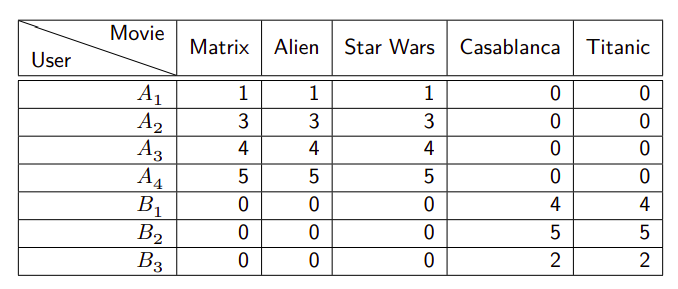




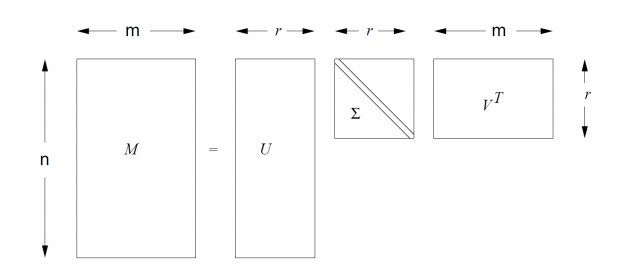

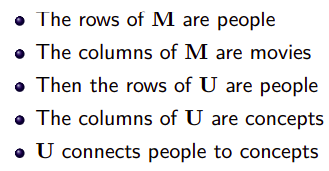

In [51]:
#Creating a sparse pivot table with users in rows and items in columns
users_items_pivot_matrix_df = ratings.pivot(index='userId', columns='movieId', values='rating').fillna(0)
users_items_pivot_matrix_df.head(10)

movieId,1,2,3,4,5,6,7,8,9,10,...,193565,193567,193571,193573,193579,193581,193583,193585,193587,193609
userId,,,,,,,,,,,,,,,,,,,,,
1,4.0,0.0,4.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,4.0,5.0,3.0,5.0,4.0,4.0,3.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,4.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [52]:
users_items_pivot_matrix = users_items_pivot_matrix_df.values
users_items_pivot_matrix

array([[4. , 0. , 4. , ..., 0. , 0. , 0. ],
       [0. , 0. , 0. , ..., 0. , 0. , 0. ],
       [0. , 0. , 0. , ..., 0. , 0. , 0. ],
       ...,
       [2.5, 2. , 2. , ..., 0. , 0. , 0. ],
       [3. , 0. , 0. , ..., 0. , 0. , 0. ],
       [5. , 0. , 0. , ..., 0. , 0. , 0. ]])

In [53]:
from scipy.sparse.linalg import svds

#The number of factors to factor the user-item matrix.
NUMBER_OF_FACTORS_MF = 15
#Performs matrix factorization of the original user item matrix
#U, sigma, Vt = svds(users_items_pivot_matrix, k = NUMBER_OF_FACTORS_MF)
U, sigma, Vt = svds(users_items_pivot_matrix, k = NUMBER_OF_FACTORS_MF)

In [54]:
U.shape

(610, 15)

In [55]:
Vt.shape

(15, 9724)

In [56]:
sigma = np.diag(sigma)
sigma.shape

(15, 15)

The resulting matrix is not sparse any more. It was generated predictions for items the user have not yet interaction, which we will exploit for recommendations:

In [57]:
all_user_predicted_ratings = np.dot(np.dot(U, sigma), Vt) 
all_user_predicted_ratings

array([[ 2.48313562e+00,  1.35885909e+00,  1.10637440e+00, ...,
        -3.49319264e-03, -3.49319264e-03, -2.47602496e-02],
       [ 4.22544294e-02,  1.03805400e-02,  3.20579362e-02, ...,
         9.95659214e-03,  9.95659214e-03,  1.31613972e-02],
       [ 1.38016774e-02,  2.86395855e-02,  3.19043736e-02, ...,
         9.42462913e-04,  9.42462913e-04, -1.75137511e-03],
       ...,
       [ 2.17103278e+00,  1.92389820e+00,  1.71015130e+00, ...,
        -5.55603096e-02, -5.55603096e-02, -9.01278061e-03],
       [ 8.38486877e-01,  6.37344297e-01,  3.19950208e-01, ...,
         4.27295325e-04,  4.27295325e-04,  1.65256080e-03],
       [ 5.86830717e+00, -1.00804430e-01, -1.49624909e+00, ...,
         2.66883644e-02,  2.66883644e-02,  8.02635842e-02]])

In [58]:
#Converting the reconstructed matrix back to a Pandas dataframe
preds_df = pd.DataFrame(all_user_predicted_ratings, columns=users_items_pivot_matrix_df.columns, index=users_items_pivot_matrix_df.index)

In [59]:
preds_df.head(10)

movieId,1,2,3,4,5,6,7,8,9,10,...,193565,193567,193571,193573,193579,193581,193583,193585,193587,193609
userId,,,,,,,,,,,,,,,,,,,,,
1,2.483136,1.358859,1.106374,-0.025920,0.174511,1.614364,0.167845,0.043874,0.206104,1.823636,...,-0.003493,-0.002994,-0.003992,-0.003992,-0.003493,-0.003992,-0.003493,-0.003493,-0.003493,-0.024760
2,0.042254,0.010381,0.032058,0.002357,0.030592,-0.001568,0.013115,0.000889,0.019802,-0.139452,...,0.009957,0.008534,0.011379,0.011379,0.009957,0.011379,0.009957,0.009957,0.009957,0.013161
3,0.013802,0.028640,0.031904,-0.002689,-0.022141,0.064227,0.000262,0.009224,0.012006,0.038832,...,0.000942,0.000808,0.001077,0.001077,0.000942,0.001077,0.000942,0.000942,0.000942,-0.001751
4,2.082146,0.162685,0.102233,0.053761,0.146481,0.454800,0.304220,-0.061288,-0.030823,-0.003292,...,-0.003688,-0.003162,-0.004215,-0.004215,-0.003688,-0.004215,-0.003688,-0.003688,-0.003688,-0.014209
5,1.383537,0.957738,0.406646,0.129537,0.536569,0.756295,0.610276,0.130696,0.103396,1.163210,...,-0.000702,-0.000602,-0.000802,-0.000802,-0.000702,-0.000802,-0.000702,-0.000702,-0.000702,0.000739
6,3.083983,3.400135,1.883538,0.405848,1.867406,2.189975,2.306211,0.605855,0.471779,3.916900,...,0.005509,0.004722,0.006296,0.006296,0.005509,0.006296,0.005509,0.005509,0.005509,-0.011051
7,1.995476,0.789781,-0.082301,-0.031872,0.097296,0.860021,0.001919,-0.084484,-0.036732,1.176269,...,-0.010775,-0.009236,-0.012314,-0.012314,-0.010775,-0.012314,-0.010775,-0.010775,-0.010775,0.005820
8,1.672878,1.220942,0.575672,0.163430,0.705200,1.024762,0.788211,0.164804,0.153066,1.603970,...,-0.001049,-0.000899,-0.001199,-0.001199,-0.001049,-0.001199,-0.001049,-0.001049,-0.001049,0.002347
9,0.366844,0.042292,-0.025592,-0.011815,-0.004028,-0.002142,-0.044961,-0.022251,-0.020231,0.078649,...,-0.000115,-0.000099,-0.000131,-0.000131,-0.000115,-0.000131,-0.000115,-0.000115,-0.000115,0.002419


In [60]:
preds_df = preds_df.apply(lambda x: normalize(x, all_user_predicted_ratings.max(), all_user_predicted_ratings.min()))
preds_df.head(10)

movieId,1,2,3,4,5,6,7,8,9,10,...,193565,193567,193571,193573,193579,193581,193583,193585,193587,193609
userId,,,,,,,,,,,,,,,,,,,,,
1,2.609299,2.202104,2.110658,1.700559,1.773152,2.294644,1.770737,1.725837,1.784594,2.370439,...,1.708681,1.708862,1.708501,1.708501,1.708681,1.708501,1.708681,1.708681,1.708681,1.700979
2,1.725250,1.713706,1.721557,1.710800,1.721026,1.709379,1.714697,1.710269,1.717119,1.659439,...,1.713553,1.713037,1.714068,1.714068,1.713553,1.714068,1.713553,1.713553,1.713553,1.714713
3,1.714945,1.720319,1.721502,1.708972,1.701928,1.733209,1.710041,1.713287,1.714295,1.724011,...,1.710288,1.710239,1.710337,1.710337,1.710288,1.710337,1.710288,1.710288,1.710288,1.709312
4,2.464067,1.768868,1.746974,1.729418,1.762999,1.874668,1.820130,1.687749,1.698783,1.708754,...,1.708611,1.708801,1.708420,1.708420,1.708611,1.708420,1.708611,1.708611,1.708611,1.704800
5,2.211042,2.056824,1.857227,1.756863,1.904283,1.983865,1.930979,1.757283,1.747395,2.131243,...,1.709692,1.709729,1.709656,1.709656,1.709692,1.709656,1.709692,1.709692,1.709692,1.710214
6,2.826916,2.941421,2.392134,1.856938,2.386292,2.503121,2.545220,1.929377,1.880817,3.128586,...,1.711942,1.711657,1.712227,1.712227,1.711942,1.712227,1.711942,1.711942,1.711942,1.705944
7,2.432676,1.995993,1.680139,1.698403,1.745186,2.021433,1.710641,1.679348,1.696643,2.135973,...,1.706044,1.706602,1.705487,1.705487,1.706044,1.705487,1.706044,1.706044,1.706044,1.712054
8,2.315837,2.152152,1.918446,1.769138,1.965359,2.081099,1.995424,1.769636,1.765385,2.290879,...,1.709567,1.709621,1.709512,1.709512,1.709567,1.709512,1.709567,1.709567,1.709567,1.710797
9,1.842812,1.725264,1.700677,1.705667,1.708488,1.709171,1.693663,1.701888,1.702619,1.738432,...,1.709905,1.709911,1.709899,1.709899,1.709905,1.709899,1.709905,1.709905,1.709905,1.710823


In [61]:
class CFRecommender:
    
    MODEL_NAME = 'Collaborative Filtering'
    
    def __init__(self, predictions_df):
        self.predictions_df = predictions_df
        
    def get_model_name(self):
        return self.MODEL_NAME

    def recommend_items(self, user_id, items_to_ignore=[], topn=10, verbose=False):
        # Get and sort the user's predictions
        sorted_user_predictions = self.predictions_df.loc[user_id].sort_values(ascending=False)
        recommendations = {'movieId': sorted_user_predictions.index, 'predicted_rating': sorted_user_predictions.values}
        recommendations_df = pd.DataFrame(recommendations)
        # Recommend the highest predicted rating movies that the user hasn't seen yet.
        recommendations_df = recommendations_df[~recommendations_df['movieId'].isin(items_to_ignore)] \
                               .sort_values('predicted_rating', ascending = False) \
                               .head(topn)

        return recommendations_df
    
cf_recommender_model = CFRecommender(preds_df)

In [62]:
model_evaluator = ModelEvaluator(training_data, testing_data, 2.5)              

print('Evaluating Collaborative Filtering (SVD Matrix Factorization) model...')
cf_global_metrics, cf_detailed_results_df = model_evaluator.evaluate_model(cf_recommender_model)
print('\nGlobal metrics:\n%s' % cf_global_metrics)
cf_detailed_results_df.head(10)

Evaluating Collaborative Filtering (SVD Matrix Factorization) model...
571 users processed

Global metrics:
{'modelName': 'Collaborative Filtering', 'recall@5': 0.5736607142857143, 'recall@10': 1.0, 'precision@5': 0.19876256767208042, 'precision@10': 0.20134831460674157}


,hits@5_count,hits@10_count,recommended@5_count,recommended@10_count,relevents,recall@5,recall@10,precision@5,precision@10,user_id
571,5,10,5,10,10,0.500000,1.0,1.0,1.0,610
443,5,10,5,10,10,0.500000,1.0,1.0,1.0,474
234,5,10,5,10,10,0.500000,1.0,1.0,1.0,249
390,5,10,5,10,10,0.500000,1.0,1.0,1.0,414
102,5,9,5,10,9,0.555556,1.0,1.0,0.9,105
541,5,7,5,10,7,0.714286,1.0,1.0,0.7,580
420,5,7,5,10,7,0.714286,1.0,1.0,0.7,448
297,5,9,5,10,9,0.555556,1.0,1.0,0.9,318
173,5,5,5,10,5,1.000000,1.0,1.0,0.5,182
567,5,10,5,10,10,0.500000,1.0,1.0,1.0,606


# Hybrid Recommender Model
we can combine Collaborative Filtering and Content-Based Filtering approaches.

Would that provide us with more accurate recommendations?
In fact, hybrid methods have performed better than individual approaches in many studies and have being extensively used by researchers and practioners.

Write a class for hybrid recommender that combine the two methods above:

In [63]:
####################################
#############YOUR CODE##############
####################################

Sources:

https://www.kaggle.com/code/gspmoreira/recommender-systems-in-python-101/notebook?fbclid=IwAR2UCIZCYaLu2KawyDJgrVXk3ofauvfTcpAU4xKQ6tSjZifSNOHnSFF6oqM#Recommender-Systems-in-Python-101

https://github.com/rposhala/Recommender-System-on-MovieLens-dataset/blob/main/Recommender_System_using_Softmax_DNN.ipynb

https://towardsdatascience.com/modern-recommendation-systems-with-neural-networks-3cc06a6ded2c

https://www.datacamp.com/tutorial/recommender-systems-python

https://chaitanyabelhekar.medium.com/recommender-system-metrics-clearly-explained-1f2ba6690216

https://www.analyticsvidhya.com/blog/2021/08/developing-a-course-recommender-system-using-python/